In [3]:
#since noteboke doesn't work in jupiterlabs    %matplotlib notebook 
%matplotlib notebook
%load_ext autoreload
%autoreload 2

In [4]:
import os
os.chdir('D:\\6OHDA\\')
#import mpld3
#mpld3.enable_notebook()
import numpy as np
import scipy as sci
from scipy import signal
from matplotlib import pyplot as plt
from matplotlib import gridspec
import matplotlib.colors as Mcolors
import matplotlib.cm as cmx
import sys
import h5py
from IO import *
from utils import *
from plotUtils import *
from ColorSchems import colorPallet as CP
import pptx
from pptx import Presentation 
from pptx.util import Inches
from io import BytesIO
import re
import warnings
import pandas as pd
import sqlalchemy as db
import gc
from tqdm import tqdm
import seaborn as sns
import pywt # wavelet package
import matplotlib.cm as cm
import statsmodels.api as sm

In [5]:
Files = ['FinalData_6OHDA.h5','FinalData_6OHDA_H.h5','FinalData_6OHDA_H_skip.h5','FinalData_6OHDA_skip.h5']
miceList = getMiceList(Files[0])

In [6]:
#path to folder where figures should be saved
figFolder = 'D:\\6OHDA\\extraAnalysis\\'

In [7]:
def periodCalc(day):
    if day== 0:
        return 'Healthy'
    elif day<13:
        return 'Acute'
    else:
        return 'Chronic'

<IPython.core.display.Javascript object>


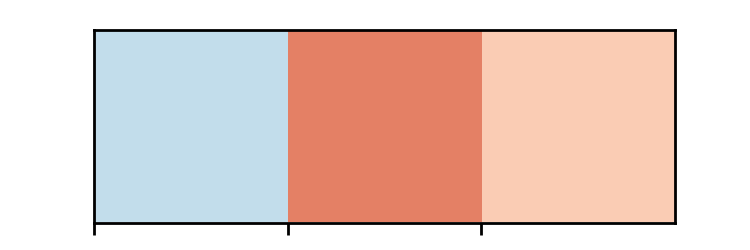

<IPython.core.display.Javascript object>


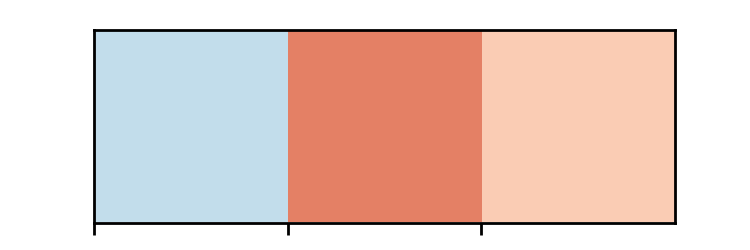

In [8]:
a3 = np.array(sns.color_palette("RdBu_r", n_colors=7))
# a3 = np.concatenate((a3[2,:],a3[4:,:]))
colorPallet3Post =(a3[[2,5,4],:])
sns.palplot(sns.color_palette(colorPallet3Post)) 

colorPallet3 =(a3[[2,5,4],:])
sns.palplot(sns.color_palette(colorPallet3))

In [328]:
Pdf = pd.read_csv('D:\\6OHDA\\submission1\\bySessCompareCorr2Sig2.csv')
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess',"percent_low":'lowRot'})
df['highRot'] = df.apply(lambda x: (x.percent_high_C+x.percent_high_AC), axis=1)
df2 = pd.merge(Pdf,df[['Sess','Period','percent_high_C','percent_high_AC','lowRot','highRot']],on=['Sess','Period'])
df = pd.read_csv('D:\\6OHDA\\submission2\\speedData.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess',"percent_high":'highSpeed',"percent_low":"lowSpeed"})
df2 = pd.merge(df2,df[['Sess','Period','highSpeed','lowSpeed']],on=['Sess','Period'])
df2

,Unnamed: 0,Day,Mouse,Period,Sess,aSymCorr,aSymCorrNotSig,aSymCorrSig,numred,personF,population,sASymCorr,sPersonF,sigPercent,percent_high_C,percent_high_AC,lowRot,highRot,highSpeed,lowSpeed
0,0,0,761,Healthy,0761_BaselineA,0.016887,0.003606,0.149698,1,NaN,MSN-CHI,-0.000093,NaN,0.090909,0.115976,0.042104,0.657534,0.158081,0.053534,0.797294
1,0,0,761,Healthy,0761_BaselineA,0.021118,0.000154,0.164875,1,NaN,MSN-MSN,-0.000166,NaN,0.127273,0.115976,0.042104,0.657534,0.158081,0.053534,0.797294
2,0,0,761,Healthy,0761_BaselineL,0.069546,0.006671,0.207870,1,NaN,MSN-CHI,-0.000635,NaN,0.312500,0.178418,0.030759,0.635936,0.209177,0.097235,0.725523
3,0,0,761,Healthy,0761_BaselineL,0.056678,0.007323,0.218843,1,NaN,MSN-MSN,-0.000036,NaN,0.233333,0.178418,0.030759,0.635936,0.209177,0.097235,0.725523
4,0,0,761,Healthy,0761_BaselineS,0.048253,0.011056,0.154531,1,NaN,MSN-CHI,-0.000287,NaN,0.259259,0.178839,0.067233,0.470628,0.246071,0.114800,0.584839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
417,0,6,8815,Acute,8815_day6,NaN,NaN,NaN,4,NaN,MSN-CHI,NaN,NaN,NaN,0.080138,0.000000,0.758369,0.080138,0.240415,0.736301
418,0,6,8815,Acute,8815_day6,0.081291,-0.003170,0.376904,4,NaN,MSN-MSN,0.000054,NaN,0.222222,0.080138,0.000000,0.758369,0.080138,0.240415,0.736301
419,0,8,8815,Acute,8815_day8,NaN,NaN,NaN,3,NaN,CHI-CHI,NaN,NaN,NaN,0.067815,0.043866,0.514286,0.111681,0.387143,0.509664
420,0,8,8815,Acute,8815_day8,0.090898,-0.000171,0.195824,3,NaN,MSN-CHI,0.000011,NaN,0.464646,0.067815,0.043866,0.514286,0.111681,0.387143,0.509664


----------------------------------------------------------------
highRot (-0.27770577311152783, 4.680522880252526e-05) 0.07712049641947127 0.07266214132971027
Healthy :
highRot (-0.5795174354575023, 1.5885469933674983e-05) 0.3358404579992402 0.32140220708618017
Acute :
highRot (-0.22420541867643592, 0.025683302131500618) 0.0502680697638761 0.04047701893669964
Chronic :
highRot (-0.17895057908384343, 0.16402999085893752) 0.03202330975444323 0.01589036491701734
----------------------------------------------------------------
lowRot (0.2937369640383076, 1.584178588816447e-05) 0.086281404042442 0.08186730454506252
Healthy :
lowRot (0.5928643237940394, 8.994496324641136e-06) 0.3514881064277635 0.33739002178488875
Acute :
lowRot (0.19412663610430192, 0.05418394320277342) 0.03768515084517199 0.027764379204400558
Chronic :
lowRot (0.27746988403448636, 0.029005940976640814) 0.07698953654611107 0.0616060288218796
----------------------------------------------------------------
highSpeed (-0.2696

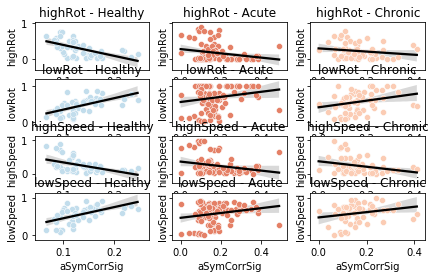

In [169]:
%matplotlib inline
col = 'aSymCorrSig'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(4,3,figsize=(7,4),sharey='row')
for indp,col2 in enumerate(['highRot','lowRot','highSpeed','lowSpeed']):
    df3 = df2[df2.population == 'MSN-MSN']
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
#     sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
#     sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
#     ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for iPer,per in enumerate(df3.Period.unique()):
        sns.regplot(x=col,y=col2,data = df3[df3.Period == per],color='k',marker=".",ax=ax[indp,iPer])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer])
        ax[indp,iPer].set_title(col2 + ' - '+per)
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
fig.savefig(figFolder+'new4D.svg',transparent=True)

In [234]:
sns.boxplot.__code__.co_varnames

('args', 'kwargs', 'extra_args', 'plural', 'article')

----------------------------------------------------------------
MSN-MSN (0.29373696403830757, 1.584178588816447e-05) 0.086281404042442 0.08186730454506252
Acute :  MannwhitneyuResult(statistic=519.0, pvalue=0.0008089893943949867)
Chronic :  MannwhitneyuResult(statistic=213.5, pvalue=0.008333914888231283)
----------------------------------------------------------------
MSN-CHI (0.4254638993618514, 0.005551017795134924) 0.18101952966019175 0.16002003042070956
Acute :  MannwhitneyuResult(statistic=8.0, pvalue=0.22234811592485448)
Chronic :  MannwhitneyuResult(statistic=1.0, pvalue=0.1481349357421432)
----------------------------------------------------------------
MSN-PV (0.14719087660978214, 0.27456449273493544) 0.021665154157155864 0.003877247869104261
Acute :  MannwhitneyuResult(statistic=49.0, pvalue=0.19662237238550995)
Chronic :  MannwhitneyuResult(statistic=0.5, pvalue=0.09580055337629667)


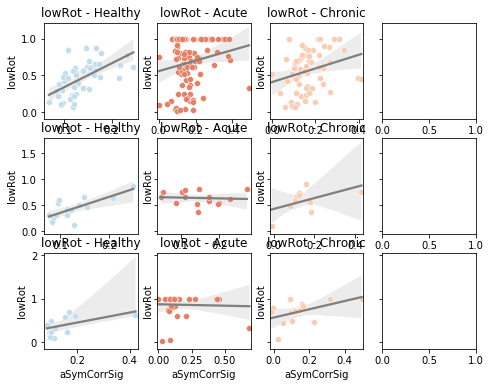

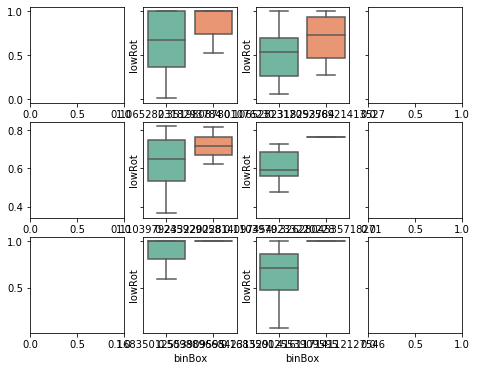

In [310]:
%matplotlib inline
col = 'aSymCorrSig'
col2  = 'lowRot'#'percent_high_AC'
colors = a3[[2,5,4],:]
fig, ax = plt.subplots(3,4,figsize=(7.74,6),sharey='row')
fig2, ax2 = plt.subplots(3,4,figsize=(7.74,6),sharey='row')
for indp,p in enumerate(['MSN-MSN','MSN-CHI','MSN-PV']):
    df3 = df2[(df2.population==p)]#&(df2.cre.isin(['PV','CHI']))]
#     df3['acorr'] = df3.aplly(lambda )
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
#     sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
#     sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp,0].set_title(p+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    df4 = df3[df3.Period == 'Healthy'][[col,col2]].dropna()
    Hrange = np.mean(df4[col])+2*np.std(df4[col])
#     print(Hrange)
    for iPer,per in enumerate(df3.Period.unique()):
        if per != 'Healthy':
            df4 = df3[(df3.Period == per)][[col,col2]].dropna()
            df4['binBox'] = pd.cut(df4[col],[0,Hrange,np.max(df4[col])+0.001],labels=[np.mean([0,Hrange]),np.mean([np.max(df4[col]),Hrange])])
#             ax2[indp,iPer].boxplot([df4[(df4['binBox'] == np.mean([0,Hrange]))][col2],df4[(df4['binBox'] != np.mean([0,Hrange]))][col2]],
#                                   positions =[np.mean([0,Hrange]),np.mean([np.max(df4[col]),Hrange])],showfliers = False) 
            sns.boxplot(data = df4, x = 'binBox', y = col2,ax = ax2[indp,iPer],showfliers = False, palette = sns.color_palette("Set2"))
            print(per,': ',sci.stats.mannwhitneyu(df4[(df4['binBox'] == np.mean([0,Hrange]))][col2],df4[(df4['binBox'] != np.mean([0,Hrange]))][col2]))
        sns.regplot(x=col,y=col2,data = df3[(df3.Period == per)],color='gray',marker=".",ax=ax[indp,iPer])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer],)
        ax[indp,iPer].set_title(col2 + ' - '+per)
        ax[indp,iPer].set_xlim([np.min(df4[col])-0.01,np.max(df4[col])+0.01])
#         ax2[indp,iPer].set_ylim([-0.01,1.1])

# fig.savefig(figFolder+'S10.svg',transparent=True)

----------------------------------------------------------------
highRot (-0.2777057731115278, 4.680522880252526e-05) 0.07712049641947138 0.07266214132971038
Acute :  MannwhitneyuResult(statistic=510.0, pvalue=0.0004996746398837798)
Chronic :  MannwhitneyuResult(statistic=265.0, pvalue=0.06059495872013448)
----------------------------------------------------------------
lowRot (0.29373696403830757, 1.584178588816447e-05) 0.086281404042442 0.08186730454506252
Acute :  MannwhitneyuResult(statistic=519.0, pvalue=0.0008089893943949867)
Chronic :  MannwhitneyuResult(statistic=213.5, pvalue=0.008333914888231283)
----------------------------------------------------------------
highSpeed (-0.26966545605726655, 7.863408681155859e-05) 0.07271945819057368 0.06823984204656675
Acute :  MannwhitneyuResult(statistic=533.0, pvalue=0.0012520686660375824)
Chronic :  MannwhitneyuResult(statistic=227.0, pvalue=0.01491188281560383)
----------------------------------------------------------------
lowSpeed (

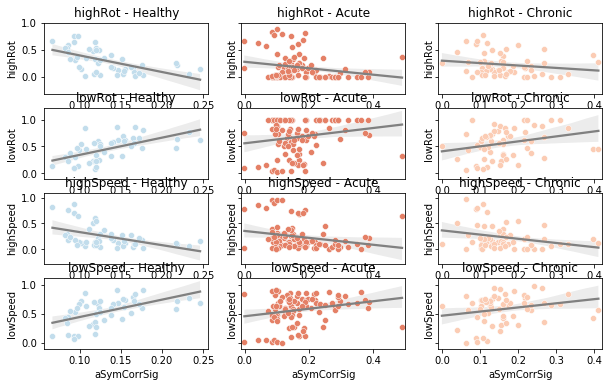

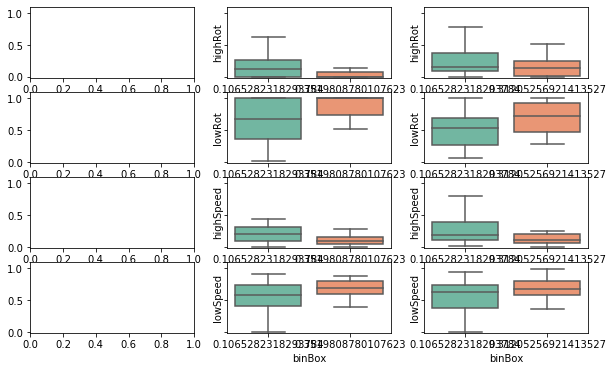

In [285]:
# box plot submittion 2
%matplotlib inline
col = 'aSymCorrSig'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(4,3,figsize=(10,6),sharey='row')
fig2, ax2 = plt.subplots(4,3,figsize=(10,6),sharey='row')
for indp,col2 in enumerate(['highRot','lowRot','highSpeed','lowSpeed']):
    df3 = df2[df2.population == 'MSN-MSN']
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
#     sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
#     sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
#     ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    df4 = df3[df3.Period == 'Healthy'][[col,col2]].dropna()
    Hrange = np.mean(df4[col])+2*np.std(df4[col])
    for iPer,per in enumerate(df3.Period.unique()):
        if per != 'Healthy':
            df4 = df3[(df3.Period == per)][[col,col2]].dropna()
            df4['binBox'] = pd.cut(df4[col],[0,Hrange,np.max(df4[col])+0.001],labels=[np.mean([0,Hrange]),np.mean([np.max(df4[col]),Hrange])])
#             ax2[indp,iPer].boxplot([df4[(df4['binBox'] == np.mean([0,Hrange]))][col2],df4[(df4['binBox'] != np.mean([0,Hrange]))][col2]],
#                                   positions =[np.mean([0,Hrange]),np.mean([np.max(df4[col]),Hrange])],showfliers = False) 
            sns.boxplot(data = df4, x = 'binBox', y = col2,ax = ax2[indp,iPer],showfliers = False, palette = sns.color_palette("Set2"))
            print(per,': ',sci.stats.mannwhitneyu(df4[(df4['binBox'] == np.mean([0,Hrange]))][col2],df4[(df4['binBox'] != np.mean([0,Hrange]))][col2]))
        sns.regplot(x=col,y=col2,data = df3[(df3.Period == per)],color='gray',marker=".",ax=ax[indp,iPer])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer],)
        ax[indp,iPer].set_title(col2 + ' - '+per)
        ax[indp,iPer].set_xlim([np.min(df4[col])-0.01,np.max(df4[col])+0.01])
        ax2[indp,iPer].set_ylim([-0.01,1.1])
#         df4['Intercept']=1
#         model = sm.OLS(df4[col2], df4[['Intercept',col]])
#         model_results = model.fit()
#         b = model_results.params
#         a =np.sum(b*df4[['Intercept',col]],axis=1)
#         print(per,':')
#         print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
# fig.savefig(figFolder+'newS10A_seperate1.svg',transparent=True)
fig2.savefig(figFolder+'newS10A_seperate.svg',transparent=True)

In [442]:
# col = 'aSymCorrSig'
# col2 = 'lowRot'
# df3 = df2[df2.population == 'MSN-MSN']
# df4 = df3[df3.Period == 'Healthy'][[col,col2]].dropna()
# Hrange = np.mean(df4[col])+2*np.std(df4[col])
# df4 = df3[(df3.Period == per)][[col,col2]].dropna()
# df4['binBox'] = pd.cut(df4[col],[0,Hrange,np.max(df4[col])+0.001],labels=['Healthy','pathalogical'])
# df4.groupby('binBox').describe().loc['Healthy']#[col].loc['75%']#[col]          
# HIQR = df4.groupby('binBox').describe().loc['Healthy'][col].loc['75%']-df4.groupby('binBox').describe().loc['Healthy'][col].loc['25%']
# print(df4.groupby('binBox').describe().loc['Healthy'][col2].loc['25%'],df4.groupby('binBox').describe().loc['Healthy'][col2].loc['25%']-HIQR*1.5,HIQR*1.5)
# df5 = df4.groupby('binBox').describe()
# Q1 = df5.loc['Healthy'][col2].loc['25%']
# Q3 = df5.loc['Healthy'][col2].loc['75%']
# IQR = Q3-Q1
# Hrange = np.mean(df4[col])+2*np.std(df4[col])
# df4 = df3
# df4['binBox'] = pd.cut(df4[col],[0,Hrange,np.max(df4[col])+0.001],labels=['Healthy','pathalogical'])
# df5 = df4.groupby(['binBox']).describe()
df4 = df3[df3.Period != 'Healthy'][[col,col2]].dropna()
# df4['binBox'] = pd.cut(df4[col],[0,Hrange,np.max(df4[col])+0.001],labels=['Healthy','pathalogical'])
df4.describe()

,aSymCorrSig,lowSpeed
count,161.000000,161.000000
mean,0.167945,0.574166
std,0.084512,0.243870
min,-0.000787,0.005547
25%,0.106519,0.450672
50%,0.148993,0.634843
75%,0.214213,0.745882
max,0.490905,0.982099


<IPython.core.display.Javascript object>


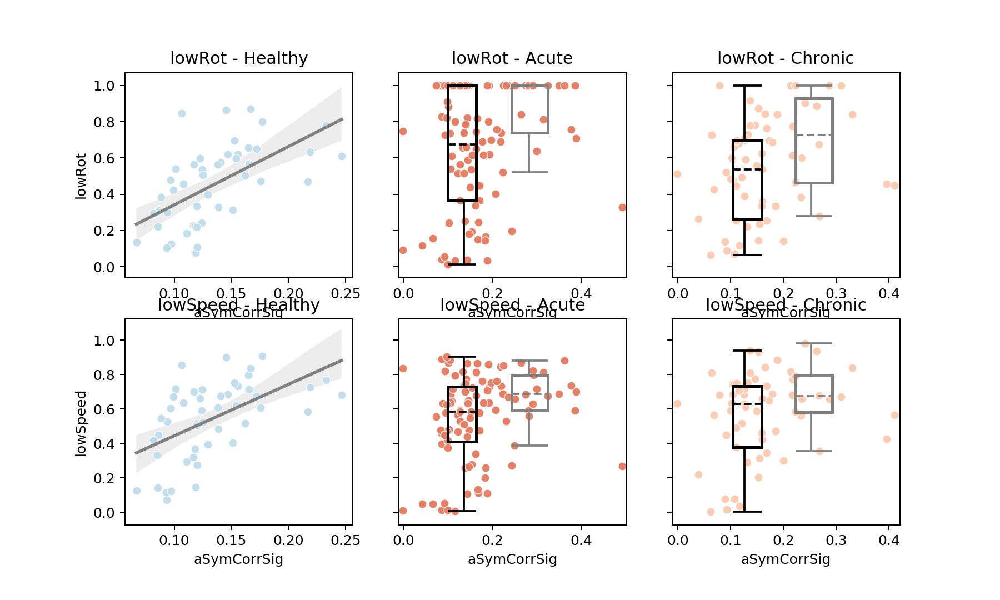

----------------------------------------------------------------
lowRot (0.29373696403830757, 1.584178588816447e-05) 0.086281404042442 0.08186730454506252
lowRot 0.13271171072384744 0.04017237646745469
Healthy Acute 72.0
Pathalogical Acute 25.0
Healthy Chronic 45.0
Pathalogical Chronic 16.0
----------------------------------------------------------------
lowSpeed (0.2650423718157472, 0.00010519697156652465) 0.07024745885771688 0.06575590068794734
lowSpeed 0.13271171072384744 0.04017237646745469
Healthy Acute 72.0
Pathalogical Acute 25.0
Healthy Chronic 45.0
Pathalogical Chronic 16.0


In [444]:
# box plot submittion 2
%matplotlib notebook
from matplotlib.patches import Rectangle
col = 'aSymCorrSig'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(2,3,figsize=(10,6),sharey='row')
for indp,col2 in enumerate(['lowRot','lowSpeed']):
    df3 = df2[df2.population == 'MSN-MSN']
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
#     sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
#     sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
#     ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    df4 = df3[df3.Period == 'Healthy'][[col,col2]].dropna()
    Hrange = np.mean(df4[col])+2*np.std(df4[col])
    print(col2, np.mean(df4[col]),np.std(df4[col]))
    for iPer,per in enumerate(df3.Period.unique()):
        if per != 'Healthy':
            df4 = df3[(df3.Period == per)][[col,col2]].dropna()
            df4['binBox'] = pd.cut(df4[col],[0,Hrange,np.max(df4[col])+0.001],labels=['Healthy','Pathalogical'])
            df5 = df4.groupby('binBox').describe()
            for b in ['Healthy','Pathalogical']:
                if b == 'Healthy':
                    color = 'k'
                else:
                    color = 'grey'  
                print(b,per,df5.loc[b][col].loc['count'])
                Q1_1 = df5.loc[b][col].loc['25%']
                Q3_1 = df5.loc[b][col].loc['75%']
                IQR_1 = Q3_1-Q1_1
                Q1_2 = df5.loc[b][col2].loc['25%']
                Q3_2 = df5.loc[b][col2].loc['75%']
                IQR_2 = Q3_2-Q1_2
        
                ax[indp,iPer].add_patch(Rectangle((Q1_1,Q1_2),IQR_1,IQR_2,facecolor="none", ec=color, lw=2))
                ax[indp,iPer].hlines(df5.loc[b][col2].loc['50%'],Q1_1,Q3_1,color=color,linestyles='dashed')
                
                no_outliers = df4[df4.binBox==b][col2][(Q1_2 - 1.5*IQR_2 < df4[df4.binBox==b][col2]) &  (df4[df4.binBox==b][col2] < Q3_2 + 1.5*IQR_2)]
                ax[indp,iPer].vlines(df5.loc[b][col].loc['50%'],np.min(no_outliers),Q1_2,color=color)
                ax[indp,iPer].vlines(df5.loc[b][col].loc['50%'],Q3_2,np.max(no_outliers),color=color)
                ax[indp,iPer].hlines(np.min(no_outliers),Q1_1,Q3_1,color=color) 
                ax[indp,iPer].hlines(np.max(no_outliers),Q1_1,Q3_1,color=color) 
                
                no_outliers = df4[df4.binBox==b][col][(Q1_1 - 1.5*IQR_1 < df4[df4.binBox==b][col]) &  (df4[df4.binBox==b][col] < Q3_1 + 1.5*IQR_1)]
                ax[indp,iPer].vlines(df5.loc[b][col2].loc['50%'],Q1_1,Q3_1,color=color,linestyles='dashed')

                #                 ax[indp,iPer].hlines(df5.loc[b][col2].loc['50%'],np.min(no_outliers),np.max(no_outliers),color=color,linestyles='dashed')
#                 ax[indp,iPer].hlines(df5.loc[b][col2].loc['50%'],np.min(no_outliers),Q1_1,color=color)
#                 ax[indp,iPer].hlines(df5.loc[b][col2].loc['50%'],Q3_1,np.max(no_outliers),color=color)
#                 ax[indp,iPer].vlines(np.min(no_outliers),Q1_2,Q3_2,color=color) 
#                 ax[indp,iPer].vlines(np.max(no_outliers),Q1_2,Q3_2,color=color) 
                                                    
        else: 
            sns.regplot(x=col,y=col2,data = df3[(df3.Period == per)],color='gray',marker=".",ax=ax[indp,iPer])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer])
        ax[indp,iPer].set_title(col2 + ' - '+per)
        ax[indp,iPer].set_xlim([np.min(df4[col])-0.01,np.max(df4[col])+0.01])
        ax[indp,iPer].errorbar
#         df4['Intercept']=1
#         model = sm.OLS(df4[col2], df4[['Intercept',col]])
#         model_results = model.fit()
#         b = model_results.params
#         a =np.sum(b*df4[['Intercept',col]],axis=1)
#         print(per,':')
#         print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
# fig.savefig(figFolder+'new4E.svg',transparent=True)

In [ ]:
        ax[indp,iPer].add_patch(Rectangle((df4.groupby('binBox').describe().loc['Pathalogical'][col].loc['25%'],
                                               df4.groupby('binBox').describe().loc['Pathalogical'][col2].loc['25%'] ),
                                              df4.groupby('binBox').describe().loc['Pathalogical'][col].loc['75%']-df4.groupby('binBox').describe().loc['Pathalogical'][col].loc['25%'],
                                              df4.groupby('binBox').describe().loc['Pathalogical'][col2].loc['75%']-df4.groupby('binBox').describe().loc['Pathalogical'][col2].loc['25%'], facecolor="none", ec='r', lw=2))
    

In [131]:
dfc = pd.read_csv(figFolder+'firingRateDiff.csv')
dfC['care'] = dfC.apply(lambda x: (x.diff_speed>x.s97_5)or(x.diff_speed<x.s2_5),axis=1)
# only run once... Also, only Asymm 
f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','population','aSymCorr','sASymCorr']
df3 = pd.DataFrame(columns = ['Mouse','Sess','Day','numred','Period','population','mvmt','values'])
df = pd.DataFrame(columns = col_names)
for m in tqdm(f.keys()):
    for sess in f[m].keys():
        try:
            numred = f[m][sess].attrs['numRed']
            cre = getCreType(Files[1],m)
            tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
                                'numred':numred,'Period':periodCalc(f[m][sess].attrs['day'])}

            Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf') 
            eventRate = np.sum(Ca,axis=1)

            c = f[m][sess]['Pre']['pearson'][:]
            c = c[eventRate>0,:][:,eventRate>0]
            c[(np.tril(np.ones(c.shape),-1))==0] = np.nan

            d = f[m][sess]['Pre'][('pearson_shuffle')][:]
            d = d[eventRate>0,:,:][:,eventRate>0,:]
            b = np.nanpercentile(d,[97.5,2.5],axis=2)

            d = np.nanmean(d,axis=2)
            d[np.tril(np.ones(d.shape),-1)==0] = np.nan

            nSig = (c>b[0,:,:])|(c<b[1,:,:])
            cSig = np.copy(c)
            cSig[~nSig] = np.nan

            care = (dfC[dfC.Sess==sess].care.values == 1)
            cSigCare = cSig[care,:][:,care]
            cSigNotCare = cSig[~care,:][:,~care]
                
                
            if numred > 1:
                tempDict['population'] = cre+'-'+cre
                tempDict['corrCare'] = np.nanmean(cSigCare[:numred,:numred])
                tempDict['corrNotCare'] = np.nanmean(cSigNotCare[:numred,:numred])
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
            if numred > 0:
                tempDict['population'] = 'MSN-'+cre
                tempDict['corrCare'] = np.nanmean(cSigCare[numred:,:numred])
                tempDict['corrNotCare'] = np.nanmean(cSigNotCare[numred:,:numred])
                  
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
#                 hi,bi = np.histogram(c[numred:,:numred],np.arange(-1,1,0.01))
#                 hi2,bi2 = np.histogram(cSig[numred:,:numred],np.arange(-1,1,0.01))
#                 df3 = df3.append({'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                                 'numred':numred,'Period':periodCalc(f[m][sess].attrs['day']),
#                                   'population':'MSN-'+cre,'mvmt':'all','values':hi,'values_sig':hi2},ignore_index=True)


            tempDict['population'] = 'MSN-MSN'
            tempDict['corrCare'] = np.nanmean(cSigCare[numred:,numred:])
            tempDict['corrNotCare'] = np.nanmean(cSigNotCare[numred:,numred:])
            
            df2 = pd.DataFrame([tempDict])
            df = pd.concat([df,df2],sort=True)
#             hi,bi = np.histogram(c[numred:,numred:],np.arange(-1,1,0.01))
#             hi2,bi2 = np.histogram(cSig[numred:,numred:],np.arange(-1,1,0.01))
#             df3 = df3.append({'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                             'numred':numred,'Period':periodCalc(f[m][sess].attrs['day']),
#                               'population':'MSN-MSN','mvmt':'all','values':hi,'values_sig':hi2},ignore_index=True)

        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,  exc_tb.tb_lineno,c.shape)
f.close()
df.to_csv(figFolder+'corr_careVsNoCare.csv')
# df3.to_csv(figFolder+'bySessCompareCorr2Sig_hists.csv')

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]<ipython-input-131-bf70dbf09fb1>:47: RuntimeWarning: Mean of empty slice
  tempDict['corrCare'] = np.nanmean(cSigCare[numred:,:numred])
<ipython-input-131-bf70dbf09fb1>:60: RuntimeWarning: Mean of empty slice
  tempDict['corrCare'] = np.nanmean(cSigCare[numred:,numred:])
<ipython-input-131-bf70dbf09fb1>:61: RuntimeWarning: Mean of empty slice
  tempDict['corrNotCare'] = np.nanmean(cSigNotCare[numred:,numred:])
<ipython-input-131-bf70dbf09fb1>:41: RuntimeWarning: Mean of empty slice
  tempDict['corrCare'] = np.nanmean(cSigCare[:numred,:numred])
<ipython-input-131-bf70dbf09fb1>:42: RuntimeWarning: Mean of empty slice
  tempDict['corrNotCare'] = np.nanmean(cSigNotCare[:numred,:numred])
  6%|█████▏                                                                             | 1/16 [00:00<00:05,  2.87it/s]

0761_day1 30 (0, 0)


 12%|██████████▍                                                                        | 2/16 [00:39<02:48, 12.01s/it]

1222_day2 19 (25, 25)


 75%|█████████████████████████████████████████████████████████████▌                    | 12/16 [06:50<04:43, 70.94s/it]<ipython-input-131-bf70dbf09fb1>:48: RuntimeWarning: Mean of empty slice
  tempDict['corrNotCare'] = np.nanmean(cSigNotCare[numred:,:numred])
100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [07:57<00:00, 29.84s/it]


In [187]:
Pdf = pd.read_csv('D:\\6OHDA\\submission1\\bySessCompareCorr2Sig2.csv')
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess',"percent_low":'lowRot'})
df['highRot'] = df.apply(lambda x: (x.percent_high_C+x.percent_high_AC), axis=1)
df2 = pd.merge(Pdf[['Sess','Period','population','aSymCorrSig']],df[['Sess','Period','percent_high_C','percent_high_AC','lowRot','highRot']],on=['Sess','Period'])
df = pd.read_csv('D:\\6OHDA\\submission2\\speedData.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess',"percent_high":'highSpeed',"percent_low":"lowSpeed"})
df2 = pd.merge(df2,df[['Sess','Period','highSpeed','lowSpeed']],on=['Sess','Period'])

Pdf = pd.read_csv(figFolder+'corr_careVsNoCare.csv')
df2 = pd.merge(df2,Pdf[['Sess','Period','population','corrCare','corrNotCare']],on=['Sess','Period','population'])
df2

,Sess,Period,population,aSymCorrSig,percent_high_C,percent_high_AC,lowRot,highRot,highSpeed,lowSpeed,corrCare,corrNotCare
0,0761_BaselineA,Healthy,MSN-CHI,0.149698,0.115976,0.042104,0.657534,0.158081,0.053534,0.797294,NaN,0.149698
1,0761_BaselineA,Healthy,MSN-MSN,0.164875,0.115976,0.042104,0.657534,0.158081,0.053534,0.797294,NaN,0.168995
2,0761_BaselineL,Healthy,MSN-CHI,0.207870,0.178418,0.030759,0.635936,0.209177,0.097235,0.725523,NaN,0.207870
3,0761_BaselineL,Healthy,MSN-MSN,0.218843,0.178418,0.030759,0.635936,0.209177,0.097235,0.725523,NaN,0.218843
4,0761_BaselineS,Healthy,MSN-CHI,0.154531,0.178839,0.067233,0.470628,0.246071,0.114800,0.584839,0.555219,0.128773
...,...,...,...,...,...,...,...,...,...,...,...,...
416,8815_day6,Acute,MSN-CHI,NaN,0.080138,0.000000,0.758369,0.080138,0.240415,0.736301,NaN,0.468274
417,8815_day6,Acute,MSN-MSN,0.376904,0.080138,0.000000,0.758369,0.080138,0.240415,0.736301,NaN,0.402616
418,8815_day8,Acute,CHI-CHI,NaN,0.067815,0.043866,0.514286,0.111681,0.387143,0.509664,-0.007571,0.159514
419,8815_day8,Acute,MSN-CHI,0.195824,0.067815,0.043866,0.514286,0.111681,0.387143,0.509664,0.135239,0.184554


In [191]:
df3

,Sess,Period,population,aSymCorrSig,percent_high_C,percent_high_AC,lowRot,highRot,highSpeed,lowSpeed,corrCare,corrNotCare
1,0761_BaselineA,Healthy,MSN-MSN,0.164875,0.115976,0.042104,0.657534,0.158081,0.053534,0.797294,NaN,0.168995
3,0761_BaselineL,Healthy,MSN-MSN,0.218843,0.178418,0.030759,0.635936,0.209177,0.097235,0.725523,NaN,0.218843
5,0761_BaselineS,Healthy,MSN-MSN,0.216609,0.178839,0.067233,0.470628,0.246071,0.114800,0.584839,NaN,0.206112
24,1208_BaselineA,Healthy,MSN-MSN,0.106657,0.012606,0.001765,0.846037,0.014371,0.067148,0.855786,0.120500,0.106653
27,1208_BaselineL,Healthy,MSN-MSN,0.101060,0.127731,0.015714,0.538824,0.143445,0.120420,0.716639,0.103753,0.099397
29,1208_BaselineS,Healthy,MSN-MSN,0.099060,0.156148,0.023952,0.423649,0.180099,0.143373,0.670561,0.108493,0.098896
58,1222_BaselineA,Healthy,MSN-MSN,0.146787,0.032353,0.085042,0.618739,0.117395,0.127563,0.684706,0.119339,0.153345
60,1222_BaselineL,Healthy,MSN-MSN,0.116530,0.203613,0.270924,0.227899,0.474538,0.507311,0.320000,0.108371,0.121685
62,1222_BaselineS,Healthy,MSN-MSN,0.129365,0.091772,0.259770,0.397596,0.351542,0.373057,0.393815,0.132434,0.129384
76,1231_BaselineA,Healthy,MSN-MSN,0.093836,0.191697,0.122867,0.302126,0.314564,0.181108,0.526935,0.041050,0.093568


----------------------------------------------------------------
aSymCorrSig :
highRot (-0.5795174354575023, 1.5885469933674983e-05) 0.3358404579992402 0.32140220708618017
corrCare :
highRot (-0.4372424677566446, 0.007662526529347409) 0.19118097560992042 0.16739218077491813
corrNotCare :
highRot (-0.5285585694228591, 0.00011259830027708126) 0.2793741613103393 0.2637083822083901
----------------------------------------------------------------
aSymCorrSig :
lowRot (0.5928643237940394, 8.994496324641136e-06) 0.3514881064277635 0.33739002178488875
corrCare :
lowRot (0.4907766665337824, 0.0023732513041697777) 0.24086173641401132 0.21853414042618824
corrNotCare :
lowRot (0.519197223831413, 0.00015609281926514678) 0.26956575723424614 0.25368675195672963
----------------------------------------------------------------
aSymCorrSig :
highSpeed (-0.4658343187918425, 0.0008477862701891652) 0.21700161256425976 0.1999799084895697
corrCare :
highSpeed (-0.2576685231802421, 0.12921625379064666) 0.0663

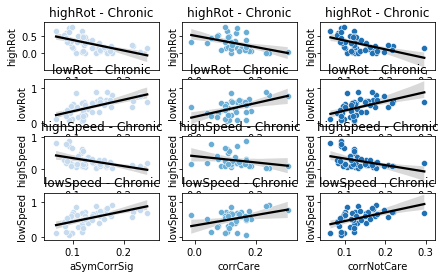

In [192]:
%matplotlib inline
colors = np.array(sns.color_palette("Blues", n_colors=3))
#col2  = 'percent_high_C'
fig, ax = plt.subplots(4,3,figsize=(7,4),sharey='row')
for indp,col2 in enumerate(['highRot','lowRot','highSpeed','lowSpeed']):
    df3 = df2[df2.population == 'MSN-MSN']
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
    df3 = df3[(df3.Period=='Healthy')]
#     sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
#     sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
#     ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
#     df4 = df3[[col,col2]].dropna()
#     df4['Intercept']=1
#     model = sm.OLS(df4[col2], df4[['Intercept',col]])
#     model_results = model.fit()
#     b = model_results.params
#     a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
#     print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for iPer,col in enumerate(['aSymCorrSig','corrCare','corrNotCare']):
        sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,iPer])
        sns.scatterplot(x=col,y=col2,data = df3,color=colors[iPer,:],ax=ax[indp,iPer])
        ax[indp,iPer].set_title(col2 + ' - '+per)
        df4 = df3[[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(col,':')
        print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
# fig.savefig(figFolder+'new4D.svg',transparent=True)

----------------------------------------------------------------
aSymCorrSig :
highRot (-0.6706228430370776, 0.006212403012347941) 0.44973499760313296 0.4074069204956817
corrCare :
highRot (-0.23240585951981857, 0.5181930283546136) 0.054012483539145784 -0.06423595601846088
corrNotCare :
highRot (-0.6229713945555582, 0.01310729128292057) 0.3880933584344971 0.3410236167756123
----------------------------------------------------------------
aSymCorrSig :
lowRot (0.72736140268689, 0.002118942170566191) 0.5290546101186402 0.49282804166622796
corrCare :
lowRot (0.2847530527176952, 0.4252001236166094) 0.08108430103204645 -0.03378016133894768
corrNotCare :
lowRot (0.6846771482352147, 0.004861824514478976) 0.4687827973155061 0.4279199355705451
----------------------------------------------------------------
aSymCorrSig :
highSpeed (-0.4529824350387316, 0.08995505425148206) 0.20519308645361845 0.14405409310389683
corrCare :
highSpeed (-0.4212513124978763, 0.2253584440741346) 0.17745266828118345 

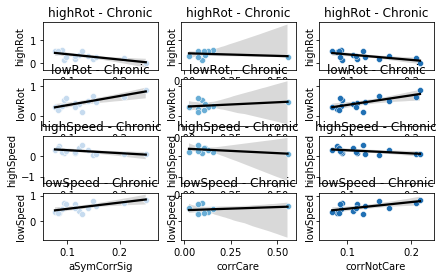

In [193]:
%matplotlib inline
colors = np.array(sns.color_palette("Blues", n_colors=3))
#col2  = 'percent_high_C'
fig, ax = plt.subplots(4,3,figsize=(7,4),sharey='row')
for indp,col2 in enumerate(['highRot','lowRot','highSpeed','lowSpeed']):
    df3 = df2[df2.population == 'MSN-CHI']
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
    df3 = df3[(df3.Period=='Healthy')]
#     sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
#     sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
#     ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
#     df4 = df3[[col,col2]].dropna()
#     df4['Intercept']=1
#     model = sm.OLS(df4[col2], df4[['Intercept',col]])
#     model_results = model.fit()
#     b = model_results.params
#     a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
#     print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for iPer,col in enumerate(['aSymCorrSig','corrCare','corrNotCare']):
        sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,iPer])
        sns.scatterplot(x=col,y=col2,data = df3,color=colors[iPer,:],ax=ax[indp,iPer])
        ax[indp,iPer].set_title(col2 + ' - '+per)
        df4 = df3[[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(col,':')
        print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
# fig.savefig(figFolder+'new4D.svg',transparent=True)

C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
MSN-MSN (0.075689446204026, 0.39768824459096924) 0.005728892266672281 -0.0022252765951944475
Healthy :
MSN-MSN (0.37384003866589943, 0.024703052736981777) 0.13975637450972123 0.11445509140706611
Acute :
MSN-MSN (0.0019749598111630517, 0.9890259367128198) 3.900466255424284e-06 -0.020404183197698655
Chronic :
MSN-MSN (-0.08147158930025769, 0.6172409181819691) 0.006637619863109956 -0.019503495403650373
----------------------------------------------------------------
MSN-CHI (0.10074403461120693, 0.5647283950409862) 0.010149360509744021 -0.01984611341420317
Healthy :
MSN-CHI (0.23569135977879474, 0.5121235824831823) 0.055550417074377245 -0.06250578079132563
Acute :
MSN-CHI (0.09366026294261508, 0.739884862773485) 0.008772244854479694 -0.06747604400286789
Chronic :
MSN-CHI (-0.2075519394077207, 0.5650379837664826) 0.04307780755190649 -0.0765374665041052


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
MSN-PV (0.15353173921025984, 0.2723797794305457) 0.02357199494492701 0.004426347786984475
Healthy :
MSN-PV (0.38880693919575965, 0.18918191341719573) 0.15117083596677516 0.07400454832739112
Acute :
MSN-PV (0.2090210657308316, 0.2857660274032442) 0.04368980591925242 0.006908644608454306
Chronic :
MSN-PV (0.08699623900186214, 0.788053462986004) 0.007568345600468818 -0.09167481983948433


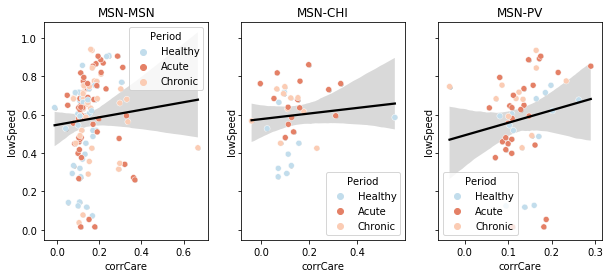

In [185]:
col = 'corrCare'
col2  = 'lowSpeed'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=True)
for indp,p in enumerate(['MSN-MSN','MSN-CHI','MSN-PV']):
    df3 = df2[(df2.population==p)]#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title(p)
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
MSN-MSN (-0.23456798908648646, 0.000732934131442387) 0.055022141504078026 0.050344033293702184
Healthy :
MSN-MSN (-0.41545679572060745, 0.003319439891910764) 0.17260434911043465 0.15461748713457446
Acute :
MSN-MSN (-0.22206008606122768, 0.030556436240279785) 0.0493106818215201 0.03908821603465473
Chronic :
MSN-MSN (-0.2217399767654293, 0.08589360507698071) 0.049168617295933026 0.033052831148406514
----------------------------------------------------------------
MSN-CHI (-0.11824856858027849, 0.4085581341967097) 0.013982723971284972 -0.006140077580321535
Healthy :
MSN-CHI (-0.42623291321123036, 0.11313635985914364) 0.18167449630453236 0.11872638063565033
Acute :
MSN-CHI (0.2531103311411107, 0.26828456509806203) 0.06406483973036259 0.014805094453013257
Chronic :
MSN-CHI (-0.2925093131009487, 0.2900714834450214) 0.08556169825078863 0.015220290423926253


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
MSN-PV (-0.18033583769498063, 0.10943435562527706) 0.03252101435715016 0.020117437618139333
Healthy :
MSN-PV (-0.16106647639034766, 0.551230816084244) 0.02594240981680218 -0.04363313233914057
Acute :
MSN-PV (-0.12878563737277834, 0.393665632279798) 0.016585740393512682 -0.005764583688453007
Chronic :
MSN-PV (-0.32097096669611824, 0.1940506237117661) 0.10302236146184063 0.046961259053205695


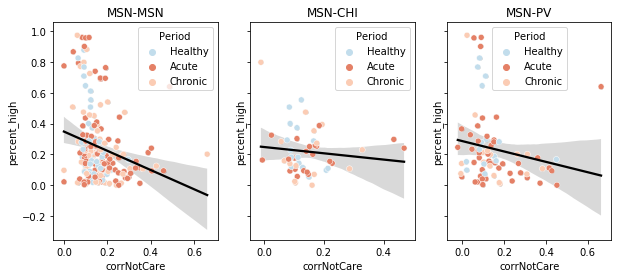

In [150]:
col = 'corrNotCare'
col2  = 'percent_high'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=True)
for indp,p in enumerate(['MSN-MSN','MSN-CHI','MSN-PV']):
    df3 = df2[(df2.population==p)]#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title(p)
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
corrCare (0.075689446204026, 0.39768824459096924) 0.005728892266672281 -0.0022252765951944475
Healthy :
corrCare (0.37384003866589943, 0.024703052736981777) 0.13975637450972112 0.11445509140706589
Acute :
corrCare (0.0019749598111630517, 0.9890259367128198) 3.900466255646329e-06 -0.020404183197698433
Chronic :
corrCare (-0.08147158930025769, 0.6172409181819691) 0.006637619863109956 -0.019503495403650373
----------------------------------------------------------------
corrNotCare (0.22745070145424673, 0.0010691351343663305) 0.051733821592028884 0.047039434570207206


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


Healthy :
corrNotCare (0.49109520431572334, 0.00039384422234911803) 0.2411744997019022 0.2246782931736826
Acute :
corrNotCare (0.21601688259064972, 0.035510278288840104) 0.04666329356418264 0.036412361236915824
Chronic :
corrNotCare (0.16649475371806383, 0.19968960741175756) 0.027720503015638887 0.011241189507429472


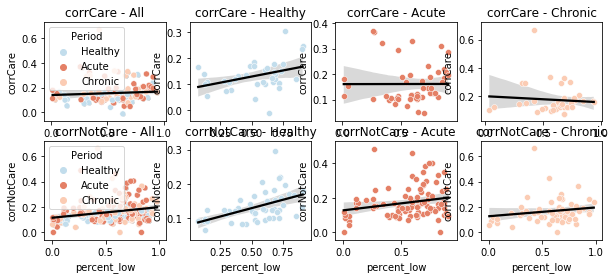

In [148]:
%matplotlib inline
col = 'percent_low'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(2,4,figsize=(10,4),sharey=False)
for indp,col2 in enumerate(['corrCare','corrNotCare']):
    df3 = df2[df2.population == 'MSN-MSN']
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for iPer,per in enumerate(df3.Period.unique()):
        sns.regplot(x=col,y=col2,data = df3[df3.Period == per],color='k',marker=".",ax=ax[indp,iPer+1])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer+1])
        ax[indp,iPer+1].set_title(col2 + ' - '+per)
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
fig.savefig(figFolder+'corrCare_low.svg',transparent=True)

In [9]:
# data for all mice - homomorphic filter 
PVdata = getData(Files[1],['speed','trace'],period ='Pre', cre='PV',red = True)
MSNdata = getData(Files[1],['speed','trace'],period ='Pre',red = False)
CHIdata = getData(Files[1],['speed','trace'],period ='Pre', cre='CHI',red = True)


D:\6OHDA\IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value


cleaning up trace data
I deleted session: 1236_day19L
I deleted session: 4539_day11
I deleted session: 4539_day5
I deleted session: 7584_day0
I deleted session: 7909_day30A
I deleted session: 8430_BaselineA
I deleted session: 8430_day1
I deleted session: 8430_day15A
I deleted session: 8430_day9
I deleted session: 8803_day10
I deleted session: 8803_day12
I deleted session: 8803_day30A
I deleted session: 8803_day5
cleaning up trace data
cleaning up speed data
cleaning up trace data
cleaning up speed data
cleaning up trace data
I deleted session: 0761_day1
I deleted session: 0761_day12
I deleted session: 0761_day14A
I deleted session: 0761_day2
I deleted session: 0761_day31A
I deleted session: 1208_BaselineA
I deleted session: 1222_BaselineA
I deleted session: 1222_day11
I deleted session: 1222_day13
I deleted session: 1222_day2
I deleted session: 1222_day20L
I deleted session: 1222_day3
I deleted session: 1222_day32A
I deleted session: 1222_day36L
I deleted session: 1222_day5
I deleted s

In [201]:
numIter = 1000
col_names = ['Mouse','Sess','Day','n','diff_speed','s2_5','s97_5','s95','diff_rot','r2_5','r97_5','r95']
dfC = pd.DataFrame(columns = col_names)
cond = ['PVdata','MSNdata','CHIdata']
transWindow = np.ones((10,1))
for c in cond:
    data = eval(c)
    for sess in data.keys():
#         try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])
            m = sess[0:4]

            Hp = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
            Lp = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
            Hrot = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')+getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
            Lrot = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
                
            Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
            numRed = int(data[sess]['trace']['numred'])
            if c in ['PVdata','CHIdata']:
                Ca = Ca[:numRed,:]
            else:
                Ca = Ca[numRed:,:]
            
            Ca = Ca[np.sum(Ca,axis=1)>0,:]
            if Ca.shape[0]==0:
                continue
            CaO = Ca[:,1:]-Ca[:,:-1]
            if CaO.shape[1]<Hp.shape[0]:
                 CaO = np.append(CaO,np.zeros((CaO.shape[0],1)),axis=1)
            C_start = (CaO==1)*1
            
            shuffles = np.zeros((C_start.shape[0],numIter,2))
            
            lowTime = np.sum(Lp/1200)
            highTime = np.sum(Hp/1200)
            lowRTime = np.sum(Lrot/1200)
            highRTime = np.sum(Hrot/1200)
            
            for it in range(numIter):
                shifts = np.random.randint(size= C_start.shape[0],low=0,high=C_start.shape[1])
                C = circShiftRoll(shifts,C_start)
                shuffles[:,it,0] = (np.sum(C[:,Hp],axis=1)/highTime)-(np.sum(C[:,Lp],axis=1)/lowTime)
                shuffles[:,it,1] = (np.sum(C[:,Hrot],axis=1)/highRTime)-(np.sum(C[:,Lrot],axis=1)/lowRTime)
            
           
        
            a = np.asarray([np.arange(C_start.shape[0]),
                            (np.sum(C_start[:,Hp],axis=1)/highTime)-(np.sum(C_start[:,Lp],axis=1)/lowTime),
                            np.nanpercentile(shuffles[:,:,0],2.5,axis=1),
                            np.nanpercentile(shuffles[:,:,0],97.5,axis=1),
                            np.nanpercentile(shuffles[:,:,0],95,axis=1),
                            (np.sum(C_start[:,Hrot],axis=1)/highRTime)-(np.sum(C_start[:,Lrot],axis=1)/lowRTime),
                            np.nanpercentile(shuffles[:,:,1],2.5,axis=1),
                            np.nanpercentile(shuffles[:,:,1],97.5,axis=1),
                            np.nanpercentile(shuffles[:,:,1],95,axis=1)]).T
            
            df2C = pd.DataFrame(a, columns = col_names[3:])
            df2C['Day'] = day
            df2C['Mouse'] = m
            df2C['Sess'] = sess
            df2C['CellType'] = c[:-4]
            df2C['Period'] = periodCalc(day)
            dfC = pd.concat([dfC,df2C],sort=True)
#         except:
#             print(sess)


dfC.head()


dfC.to_csv(figFolder+'firingRateDiff.csv')

D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
<ipython-input-201-4d76b5c8cca1>:46: RuntimeWarning: invalid value encountered in true_divide
  shuffles[:,it,0] = (np.sum(C[:,Hrot_C],axis=1)/highTime)-(np.sum(C[:,Lp],axis=1)/lowTime)
<ipython-input-201-4d76b5c8cca1>:52: RuntimeWarning: invalid value encountered in true_divide
  (np.sum(C_start[:,Hrot_C],axis=1)/highTime)-(np.sum(C_start[:,Lp],axis=1)/lowTime),
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
<ipython-input-201-4d76b5c8cca1>:47: RuntimeWarning: invalid value encountered in true_divide
  shuffles[:,it,1] = (np.sum(C[:,Hrot_AC],axis=1)/highRTime)-(np.sum(C[:,Lrot],axis=1)/lowRTime)
<ipython-input-201-4d76b5c8cca1>:56: RuntimeWarning: invalid value encountered in true_divide
  (np.sum(C_start[:,Hrot_A

In [103]:
dfC =pd.read_csv(figFolder+'firingRateDiff.csv')
dfC['care'] = dfC.apply(lambda x: (x.diff_speed>x.s97_5)or(x.diff_speed<x.s2_5),axis=1)
dfC['care_rot'] = dfC.apply(lambda x: (x.diff_rot>x.r97_5)or(x.diff_rot<x.r2_5),axis=1)
dfC.head()

,Unnamed: 0,CellType,Day,Mouse,Period,Sess,diff_rot,diff_speed,n,r2_5,r95,r97_5,s2_5,s95,s97_5,care,care_rot
0,0,PV,0,1236,Healthy,1236_BaselineA,-0.164858,-0.147783,0.0,-0.164858,0.682982,0.682982,-0.147783,0.604534,0.604534,False,False
1,1,PV,0,1236,Healthy,1236_BaselineA,2.567072,2.727104,1.0,-1.318862,1.719231,2.237356,-1.330049,1.679220,1.827003,True,True
2,0,PV,0,1236,Healthy,1236_BaselineS,0.442357,0.929099,0.0,-1.399417,1.594500,1.944354,-1.341615,1.560061,1.858198,False,False
3,1,PV,0,1236,Healthy,1236_BaselineS,0.000000,-0.149068,1.0,-0.174927,0.617284,0.617284,-0.149068,0.539084,0.539084,False,False
4,0,PV,11,1236,Acute,1236_day11,-0.126011,-0.127146,0.0,-0.252021,1.133171,1.259182,-0.254291,1.128085,1.255230,False,False


--------------------------------
care PV
Healthy 1.0 False   5 / 23
Acute 0.28227883988228064 False   6 / 56
Chronic 0.7009739352337199 False   3 / 21
--------------------------------
care MSN
Healthy 1.0 False   1604 / 7837
Acute 2.1269278292294235e-08 True   1690 / 9850
Chronic 0.03958746122644404 False   1248 / 6539
--------------------------------
care CHI
Healthy 1.0 False   4 / 22
Acute 0.3554546449283295 False   1 / 18
Chronic 1.0 False   2 / 16
--------------------------------
care_rot PV
Healthy 1.0 False   5 / 23
Acute 0.0014930217461863043 True   0 / 56
Chronic 0.4160685457480687 False   2 / 21
--------------------------------
care_rot MSN
Healthy 1.0 False   1140 / 7837
Acute 1.3991403333222644e-83 True   577 / 9850
Chronic 0.8868155988309264 False   957 / 6539
--------------------------------
care_rot CHI
Healthy 1.0 False   5 / 22
Acute 0.19687602582339495 False   1 / 18
Chronic 0.6754107048224698 False   2 / 16


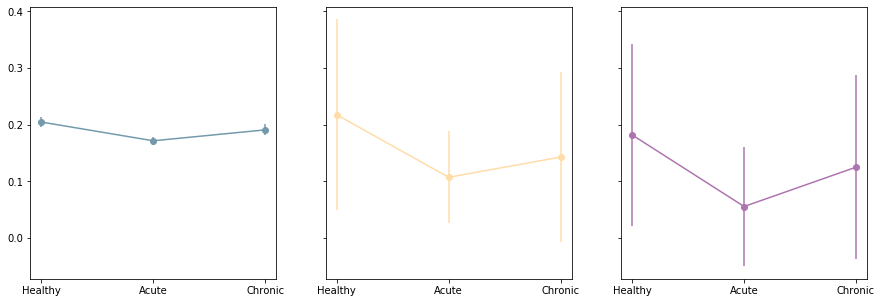

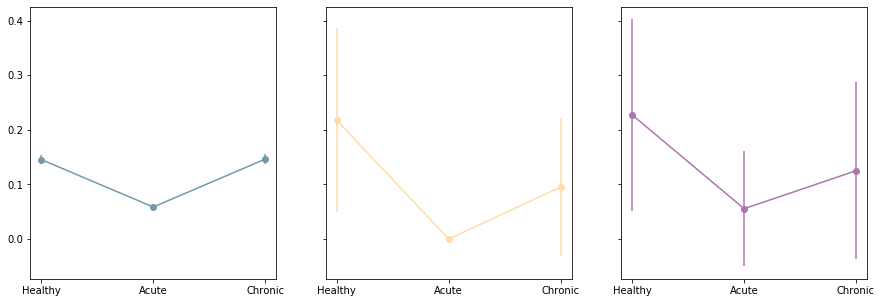

In [200]:
%matplotlib inline
df= dfC.copy()
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Acute', 'Chronic'])

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').care.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2
fig.savefig(figFolder+'figure3F_mvmt.svg',transparent=True)

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_rot.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_rot.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').care_rot.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2
fig.savefig(figFolder+'figure3F_rot.svg',transparent=True)

N = 2
df4 = pd.DataFrame(columns = ['mvmt','CellType','Period','oddsRatio','pValue_corrected'])
for sig in ['care','care_rot']:
    for cell in df.CellType.unique():
        print('--------------------------------')
        print(sig,cell)
        df3 = df[(df.CellType ==cell)]
        dfHealthy = df3[df3.Period == 'Healthy']
        yesVals = []
        noValse = []
        for period in df3.Period.unique():
            dfComp = df3[df3.Period == period]
            oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True][sig].count(), dfHealthy[dfHealthy[sig] == False][sig].count()], [dfComp[dfComp[sig] == True][sig].count(), dfComp[dfComp[sig] == False][sig].count()]])
            print(period,pvalue, pvalue<0.05/(N)," ",dfComp[dfComp[sig] == True][sig].count(),'/' ,dfComp[sig].count())
            df4 = df4.append({'mvmt':sig,'CellType':cell,
                              'Period':period,'oddsRatio':oddsratio,
                              'pValue_corrected':pvalue*(N-1),
                              'healthy_all':dfHealthy[sig].count(),
                              'healthy_care':dfHealthy[dfHealthy[sig] == True][sig].count(),
                              'healthy_ratio':dfHealthy[dfHealthy[sig] == True][sig].count()/dfHealthy[sig].count(),
                              'period_all':dfComp[sig].count(),'period_care':dfComp[dfComp[sig] == True][sig].count(),
                              'period_ratio':dfComp[dfComp[sig] == True][sig].count()/dfComp[sig].count()},ignore_index = True)


In [16]:
numIter = 1000
col_names = ['Mouse','Sess','Day','n','diff_speed','s2_5','s97_5','s95','diff_rot','r2_5','r97_5','r95']
dfC = pd.DataFrame(columns = col_names)
cond = ['PVdata','MSNdata','CHIdata']
transWindow = np.ones((10,1))
for c in cond:
    data = eval(c)
    for sess in data.keys():
#         try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])
            m = sess[0:4]

            Hrot_C = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
            Lp = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
            Hrot_AC =getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
            Lrot = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
                
            Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
            n = np.arange(Ca.shape[0])
            numRed = int(data[sess]['trace']['numred'])
            if c in ['PVdata','CHIdata']:
                Ca = Ca[:numRed,:]
                n = n[:numRed]
            else:
                Ca = Ca[numRed:,:]
                n = n[numRed:]
            
            n = n[np.sum(Ca,axis=1)>0]
            Ca = Ca[np.sum(Ca,axis=1)>0,:]
            
            if Ca.shape[0]==0:
                continue
            CaO = Ca[:,1:]-Ca[:,:-1]
            if CaO.shape[1]<Hrot_C.shape[0]:
                 CaO = np.append(CaO,np.zeros((CaO.shape[0],1)),axis=1)
            C_start = (CaO==1)*1
            
            shuffles = np.zeros((C_start.shape[0],numIter,2))
            
            lowTime = np.sum(Lp/1200)
            highTime = np.sum(Hrot_C/1200)
            lowRTime = np.sum(Lrot/1200)
            highRTime = np.sum(Hrot_AC/1200)
            
            for it in range(numIter):
                shifts = np.random.randint(size= C_start.shape[0],low=0,high=C_start.shape[1])
                C = circShiftRoll(shifts,C_start)
                shuffles[:,it,0] = (np.sum(C[:,Hrot_C],axis=1)/highTime)-(np.sum(C[:,Lp],axis=1)/lowTime)
                shuffles[:,it,1] = (np.sum(C[:,Hrot_AC],axis=1)/highRTime)-(np.sum(C[:,Lrot],axis=1)/lowRTime)
            
           
        
            a = np.asarray([n,
                            (np.sum(C_start[:,Hrot_C],axis=1)/highTime)-(np.sum(C_start[:,Lp],axis=1)/lowTime),
                            np.nanpercentile(shuffles[:,:,0],2.5,axis=1),
                            np.nanpercentile(shuffles[:,:,0],97.5,axis=1),
                            np.nanpercentile(shuffles[:,:,0],95,axis=1),
                            (np.sum(C_start[:,Hrot_AC],axis=1)/highRTime)-(np.sum(C_start[:,Lrot],axis=1)/lowRTime),
                            np.nanpercentile(shuffles[:,:,1],2.5,axis=1),
                            np.nanpercentile(shuffles[:,:,1],97.5,axis=1),
                            np.nanpercentile(shuffles[:,:,1],95,axis=1)]).T
            
            df2C = pd.DataFrame(a, columns = col_names[3:])
            df2C['Day'] = day
            df2C['Mouse'] = m
            df2C['Sess'] = sess
            df2C['CellType'] = c[:-4]
            df2C['Period'] = periodCalc(day)
            dfC = pd.concat([dfC,df2C],sort=True)
#         except:
#             print(sess)


dfC.head()


dfC.to_csv(figFolder+'firingRateDiff2_n.csv')

<ipython-input-16-da9b4e250007>:51: RuntimeWarning: invalid value encountered in true_divide
  shuffles[:,it,0] = (np.sum(C[:,Hrot_C],axis=1)/highTime)-(np.sum(C[:,Lp],axis=1)/lowTime)
<ipython-input-16-da9b4e250007>:57: RuntimeWarning: invalid value encountered in true_divide
  (np.sum(C_start[:,Hrot_C],axis=1)/highTime)-(np.sum(C_start[:,Lp],axis=1)/lowTime),
<ipython-input-16-da9b4e250007>:52: RuntimeWarning: invalid value encountered in true_divide
  shuffles[:,it,1] = (np.sum(C[:,Hrot_AC],axis=1)/highRTime)-(np.sum(C[:,Lrot],axis=1)/lowRTime)
<ipython-input-16-da9b4e250007>:61: RuntimeWarning: invalid value encountered in true_divide
  (np.sum(C_start[:,Hrot_AC],axis=1)/highRTime)-(np.sum(C_start[:,Lrot],axis=1)/lowRTime),


In [15]:
Ca.shape

(1, 11900)

In [ ]:
numIter = 1000
col_names = ['Mouse','Sess','Day','n','diff_speed','s2_5','s97_5','s95','diff_rot','r2_5','r97_5','r95']
dfC = pd.DataFrame(columns = col_names)
cond = ['PVdata','MSNdata','CHIdata']
transWindow = np.ones((10,1))
for c in cond:
    data = eval(c)
    for sess in data.keys():
#         try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])
            m = sess[0:4]

            Hrot_C = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
            Lp = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
            Hrot_AC =getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
            Lrot = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
                
            Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
            numRed = int(data[sess]['trace']['numred'])
            if c in ['PVdata','CHIdata']:
                Ca = Ca[:numRed,:]
            else:
                Ca = Ca[numRed:,:]
            
            Ca = Ca[np.sum(Ca,axis=1)>0,:]
            if Ca.shape[0]==0:
                continue
            CaO = Ca[:,1:]-Ca[:,:-1]
            if CaO.shape[1]<Hrot_C.shape[0]:
                 CaO = np.append(CaO,np.zeros((CaO.shape[0],1)),axis=1)
            C_start = (CaO==1)*1
            
            shuffles = np.zeros((C_start.shape[0],numIter,2))
            
            lowTime = np.sum(Lp/1200)
            highTime = np.sum(Hrot_C/1200)
            lowRTime = np.sum(Lrot/1200)
            highRTime = np.sum(Hrot_AC/1200)
            
            for it in range(numIter):
                shifts = np.random.randint(size= C_start.shape[0],low=0,high=C_start.shape[1])
                C = circShiftRoll(shifts,C_start)
                shuffles[:,it,0] = (np.sum(C[:,Hrot_C],axis=1)/highTime)-(np.sum(C[:,Lp],axis=1)/lowTime)
                shuffles[:,it,1] = (np.sum(C[:,Hrot_AC],axis=1)/highRTime)-(np.sum(C[:,Lrot],axis=1)/lowRTime)
            
           
        
            a = np.asarray([np.arange(C_start.shape[0]),
                            (np.sum(C_start[:,Hrot_C],axis=1)/highTime)-(np.sum(C_start[:,Lp],axis=1)/lowTime),
                            np.nanpercentile(shuffles[:,:,0],2.5,axis=1),
                            np.nanpercentile(shuffles[:,:,0],97.5,axis=1),
                            np.nanpercentile(shuffles[:,:,0],95,axis=1),
                            (np.sum(C_start[:,Hrot_AC],axis=1)/highRTime)-(np.sum(C_start[:,Lrot],axis=1)/lowRTime),
                            np.nanpercentile(shuffles[:,:,1],2.5,axis=1),
                            np.nanpercentile(shuffles[:,:,1],97.5,axis=1),
                            np.nanpercentile(shuffles[:,:,1],95,axis=1)]).T
            
            df2C = pd.DataFrame(a, columns = col_names[3:])
            df2C['Day'] = day
            df2C['Mouse'] = m
            df2C['Sess'] = sess
            df2C['CellType'] = c[:-4]
            df2C['Period'] = periodCalc(day)
            dfC = pd.concat([dfC,df2C],sort=True)
#         except:
#             print(sess)


dfC.head()


dfC.to_csv(figFolder+'firingRateDiff2.csv')

In [203]:
dfC =pd.read_csv(figFolder+'firingRateDiff2.csv')
dfC['care_C'] = dfC.apply(lambda x: (x.diff_speed>x.s97_5)or(x.diff_speed<x.s2_5),axis=1)
dfC['care_AC'] = dfC.apply(lambda x: (x.diff_rot>x.r97_5)or(x.diff_rot<x.r2_5),axis=1)
dfC.head()

,Unnamed: 0,CellType,Day,Mouse,Period,Sess,diff_rot,diff_speed,n,r2_5,r95,r97_5,s2_5,s95,s97_5,care_C,care_AC
0,0,PV,0,1236,Healthy,1236_BaselineA,-0.164858,-0.164858,0.0,-0.164858,0.726832,0.726832,-0.164858,0.000000,0.000000,False,False
1,1,PV,0,1236,Healthy,1236_BaselineA,2.742471,-0.164858,1.0,-1.318862,1.685923,2.247898,-1.318862,10.496466,10.661323,False,True
2,0,PV,0,1236,Healthy,1236_BaselineS,0.482968,-0.174927,0.0,-1.399417,1.623830,1.931870,-1.399417,9.300292,9.475219,False,False
3,1,PV,0,1236,Healthy,1236_BaselineS,0.000000,0.000000,1.0,-0.174927,0.657895,0.657895,-0.174927,0.000000,0.000000,False,False
4,0,PV,11,1236,Acute,1236_day11,-0.126011,-0.126011,0.0,-0.252021,1.232993,1.359003,-0.252021,0.000000,0.000000,False,False


--------------------------------
care_C PV
Healthy 1.0 False   0 / 23
Acute 1.0 False   1 / 56
Chronic 0.4772727272727269 False   1 / 21
--------------------------------
care_C MSN
Healthy 1.0 False   796 / 7837
Acute 1.7307203882977559e-34 True   519 / 9850
Chronic 0.05354482059966144 False   730 / 6539
--------------------------------
care_C CHI
Healthy 1.0 False   3 / 22
Acute 0.6132727869569959 False   1 / 18
Chronic 1.0 False   2 / 16
--------------------------------
care_AC PV
Healthy 1.0 False   7 / 23
Acute 8.457324219418908e-05 True   0 / 56
Chronic 0.04805289603928288 False   1 / 21
--------------------------------
care_AC MSN
Healthy 1.0 False   1013 / 7837
Acute 1.7709382028182643e-117 True   360 / 9850
Chronic 2.3600219260695195e-08 True   650 / 6539
--------------------------------
care_AC CHI
Healthy 1.0 False   3 / 22
Acute 0.6132727869569959 False   1 / 18
Chronic 0.2489331436699856 False   0 / 16


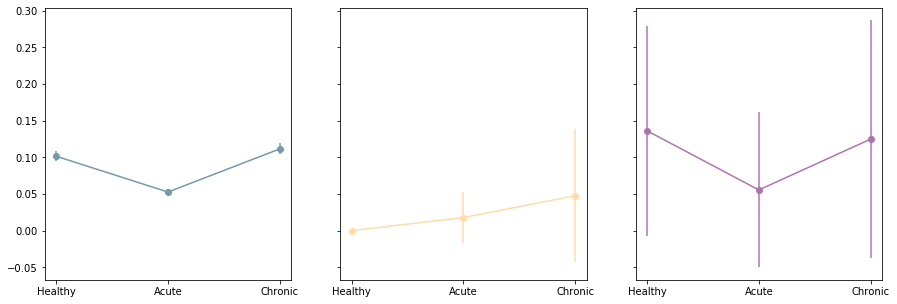

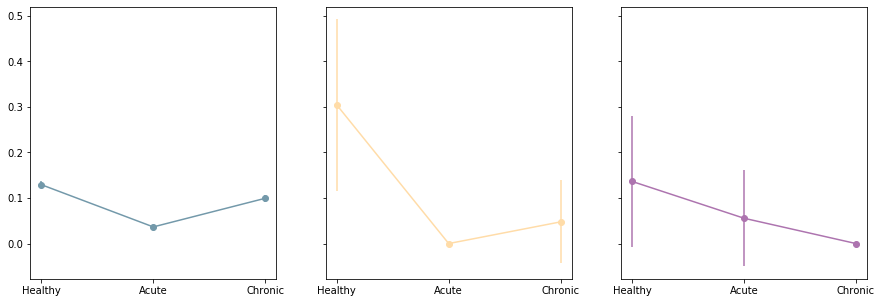

In [206]:
%matplotlib inline
df= dfC.copy()
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Acute', 'Chronic'])

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_C.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_C.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').care_C.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2
fig.savefig(figFolder+'figure3F_contra.svg',transparent=True)

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_AC.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_AC.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').care_AC.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2
fig.savefig(figFolder+'figure3F_ipsi.svg',transparent=True)

N = 2
df4 = pd.DataFrame(columns = ['mvmt','CellType','Period','oddsRatio','pValue_corrected'])
for sig in ['care_C','care_AC']:
    for cell in df.CellType.unique():
        print('--------------------------------')
        print(sig,cell)
        df3 = df[(df.CellType ==cell)]
        dfHealthy = df3[df3.Period == 'Healthy']
        yesVals = []
        noValse = []
        for period in df3.Period.unique():
            dfComp = df3[df3.Period == period]
            oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True][sig].count(), dfHealthy[dfHealthy[sig] == False][sig].count()], [dfComp[dfComp[sig] == True][sig].count(), dfComp[dfComp[sig] == False][sig].count()]])
            print(period,pvalue, pvalue<0.05/(N)," ",dfComp[dfComp[sig] == True][sig].count(),'/' ,dfComp[sig].count())
            df4 = df4.append({'mvmt':sig,'CellType':cell,
                              'Period':period,'oddsRatio':oddsratio,
                              'pValue_corrected':pvalue*(N-1),
                              'healthy_all':dfHealthy[sig].count(),
                              'healthy_care':dfHealthy[dfHealthy[sig] == True][sig].count(),
                              'healthy_ratio':dfHealthy[dfHealthy[sig] == True][sig].count()/dfHealthy[sig].count(),
                              'period_all':dfComp[sig].count(),'period_care':dfComp[dfComp[sig] == True][sig].count(),
                              'period_ratio':dfComp[dfComp[sig] == True][sig].count()/dfComp[sig].count()},ignore_index = True)


--------------------------------
care PV
Healthy 1.0 False   7 / 23
Acute 0.11928780293641553 False   8 / 56
Chronic 0.2868940322145085 False   3 / 21
--------------------------------
care MSN
Healthy 1.0 False   2019 / 7796
Acute 2.6146217797610115e-13 True   2076 / 9795
Chronic 0.005182650752829944 True   1548 / 6490
--------------------------------
care CHI
Healthy 1.0 False   3 / 22
Acute 0.6132727869569959 False   1 / 18
Chronic 1.0 False   2 / 16
--------------------------------
care_rot PV
Healthy 1.0 False   4 / 23
Acute 0.005893506892840674 True   0 / 56
Chronic 0.6663248832846109 False   2 / 21
--------------------------------
care_rot MSN
Healthy 1.0 False   1508 / 7796
Acute 2.6484790047864022e-129 True   703 / 9795
Chronic 0.19097292084653417 False   1199 / 6490
--------------------------------
care_rot CHI
Healthy 1.0 False   6 / 22
Acute 0.10479811795601277 False   1 / 18
Chronic 0.7059849223037072 False   3 / 16


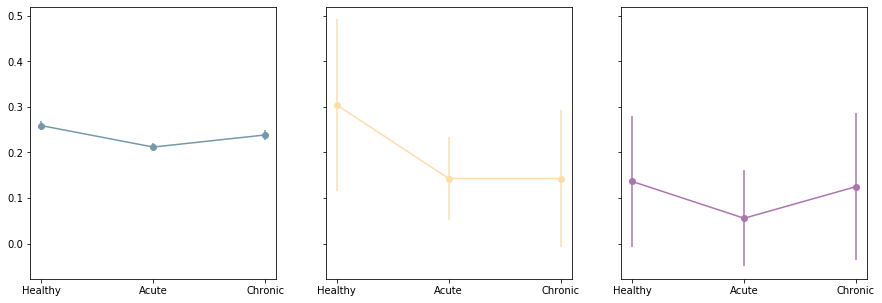

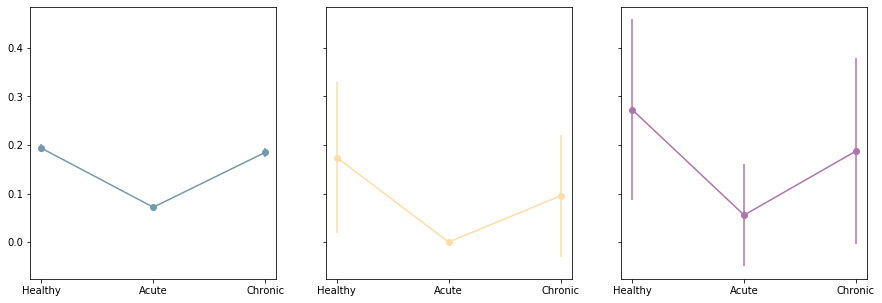

In [43]:
%matplotlib inline
df= dfC.copy()
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Acute', 'Chronic'])


df['care'] = df.apply(lambda x: (x.diff_speed>x.s95),axis=1)
df['care_rot'] = df.apply(lambda x: (x.diff_rot>x.r95),axis=1)

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').care.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2
# fig.savefig(figFolder+'figure3d_mvmt.svg',transparent=True)

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_rot.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_rot.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').care_rot.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2

N = 2
df4 = pd.DataFrame(columns = ['mvmt','CellType','Period','oddsRatio','pValue_corrected'])
for sig in ['care','care_rot']:
    for cell in df.CellType.unique():
        print('--------------------------------')
        print(sig,cell)
        df3 = df[(df.CellType ==cell)]
        dfHealthy = df3[df3.Period == 'Healthy']
        yesVals = []
        noValse = []
        for period in df3.Period.unique():
            dfComp = df3[df3.Period == period]
            oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True][sig].count(), dfHealthy[dfHealthy[sig] == False][sig].count()], [dfComp[dfComp[sig] == True][sig].count(), dfComp[dfComp[sig] == False][sig].count()]])
            print(period,pvalue, pvalue<0.05/(N)," ",dfComp[dfComp[sig] == True][sig].count(),'/' ,dfComp[sig].count())
            df4 = df4.append({'mvmt':sig,'CellType':cell,
                              'Period':period,'oddsRatio':oddsratio,
                              'pValue_corrected':pvalue*(N-1),
                              'healthy_all':dfHealthy[sig].count(),
                              'healthy_care':dfHealthy[dfHealthy[sig] == True][sig].count(),
                              'healthy_ratio':dfHealthy[dfHealthy[sig] == True][sig].count()/dfHealthy[sig].count(),
                              'period_all':dfComp[sig].count(),'period_care':dfComp[dfComp[sig] == True][sig].count(),
                              'period_ratio':dfComp[dfComp[sig] == True][sig].count()/dfComp[sig].count()},ignore_index = True)


In [7]:
# add Jacakard
f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','a')
numshifts = 1000
for m in tqdm(miceList):
    grp = f[m]
    data =  getData(Files[1],['trace'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        subgrp = grp[sess]
        
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred']) 
        
        subgrp.attrs['numRed'] = numRed
        subgrp.attrs['day'] = day
        subgrp.attrs['period'] = periodCalc(day)

        try:  
            Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')+getOnsetOrPeriod(m,sess,'Pre','caFall_Hf')
            Ca = Ca[np.sum(Ca,axis=1)>0,:]
            both = np.dot(Ca ,Ca.T) # Do the actual co-occorence matrix not np.corrcoef(Ca)
            x2,y2 = np.meshgrid(np.sum(Ca,axis=1), np.sum(Ca,axis=1))
            either = x2+y2-both
            cor = both/either
            cor[np.isinf(cor)] = 1
            ssubgrp = subgrp['Pre']
            ssubgrp['Jaccard2'] = cor

            sCor = np.empty((cor.shape[0],cor.shape[1],numshifts))
            for s in range(0,numshifts):
                shifts = np.random.randint(size= Ca.shape[0],low=0,high=Ca.shape[1])
                Ca2 = circShiftRoll(shifts,Ca)
                both = np.dot(Ca2 ,Ca2.T) # Do the actual co-occorence matrix not np.corrcoef(Ca)
                x2,y2 = np.meshgrid(np.sum(Ca2,axis=1), np.sum(Ca2,axis=1))
                either = x2+y2-both
                cor = both/either
                cor[np.isinf(cor)] = 1
                sCor[:,:,s] = cor
                
                
            
            ssubgrp['Jaccard2_shuffle'] = sCor
            
            del sCor
        except:
            print(sess)
f.close()

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value

 21%|█████████████████▊                                                                 | 3/14 [00:05<00:18,  1.72s/it]

0761_day1



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/17 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



100%|█████████████████████████████████████████████████████████████████████████████████| 16/16 [52:28<00:00, 196.77s/it]


<IPython.core.display.Javascript object>


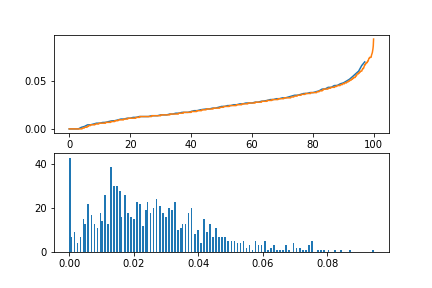

43
142.0 665.0 (107, 11900)


In [519]:
%matplotlib notebook
fig,ax = plt.subplots(2,1)
print(np.sum(d2[tInds2[0],tInds2[1],:]==0))
ax[0].plot(np.nanpercentile(d2[tInds2[0],tInds2[1],:],np.arange(1,99)))
ax[0].plot(np.arange(0,1000)*0.1,np.sort(d2[tInds2[0],tInds2[1],:]))
ax[1].hist(d2[tInds2[0],tInds2[1],:],200)
print(np.sum(Ca[tInds[0],:]),np.sum(Ca[tInds[1],:]),Ca.shape)

D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


cleaning up trace data
(107, 107) (79, 79)


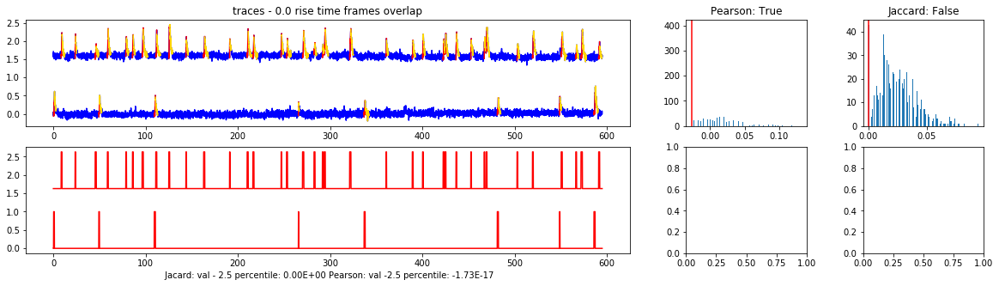

In [499]:
%matplotlib inline
g = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','r')



m = '1208'
sess = '1208_day19L'
data = getData(Files[1],['trace'],period ='Pre',day =lambda day: (day==19), mice = [m])
Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf') 
eventRate = np.sum(Ca,axis=1)

c = g[m][sess]['Pre']['pearson'][:]
c2 = g[m][sess]['Pre']['Jaccard'][:]

print(c.shape,c2.shape)

d = g[m][sess]['Pre'][('pearson_shuffle')][:]
d2 = g[m][sess]['Pre'][('Jaccard_shuffle')][:]

b = np.nanpercentile(d,[97.5,2.5],axis=2)
nSig = (c<b[1,:,:])
b2 = np.nanpercentile(d2,[97.5,2.5],axis=2)
nSig2 = (c2<b2[1,:,:])
shift = np.cumsum(eventRate>0)
# fig,ax  = plt.subplots(1,3)

C0 = nSig[eventRate>0,:][:,eventRate>0]
C = 1*C0+1*(~nSig2)
Ilist = np.argwhere(C==2)
Ilist2 = Ilist.copy()
bestPair = np.zeros((Ilist.shape[0]))
for inn,ind in enumerate(Ilist):
    val = (np.argwhere(shift==ind[0])[-1]+1,np.argwhere(shift==ind[1])[-1]+1)
    Ilist2[inn] = val
    bestPair[inn] = c[val[0],val[1]]
# print(bestPair)
for Itop,top in enumerate([Ilist[32]]):#Ilist
    tInds2 = top#Ilist[np.nanargmin(bestPair)]
    tInds = Ilist2[Itop]#[np.nanargmin(bestPair)]

    # print(tInds,tInds2,np.sum(eventRate[:tInds2[0]]==0),np.sum(eventRate[tInds2[0]:tInds2[1]]==0),
    #       nSig2[tInds2[0],tInds2[1]],nSig[tInds[0],tInds[1]])


    fig, ax = plt.subplots(2,3,figsize=(20,5),gridspec_kw={'width_ratios': [5,1,1]})
    dff = data[sess]['trace']['dff']
    Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf') 
    Cf =getOnsetOrPeriod(m,sess,'Pre','caFall_Hf')  
    ca = Ca*dff
    cf = Cf*dff
    ca[ca==0]=np.nan
    cf[cf==0]=np.nan
    spacing = np.max(np.abs(dff))
    t = np.arange(0,dff.shape[1])*0.05
    for indn,n in enumerate(tInds):
        ax[0,0].plot(t,dff[n,:]+indn*spacing,color='blue',rasterized=True) 
        ax[0,0].plot(t,ca[n,:]+indn*spacing,color='red',rasterized=True)
        ax[0,0].plot(t,cf[n,:]+indn*spacing,color='gold',rasterized=True)
    ax[0,0].set_title("traces - {} rise time frames overlap".format(np.sum(1*Ca[tInds[0],:]*1*Ca[tInds[1],:])))
    ax[0,1].hist(d[tInds[0],tInds[1],:],200)
    ax[0,1].axvline(x=c[tInds[0],tInds[1]],color='red')
    ax[0,1].set_title('Pearson: '+"{}".format(nSig[tInds[0],tInds[1]]))
    ax[0,2].hist(d2[tInds2[0],tInds2[1],:],200)
    ax[0,2].axvline(x=c2[tInds2[0],tInds2[1]],color='red')
    ax[0,2].set_title('Jaccard: '+"{}".format(nSig2[tInds2[0],tInds2[1]]))
    ax[1,0].set_xlabel(" Jacard: val - 2.5 percentile: {B:.2E} Pearson: val -2.5 percentile: {B2:.2E}".format(B=c2[tInds2[0],tInds2[1]]-b2[1,tInds2[0],tInds2[1]],
                                                                                                              B2=c[tInds[0],tInds[1]]-b[1,tInds[0],tInds[1]]))
                    

#     fig2, ax2 = plt.subplots(1,1,figsize=(10,5))
    for indn,n in enumerate(tInds):
        ax[1,0].plot(t,Ca[n,:]+indn*spacing,color='red',rasterized=True)
        #ax2.plot(t,Cf[n,:]+indn*spacing,color='gold',rasterized=True)
#     plt.savefig('D:\\6OHDA\\examples\\{}.png'.format(Itop))
#     plt.close()
    
    


In [520]:
"JUMP HERE"
f = h5py.File('J:\\connactivityAnalysis\\connMapsMvmt.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','population','mvmt','personF','sPersonF']
df = pd.DataFrame(columns = col_names)
# df3 = pd.DataFrame(columns = ['Mouse','Sess','Day','numred','Period','population','mvmt','values'])
dist = {"MSN-MSN":[],"MSN-CHI":[],"MSN-PV":[]}
for m in tqdm(f.keys()):
    for sess in f[m].keys():
        for mvmt in f[m][sess]['Pre'].keys():
            try:
                numred = f[m][sess].attrs['numRed']
                cre = getCreType(Files[1],m)
                tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
                                    'numred':numred,'Period':periodCalc(f[m][sess].attrs['day'])}

                c = f[m][sess]['Pre'][mvmt]['aSymCorr'][:]
                c = (c+c.T)/2
                c[(np.tril(np.ones(c.shape),-1))==0] = np.nan

                d = f[m][sess]['Pre'][mvmt][('aSymCorr_shuffle')][:]
                for ind in range(d.shape[2]):
                    d[:,:,ind] = (d[:,:,ind]+d[:,:,ind].T)/2
                b = np.nanpercentile(d,[97.5,2.5],axis=2)
                d = np.nanmean(d,axis=2)
                d[(np.tril(np.ones(d.shape),-1))==0] = np.nan
                
                nSig = (c>b[0,:,:])|(c<b[1,:,:])
                cSig = np.copy(c)
                cSig[~nSig] = np.nan
                noSig = np.copy(c)
                noSig[nSig] = np.nan

                if numred > 1:
                    tempDict['population'] = cre+'-'+cre
                    tempDict['mvmt'] = mvmt
                    tempDict['aSymCorr'] = np.nanmean(c[:numred,:numred])
                    tempDict['sASymCorr'] = np.nanmean(d[:numred,:numred])
                    tempDict['aSymCorrSig'] = np.nanmean(cSig[:numred,:numred])
                    tempDict['aSymCorrNotSig'] = np.nanmean(noSig[:numred,:numred])
                    tempDict['sigPercent'] = np.nansum(nSig[:numred,:numred]==1)/np.nansum(np.isnan(c[:numred,:numred])==0)
                    df2 = pd.DataFrame([tempDict])
                    df = pd.concat([df,df2],sort=True)
                if numred > 0:
                    tempDict['mvmt'] = mvmt
                    tempDict['population'] = 'MSN-'+cre
                    tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
                    tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
                    tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred])
                    tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred])
                    tempDict['sigPercent'] = np.nansum(nSig[numred:,:numred]==1)/np.nansum(np.isnan(c[numred:,:numred])==0)

                    df2 = pd.DataFrame([tempDict])
                    df = pd.concat([df,df2],sort=True)
#                     hi,bi = np.histogram(c[numred:,:numred],np.arange(-1,1,0.01))
#                     hi2,bi2 = np.histogram(cSig[numred:,:numred],np.arange(-1,1,0.01))
#                     df3 = df3.append({'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                                     'numred':numred,'Period':periodCalc(f[m][sess].attrs['day']),
#                                       'population':'MSN-'+cre,'mvmt':mvmt,'values':hi,'values_sig':hi2},ignore_index=True)

                    
                
                tempDict['mvmt'] = mvmt
                tempDict['population'] = 'MSN-MSN'
                tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
                tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
                tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,numred:])
                tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,numred:])
                tempDict['sigPercent'] = np.nansum(nSig[numred:,numred:]==1)/np.nansum(np.isnan(c[numred:,numred:])==0)
#                 hi,bi = np.histogram(c[numred:,numred:],np.arange(-1,1,0.01))
#                 hi2,bi2 = np.histogram(cSig[numred:,numred:],np.arange(-1,1,0.01))
#                 df3 = df3.append({'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                                 'numred':numred,'Period':periodCalc(f[m][sess].attrs['day']),
#                                   'population':'MSN-MSN','mvmt':mvmt,'values':hi,'values_sig':hi2},ignore_index=True)
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
            except Exception as e:
                exc_type, exc_obj, exc_tb = sys.exc_info()
                print(sess,'-',mvmt,exc_tb.tb_lineno,c.shape)
f.close()
df.to_csv(figFolder+'mvmtCorrSig_asym.csv')
# df3.to_csv(figFolder+'mvmtCorrSig_hists.csv')

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
<ipython-input-520-5c6f36154a27>:24: RuntimeWarning: Mean of empty slice
  d = np.nanmean(d,axis=2)
<ipython-input-520-5c6f36154a27>:48: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred])
<ipython-input-520-5c6f36154a27>:46: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
<ipython-input-520-5c6f36154a27>:47: RuntimeWarning: Mean of empty slice
  tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
<ipython-input-520-5c6f36154a27>:49: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred])
<ipython-input-520-5c6f36154a27>:50: RuntimeWarning: invalid value en

0761_day31A - highIpsi 16 (21, 21)
0761_day35L - hiSpeed 16 (21, 21)
0761_day35L - highIpsi 16 (17, 17)


  6%|█████▏                                                                             | 1/16 [00:04<01:13,  4.90s/it]

1208_day2 - highIpsi 16 (185, 185)
1208_day30A - highIpsi 16 (159, 159)
1208_day34L - highIpsi 16 (158, 158)


 25%|████████████████████▌                                                             | 4/16 [09:51<21:10, 105.89s/it]

1236_day15A - highContra 16 (75, 75)
1236_day19L - highContra 16 (94, 94)
1236_day30A - highContra 16 (197, 197)


 50%|█████████████████████████████████████████                                         | 8/16 [40:30<55:24, 415.57s/it]

2980_day19L - highIpsi 16 (191, 191)


 56%|██████████████████████████████████████████████▏                                   | 9/16 [42:45<38:39, 331.29s/it]

2981_day2 - highContra 16 (100, 100)


 62%|██████████████████████████████████████████████████▋                              | 10/16 [49:34<35:28, 354.68s/it]

4539_day1 - highContra 16 (136, 136)
4539_day1 - highIpsi 16 (136, 136)
4539_day1 - totRot 16 (136, 136)
4539_day10 - highContra 16 (113, 113)
4539_day10 - highIpsi 16 (113, 113)
4539_day10 - totRot 16 (113, 113)
4539_day11 - highContra 16 (115, 115)
4539_day11 - highIpsi 16 (115, 115)
4539_day11 - totRot 16 (115, 115)
4539_day12 - highContra 16 (123, 123)
4539_day12 - highIpsi 16 (123, 123)
4539_day12 - totRot 16 (123, 123)
4539_day13 - highContra 16 (89, 89)
4539_day13 - highIpsi 16 (89, 89)
4539_day13 - totRot 16 (89, 89)
4539_day14 - highContra 16 (132, 132)
4539_day14 - highIpsi 16 (132, 132)
4539_day14 - totRot 16 (132, 132)
4539_day2 - highContra 16 (105, 105)
4539_day2 - highIpsi 16 (105, 105)
4539_day2 - totRot 16 (105, 105)
4539_day3 - highContra 16 (27, 27)
4539_day3 - highIpsi 16 (27, 27)
4539_day3 - totRot 16 (27, 27)
4539_day4 - highContra 16 (69, 69)
4539_day4 - highIpsi 16 (69, 69)
4539_day4 - totRot 16 (69, 69)
4539_day5 - highContra 16 (19, 19)
4539_day5 - highIpsi 16

 69%|███████████████████████████████████████████████████████▋                         | 11/16 [54:24<27:56, 335.27s/it]

4539_day9 - totRot 16 (109, 109)
7584_day1 - highContra 16 (222, 222)
7584_day1 - highIpsi 16 (222, 222)
7584_day1 - totRot 16 (222, 222)
7584_day10 - highContra 16 (464, 464)
7584_day10 - highIpsi 16 (464, 464)
7584_day10 - totRot 16 (464, 464)
7584_day11 - highContra 16 (542, 542)
7584_day11 - highIpsi 16 (542, 542)
7584_day11 - totRot 16 (542, 542)
7584_day12 - highContra 16 (459, 459)
7584_day12 - highIpsi 16 (459, 459)
7584_day12 - totRot 16 (459, 459)
7584_day15 - highContra 16 (647, 647)
7584_day15 - highIpsi 16 (647, 647)
7584_day15 - totRot 16 (647, 647)
7584_day2 - highContra 16 (298, 298)
7584_day2 - highIpsi 16 (298, 298)
7584_day2 - totRot 16 (298, 298)
7584_day3 - highContra 16 (369, 369)
7584_day3 - highIpsi 16 (369, 369)
7584_day3 - totRot 16 (369, 369)
7584_day4 - highContra 16 (365, 365)
7584_day4 - highIpsi 16 (365, 365)
7584_day4 - totRot 16 (365, 365)
7584_day5 - highContra 16 (415, 415)
7584_day5 - highIpsi 16 (415, 415)
7584_day5 - totRot 16 (415, 415)
7584_day6 

 75%|███████████████████████████████████████████████████████████▎                   | 12/16 [1:17:14<43:02, 645.74s/it]

7584_day9 - totRot 16 (522, 522)
7909_day1 - highContra 16 (85, 85)
7909_day1 - highIpsi 16 (85, 85)
7909_day1 - totRot 16 (85, 85)
7909_day10 - highContra 16 (103, 103)
7909_day10 - highIpsi 16 (103, 103)
7909_day10 - totRot 16 (103, 103)
7909_day11 - hiSpeed 16 (103, 103)
7909_day11 - highContra 16 (103, 103)
7909_day11 - highIpsi 16 (103, 103)
7909_day11 - totRot 16 (57, 57)
7909_day12 - highContra 16 (159, 159)
7909_day12 - highIpsi 16 (159, 159)
7909_day12 - totRot 16 (159, 159)
7909_day13 - highContra 16 (179, 179)
7909_day13 - highIpsi 16 (179, 179)
7909_day13 - totRot 16 (179, 179)
7909_day14 - highContra 16 (214, 214)
7909_day14 - highIpsi 16 (214, 214)
7909_day14 - totRot 16 (214, 214)
7909_day2 - highContra 16 (237, 237)
7909_day2 - highIpsi 16 (237, 237)
7909_day2 - totRot 16 (237, 237)
7909_day3 - highContra 16 (229, 229)
7909_day3 - highIpsi 16 (229, 229)
7909_day3 - totRot 16 (229, 229)
7909_day4 - highContra 16 (319, 319)
7909_day4 - highIpsi 16 (319, 319)
7909_day4 - t

 81%|████████████████████████████████████████████████████████████████▏              | 13/16 [1:24:02<28:43, 574.51s/it]

7909_day9 - totRot 16 (166, 166)


 88%|█████████████████████████████████████████████████████████████████████▏         | 14/16 [1:27:41<15:35, 467.75s/it]

8803_BaselineL - highContra 16 (163, 163)
8803_day34L - highIpsi 16 (91, 91)


 94%|██████████████████████████████████████████████████████████████████████████     | 15/16 [1:29:34<06:01, 361.22s/it]

8815_day6 - highIpsi 16 (58, 58)


100%|███████████████████████████████████████████████████████████████████████████████| 16/16 [1:30:51<00:00, 340.70s/it]


In [486]:
# only run once... Also, only Asymm 
f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','population','aSymCorr','sASymCorr']
df3 = pd.DataFrame(columns = ['Mouse','Sess','Day','numred','Period','population','mvmt','values'])
df = pd.DataFrame(columns = col_names)
for m in tqdm(f.keys()):
    for sess in f[m].keys():
        try:
            numred = f[m][sess].attrs['numRed']
            cre = getCreType(Files[1],m)
            tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
                                'numred':numred,'Period':periodCalc(f[m][sess].attrs['day'])}

            c = f[m][sess]['Pre']['aSymCorr'].value
            c = (c+c.T)/2
            c[(np.tril(np.ones(c.shape),-1))==0] = np.nan

            d = f[m][sess]['Pre'][('aSymCorr_shuffle')].value
            for ind in range(d.shape[2]):
                d[:,:,ind] = (d[:,:,ind]+d[:,:,ind].T)/2
            b = np.nanpercentile(d,[97.5,2.5],axis=2)

            d = np.nanmean(d,axis=2)
            d[np.tril(np.ones(d.shape),-1)==0] = np.nan

            nSig = (c>b[0,:,:])|(c<b[1,:,:])
            cSig = np.copy(c)
            cSig[~nSig] = np.nan
            noSig = np.copy(c)
            noSig[nSig] = np.nan

            if numred > 1:
                tempDict['population'] = cre+'-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[:numred,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[:numred,:numred])
                tempDict['aSymCorrSig'] = np.nanmean(cSig[:numred,:numred])
                tempDict['aSymCorrNotSig'] = np.nanmean(noSig[:numred,:numred])
                tempDict['sigPercent'] = np.nansum(nSig[:numred,:numred]==1)/np.nansum(np.isnan(c[:numred,:numred])==0)
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
            if numred > 0:
                tempDict['population'] = 'MSN-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
                tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred])
                tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred])
                tempDict['sigPercent'] = np.nansum(nSig[numred:,:numred]==1)/np.nansum(np.isnan(c[numred:,:numred])==0)
                
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
#                 hi,bi = np.histogram(c[numred:,:numred],np.arange(-1,1,0.01))
#                 hi2,bi2 = np.histogram(cSig[numred:,:numred],np.arange(-1,1,0.01))
#                 df3 = df3.append({'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                                 'numred':numred,'Period':periodCalc(f[m][sess].attrs['day']),
#                                   'population':'MSN-'+cre,'mvmt':'all','values':hi,'values_sig':hi2},ignore_index=True)


            tempDict['population'] = 'MSN-MSN'
            tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
            tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
            tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,numred:])
            tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,numred:])
            tempDict['sigPercent'] = np.nansum(nSig[numred:,numred:]==1)/np.nansum(np.isnan(c[numred:,numred:])==0)
            df2 = pd.DataFrame([tempDict])
            df = pd.concat([df,df2],sort=True)
#             hi,bi = np.histogram(c[numred:,numred:],np.arange(-1,1,0.01))
#             hi2,bi2 = np.histogram(cSig[numred:,numred:],np.arange(-1,1,0.01))
#             df3 = df3.append({'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                             'numred':numred,'Period':periodCalc(f[m][sess].attrs['day']),
#                               'population':'MSN-MSN','mvmt':'all','values':hi,'values_sig':hi2},ignore_index=True)

        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,  exc_tb.tb_lineno,c.shape)
f.close()
df.to_csv(figFolder+'bySessCompareCorr2Sig3_asym.csv')
# df3.to_csv(figFolder+'bySessCompareCorr2Sig_hists.csv')

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]<ipython-input-486-34ac61f386f6>:14: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  c = f[m][sess]['Pre']['aSymCorr'].value
<ipython-input-486-34ac61f386f6>:18: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  d = f[m][sess]['Pre'][('aSymCorr_shuffle')].value
<ipython-input-486-34ac61f386f6>:23: RuntimeWarning: Mean of empty slice
  d = np.nanmean(d,axis=2)
<ipython-input-486-34ac61f386f6>:59: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
<ipython-input-486-34ac61f386f6>:60: RuntimeWarning: Mean of empty slice
  tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
<ipython-input-486-34ac61f386f6>:61: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,numred:])
<ipython-input-486-34ac61f386f6>:62: RuntimeWarning

In [484]:
# only run once... Also, only Asymm 
f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','population','aSymCorr','sASymCorr']
df3 = pd.DataFrame(columns = ['Mouse','Sess','Day','numred','Period','population','mvmt','values'])
df = pd.DataFrame(columns = col_names)
for m in tqdm(f.keys()):
    for sess in f[m].keys():
        try:
            numred = f[m][sess].attrs['numRed']
            cre = getCreType(Files[1],m)
            tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
                                'numred':numred,'Period':periodCalc(f[m][sess].attrs['day'])}

            c = f[m][sess]['Pre']['aSymCorr'][:] 
            c = (c+c.T)/2
            c[(np.tril(np.ones(c.shape),-1))==0] = np.nan

            d = f[m][sess]['Pre'][('aSymCorr_shuffle')].value
            for ind in range(d.shape[2]):
                d[:,:,ind] = (d[:,:,ind]+d[:,:,ind].T)/2
            b = np.nanpercentile(d,[95],axis=2)

            d = np.nanmean(d,axis=2)
            d[np.tril(np.ones(d.shape),-1)==0] = np.nan

            nSig = (c>b[0,:,:])
            cSig = np.copy(c)
            cSig[~nSig] = np.nan
            noSig = np.copy(c)
            noSig[nSig] = np.nan

            if numred > 1:
                tempDict['population'] = cre+'-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[:numred,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[:numred,:numred])
                tempDict['aSymCorrSig'] = np.nanmean(cSig[:numred,:numred])
                tempDict['aSymCorrNotSig'] = np.nanmean(noSig[:numred,:numred])
                tempDict['sigPercent'] = np.nansum(nSig[:numred,:numred]==1)/np.nansum(np.isnan(c[:numred,:numred])==0)
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
            if numred > 0:
                tempDict['population'] = 'MSN-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
                tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred])
                tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred])
                tempDict['sigPercent'] = np.nansum(nSig[numred:,:numred]==1)/np.nansum(np.isnan(c[numred:,:numred])==0)
                
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
#                 hi,bi = np.histogram(c[numred:,:numred],np.arange(-1,1,0.01))
#                 hi2,bi2 = np.histogram(cSig[numred:,:numred],np.arange(-1,1,0.01))
#                 df3 = df3.append({'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                                 'numred':numred,'Period':periodCalc(f[m][sess].attrs['day']),
#                                   'population':'MSN-'+cre,'mvmt':'all','values':hi,'values_sig':hi2},ignore_index=True)


            tempDict['population'] = 'MSN-MSN'
            tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
            tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
            tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,numred:])
            tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,numred:])
            tempDict['sigPercent'] = np.nansum(nSig[numred:,numred:]==1)/np.nansum(np.isnan(c[numred:,numred:])==0)
            df2 = pd.DataFrame([tempDict])
            df = pd.concat([df,df2],sort=True)
#             hi,bi = np.histogram(c[numred:,numred:],np.arange(-1,1,0.01))
#             hi2,bi2 = np.histogram(cSig[numred:,numred:],np.arange(-1,1,0.01))
#             df3 = df3.append({'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                             'numred':numred,'Period':periodCalc(f[m][sess].attrs['day']),
#                               'population':'MSN-MSN','mvmt':'all','values':hi,'values_sig':hi2},ignore_index=True)

        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,  exc_tb.tb_lineno,c.shape)
f.close()
df.to_csv(figFolder+'bySessCompareCorr2Sig3_asym_oneWay.csv')
# df3.to_csv(figFolder+'bySessCompareCorr2Sig_hists.csv')

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]<ipython-input-484-68fe49609222>:18: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  d = f[m][sess]['Pre'][('aSymCorr_shuffle')].value
<ipython-input-484-68fe49609222>:23: RuntimeWarning: Mean of empty slice
  d = np.nanmean(d,axis=2)
<ipython-input-484-68fe49609222>:59: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
<ipython-input-484-68fe49609222>:60: RuntimeWarning: Mean of empty slice
  tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
<ipython-input-484-68fe49609222>:61: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,numred:])
<ipython-input-484-68fe49609222>:62: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,numred:])
<ipython-input-484-68fe49609222>:63: RuntimeWarning: invalid value encounte

In [485]:
# only run once... Also, only Asymm 
f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','population','aSymCorr','sASymCorr']
df3 = pd.DataFrame(columns = ['Mouse','Sess','Day','numred','Period','population','mvmt','values'])
df = pd.DataFrame(columns = col_names)
for m in tqdm(f.keys()):
    for sess in f[m].keys():
        try:
            numred = f[m][sess].attrs['numRed']
            cre = getCreType(Files[1],m)
            tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
                                'numred':numred,'Period':periodCalc(f[m][sess].attrs['day'])}

            c = f[m][sess]['Pre']['Jaccard'].value 
            c[(np.tril(np.ones(c.shape),-1))==0] = np.nan

            d = f[m][sess]['Pre'][('Jaccard_shuffle')].value
            b = np.nanpercentile(d,[95],axis=2)

            d = np.nanmean(d,axis=2)
            d[np.tril(np.ones(d.shape),-1)==0] = np.nan

            nSig = (c>b[0,:,:])
            cSig = np.copy(c)
            cSig[~nSig] = np.nan
            noSig = np.copy(c)
            noSig[nSig] = np.nan

            if numred > 1:
                tempDict['population'] = cre+'-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[:numred,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[:numred,:numred])
                tempDict['aSymCorrSig'] = np.nanmean(cSig[:numred,:numred])
                tempDict['aSymCorrNotSig'] = np.nanmean(noSig[:numred,:numred])
                tempDict['sigPercent'] = np.nansum(nSig[:numred,:numred]==1)/np.nansum(np.isnan(c[:numred,:numred])==0)
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
            if numred > 0:
                tempDict['population'] = 'MSN-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
                tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred])
                tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred])
                tempDict['sigPercent'] = np.nansum(nSig[numred:,:numred]==1)/np.nansum(np.isnan(c[numred:,:numred])==0)
                
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
#                 hi,bi = np.histogram(c[numred:,:numred],np.arange(-1,1,0.01))
#                 hi2,bi2 = np.histogram(cSig[numred:,:numred],np.arange(-1,1,0.01))
#                 df3 = df3.append({'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                                 'numred':numred,'Period':periodCalc(f[m][sess].attrs['day']),
#                                   'population':'MSN-'+cre,'mvmt':'all','values':hi,'values_sig':hi2},ignore_index=True)


            tempDict['population'] = 'MSN-MSN'
            tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
            tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
            tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,numred:])
            tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,numred:])
            tempDict['sigPercent'] = np.nansum(nSig[numred:,numred:]==1)/np.nansum(np.isnan(c[numred:,numred:])==0)
            df2 = pd.DataFrame([tempDict])
            df = pd.concat([df,df2],sort=True)
#             hi,bi = np.histogram(c[numred:,numred:],np.arange(-1,1,0.01))
#             hi2,bi2 = np.histogram(cSig[numred:,numred:],np.arange(-1,1,0.01))
#             df3 = df3.append({'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                             'numred':numred,'Period':periodCalc(f[m][sess].attrs['day']),
#                               'population':'MSN-MSN','mvmt':'all','values':hi,'values_sig':hi2},ignore_index=True)

        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,  exc_tb.tb_lineno,c.shape)
f.close()
df.to_csv(figFolder+'bySessCompareCorr2Sig3_Jaccard_oneWay.csv')
# df3.to_csv(figFolder+'bySessCompareCorr2Sig_hists.csv')

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]<ipython-input-485-c21059f54758>:14: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  c = f[m][sess]['Pre']['Jaccard'].value
<ipython-input-485-c21059f54758>:17: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  d = f[m][sess]['Pre'][('Jaccard_shuffle')].value
<ipython-input-485-c21059f54758>:20: RuntimeWarning: Mean of empty slice
  d = np.nanmean(d,axis=2)
<ipython-input-485-c21059f54758>:58: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,numred:])
<ipython-input-485-c21059f54758>:33: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrSig'] = np.nanmean(cSig[:numred,:numred])


0761_day1 23 (0, 0)


  6%|█████▏                                                                             | 1/16 [00:00<00:08,  1.80it/s]<ipython-input-485-c21059f54758>:34: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrNotSig'] = np.nanmean(noSig[:numred,:numred])
 12%|██████████▍                                                                        | 2/16 [00:59<04:12, 18.06s/it]<ipython-input-485-c21059f54758>:56: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
<ipython-input-485-c21059f54758>:57: RuntimeWarning: Mean of empty slice
  tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
<ipython-input-485-c21059f54758>:59: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,numred:])
<ipython-input-485-c21059f54758>:60: RuntimeWarning: invalid value encountered in long_scalars
  tempDict['sigPercent'] = np.nansum(nSig[numred:,numred:]==1)/np.nansum(np.isnan(c[numred:,numred:])==0)
 25%|███████████████████

In [8]:
def perNeuronPerEvent3(m,sess,aDff,dff,onset,niter,PostS=40,preS=40):
    if np.min(dff.shape) ==1:
        aDff = np.reshape(aDff,(aDff.shape[0],1,aDff.shape[1]))
    if np.sum(onset) ==1:
        aDff = np.reshape(aDff,(aDff.shape[0],aDff.shape[1],1))
        
    nT,nN,nE = aDff.shape
    nE = np.sum(onset)
    # if no event in session -> move on...
    if nE <2:
        return None,None,None
    if onset.ndim ==1:
        onset = np.reshape(onset,(1,onset.shape[0]))
    
        
    Th = np.empty((nN,niter))
    lowSpeed = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
    if np.max(lowSpeed.shape)<np.max(dff.shape):
        lowSpeed = np.append(lowSpeed,0)
    
    dff = dff[:,lowSpeed]
    # calculate thersholds:
    for itr in range(0,niter):
        Ons = np.zeros(dff[0,:].shape)
        Ons[np.random.randint(size=nE,low=0,high=np.max(Ons.shape)-1)] = 1
        sdff = alignToOnset(dff.T, Ons==1, winPost=PostS,winPre=preS)
            
        # when 1 or movement events -> could end up with no event 2 secounds in -> empty sdff
        while isinstance(sdff,int) or sdff.ndim <3:
            Ons = np.zeros(dff[0,:].shape)
            Ons[np.random.randint(size=nE,low=0,high=np.max(Ons.shape)-1)] = 1
            sdff = alignToOnset(dff.T, Ons==1, winPost=PostS,winPre=preS)
            try:
                if sdff.size ==0:
                    sdff = 0    
                    continue
                if nN ==1:
                    sdff = np.reshape(sdff,(sdff.shape[0],1,sdff.shape[1]))
                if nE ==1: 
                    sdff = np.reshape(sdff,(sdff.shape[0],sdff.shape[1],1))
            except: 
                sdff = 1;



        # if sdff contain negative value, shift entire session up
        mins = np.min(sdff,axis=0)
        sdff[:,mins<0] =sdff[:,mins<0]+np.abs(mins[mins<0])
        # calculate the means
        sdff = np.mean(sdff,axis=2)
        muPre = np.mean(sdff[:int(nT/2),:],axis=0)
        muPost = np.mean(sdff[int(nT/2):,:],axis=0)
        ra = muPost/muPre  
        Th[:,itr] = ra

    Th = np.percentile(Th,95,axis=1)

    mins = np.min(aDff,axis=0)
    aDff[:,mins<0] =aDff[:,mins<0]+np.abs(mins[mins<0])
    aDff = np.mean(aDff,axis=2)
    prePoints = aDff[:int(nT/2),:]
    postPoints = aDff[int(nT/2):,:]

    muPre = np.mean(prePoints,axis=0)
    muPost = np.mean(postPoints,axis=0)
    results = muPost/muPre    
#    print(nE,nN,Th.shape,results.shape)
    return (results>Th),results,Th

In [9]:
# only needs to run once... 
from numpy import matlib
niter = 10000
PostS=40
preS = 40
f = h5py.File('membership5.hdf5','a')
miceList = getMiceList(Files[0])
faild = []
for m in tqdm(miceList):
    data = getData(Files[1],['trace'],period ='Pre', mice=m)
    try:
        grp = f.create_group(m)
    except: 
        grp = f[m]
    
    for sess in tqdm(data.keys()):
        try: 
            sgrp = grp[sess]
        except: 
            sgrp = grp.create_group(sess)
        try: 
            subgroup = sgrp.create_group('mvmtOnset')
            subgroup2 = sgrp.create_group('ipsiOnset')
            subgroup3 = sgrp.create_group('contraOnset')
            subgroup4 = sgrp.create_group('rotOnset')
        except:
            subgroup = sgrp['mvmtOnset']
            subgroup2 = sgrp['ipsiOnset']
            subgroup3 = sgrp['contraOnset']
            subgroup4 = sgrp['rotOnset']

        dff = data[sess]['trace']['dff']    
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','mvmtOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent3(m,sess,aDff,dff,onset,niter)
        if np.sum(onset) > 1:
            subgroup['result'] = result
            subgroup['rawResults'] = rawResults
            subgroup['Th'] = Th
        
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent3(m,sess,aDff,dff,onset,niter)
        if np.sum(onset) > 1:
            subgroup3['result'] = result
            subgroup3['rawResults'] = rawResults
            subgroup3['Th'] = Th
        
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent3(m,sess,aDff,dff,onset,niter)
        if np.sum(onset) > 1:
            subgroup2['result'] = result
            subgroup2['rawResults'] = rawResults
            subgroup2['Th'] = Th
        
        mvmtOnseti = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset2')
        mvmtOnsetc = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset2')
        mvmtOnset = mvmtOnseti + mvmtOnsetc
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent3(m,sess,aDff,dff,onset,niter)
        if np.sum(onset) > 1:
            subgroup4['result'] = result
            subgroup4['rawResults'] = rawResults
            subgroup4['Th'] = Th
#       except: 
#        faild.append(sess)
#    print(result.shape)
f.close() 

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]<ipython-input-8-a83082843cee>:53: RuntimeWarning: divide by zero encountered in true_divide
  ra = muPost/muPre


cleaning up trace data


<ipython-input-8-a83082843cee>:53: RuntimeWarning: invalid value encountered in true_divide
  ra = muPost/muPre

  7%|█████▉                                                                             | 1/14 [00:41<09:04, 41.91s/it]C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\_methods.py:162: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/17 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



100%|███████████████████████████████████████████████████████████████████████████████| 16/16 [2:46:11<00:00, 623.24s/it]


In [10]:
f = h5py.File('membership5.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
        except:
            print(sess,'mvmt')
            meanR_mvmtOnset = np.nan
            
        try:
            meanR_rotOnset = grp[sess]['rotOnset']['result'].value
        except:
            print(sess,'rot')
            meanR_rotOnset = np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)
f.close()

<ipython-input-10-7db906193785>:10: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
<ipython-input-10-7db906193785>:16: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_rotOnset = grp[sess]['rotOnset']['result'].value


0761_day35L mvmt
1222_day5 mvmt
1793_BaselineL mvmt
2976_day8 rot
2981_day10 rot
2981_day12 rot
2981_day15A rot
2981_day6 rot
4539_day1 rot
4539_day10 rot
4539_day11 mvmt
4539_day11 rot
4539_day12 mvmt
4539_day12 rot
4539_day13 mvmt
4539_day13 rot
4539_day14 rot
4539_day2 rot
4539_day3 rot
4539_day30A mvmt
4539_day4 rot
4539_day5 rot
4539_day6 rot
4539_day7 rot
4539_day8 rot
4539_day9 rot
7584_day1 rot
7584_day10 rot
7584_day11 rot
7584_day12 rot
7584_day15 rot
7584_day2 rot
7584_day3 rot
7584_day4 rot
7584_day5 rot
7584_day6 rot
7584_day7 rot
7584_day8 rot
7584_day9 rot
7909_day1 rot
7909_day10 rot
7909_day11 mvmt
7909_day11 rot
7909_day12 rot
7909_day13 mvmt
7909_day13 rot
7909_day14 rot
7909_day2 rot
7909_day3 rot
7909_day4 rot
7909_day5 mvmt
7909_day5 rot
7909_day6 rot
7909_day7 mvmt
7909_day7 rot
7909_day8 rot
7909_day9 rot
8430_BaselineA mvmt
8430_BaselineA rot
8430_day11 mvmt
8430_day11 rot
8430_day19L mvmt
8430_day30A mvmt
8430_day30A rot
8430_day5 rot
8430_day7 mvmt
8430_day7 

<IPython.core.display.Javascript object>


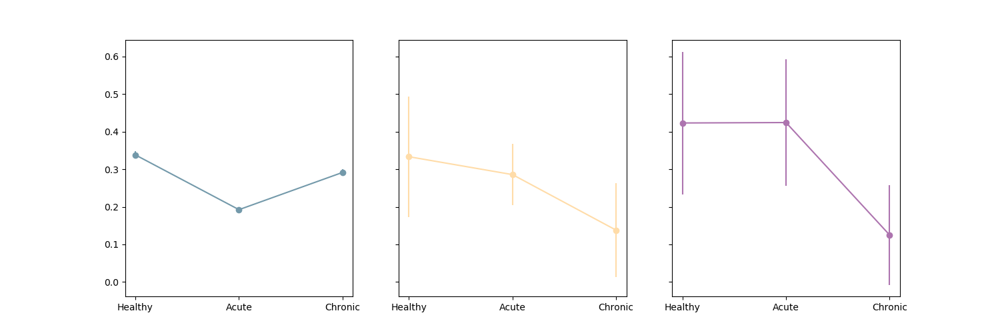

<IPython.core.display.Javascript object>


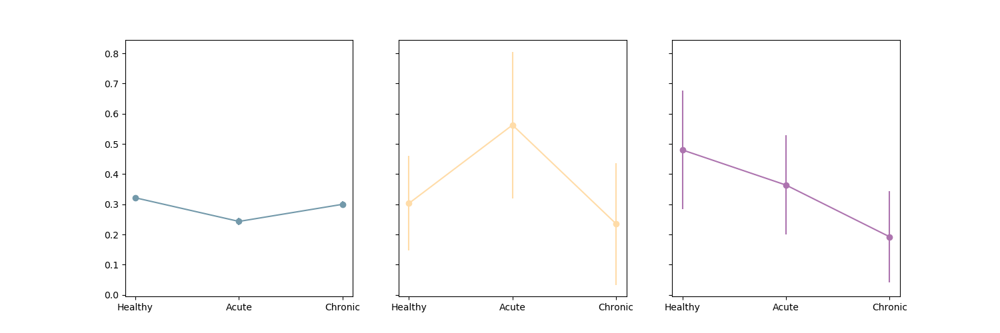

--------------------------------
care CHI
Healthy 1.0 False   11 / 26
Acute 1.0 False   14 / 33
Chronic 0.027721225838554776 False   3 / 24
--------------------------------
care MSN
Healthy 1.0 False   2703 / 7993
Acute 3.786666093020663e-125 True   2654 / 13794
Chronic 8.77819147280068e-11 True   2552 / 8754
--------------------------------
care PV
Healthy 1.0 False   11 / 33
Acute 0.6675298376814107 False   34 / 119
Chronic 0.08476929272555989 False   4 / 29
--------------------------------
care_rot CHI
Healthy 1.0 False   12 / 25
Acute 0.4272059275799674 False   12 / 33
Chronic 0.0398590019038721 False   5 / 26
--------------------------------
care_rot MSN
Healthy 1.0 False   2787 / 8669
Acute 5.037247252243106e-24 True   1363 / 5603
Chronic 0.003084894158631486 True   2310 / 7701
--------------------------------
care_rot PV
Healthy 1.0 False   10 / 33
Acute 0.11922826013032159 False   9 / 16
Chronic 0.7455303938373636 False   4 / 17


In [11]:
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Acute', 'Chronic'])
df['care'] = df.meanR_mvmtOnset.astype('float')
df['care_rot'] = df.meanR_rotOnset.astype('float')

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_mvmtOnset.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2
# fig.savefig(figFolder+'figure3d_mvmt.svg',transparent=True)

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_rot.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_rot.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_rotOnset.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2

N = 2
df4 = pd.DataFrame(columns = ['mvmt','CellType','Period','oddsRatio','pValue_corrected'])
for sig in ['care','care_rot']:
    for cell in df.CellType.unique():
        print('--------------------------------')
        print(sig,cell)
        df3 = df[(df.CellType ==cell)]
        dfHealthy = df3[df3.Period == 'Healthy']
        yesVals = []
        noValse = []
        for period in df3.Period.unique():
            dfComp = df3[df3.Period == period]
            oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True][sig].count(), dfHealthy[dfHealthy[sig] == False][sig].count()], [dfComp[dfComp[sig] == True][sig].count(), dfComp[dfComp[sig] == False][sig].count()]])
            print(period,pvalue, pvalue<0.05/(N)," ",dfComp[dfComp[sig] == True][sig].count(),'/' ,dfComp[sig].count())
            df4 = df4.append({'mvmt':sig,'CellType':cell,
                              'Period':period,'oddsRatio':oddsratio,
                              'pValue_corrected':pvalue*(N-1),
                              'healthy_all':dfHealthy[sig].count(),
                              'healthy_care':dfHealthy[dfHealthy[sig] == True][sig].count(),
                              'healthy_ratio':dfHealthy[dfHealthy[sig] == True][sig].count()/dfHealthy[sig].count(),
                              'period_all':dfComp[sig].count(),'period_care':dfComp[dfComp[sig] == True][sig].count(),
                              'period_ratio':dfComp[dfComp[sig] == True][sig].count()/dfComp[sig].count()},ignore_index = True)


In [479]:
f = h5py.File('membership4.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
        except:
            print(sess,'mvmt')
            meanR_mvmtOnset = np.nan
            
        try:
            meanR_rotOnset = grp[sess]['rotOnset']['result'].value
        except:
            print(sess,'rot')
            meanR_rotOnset = np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)
f.close()

<ipython-input-479-9266851508ae>:10: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
<ipython-input-479-9266851508ae>:16: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_rotOnset = grp[sess]['rotOnset']['result'].value


0761_day14A mvmt
0761_day35L mvmt
1208_day4 mvmt
1222_day11 rot
1222_day15A mvmt
1222_day15A rot
1222_day20L mvmt
1222_day20L rot
1222_day5 mvmt
1222_day5 rot
1793_BaselineL mvmt
2976_day8 rot
2980_day19L rot
2980_day35L rot
2981_day10 rot
2981_day12 mvmt
2981_day12 rot
2981_day15A rot
2981_day6 rot
2981_day8 rot
4539_BaselineA mvmt
4539_day1 rot
4539_day10 rot
4539_day11 mvmt
4539_day11 rot
4539_day12 mvmt
4539_day12 rot
4539_day13 mvmt
4539_day13 rot
4539_day14 mvmt
4539_day14 rot
4539_day15A mvmt
4539_day2 rot
4539_day3 rot
4539_day30A mvmt
4539_day4 rot
4539_day5 mvmt
4539_day5 rot
4539_day6 rot
4539_day7 rot
4539_day8 rot
4539_day9 rot
7584_day1 rot
7584_day10 rot
7584_day11 rot
7584_day12 mvmt
7584_day12 rot
7584_day15 rot
7584_day2 rot
7584_day3 rot
7584_day4 rot
7584_day5 rot
7584_day6 rot
7584_day7 rot
7584_day8 rot
7584_day9 rot
7909_day1 rot
7909_day10 rot
7909_day11 mvmt
7909_day11 rot
7909_day12 rot
7909_day13 mvmt
7909_day13 rot
7909_day14 rot
7909_day2 rot
7909_day3 rot


--------------------------------
care CHI
Healthy 1.0 False   11 / 26
Acute 1.0 False   14 / 32
Chronic 0.030152867844906325 False   3 / 23
--------------------------------
care MSN
Healthy 1.0 False   2573 / 7433
Acute 1.0627441144294772e-106 True   2627 / 12824
Chronic 1.495292180487775e-09 True   2475 / 8226
--------------------------------
care PV
Healthy 1.0 False   9 / 27
Acute 0.6379074824433157 False   30 / 107
Chronic 0.1118760111906123 False   3 / 23
--------------------------------
care_rot CHI
Healthy 1.0 False   12 / 25
Acute 0.4272059275799674 False   12 / 33
Chronic 0.07176742642160588 False   5 / 25
--------------------------------
care_rot MSN
Healthy 1.0 False   2783 / 8566
Acute 3.0635790018417887e-13 True   1348 / 5073
Chronic 0.011921726910847044 True   2189 / 7152
--------------------------------
care_rot PV
Healthy 1.0 False   10 / 31
Acute 0.08246212758557143 False   8 / 12
Chronic 0.741353493736209 False   4 / 17


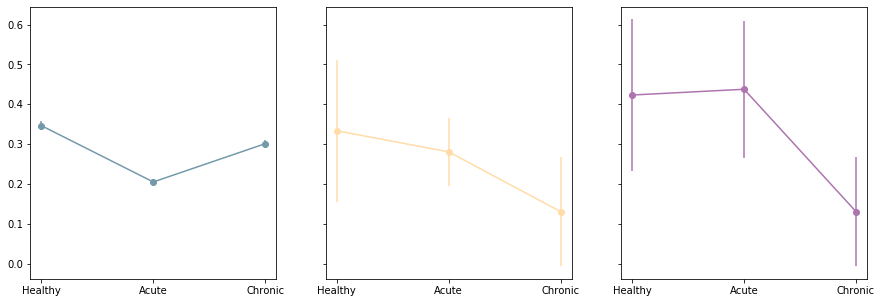

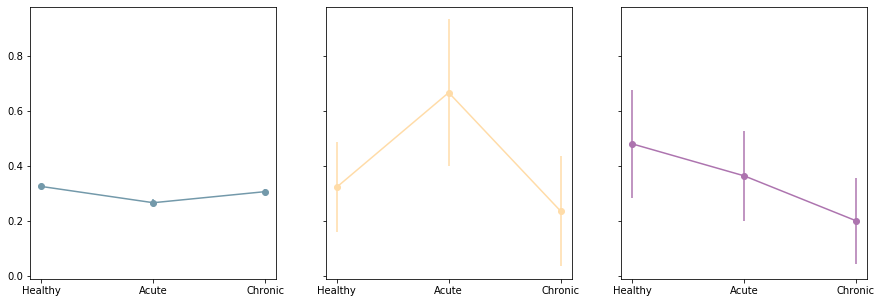

In [480]:
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Acute', 'Chronic'])
df['care'] = df.meanR_mvmtOnset.astype('float')
df['care_rot'] = df.meanR_rotOnset.astype('float')

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_mvmtOnset.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2
# fig.savefig(figFolder+'figure3d_mvmt.svg',transparent=True)

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_rot.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_rot.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_rotOnset.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2

N = 2
df4 = pd.DataFrame(columns = ['mvmt','CellType','Period','oddsRatio','pValue_corrected'])
for sig in ['care','care_rot']:
    for cell in df.CellType.unique():
        print('--------------------------------')
        print(sig,cell)
        df3 = df[(df.CellType ==cell)]
        dfHealthy = df3[df3.Period == 'Healthy']
        yesVals = []
        noValse = []
        for period in df3.Period.unique():
            dfComp = df3[df3.Period == period]
            oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True][sig].count(), dfHealthy[dfHealthy[sig] == False][sig].count()], [dfComp[dfComp[sig] == True][sig].count(), dfComp[dfComp[sig] == False][sig].count()]])
            print(period,pvalue, pvalue<0.05/(N)," ",dfComp[dfComp[sig] == True][sig].count(),'/' ,dfComp[sig].count())
            df4 = df4.append({'mvmt':sig,'CellType':cell,
                              'Period':period,'oddsRatio':oddsratio,
                              'pValue_corrected':pvalue*(N-1),
                              'healthy_all':dfHealthy[sig].count(),
                              'healthy_care':dfHealthy[dfHealthy[sig] == True][sig].count(),
                              'healthy_ratio':dfHealthy[dfHealthy[sig] == True][sig].count()/dfHealthy[sig].count(),
                              'period_all':dfComp[sig].count(),'period_care':dfComp[dfComp[sig] == True][sig].count(),
                              'period_ratio':dfComp[dfComp[sig] == True][sig].count()/dfComp[sig].count()},ignore_index = True)


In [429]:
def perNeuronPerEvent_binary2(aDff,dff,onset,niter,PostS=40):
    PostS=40
    if np.min(dff.shape) ==1:
        aDff = np.reshape(aDff,(aDff.shape[0],1,aDff.shape[1]))
    if np.sum(onset) ==1:
        aDff = np.reshape(aDff,(aDff.shape[0],aDff.shape[1],1))

    nT,nN,nE = aDff.shape
    # if no event in session -> move on...
    if nE == 0:
        return None,None,None
    if onset.ndim ==1:
        onset = np.reshape(onset,(1,onset.shape[0]))


    Th = np.empty((nN,niter))
    # calculate thersholds:
    for itr in range(0,niter):
        shifts = np.random.randint(size=1,low=0,high=onset.shape[1])
        Ons = circShiftRoll(shifts,onset)
        sdff = alignToOnset(dff.T, Ons, winPost=PostS,winPre=PostS)

        # when 1 or movement events -> could end up with no event 2 secounds in -> empty sdff
        while isinstance(sdff,int) or sdff.ndim <3:
            shifts = np.random.randint(size=1,low=0,high=onset.shape[1])
            Ons = circShiftRoll(shifts,onset)
            sdff = alignToOnset(dff.T, Ons, winPost=PostS,winPre=preS)
            try:
                if sdff.size ==0:
                    sdff = 0    
                    continue
                if nN ==1:
                    sdff = np.reshape(sdff,(sdff.shape[0],1,sdff.shape[1]))
                if nE ==1: 
                    sdff = np.reshape(sdff,(sdff.shape[0],sdff.shape[1],1))
            except: 
                sdff = 1;



        # if sdff contain negative value, shift entire session up
        # calculate the means
        muPost = np.sum(sdff[int(nT/2):,:,:],axis=0)
        sdff = np.mean(muPost>0,axis=1)
        Th[:,itr] = sdff

    Th = np.percentile(Th,95,axis=1)

    postPoints = np.sum(aDff[int(nT/2):,:,:],axis=0)
    postPoints = np.mean(postPoints>0,axis=1)

    results = postPoints    
#    print(nE,nN,Th.shape,results.shape)
    return (results>Th),results,Th

In [430]:
# only needs to run once... 
from numpy import matlib
niter = 10000
PostS=40
preS = 40
f = h5py.File('membership_binary2.hdf5','a')
miceList = getMiceList(Files[0])
faild = []
for m in tqdm(miceList):
    data = getData(Files[1],['trace'],period ='Pre', mice=m)
    try:
        grp = f.create_group(m)
    except: 
        grp = f[m]
    
    for sess in tqdm(data.keys()):
        try: 
            sgrp = grp[sess]
        except: 
            sgrp = grp.create_group(sess)
        try: 
            subgroup = sgrp.create_group('mvmtOnset')
            subgroup2 = sgrp.create_group('ipsiOnset')
            subgroup3 = sgrp.create_group('contraOnset')
            subgroup4 = sgrp.create_group('rotOnset')
        except:
            subgroup = sgrp['mvmtOnset']
            subgroup2 = sgrp['ipsiOnset']
            subgroup3 = sgrp['contraOnset']
            subgroup4 = sgrp['rotOnset']

        dff = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')     
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','mvmtOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent_binary2(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup['result'] = result
            subgroup['rawResults'] = rawResults
            subgroup['Th'] = Th
        
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent_binary2(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup3['result'] = result
            subgroup3['rawResults'] = rawResults
            subgroup3['Th'] = Th
        
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent_binary2(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup2['result'] = result
            subgroup2['rawResults'] = rawResults
            subgroup2['Th'] = Th
        
        mvmtOnseti = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset2')
        mvmtOnsetc = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset2')
        mvmtOnset = mvmtOnseti + mvmtOnsetc
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent_binary2(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup4['result'] = result
            subgroup4['rawResults'] = rawResults
            subgroup4['Th'] = Th
#       except: 
#        faild.append(sess)
#    print(result.shape)
f.close() 

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


cleaning up trace data



 14%|███████████▊                                                                       | 2/14 [01:19<07:54, 39.52s/it]C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\_methods.py:162: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/17 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



100%|███████████████████████████████████████████████████████████████████████████████| 16/16 [2:47:32<00:00, 628.27s/it]


In [431]:
f = h5py.File('membership_binary2.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
        except:
            print(sess,'mvmt')
            meanR_mvmtOnset = np.nan
            
        try:
            meanR_rotOnset = grp[sess]['rotOnset']['result'].value
        except:
            print(sess,'rot')
            meanR_rotOnset = np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)
f.close()

<ipython-input-431-cd15fa45de85>:10: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
<ipython-input-431-cd15fa45de85>:16: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_rotOnset = grp[sess]['rotOnset']['result'].value


0761_day14A mvmt
0761_day35L mvmt
1208_day4 mvmt
1222_day11 rot
1222_day15A mvmt
1222_day15A rot
1222_day20L mvmt
1222_day20L rot
1222_day5 mvmt
1222_day5 rot
1793_BaselineL mvmt
2976_day8 rot
2980_day19L rot
2980_day35L rot
2981_day10 rot
2981_day12 mvmt
2981_day12 rot
2981_day15A rot
2981_day6 rot
2981_day8 rot
4539_BaselineA mvmt
4539_day1 rot
4539_day10 rot
4539_day11 mvmt
4539_day11 rot
4539_day12 mvmt
4539_day12 rot
4539_day13 mvmt
4539_day13 rot
4539_day14 mvmt
4539_day14 rot
4539_day15A mvmt
4539_day2 rot
4539_day3 rot
4539_day30A mvmt
4539_day4 rot
4539_day5 mvmt
4539_day5 rot
4539_day6 rot
4539_day7 rot
4539_day8 rot
4539_day9 rot
7584_day1 rot
7584_day10 rot
7584_day11 rot
7584_day12 mvmt
7584_day12 rot
7584_day15 rot
7584_day2 rot
7584_day3 rot
7584_day4 rot
7584_day5 rot
7584_day6 rot
7584_day7 rot
7584_day8 rot
7584_day9 rot
7909_day1 rot
7909_day10 rot
7909_day11 mvmt
7909_day11 rot
7909_day12 rot
7909_day13 mvmt
7909_day13 rot
7909_day14 rot
7909_day2 rot
7909_day3 rot


--------------------------------
care CHI
Healthy 1.0 False   3 / 26
Acute 0.31609588233907704 False   1 / 32
Chronic 1.0 False   3 / 23
--------------------------------
care MSN
Healthy 1.0 False   904 / 7433
Acute 1.9588696316617073e-50 True   774 / 12824
Chronic 0.09538232780282303 False   929 / 8226
--------------------------------
care PV
Healthy 1.0 False   1 / 27
Acute 0.49376919231593036 False   2 / 107
Chronic 1.0 False   1 / 23
--------------------------------
care_rot CHI
Healthy 1.0 False   1 / 25
Acute 0.4310344827586205 False   0 / 33
Chronic 1.0 False   1 / 25
--------------------------------
care_rot MSN
Healthy 1.0 False   724 / 8566
Acute 2.4270092986128508e-05 True   328 / 5073
Chronic 1.2907809047909725e-06 True   768 / 7152
--------------------------------
care_rot PV
Healthy 1.0 False   2 / 31
Acute 1.0 False   0 / 12
Chronic 1.0 False   1 / 17


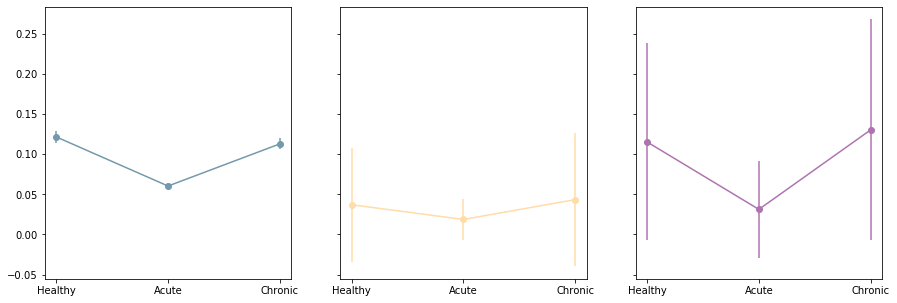

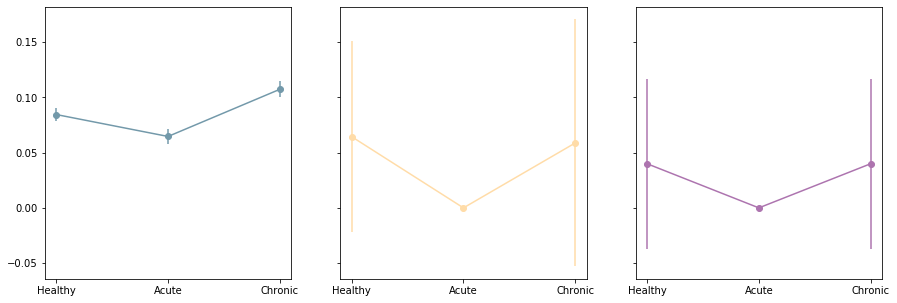

In [432]:
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Acute', 'Chronic'])
df['care'] = df.meanR_mvmtOnset.astype('float')
df['care_rot'] = df.meanR_rotOnset.astype('float')

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_mvmtOnset.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2
# fig.savefig(figFolder+'figure3d_mvmt.svg',transparent=True)

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_rot.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_rot.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_rotOnset.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2

N = 2
df4 = pd.DataFrame(columns = ['mvmt','CellType','Period','oddsRatio','pValue_corrected'])
for sig in ['care','care_rot']:
    for cell in df.CellType.unique():
        print('--------------------------------')
        print(sig,cell)
        df3 = df[(df.CellType ==cell)]
        dfHealthy = df3[df3.Period == 'Healthy']
        yesVals = []
        noValse = []
        for period in df3.Period.unique():
            dfComp = df3[df3.Period == period]
            oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True][sig].count(), dfHealthy[dfHealthy[sig] == False][sig].count()], [dfComp[dfComp[sig] == True][sig].count(), dfComp[dfComp[sig] == False][sig].count()]])
            print(period,pvalue, pvalue<0.05/(N)," ",dfComp[dfComp[sig] == True][sig].count(),'/' ,dfComp[sig].count())
            df4 = df4.append({'mvmt':sig,'CellType':cell,
                              'Period':period,'oddsRatio':oddsratio,
                              'pValue_corrected':pvalue*(N-1),
                              'healthy_all':dfHealthy[sig].count(),
                              'healthy_care':dfHealthy[dfHealthy[sig] == True][sig].count(),
                              'healthy_ratio':dfHealthy[dfHealthy[sig] == True][sig].count()/dfHealthy[sig].count(),
                              'period_all':dfComp[sig].count(),'period_care':dfComp[dfComp[sig] == True][sig].count(),
                              'period_ratio':dfComp[dfComp[sig] == True][sig].count()/dfComp[sig].count()},ignore_index = True)


In [422]:
def perNeuronPerEvent_binary(aDff,dff,onset,niter,PostS=40):
    PostS=40
    if np.min(dff.shape) ==1:
        aDff = np.reshape(aDff,(aDff.shape[0],1,aDff.shape[1]))
    if np.sum(onset) ==1:
        aDff = np.reshape(aDff,(aDff.shape[0],aDff.shape[1],1))

    nT,nN,nE = aDff.shape
    # if no event in session -> move on...
    if nE == 0:
        return None,None,None
    if onset.ndim ==1:
        onset = np.reshape(onset,(1,onset.shape[0]))


    Th = np.empty((nN,niter))
    # calculate thersholds:
    for itr in range(0,niter):
        shifts = np.random.randint(size=1,low=0,high=onset.shape[1])
        Ons = circShiftRoll(shifts,onset)
        sdff = alignToOnset(dff.T, Ons, winPost=PostS,winPre=PostS)

        # when 1 or movement events -> could end up with no event 2 secounds in -> empty sdff
        while isinstance(sdff,int) or sdff.ndim <3:
            shifts = np.random.randint(size=1,low=0,high=onset.shape[1])
            Ons = circShiftRoll(shifts,onset)
            sdff = alignToOnset(dff.T, Ons, winPost=PostS,winPre=preS)
            try:
                if sdff.size ==0:
                    sdff = 0    
                    continue
                if nN ==1:
                    sdff = np.reshape(sdff,(sdff.shape[0],1,sdff.shape[1]))
                if nE ==1: 
                    sdff = np.reshape(sdff,(sdff.shape[0],sdff.shape[1],1))
            except: 
                sdff = 1;



        # if sdff contain negative value, shift entire session up
        # calculate the means
        muPost = np.sum(sdff[int(nT/2):,:,:],axis=0)
        sdff = np.mean(muPost,axis=1)
        Th[:,itr] = sdff

    Th = np.percentile(Th,95,axis=1)

    postPoints = np.sum(aDff[int(nT/2):,:,:],axis=0)
    postPoints = np.mean(postPoints,axis=1)

    results = postPoints    
#    print(nE,nN,Th.shape,results.shape)
    return (results>Th),results,Th

In [423]:
# only needs to run once... 
from numpy import matlib
niter = 10000
PostS=40
preS = 40
f = h5py.File('membership_binery.hdf5','a')
miceList = getMiceList(Files[0])
faild = []
for m in tqdm(miceList):
    data = getData(Files[1],['trace'],period ='Pre', mice=m)
    try:
        grp = f.create_group(m)
    except: 
        grp = f[m]
    
    for sess in tqdm(data.keys()):
        try: 
            sgrp = grp[sess]
        except: 
            sgrp = grp.create_group(sess)
        try: 
            subgroup = sgrp.create_group('mvmtOnset')
            subgroup2 = sgrp.create_group('ipsiOnset')
            subgroup3 = sgrp.create_group('contraOnset')
            subgroup4 = sgrp.create_group('rotOnset')
        except:
            subgroup = sgrp['mvmtOnset']
            subgroup2 = sgrp['ipsiOnset']
            subgroup3 = sgrp['contraOnset']
            subgroup4 = sgrp['rotOnset']

        dff = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')     
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','mvmtOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent_binary(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup['result'] = result
            subgroup['rawResults'] = rawResults
            subgroup['Th'] = Th
        
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent_binary(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup3['result'] = result
            subgroup3['rawResults'] = rawResults
            subgroup3['Th'] = Th
        
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent_binary(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup2['result'] = result
            subgroup2['rawResults'] = rawResults
            subgroup2['Th'] = Th
        
        mvmtOnseti = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset2')
        mvmtOnsetc = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset2')
        mvmtOnset = mvmtOnseti + mvmtOnsetc
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent_binary(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup4['result'] = result
            subgroup4['rawResults'] = rawResults
            subgroup4['Th'] = Th
#       except: 
#        faild.append(sess)
#    print(result.shape)
f.close() 

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


cleaning up trace data



 14%|███████████▊                                                                       | 2/14 [01:20<08:09, 40.79s/it]C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\_methods.py:162: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/17 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



100%|███████████████████████████████████████████████████████████████████████████████| 16/16 [2:47:29<00:00, 628.12s/it]


In [427]:
f = h5py.File('membership_binery.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
        except:
            print(sess,'mvmt')
            meanR_mvmtOnset = np.nan
            
        try:
            meanR_rotOnset = grp[sess]['rotOnset']['result'].value
        except:
            print(sess,'rot')
            meanR_rotOnset = np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)
f.close()

<ipython-input-427-970f6a52a5b1>:10: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
<ipython-input-427-970f6a52a5b1>:16: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_rotOnset = grp[sess]['rotOnset']['result'].value


0761_day14A mvmt
0761_day35L mvmt
1208_day4 mvmt
1222_day11 rot
1222_day15A mvmt
1222_day15A rot
1222_day20L mvmt
1222_day20L rot
1222_day5 mvmt
1222_day5 rot
1793_BaselineL mvmt
2976_day8 rot
2980_day19L rot
2980_day35L rot
2981_day10 rot
2981_day12 mvmt
2981_day12 rot
2981_day15A rot
2981_day6 rot
2981_day8 rot
4539_BaselineA mvmt
4539_day1 rot
4539_day10 rot
4539_day11 mvmt
4539_day11 rot
4539_day12 mvmt
4539_day12 rot
4539_day13 mvmt
4539_day13 rot
4539_day14 mvmt
4539_day14 rot
4539_day15A mvmt
4539_day2 rot
4539_day3 rot
4539_day30A mvmt
4539_day4 rot
4539_day5 mvmt
4539_day5 rot
4539_day6 rot
4539_day7 rot
4539_day8 rot
4539_day9 rot
7584_day1 rot
7584_day10 rot
7584_day11 rot
7584_day12 mvmt
7584_day12 rot
7584_day15 rot
7584_day2 rot
7584_day3 rot
7584_day4 rot
7584_day5 rot
7584_day6 rot
7584_day7 rot
7584_day8 rot
7584_day9 rot
7909_day1 rot
7909_day10 rot
7909_day11 mvmt
7909_day11 rot
7909_day12 rot
7909_day13 mvmt
7909_day13 rot
7909_day14 rot
7909_day2 rot
7909_day3 rot


--------------------------------
care CHI
Healthy 1.0 False   2 / 26
Acute 0.5820585947627682 False   1 / 32
Chronic 0.40023881893182855 False   4 / 23
--------------------------------
care MSN
Healthy 1.0 False   1075 / 7433
Acute 7.609468725354169e-46 True   1030 / 12824
Chronic 0.5676717127989768 False   1163 / 8226
--------------------------------
care PV
Healthy 1.0 False   4 / 27
Acute 0.23109078786390494 False   7 / 107
Chronic 0.6740121580547085 False   2 / 23
--------------------------------
care_rot CHI
Healthy 1.0 False   0 / 25
Acute 1.0 False   0 / 33
Chronic 0.23469387755102084 False   3 / 25
--------------------------------
care_rot MSN
Healthy 1.0 False   933 / 8566
Acute 0.018843313087852566 True   488 / 5073
Chronic 4.5248972685826636e-13 True   1056 / 7152
--------------------------------
care_rot PV
Healthy 1.0 False   2 / 31
Acute 1.0 False   0 / 12
Chronic 0.6072823517319363 False   2 / 17


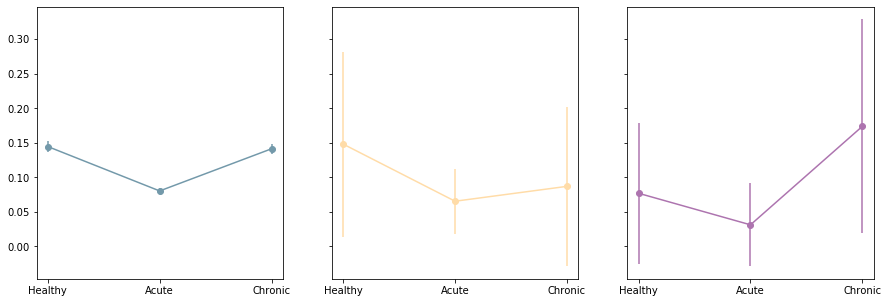

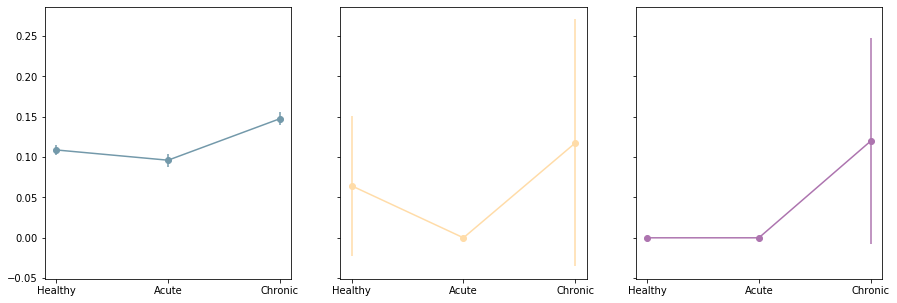

In [428]:
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Acute', 'Chronic'])
df['care'] = df.meanR_mvmtOnset.astype('float')
df['care_rot'] = df.meanR_rotOnset.astype('float')

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_mvmtOnset.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2
# fig.savefig(figFolder+'figure3d_mvmt.svg',transparent=True)

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_rot.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_rot.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_rotOnset.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2

N = 2
df4 = pd.DataFrame(columns = ['mvmt','CellType','Period','oddsRatio','pValue_corrected'])
for sig in ['care','care_rot']:
    for cell in df.CellType.unique():
        print('--------------------------------')
        print(sig,cell)
        df3 = df[(df.CellType ==cell)]
        dfHealthy = df3[df3.Period == 'Healthy']
        yesVals = []
        noValse = []
        for period in df3.Period.unique():
            dfComp = df3[df3.Period == period]
            oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True][sig].count(), dfHealthy[dfHealthy[sig] == False][sig].count()], [dfComp[dfComp[sig] == True][sig].count(), dfComp[dfComp[sig] == False][sig].count()]])
            print(period,pvalue, pvalue<0.05/(N)," ",dfComp[dfComp[sig] == True][sig].count(),'/' ,dfComp[sig].count())
            df4 = df4.append({'mvmt':sig,'CellType':cell,
                              'Period':period,'oddsRatio':oddsratio,
                              'pValue_corrected':pvalue*(N-1),
                              'healthy_all':dfHealthy[sig].count(),
                              'healthy_care':dfHealthy[dfHealthy[sig] == True][sig].count(),
                              'healthy_ratio':dfHealthy[dfHealthy[sig] == True][sig].count()/dfHealthy[sig].count(),
                              'period_all':dfComp[sig].count(),'period_care':dfComp[dfComp[sig] == True][sig].count(),
                              'period_ratio':dfComp[dfComp[sig] == True][sig].count()/dfComp[sig].count()},ignore_index = True)


In [415]:
def perNeuronPerEvent2(aDff,dff,onset,niter,PostS=40,preS=40):
    if np.min(dff.shape) ==1:
        aDff = np.reshape(aDff,(aDff.shape[0],1,aDff.shape[1]))
    if np.sum(onset) ==1:
        aDff = np.reshape(aDff,(aDff.shape[0],aDff.shape[1],1))
        
    nT,nN,nE = aDff.shape
    # if no event in session -> move on...
    if nE == 0:
        return None,None,None
    if onset.ndim ==1:
        onset = np.reshape(onset,(1,onset.shape[0]))
    
        
    Th = np.empty((nN,niter))
    # calculate thersholds:
    for itr in range(0,niter):
        shifts = np.random.randint(size=1,low=0,high=onset.shape[1])
        Ons = circShiftRoll(shifts,onset)
        sdff = alignToOnset(dff.T, Ons, winPost=PostS,winPre=preS)
            
        # when 1 or movement events -> could end up with no event 2 secounds in -> empty sdff
        while isinstance(sdff,int) or sdff.ndim <3:
            shifts = np.random.randint(size=1,low=0,high=onset.shape[1])
            Ons = circShiftRoll(shifts,onset)
            sdff = alignToOnset(dff.T, Ons, winPost=PostS,winPre=preS)
            try:
                if sdff.size ==0:
                    sdff = 0    
                    continue
                if nN ==1:
                    sdff = np.reshape(sdff,(sdff.shape[0],1,sdff.shape[1]))
                if nE ==1: 
                    sdff = np.reshape(sdff,(sdff.shape[0],sdff.shape[1],1))
            except: 
                sdff = 1;



        # if sdff contain negative value, shift entire session up
        mins = np.min(sdff,axis=0)
        sdff[:,mins<0] =sdff[:,mins<0]+np.abs(mins[mins<0])
        # calculate the means
        sdff = np.mean(sdff,axis=2)
        muPre = np.mean(sdff[:int(nT/2),:],axis=0)
        muPost = np.mean(sdff[int(nT/2):,:],axis=0)
        ra = muPost/muPre  
        Th[:,itr] = ra

    Th = np.percentile(Th,95,axis=1)

    mins = np.min(aDff,axis=0)
    aDff[:,mins<0] =aDff[:,mins<0]+np.abs(mins[mins<0])
    aDff = np.mean(aDff,axis=2)
    prePoints = aDff[:int(nT/2),:]
    postPoints = aDff[int(nT/2):,:]

    muPre = np.mean(prePoints,axis=0)
    muPost = np.mean(postPoints,axis=0)
    results = muPost/muPre    
#    print(nE,nN,Th.shape,results.shape)
    return (results>Th),results,Th

In [419]:
# only needs to run once... 
from numpy import matlib
niter = 10000
PostS=40
preS = 40
f = h5py.File('membership3.hdf5','a')
miceList = getMiceList(Files[0])
faild = []
for m in tqdm(miceList):
    data = getData(Files[1],['trace'],period ='Pre', mice=m)
    try:
        grp = f.create_group(m)
    except: 
        grp = f[m]
    
    for sess in tqdm(data.keys()):
        try: 
            sgrp = grp[sess]
        except: 
            sgrp = grp.create_group(sess)
        try: 
            subgroup = sgrp.create_group('mvmtOnset')
            subgroup2 = sgrp.create_group('ipsiOnset')
            subgroup3 = sgrp.create_group('contraOnset')
            subgroup4 = sgrp.create_group('rotOnset')
        except:
            subgroup = sgrp['mvmtOnset']
            subgroup2 = sgrp['ipsiOnset']
            subgroup3 = sgrp['contraOnset']
            subgroup4 = sgrp['rotOnset']

        dff = data[sess]['trace']['dff']
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','mvmtOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent2(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup['result'] = result
            subgroup['rawResults'] = rawResults
            subgroup['Th'] = Th
        
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent2(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup3['result'] = result
            subgroup3['rawResults'] = rawResults
            subgroup3['Th'] = Th
        
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent2(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup2['result'] = result
            subgroup2['rawResults'] = rawResults
            subgroup2['Th'] = Th
        
        mvmtOnseti = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset2')
        mvmtOnsetc = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset2')
        mvmtOnset = mvmtOnseti + mvmtOnsetc
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent2(aDff,dff,onset,niter)
        if np.sum(onset) > 2:
            subgroup4['result'] = result
            subgroup4['rawResults'] = rawResults
            subgroup4['Th'] = Th
#       except: 
#        faild.append(sess)
#    print(result.shape)
f.close() 

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


cleaning up trace data



 14%|███████████▊                                                                       | 2/14 [01:44<10:18, 51.50s/it]C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\_methods.py:162: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/17 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data



100%|███████████████████████████████████████████████████████████████████████████████| 16/16 [4:04:47<00:00, 917.95s/it]


In [424]:
f = h5py.File('membership3.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
        except:
            print(sess,'mvmt')
            meanR_mvmtOnset = np.nan
            
        try:
            meanR_rotOnset = grp[sess]['rotOnset']['result'].value
        except:
            print(sess,'rot')
            meanR_rotOnset = np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)
f.close()

<ipython-input-424-f4a5fb78a6b6>:10: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
<ipython-input-424-f4a5fb78a6b6>:16: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_rotOnset = grp[sess]['rotOnset']['result'].value


0761_day14A mvmt
0761_day35L mvmt
1208_day4 mvmt
1222_day11 rot
1222_day15A mvmt
1222_day15A rot
1222_day20L mvmt
1222_day20L rot
1222_day5 mvmt
1222_day5 rot
1793_BaselineL mvmt
2976_day8 rot
2980_day19L rot
2980_day35L rot
2981_day10 rot
2981_day12 mvmt
2981_day12 rot
2981_day15A rot
2981_day6 rot
2981_day8 rot
4539_BaselineA mvmt
4539_day1 rot
4539_day10 rot
4539_day11 mvmt
4539_day11 rot
4539_day12 mvmt
4539_day12 rot
4539_day13 mvmt
4539_day13 rot
4539_day14 mvmt
4539_day14 rot
4539_day15A mvmt
4539_day2 rot
4539_day3 rot
4539_day30A mvmt
4539_day4 rot
4539_day5 mvmt
4539_day5 rot
4539_day6 rot
4539_day7 rot
4539_day8 rot
4539_day9 rot
7584_day1 rot
7584_day10 rot
7584_day11 rot
7584_day12 mvmt
7584_day12 rot
7584_day15 rot
7584_day2 rot
7584_day3 rot
7584_day4 rot
7584_day5 rot
7584_day6 rot
7584_day7 rot
7584_day8 rot
7584_day9 rot
7909_day1 rot
7909_day10 rot
7909_day11 mvmt
7909_day11 rot
7909_day12 rot
7909_day13 mvmt
7909_day13 rot
7909_day14 rot
7909_day2 rot
7909_day3 rot


--------------------------------
care CHI
Healthy 1.0 False   3 / 26
Acute 0.002179913702347391 True   16 / 32
Chronic 1.0 False   3 / 23
--------------------------------
care MSN
Healthy 1.0 False   2060 / 7433
Acute 3.723525000712228e-44 True   2458 / 12824
Chronic 0.0008451346851925151 True   2085 / 8226
--------------------------------
care PV
Healthy 1.0 False   7 / 27
Acute 0.6126261116889852 False   23 / 107
Chronic 1.0 False   6 / 23
--------------------------------
care_rot CHI
Healthy 1.0 False   3 / 25
Acute 0.07174710968430281 False   11 / 33
Chronic 1.0 False   2 / 25
--------------------------------
care_rot MSN
Healthy 1.0 False   1677 / 8566
Acute 1.1912932241248151e-17 True   1314 / 5073
Chronic 2.221562111977541e-12 True   1733 / 7152
--------------------------------
care_rot PV
Healthy 1.0 False   6 / 31
Acute 0.024078568742577227 True   7 / 12
Chronic 0.4856110452350557 False   5 / 17


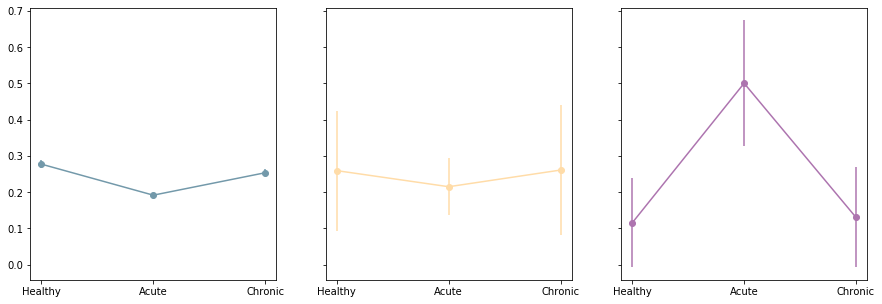

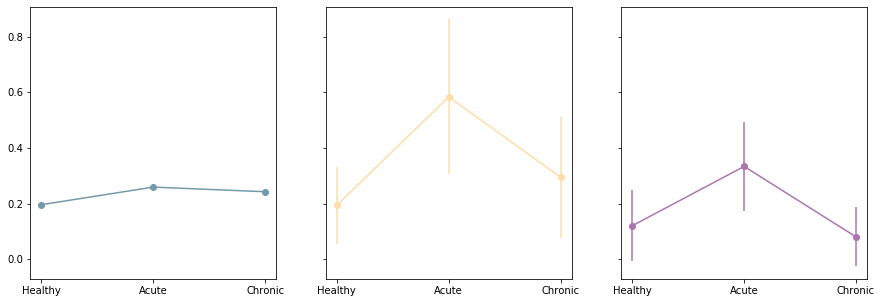

In [425]:
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Acute', 'Chronic'])
df['care'] = df.meanR_mvmtOnset.astype('float')
df['care_rot'] = df.meanR_rotOnset.astype('float')

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_mvmtOnset.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2
# fig.savefig(figFolder+'figure3d_mvmt.svg',transparent=True)

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_rot.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_rot.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_rotOnset.count()
    df2['SEM'] = df2.apply(lambda x: 1.96*np.sqrt(x['mean']*(1-x['mean'])/x['count']),axis=1)
    df2 = df2.reset_index()
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
#     print(df2)
    del df2

N = 2
df4 = pd.DataFrame(columns = ['mvmt','CellType','Period','oddsRatio','pValue_corrected'])
for sig in ['care','care_rot']:
    for cell in df.CellType.unique():
        print('--------------------------------')
        print(sig,cell)
        df3 = df[(df.CellType ==cell)]
        dfHealthy = df3[df3.Period == 'Healthy']
        yesVals = []
        noValse = []
        for period in df3.Period.unique():
            dfComp = df3[df3.Period == period]
            oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True][sig].count(), dfHealthy[dfHealthy[sig] == False][sig].count()], [dfComp[dfComp[sig] == True][sig].count(), dfComp[dfComp[sig] == False][sig].count()]])
            print(period,pvalue, pvalue<0.05/(N)," ",dfComp[dfComp[sig] == True][sig].count(),'/' ,dfComp[sig].count())
            df4 = df4.append({'mvmt':sig,'CellType':cell,
                              'Period':period,'oddsRatio':oddsratio,
                              'pValue_corrected':pvalue*(N-1),
                              'healthy_all':dfHealthy[sig].count(),
                              'healthy_care':dfHealthy[dfHealthy[sig] == True][sig].count(),
                              'healthy_ratio':dfHealthy[dfHealthy[sig] == True][sig].count()/dfHealthy[sig].count(),
                              'period_all':dfComp[sig].count(),'period_care':dfComp[dfComp[sig] == True][sig].count(),
                              'period_ratio':dfComp[dfComp[sig] == True][sig].count()/dfComp[sig].count()},ignore_index = True)


In [264]:
# add Jacakard post L-Dopa
f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','a')
numshifts = 1000
for m in tqdm(miceList):
    grp = f[m]
    data =  getData(Files[1],['trace'],period ='Post', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        subgrp = grp[sess]
        
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred']) 
        
        if sess[-1] == 'S':
            drug = 'Saline'
        elif sess[-1] == 'L':
            drug = 'L-Dopa'
        else:
            drug = 'Amphetamine'

        try:  
            Ca = getOnsetOrPeriod(m,sess,'Post','caOnset_Hf')     
            Ca = Ca[np.sum(Ca,axis=1)>0,:]
            both = np.dot(Ca ,Ca.T) # Do the actual co-occorence matrix not np.corrcoef(Ca)
            x2,y2 = np.meshgrid(np.sum(Ca,axis=1), np.sum(Ca,axis=1))
            either = x2+y2-both
            cor = both/either
            cor[np.isinf(cor)] = 1
            try: 
                ssubgrp = subgrp.create_group('Post')
            except:
                ssubgrp = subgrp['Post']
            ssubgrp.attrs['drug'] = drug
            try:
                del ssubgrp['Jaccard'] 
            except: 
                bs=1
            ssubgrp['Jaccard'] = cor

            sCor = np.empty((cor.shape[0],cor.shape[1],numshifts))
            for s in range(0,numshifts):
                shifts = np.random.randint(size= Ca.shape[0],low=0,high=Ca.shape[1])
                Ca2 = circShiftRoll(shifts,Ca)
                both = np.dot(Ca2 ,Ca2.T) # Do the actual co-occorence matrix not np.corrcoef(Ca)
                x2,y2 = np.meshgrid(np.sum(Ca2,axis=1), np.sum(Ca2,axis=1))
                either = x2+y2-both
                cor = both/either
                cor[np.isinf(cor)] = 1
                sCor[:,:,s] = cor
                
                
           # del ssubgrp['Jaccard_shuffle'] 
            ssubgrp['Jaccard_shuffle'] = sCor
            
            del sCor
        except:
            print(sess)
f.close()

  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 0761_day1
I deleted session: 0761_day10
I deleted session: 0761_day12
I deleted session: 0761_day2
I deleted session: 0761_day4
I deleted session: 0761_day6
I deleted session: 0761_day8



 14%|████████████                                                                        | 1/7 [00:02<00:12,  2.08s/it]

0761_BaselineA



 43%|████████████████████████████████████                                                | 3/7 [00:06<00:08,  2.21s/it]

0761_day14A



  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 1208_day10
I deleted session: 1208_day12
I deleted session: 1208_day14
I deleted session: 1208_day2
I deleted session: 1208_day4
I deleted session: 1208_day6
I deleted session: 1208_day8



  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 1222_day11
I deleted session: 1222_day13
I deleted session: 1222_day2
I deleted session: 1222_day3
I deleted session: 1222_day5
I deleted session: 1222_day7
I deleted session: 1222_day9



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 1236_day1
I deleted session: 1236_day11
I deleted session: 1236_day13
I deleted session: 1236_day3
I deleted session: 1236_day5
I deleted session: 1236_day7
I deleted session: 1236_day9



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 1793_day10
I deleted session: 1793_day12
I deleted session: 1793_day14
I deleted session: 1793_day2
I deleted session: 1793_day4
I deleted session: 1793_day6
I deleted session: 1793_day8



  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 2976_day10
I deleted session: 2976_day12
I deleted session: 2976_day14
I deleted session: 2976_day2
I deleted session: 2976_day4
I deleted session: 2976_day6
I deleted session: 2976_day8



  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 2980_day10
I deleted session: 2980_day12
I deleted session: 2980_day14
I deleted session: 2980_day2
I deleted session: 2980_day4
I deleted session: 2980_day6
I deleted session: 2980_day8



  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 2981_day10
I deleted session: 2981_day12
I deleted session: 2981_day14
I deleted session: 2981_day2
I deleted session: 2981_day4
I deleted session: 2981_day6
I deleted session: 2981_day8



 62%|██████████████████████████████████████████████████▋                              | 10/16 [42:52<28:00, 280.12s/it]

cleaning up trace data
I deleted session: 4539_day0
I deleted session: 4539_day1
I deleted session: 4539_day10
I deleted session: 4539_day11
I deleted session: 4539_day12
I deleted session: 4539_day13
I deleted session: 4539_day14
I deleted session: 4539_day2
I deleted session: 4539_day3


  0%|                                                                                            | 0/4 [00:00<?, ?it/s]


I deleted session: 4539_day4
I deleted session: 4539_day5
I deleted session: 4539_day6
I deleted session: 4539_day7
I deleted session: 4539_day8
I deleted session: 4539_day9



  0%|                                                                                            | 0/2 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 7584_Baseline0
I deleted session: 7584_day0
I deleted session: 7584_day1
I deleted session: 7584_day10
I deleted session: 7584_day11
I deleted session: 7584_day12
I deleted session: 7584_day15
I deleted session: 7584_day2
I deleted session: 7584_day3
I deleted session: 7584_day4
I deleted session: 7584_day5
I deleted session: 7584_day6
I deleted session: 7584_day7
I deleted session: 7584_day8
I deleted session: 7584_day9



  0%|                                                                                            | 0/4 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 7909_day0
I deleted session: 7909_day1
I deleted session: 7909_day10
I deleted session: 7909_day11
I deleted session: 7909_day12
I deleted session: 7909_day13
I deleted session: 7909_day14
I deleted session: 7909_day2
I deleted session: 7909_day3
I deleted session: 7909_day4
I deleted session: 7909_day5
I deleted session: 7909_day6
I deleted session: 7909_day7
I deleted session: 7909_day8
I deleted session: 7909_day9



  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 8430_day1
I deleted session: 8430_day11
I deleted session: 8430_day3
I deleted session: 8430_day5
I deleted session: 8430_day7
I deleted session: 8430_day9



  0%|                                                                                            | 0/6 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 8803_day10
I deleted session: 8803_day12
I deleted session: 8803_day14
I deleted session: 8803_day2
I deleted session: 8803_day4
I deleted session: 8803_day5
I deleted session: 8803_day6
I deleted session: 8803_day8



  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

cleaning up trace data
I deleted session: 8815_day10
I deleted session: 8815_day12
I deleted session: 8815_day14
I deleted session: 8815_day2
I deleted session: 8815_day4
I deleted session: 8815_day6
I deleted session: 8815_day8



100%|███████████████████████████████████████████████████████████████████████████████| 16/16 [1:02:43<00:00, 235.23s/it]


In [278]:
f[m][sess]['Post'].keys()

<KeysViewHDF5 ['Jaccard', 'Jaccard_shuffle']>

In [280]:
# only run once... Also, only Asymm 
f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','Drug','timeRange','population','aSymCorr','sASymCorr']
df = pd.DataFrame(columns = col_names)
for m in f.keys():
    for sess in f[m].keys():
        if 'Post' not in f[m][sess].keys():
            continue
        for per in ["Pre", "Post"]:
            try:
                numred = f[m][sess].attrs['numRed']
                cre = getCreType(Files[1],m)
                tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],'Drug':f[m][sess]['Post'].attrs['drug'],
                            'numred':numred,'Period':f[m][sess].attrs['period'],'timeRange':per}

                c = f[m][sess][per]['Jaccard'][:] 
                c[(np.tril(np.ones(c.shape),-1))==0] = np.nan

                d = f[m][sess][per][('Jaccard_shuffle')][:]
                b = np.nanpercentile(d,[97.5,2.5],axis=2)

                d = np.nanmean(d,axis=2)
                d[np.tril(np.ones(d.shape),-1)==0] = np.nan

                nSig = (c>b[0,:,:])|(c<b[1,:,:])
                cSig = np.copy(c)
                cSig[~nSig] = np.nan
                noSig = np.copy(c)
                noSig[nSig] = np.nan


                if numRed > 1:
                    tempDict['population'] = cre+'-'+cre
                    tempDict['aSymCorr'] = np.nanmean(c[:numred,:numred])
                    tempDict['sASymCorr'] = np.nanmean(d[:numred,:numred])
                    tempDict['aSymCorrSig'] = np.nanmean(cSig[:numred,:numred])
                    tempDict['aSymCorrNotSig'] = np.nanmean(noSig[:numred,:numred])
                    tempDict['sigPercent'] = np.nansum(nSig[:numred,:numred]==1)/np.nansum(np.isnan(c[:numred,:numred])==0)
                    df2 = pd.DataFrame([tempDict])
                    df = pd.concat([df,df2],sort=True)
                if numRed > 0:
                    tempDict['population'] = 'MSN-'+cre
                    tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
                    tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
                    tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred])
                    tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred])
                    tempDict['sigPercent'] = np.nansum(nSig[numred:,:numred]==1)/np.nansum(np.isnan(c[numred:,:numred])==0)
                    df2 = pd.DataFrame([tempDict])
                    df = pd.concat([df,df2],sort=True)

                tempDict['population'] = 'MSN-MSN'
                tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
                tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
                tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,numred:])
                tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,numred:])
                tempDict['sigPercent'] = np.nansum(nSig[numred:,numred:]==1)/np.nansum(np.isnan(c[numred:,numred:])==0)
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)

            
            except Exception as e:
                exc_type, exc_obj, exc_tb = sys.exc_info()
                print(sess,exc_tb.tb_lineno)
f.close()
df.to_csv('bySessCompareCorr2_post.csv')

<ipython-input-280-cf908cd3325b>:45: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred])
<ipython-input-280-cf908cd3325b>:54: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,numred:])
<ipython-input-280-cf908cd3325b>:43: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
<ipython-input-280-cf908cd3325b>:44: RuntimeWarning: Mean of empty slice
  tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
<ipython-input-280-cf908cd3325b>:46: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred])
<ipython-input-280-cf908cd3325b>:47: RuntimeWarning: invalid value encountered in long_scalars
  tempDict['sigPercent'] = np.nansum(nSig[numred:,:numred]==1)/np.nansum(np.isnan(c[numred:,:numred])==0)


0761_day14A 19


<ipython-input-280-cf908cd3325b>:55: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,numred:])
<ipython-input-280-cf908cd3325b>:52: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
<ipython-input-280-cf908cd3325b>:53: RuntimeWarning: Mean of empty slice
  tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
<ipython-input-280-cf908cd3325b>:56: RuntimeWarning: invalid value encountered in long_scalars
  tempDict['sigPercent'] = np.nansum(nSig[numred:,numred:]==1)/np.nansum(np.isnan(c[numred:,numred:])==0)


In [ ]:
# only run once... Also, only Asymm 
f = h5py.File('J:\\connactivityAnalysis\\connMapsMvmt.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','population','mvmt']
df = pd.DataFrame(columns = col_names)
for m in tqdm(f.keys()):
    cre = getCreType(Files[1],m)
    for sess in f[m].keys():
        for mvmt in f[m][sess]['Pre'].keys():
            try:
                numred = f[m][sess].attrs['numRed']
                tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
                                    'numred':numred,'Period':periodCalc(f[m][sess].attrs['day'])}

                c = f[m][sess]['Pre'][mvmt]['Jaccard'].value
                c[(np.tril(np.ones(c.shape),-1))==0] = np.nan

                d = f[m][sess]['Pre'][mvmt][('Jaccard_shuffle')].value
                b = np.nanpercentile(d,[97.5,2.5],axis=2)

                d = np.nanmean(d,axis=2)
                d[np.tril(np.ones(d.shape),-1)==0] = np.nan

                nSig = (c>b[0,:,:])|(c<b[1,:,:])
                cSig = np.copy(c)
                cSig[~nSig] = np.nan
                noSig = np.copy(c)
                noSig[nSig] = np.nan

                if numred > 0:
                    tempDict['population'] = 'MSN-'+cre
                    tempDict['mvmt'] = mvmt
                    tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred],axis=0).flatten()
                    tempDict['sASymCorr'] =np.nanmean(b[0,numred:,:numred],axis=0).flatten()
                    tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred],axis=0).flatten()
                    tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred],axis=0).flatten()

                    df2 = pd.DataFrame(tempDict)
                    df = pd.concat([df,df2],sort=True)


            except Exception as e:
                exc_type, exc_obj, exc_tb = sys.exc_info()
                print(sess,  exc_tb.tb_lineno,c.shape)
f.close()
df.to_csv(figFolder+'mvmtCorrSig_cell2.csv')
# df3.to_csv(figFolder+'bySessCompareCorr2Sig_hists.csv')

In [ ]:
# only run once... Also, only Asymm 
f = h5py.File('J:\\connactivityAnalysis\\connMapsMvmt.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','population','mvmt']
df = pd.DataFrame(columns = col_names)
for m in tqdm(f.keys()):
    cre = getCreType(Files[1],m)
    for sess in f[m].keys():
        for mvmt in f[m][sess]['Pre'].keys():
            try:
                numred = f[m][sess].attrs['numRed']
                tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
                                    'numred':numred,'Period':periodCalc(f[m][sess].attrs['day'])}

                c = f[m][sess]['Pre'][mvmt]['Jaccard'].value
                c[(np.tril(np.ones(c.shape),-1))==0] = np.nan

                d = f[m][sess]['Pre'][mvmt][('Jaccard_shuffle')].value
                b = np.nanpercentile(d,[97.5,2.5],axis=2)

                d = np.nanmean(d,axis=2)
                d[np.tril(np.ones(d.shape),-1)==0] = np.nan

                nSig = (c>b[0,:,:])|(c<b[1,:,:])
                cSig = np.copy(c)
                cSig[~nSig] = np.nan
                noSig = np.copy(c)
                noSig[nSig] = np.nan

                if numred > 0:
                    tempDict['population'] = 'MSN-'+cre
                    tempDict['mvmt'] = mvmt
                    tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred],axis=0).flatten()
                    tempDict['sASymCorr'] =np.nanmean(b[0,numred:,:numred],axis=0).flatten()
                    tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred],axis=0).flatten()
                    tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred],axis=0).flatten()

                    df2 = pd.DataFrame(tempDict)
                    df = pd.concat([df,df2],sort=True)


            except Exception as e:
                exc_type, exc_obj, exc_tb = sys.exc_info()
                print(sess,  exc_tb.tb_lineno,c.shape)
f.close()
df.to_csv(figFolder+'mvmtCorrSig_cell2.csv')
# df3.to_csv(figFolder+'bySessCompareCorr2Sig_hists.csv')

In [242]:
# only run once... Also, only Asymm 
f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','population','aSymCorr','sASymCorr']
df = pd.DataFrame(columns = col_names)
for m in tqdm(f.keys()):
    cre = getCreType(Files[1],m)
    for sess in f[m].keys():
        try:
            numred = f[m][sess].attrs['numRed']
            tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
                                'numred':numred,'Period':periodCalc(f[m][sess].attrs['day'])}

            c = f[m][sess]['Pre']['Jaccard'].value 
            c[(np.tril(np.ones(c.shape),-1))==0] = np.nan

            d = f[m][sess]['Pre'][('Jaccard_shuffle')].value
            b = np.nanpercentile(d,[97.5,2.5],axis=2)

            d = np.nanmean(d,axis=2)
            d[np.tril(np.ones(d.shape),-1)==0] = np.nan

            nSig = (c>b[0,:,:])|(c<b[1,:,:])
            cSig = np.copy(c)
            cSig[~nSig] = np.nan
            noSig = np.copy(c)
            noSig[nSig] = np.nan

            if numred > 0:
                tempDict['population'] = 'MSN-'+cre
                tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred],axis=0).flatten()
                tempDict['sASymCorr'] =np.nanmean(b[0,numred:,:numred],axis=0).flatten()
                tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred],axis=0).flatten()
                tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred],axis=0).flatten()
                
                df2 = pd.DataFrame(tempDict)
                df = pd.concat([df,df2],sort=True)


        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,  exc_tb.tb_lineno,c.shape)
f.close()
df.to_csv(figFolder+'bySessCompareCorr2Sig_cell2.csv')
# df3.to_csv(figFolder+'bySessCompareCorr2Sig_hists.csv')

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]<ipython-input-242-e381c6459cda>:13: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  c = f[m][sess]['Pre']['Jaccard'].value
<ipython-input-242-e381c6459cda>:16: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  d = f[m][sess]['Pre'][('Jaccard_shuffle')].value
<ipython-input-242-e381c6459cda>:19: RuntimeWarning: Mean of empty slice
  d = np.nanmean(d,axis=2)
<ipython-input-242-e381c6459cda>:32: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrSig'] = np.nanmean(cSig[numred:,:numred],axis=0).flatten()


0761_day1 22 (0, 0)


 75%|█████████████████████████████████████████████████████████████▌                    | 12/16 [09:11<06:21, 95.40s/it]<ipython-input-242-e381c6459cda>:30: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred],axis=0).flatten()
<ipython-input-242-e381c6459cda>:31: RuntimeWarning: Mean of empty slice
  tempDict['sASymCorr'] =np.nanmean(b[0,numred:,:numred],axis=0).flatten()
<ipython-input-242-e381c6459cda>:33: RuntimeWarning: Mean of empty slice
  tempDict['aSymCorrNotSig'] = np.nanmean(noSig[numred:,:numred],axis=0).flatten()
100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [10:39<00:00, 39.99s/it]


<IPython.core.display.Javascript object>


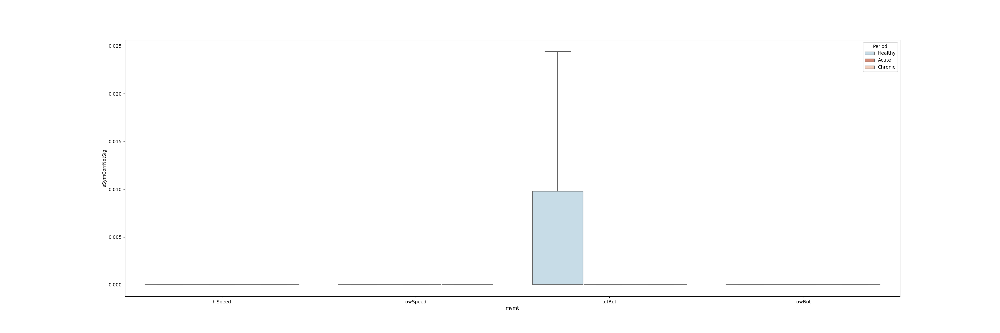

<IPython.core.display.Javascript object>


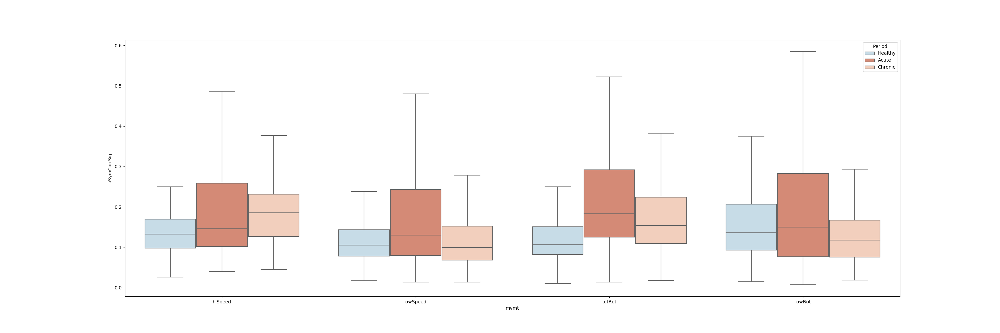

In [237]:
df = pd.read_csv(figFolder+ 'mvmtCorrSig_cell.csv')
for col in ["aSymCorrNotSig","aSymCorrSig"]:
    fig, ax  = plt.subplots(1,1,figsize=(30, 10),sharey = True)
    indF = 0;
#     for mvmt in df.mvmt.unique():
    with sns.color_palette(colorPallet3):
        sns.boxplot(x = 'mvmt' ,hue="Period", y=col,#ax = ax[indF],
                    data=df[(df.population == "MSN-CHI")],
                    hue_order = ['Healthy', 'Acute', 'Chronic'], order = ['hiSpeed', 'lowSpeed', 'totRot','lowRot'],
                    showfliers = False)
#         ax[indF].set_title(mvmt)
        indF = indF + 1
    # fig.savefig(figFolder+'figureS5.svg',format='svg')
    # ax[0].set_ylim(-0.2,0.4)
#     fig.savefig(figFolder+'figureS5_'+col+'_Jaccard_noFliers_CHI.svg',format='svg')
    # fig, ax  = plt.subplots(1,5,figsize=(30, 10),sharey = True)
    # indF = 0;
    # for p in df.Period.unique():

#     sns.boxplot(x="mvmt", y="aSymCorr",ax = ax[indF],data=df[(df.population == "MSN-MSN")&(df.Period == p)], order = ['hiSpeed', 'lowSpeed', 'lowRot', 'highIpsi', 'highContra'], showfliers = False)
#     ax[indF].set_title(p)
#     indF = indF + 1


<IPython.core.display.Javascript object>


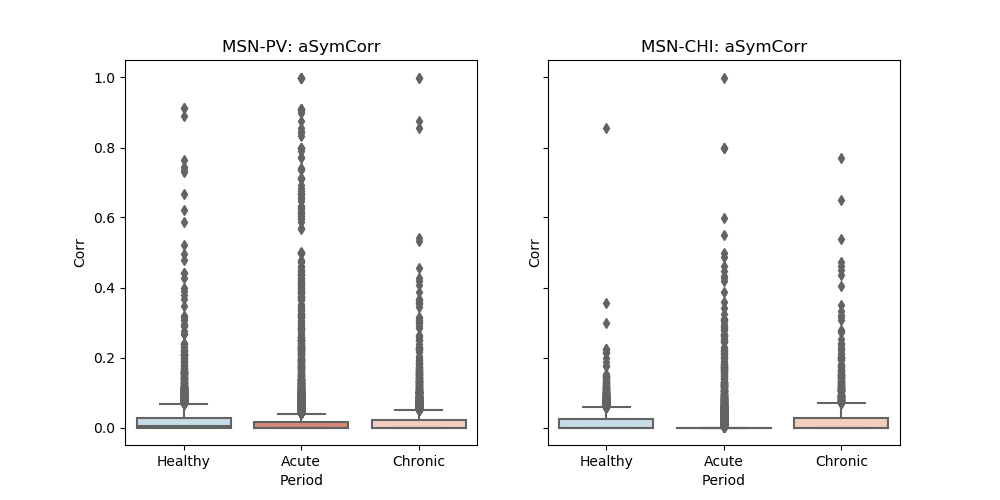

<IPython.core.display.Javascript object>


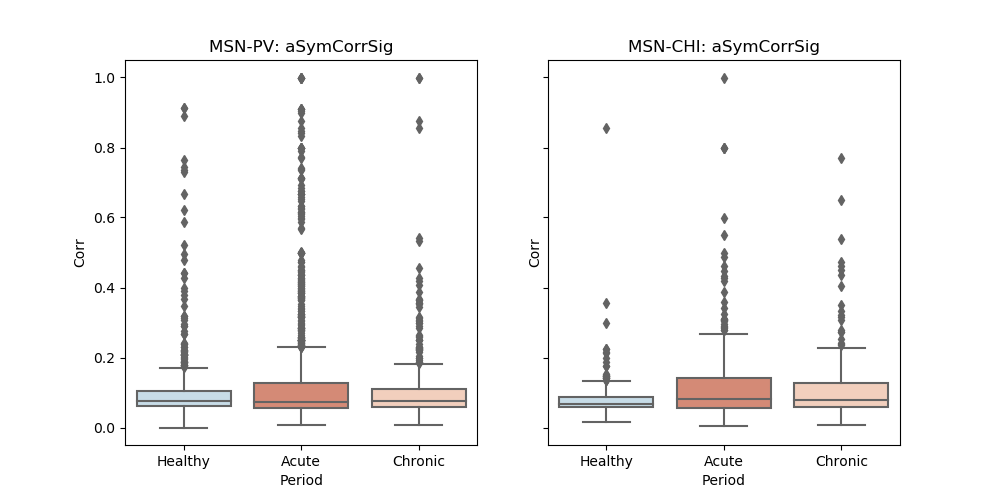

<IPython.core.display.Javascript object>


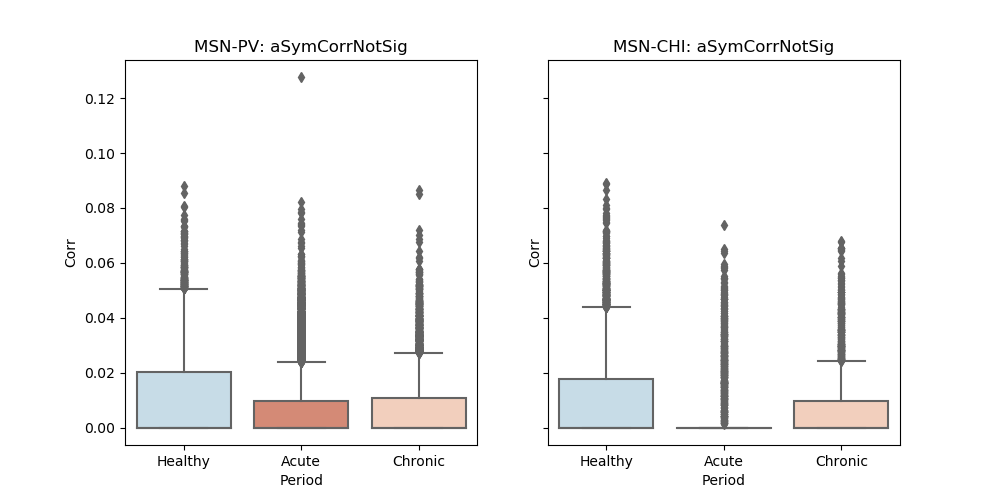

In [234]:
df = pd.read_csv(figFolder+ 'bySessCompareCorr2Sig_cell.csv')

df2 = df.melt(id_vars = ['Mouse','Period','population'],value_vars=["aSymCorr","aSymCorrSig",'aSymCorrNotSig'],
                         var_name='varType', value_name='Corr')#.groupby(['Period','Sess','population','varType']).mean()
df2.reset_index(inplace=True)
pOrder = ['Healthy', 'Acute', 'Chronic']

for col in ["aSymCorr","aSymCorrSig",'aSymCorrNotSig']:
    fig, ax = plt.subplots(1,2,figsize=(10,5), sharey=True)
    with sns.color_palette(colorPallet3):
        g = sns.boxplot(x="Period", y="Corr", ax = ax[0], data=df2[(df2.population=='MSN-PV')&(df2.varType==col)],
                        order =  pOrder, showfliers = True)
        ax[0].set_title('MSN-PV: '+col)
        g = sns.boxplot(x="Period", y="Corr", ax = ax[1], data=df2[(df2.population=='MSN-CHI')&(df2.varType==col)],
                        order =  pOrder, showfliers = True)
        ax[1].set_title('MSN-CHI: '+col)
    #g = sns.boxplot(x="Period", y="Corr", hue="varType", data=df2[(df2.population=='MSN-MSN')&(df2.varType=='personF')], order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])
#     ax[0].set_ylim(-0.01,0.25)
#     fig.savefig(figFolder+'figure4a_3_'+col+'.svg',transparent=True)


In [240]:
# f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','r')
# col_names = ['Mouse','Sess','Day','numred','Period','population','aSymCorr','sASymCorr']
df = pd.DataFrame(columns = col_names)
# m = '1208'
# sess = '1208_BaselineL'
# numred = f[m][sess].attrs['numRed']
# tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
#                     'numred':numred,'Period':periodCalc(f[m][sess].attrs['day'])}

# c = f[m][sess]['Pre']['Jaccard'].value 
# c[(np.tril(np.ones(c.shape),-1))==0] = np.nan

# d = f[m][sess]['Pre'][('Jaccard_shuffle')].value
# b = np.nanpercentile(d,[97.5,2.5],axis=2)

# d = np.nanmean(d,axis=2)
# d[np.tril(np.ones(d.shape),-1)==0] = np.nan

# nSig = (c>b[0,:,:])|(c<b[1,:,:])
# cSig = np.copy(c)
# cSig[~nSig] = np.nan
# noSig = np.copy(c)
# noSig[nSig] = np.nan
# f.close()
numred=2
# tempDict['population'] = 'MSN-'+cre
# tempDict['aSymCorr'] = c[numred:,:numred].flatten()
# tempDict['sASymCorr'] =b[0,numred:,:numred].flatten()
# tempDict['aSymCorrSig'] = cSig[numred:,:numred].flatten()
# tempDict['aSymCorrNotSig'] = noSig[numred:,:numred].flatten()
# df2 = pd.DataFrame(tempDict)
# df = pd.concat([df,df2],sort=True)
# d
np.nanmean(c[numred:,:numred],axis=0).flatten()

array([0., 0.])

In [10]:
# plot Get statistics for Gamma Power
df = pd.read_csv('J:\\lfp2ca_notNormalize\\sessions')
savePath = 'J:\\lfp2ca_notNormalize\\'
Pdf = pd.DataFrame(columns = ['Mouse','Period','Sess','CellType'])
cells = ['MSN']
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['0761_BaselineA']['Pre']['freq'][:]
f.close()
fr = {'high_Gamma':freq >= 60, 'low_Gamma':(freq >= 40) & (freq<60), 'high_Beta_15to20':(freq >= 15) & (freq<20),
         'Beta':(freq >= 10) & (freq<15),'theta':(freq >= 6) & (freq<8),'beta3':(freq >= 15) & (freq<18),
         'beta4':(freq >= 20) & (freq<25)}
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
t200 = (tPlot >0) & (tPlot<0.2)
for sess in df.sess.unique():
    m = sess[:4]
    period = periodCalc(df[df.sess==sess].day.values)
    cellType = df[df.sess==sess].cre.values[0]
    try: 
        #tDict = {'Mouse':m,'Period':period,'Sess':sess,'CellType':cellType,'drug':drug}
        A = pickle.load(open(savePath+'MSN\\'+sess,'rb'))
        A[A==9999] = np.nan
        A[A==-9999] = np.nan

        mu = np.nanmean(A[:int(A.shape[0]/2),:,:],axis=0)
        Std = np.nanstd(A[:int(A.shape[0]/2),:,:],axis=0)
        A =(A-mu)/Std
        data = []
        cols = []
        for f in ['high_Gamma','Beta']:
            highGamma = fr[f]
            A2 = A[t200,:,:][:,highGamma,:]
            b = np.arange(A2.shape[2])
            A2 = np.nanmean(np.nanmean(A2,axis = 0),axis=0)
            cols.append(f)
            data.append(A2)
        data.append(b)
        cols.append('cellNum')
        df2 = pd.DataFrame(np.array(data).T,columns = cols)
        df2['Mouse']=m
        df2['Period'] = period
        df2['Sess'] = sess
        df2['CellType'] = 'MSN'

        Pdf = pd.concat([Pdf,df2])
            
        del A,b


        #jumpBackhere
    except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess, " - MSN failed at line ",  exc_tb.tb_lineno)
            

Pdf.to_csv(figFolder+'powerElevation.csv')

<ipython-input-10-2a99bb9c7c6e>:25: RuntimeWarning: Mean of empty slice
  mu = np.nanmean(A[:int(A.shape[0]/2),:,:],axis=0)
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-10-2a99bb9c7c6e>:34: RuntimeWarning: Mean of empty slice
  A2 = np.nanmean(np.nanmean(A2,axis = 0),axis=0)


0761_day1  - MSN failed at line  21


In [305]:
# print(Pdf[Pdf.gamma>.75].groupby('Period').gamma.count()/Pdf.groupby('Period').gamma.count())
# print(Pdf[Pdf.gamma>.75].groupby(['Mouse','Period']).gamma.count()/Pdf.groupby(['Mouse','Period']).gamma.count())
Pdf = pd.read_csv(figFolder+'powerElevation.csv')
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df['rot_ratio'] = df.apply(lambda x: (x.percent_high_C-x.percent_high_AC)/(x.percent_high_C+x.percent_high_AC) if (x.percent_high_C+x.percent_high_AC) else np.nan, axis=1)
df2 = pd.merge(Pdf,df[['Sess','Period','rot_ratio','percent_high_C','percent_high_AC']],on=['Sess','Period'])
df2

,Unnamed: 0,Mouse,Period,Sess,CellType,high_Gamma,Beta,cellNum,rot_ratio,percent_high_C,percent_high_AC
0,0,761,Healthy,0761_BaselineA,MSN,0.609678,-0.292439,0.0,0.467305,0.115976,0.042104
1,1,761,Healthy,0761_BaselineA,MSN,0.588062,1.032065,1.0,0.467305,0.115976,0.042104
2,2,761,Healthy,0761_BaselineA,MSN,-0.609845,2.115928,2.0,0.467305,0.115976,0.042104
3,3,761,Healthy,0761_BaselineA,MSN,0.127735,0.453791,3.0,0.467305,0.115976,0.042104
4,4,761,Healthy,0761_BaselineA,MSN,-0.131804,0.015456,4.0,0.467305,0.115976,0.042104
...,...,...,...,...,...,...,...,...,...,...,...
23879,91,8815,Acute,8815_day8,MSN,0.069834,-0.376164,91.0,0.214447,0.067815,0.043866
23880,92,8815,Acute,8815_day8,MSN,-0.356497,2.129597,92.0,0.214447,0.067815,0.043866
23881,93,8815,Acute,8815_day8,MSN,0.495589,-0.654838,93.0,0.214447,0.067815,0.043866
23882,94,8815,Acute,8815_day8,MSN,-0.250004,0.038064,94.0,0.214447,0.067815,0.043866


In [299]:
df2.CellType.unique()

array(['MSN'], dtype=object)

<IPython.core.display.Javascript object>


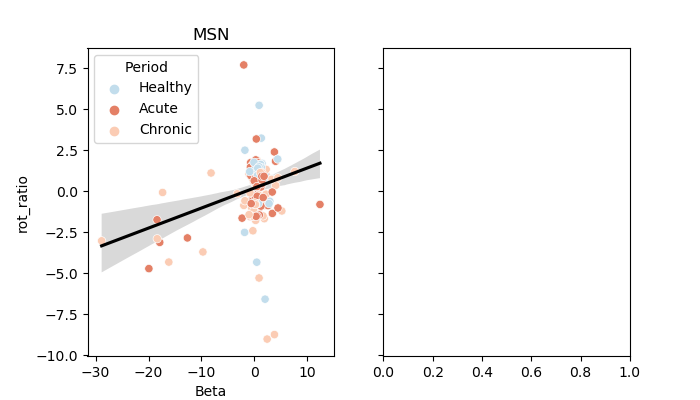

----------------------------------------------------------------
MSN (0.29129291783285655, 0.00011625686709653569) 0.08485156397957938 0.07940425186041022
Healthy :
MSN (-0.0398658279371126, 0.7879104737846969) 0.0015892842371115767 -0.02011529654034261
Acute :
MSN (0.4182834197183183, 0.000525701865680897) 0.17496101921125107 0.16186516237333448
Chronic :
MSN (0.2340931745009468, 0.0796616975716319) 0.0547996143479309 0.037614152790620636


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


In [307]:
col = 'Beta'
col2  = 'rot_ratio'
fig, ax = plt.subplots(1,2,figsize=(7,4),sharey=True)
for indp,p in enumerate(['MSN']):
    df3 = df2[(df2.CellType==p)].groupby(['Sess','Period','Mouse']).mean().reset_index()#&(df2.cre.isin(['PV','CHI']))]
    df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
    df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period!='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title(p)
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)


<IPython.core.display.Javascript object>


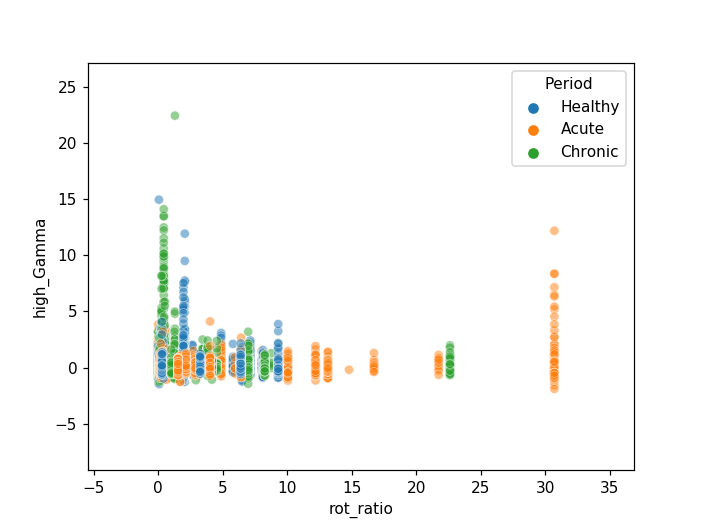

In [69]:
sns.scatterplot(data=df2,x='rot_ratio',y='high_Gamma',hue='Period',alpha=0.5)

<IPython.core.display.Javascript object>


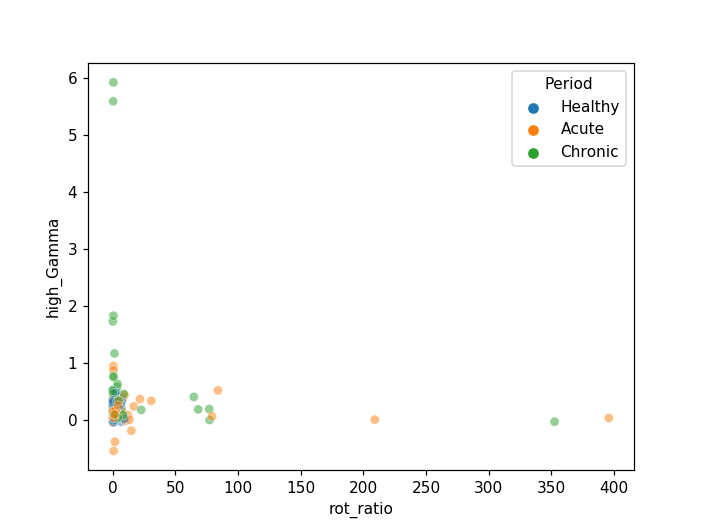

In [50]:
df3 = df2.groupby(['Sess','Period']).mean().reset_index()
sns.scatterplot(data=df3,x='rot_ratio',y='high_Gamma',hue='Period',alpha=0.5)

<IPython.core.display.Javascript object>


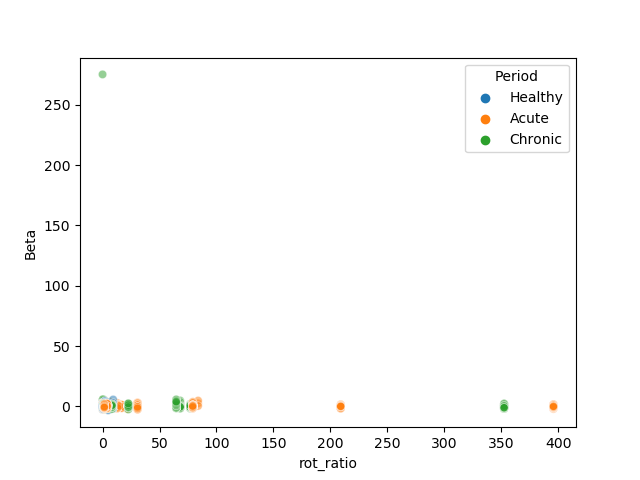

In [34]:
sns.scatterplot(data=df2,x='rot_ratio',y='Beta',hue='Period',alpha=0.5)

<IPython.core.display.Javascript object>


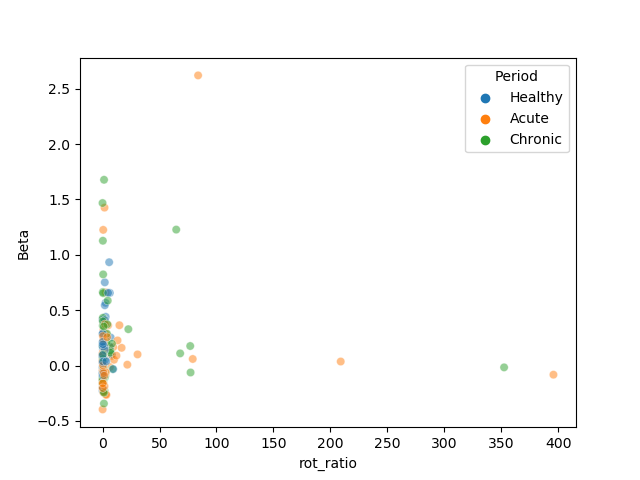

In [35]:
sns.scatterplot(data=df3,x='rot_ratio',y='Beta',hue='Period',alpha=0.5)

In [40]:
df = df[(df.cre=='PV')&(df.numred>0)]
df

,Unnamed: 0,mouse,sess,day,period,cre,numred,numMsn
44,44,1236,1236_BaselineA,0,Healthy,PV,2,153.0
45,45,1236,1236_BaselineL,0,Healthy,PV,1,121.0
46,46,1236,1236_BaselineS,0,Healthy,PV,2,178.0
47,47,1236,1236_day1,1,Acute,PV,2,130.0
48,48,1236,1236_day11,11,Acute,PV,1,101.0
...,...,...,...,...,...,...,...,...
191,191,8803,8803_day2,2,Acute,PV,1,103.0
193,193,8803,8803_day34L,34,Chronic,PV,1,91.0
194,194,8803,8803_day4,4,Acute,PV,1,110.0
196,196,8803,8803_day6,6,Acute,PV,1,69.0


In [41]:
# plot Get statistics for Gamma Power
df = pd.read_csv('J:\\lfp2ca_notNormalize\\sessions')
savePath = 'J:\\lfp2ca_notNormalize\\'
Pdf = pd.DataFrame(columns = ['Mouse','Period','Sess','CellType'])
cells = ['CRE']
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['0761_BaselineA']['Pre']['freq'][:]
f.close()
fr = {'high_Gamma':freq >= 60, 'low_Gamma':(freq >= 40) & (freq<60), 'high_Beta_15to20':(freq >= 15) & (freq<20),
         'Beta':(freq >= 10) & (freq<15),'theta':(freq >= 6) & (freq<8),'beta3':(freq >= 15) & (freq<18),
         'beta4':(freq >= 20) & (freq<25)}
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
t200 = (tPlot >0) & (tPlot<0.2)
df = df[(df.cre=='PV')&(df.numred>0)]
for sess in df.sess.unique():
    m = sess[:4]
    period = periodCalc(df[df.sess==sess].day.values)
    cellType = df[df.sess==sess].cre.values[0]
    try: 
        #tDict = {'Mouse':m,'Period':period,'Sess':sess,'CellType':cellType,'drug':drug}
        A = pickle.load(open(savePath+'CRE\\'+sess,'rb'))
        A[A==9999] = np.nan
        A[A==-9999] = np.nan

        mu = np.nanmean(A[:int(A.shape[0]/2),:,:],axis=0)
        Std = np.nanstd(A[:int(A.shape[0]/2),:,:],axis=0)
        A =(A-mu)/Std
        data = []
        cols = []
        for f in ['high_Gamma','Beta']:
            highGamma = fr[f]
            A2 = A[t200,:,:][:,highGamma,:]
            b = np.arange(A2.shape[2])
            A2 = np.nanmean(np.nanmean(A2,axis = 0),axis=0)
            cols.append(f)
            data.append(A2)
        data.append(b)
        cols.append('cellNum')
        df2 = pd.DataFrame(np.array(data).T,columns = cols)
        df2['Mouse']=m
        df2['Period'] = period
        df2['Sess'] = sess
        df2['CellType'] = 'PV'

        Pdf = pd.concat([Pdf,df2])
            
        del A,b


        #jumpBackhere
    except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess, " - PV failed at line ",  exc_tb.tb_lineno)
            

Pdf.to_csv(figFolder+'powerElevation_PV.csv')

1236_BaselineL  - PV failed at line  22
1236_day1  - PV failed at line  22
1236_day3  - PV failed at line  22
1236_day7  - PV failed at line  22
4539_day15A  - PV failed at line  22
4539_day4  - PV failed at line  22
4539_day6  - PV failed at line  22
4539_day7  - PV failed at line  22
7584_BaselineA  - PV failed at line  22
7584_day10  - PV failed at line  22
7584_day4  - PV failed at line  22
7909_day0  - PV failed at line  22
7909_day10  - PV failed at line  22
7909_day11  - PV failed at line  22
7909_day12  - PV failed at line  22
7909_day14  - PV failed at line  22
7909_day15A  - PV failed at line  22
7909_day4  - PV failed at line  22
7909_day5  - PV failed at line  22
7909_day6  - PV failed at line  22
7909_day7  - PV failed at line  22


<ipython-input-41-621d8b58417a>:26: RuntimeWarning: Mean of empty slice
  mu = np.nanmean(A[:int(A.shape[0]/2),:,:],axis=0)
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-41-621d8b58417a>:35: RuntimeWarning: Mean of empty slice
  A2 = np.nanmean(np.nanmean(A2,axis = 0),axis=0)


8430_BaselineS  - PV failed at line  22
8430_day11  - PV failed at line  22
8803_BaselineS  - PV failed at line  22
8803_day14  - PV failed at line  22


In [308]:
# print(Pdf[Pdf.gamma>.75].groupby('Period').gamma.count()/Pdf.groupby('Period').gamma.count())
# print(Pdf[Pdf.gamma>.75].groupby(['Mouse','Period']).gamma.count()/Pdf.groupby(['Mouse','Period']).gamma.count())
Pdf = pd.read_csv(figFolder+'powerElevation_PV.csv')
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df['rot_ratio'] = df.apply(lambda x: (x.percent_high_C-x.percent_high_AC)/(x.percent_high_C+x.percent_high_AC) if (x.percent_high_C+x.percent_high_AC) else np.nan, axis=1)
df2 = pd.merge(Pdf,df[['Sess','Period','rot_ratio','percent_high_C','percent_high_AC']],on=['Sess','Period'])
df2

,Unnamed: 0,Mouse,Period,Sess,CellType,high_Gamma,Beta,cellNum,rot_ratio,percent_high_C,percent_high_AC
0,0,1236,Healthy,1236_BaselineA,PV,0.211399,-0.659497,0.0,-0.879340,0.008908,0.138751
1,1,1236,Healthy,1236_BaselineA,PV,-0.597512,0.826124,1.0,-0.879340,0.008908,0.138751
2,0,1236,Healthy,1236_BaselineS,PV,-0.185596,-1.669573,0.0,-0.876543,0.010085,0.153290
3,1,1236,Healthy,1236_BaselineS,PV,0.400708,-0.368433,1.0,-0.876543,0.010085,0.153290
4,0,1236,Acute,1236_day11,PV,-0.209928,0.420393,0.0,-0.853095,0.005883,0.074208
...,...,...,...,...,...,...,...,...,...,...,...
95,0,8803,Chronic,8803_day34L,PV,0.609271,-0.760771,0.0,1.000000,0.007479,0.000000
96,0,8803,Acute,8803_day4,PV,-0.628675,-0.453105,0.0,0.263492,0.016724,0.009749
97,0,8803,Acute,8803_day6,PV,-0.176258,-0.712500,0.0,-0.651515,0.001970,0.009337
98,0,8803,Acute,8803_day8,PV,0.615875,-0.489758,0.0,-0.650000,0.003530,0.016640


<IPython.core.display.Javascript object>


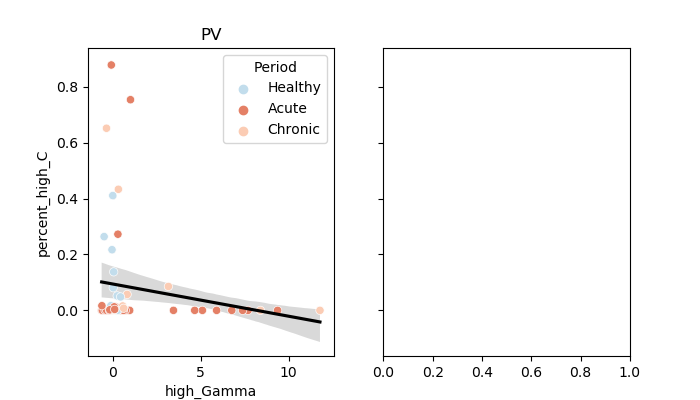

----------------------------------------------------------------
PV (-0.17472188533253846, 0.19362770091397102) 0.03052773721415658 0.012900968799868573
Healthy :
PV (-0.4086909048079568, 0.21203591167581912) 0.1670282556727466 0.07447583963638504
Acute :
PV (-0.13847797933742492, 0.45753064917931136) 0.019176150761376354 -0.014645361281334868
Chronic :
PV (-0.21129379710932647, 0.44968482512539576) 0.04464506869687723 -0.028843772172593596


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


In [316]:
col = 'high_Gamma'
col2  = 'percent_high_C'
fig, ax = plt.subplots(1,2,figsize=(7,4),sharey=True)
for indp,p in enumerate(['PV']):
    df3 = df2[(df2.CellType==p)].groupby(['Sess','Period','Mouse']).mean().reset_index()#&(df2.cre.isin(['PV','CHI']))]
    df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
    df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
# #     df3 = df3[(df3.Period!='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title(p)
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)


<IPython.core.display.Javascript object>


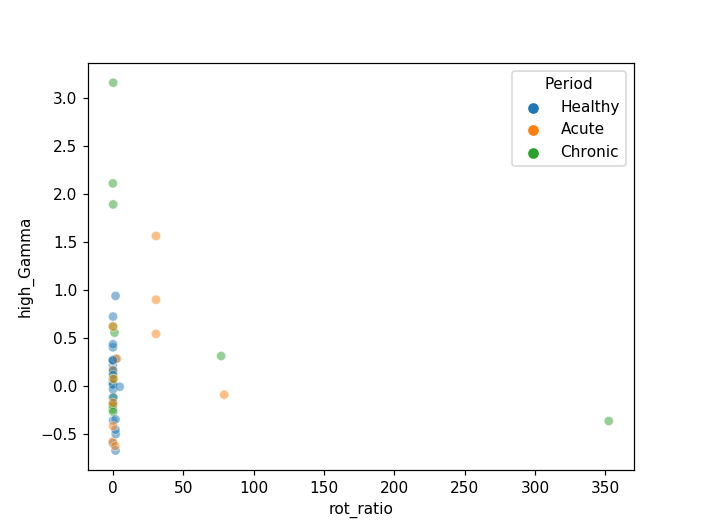

In [43]:
sns.scatterplot(data=df2,x='rot_ratio',y='high_Gamma',hue='Period',alpha=0.5)

<IPython.core.display.Javascript object>


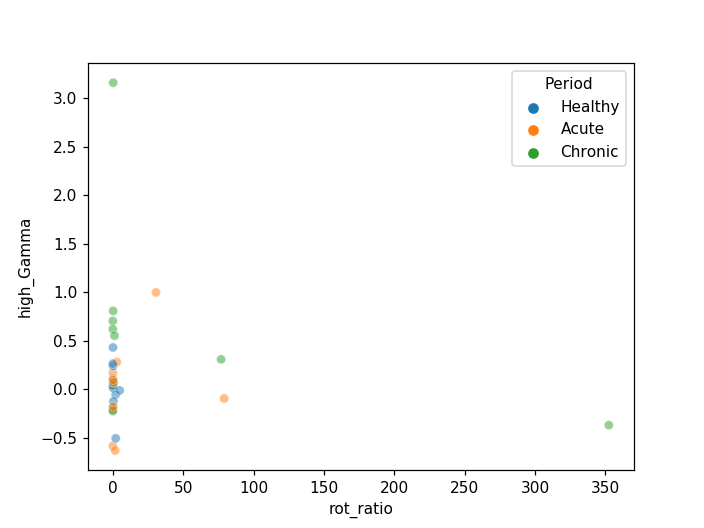

In [44]:
df3 = df2.groupby(['Sess','Period']).mean().reset_index()
sns.scatterplot(data=df3,x='rot_ratio',y='high_Gamma',hue='Period',alpha=0.5)

<IPython.core.display.Javascript object>


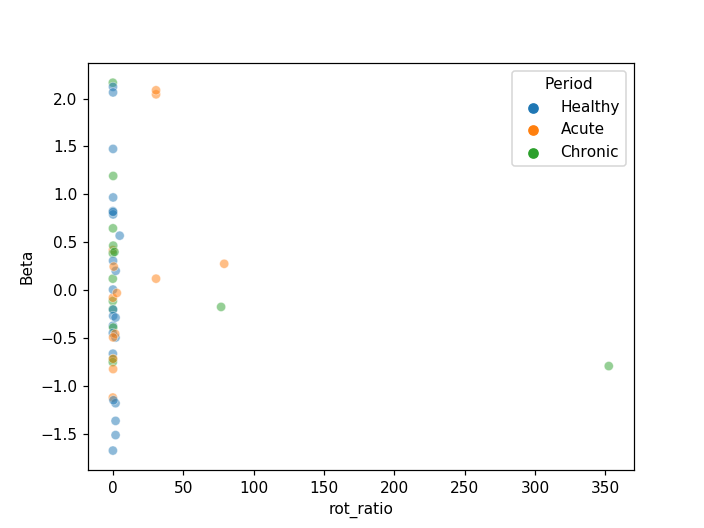

In [46]:
sns.scatterplot(data=df2,x='rot_ratio',y='Beta',hue='Period',alpha=0.5)

In [85]:
Pdf[Pdf.Period=='Healthy'].high_Gamma.quantile(.95)

0.4555698338418128

In [68]:
Pdf = pd.read_csv(figFolder+'powerElevation.csv')
th = Pdf[Pdf.Period=='Healthy'].high_Gamma.quantile(.95)
Pdf['gammaPercent'] = Pdf.high_Gamma.apply(lambda x: x>=th)
Pdf =Pdf.groupby(['Sess','Period']).mean()
Pdf = Pdf.reset_index()
Pdf['Mouse']=Pdf['Mouse'].astype(int)
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df['rot_ratio'] = df.apply(lambda x: (x.percent_high_C-x.percent_high_AC)/(x.percent_high_C+x.percent_high_AC) if (x.percent_high_C+x.percent_high_AC) else np.nan, axis=1)
df2 = pd.merge(Pdf,df[['Sess','Period','rot_ratio','percent_high_C','percent_high_AC']],on=['Sess','Period'])
df2

,Sess,Period,Unnamed: 0,Mouse,high_Gamma,Beta,cellNum,gammaPercent,rot_ratio,percent_high_C,percent_high_AC
0,0761_BaselineA,Healthy,5.0,761,0.427110,0.440103,5.0,0.181818,0.467305,0.115976,0.042104
1,0761_BaselineL,Healthy,7.5,761,0.362527,0.932953,7.5,0.062500,0.705906,0.178418,0.030759
2,0761_BaselineS,Healthy,13.0,761,0.491119,0.566564,13.0,0.222222,0.453552,0.178839,0.067233
3,0761_day10,Acute,5.5,761,0.360169,0.007634,5.5,0.083333,0.912063,0.142533,0.006555
4,0761_day12,Acute,2.0,761,0.121943,0.171254,2.0,0.000000,0.712621,0.074118,0.012437
...,...,...,...,...,...,...,...,...,...,...,...
206,8815_day30A,Chronic,39.0,8815,0.169259,0.328188,39.0,0.063291,0.915344,0.045630,0.002017
207,8815_day34L,Chronic,33.5,8815,0.085633,0.351990,33.5,0.014706,0.013384,0.044538,0.043361
208,8815_day4,Acute,18.0,8815,0.249947,0.256764,18.0,0.081081,0.602540,0.106050,0.026303
209,8815_day6,Acute,4.5,8815,0.267367,0.404598,4.5,0.200000,1.000000,0.080138,0.000000


----------------------------------------------------------------
rot_ratio :
(-0.07918938919900892, 0.304656632955307) 0.006270959361712292 0.0003559055483891571
Healthy : (0.20713828496748854, 0.1577612365797817) 0.042906269099272754 0.022099883644909002
Acute : (-0.038190911954885685, 0.7626209391457357) 0.0014585457559458392 -0.014391318597134273
Chronic : (-0.20110982771946234, 0.133593465052015) 0.04044516280535182 0.02299871121999464
----------------------------------------------------------------
percent_high_C :
(-0.20105954380716018, 0.003354634932332765) 0.04042494015594322 0.03583367192702436
Healthy : (0.050255267447215604, 0.7344475641413359) 0.0025255919061913934 -0.019158634356717608
Acute : (-0.2843996339244248, 0.003946882947461773) 0.08088315177634686 0.07159914320843108
Chronic : (-0.14859548831953756, 0.24905686371156194) 0.02208061914892201 0.005781962801404084
----------------------------------------------------------------
percent_high_AC :
(-0.1546891615905599, 

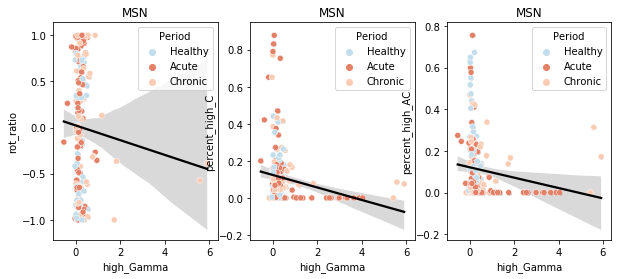

In [65]:
# MAKING this FIGURE
%matplotlib inline
col = 'high_Gamma'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=False)
for indp,col2 in enumerate(['rot_ratio','percent_high_C','percent_high_AC']):
    df3 = df2#&(df2.cre.isin(['PV','CHI']))]
#    df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#    df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
# #     df3 = df3[(df3.Period!='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title('MSN')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,':')
    print(sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        #print(per,':')
        print(per,':',sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
fig.savefig(figFolder+'S11_MSN_highGamma.svg',transparent=True)

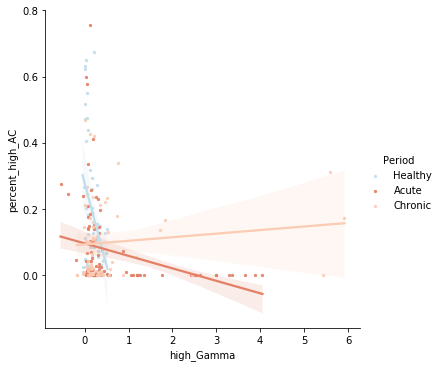

In [35]:
sns.lmplot(y ='percent_high_AC',x='high_Gamma',data=df2,hue='Period',palette=colorPallet3,scatter_kws={'alpha':0.9,'s':5} )
plt.savefig(figFolder+'S11_Extra2.svg',transparent=True)

----------------------------------------------------------------
rot_ratio (-0.07918938919900892, 0.304656632955307) 0.006270959361712292 0.0003559055483891571
Healthy :
rot_ratio (0.20713828496748854, 0.1577612365797817) 0.042906269099272754 0.022099883644909002
Acute :
rot_ratio (-0.038190911954885685, 0.7626209391457357) 0.0014585457559458392 -0.014391318597134273
Chronic :
rot_ratio (-0.20110982771946234, 0.133593465052015) 0.04044516280535182 0.02299871121999464
----------------------------------------------------------------
percent_high_C (-0.20105954380716018, 0.003354634932332765) 0.04042494015594322 0.03583367192702436
Healthy :
percent_high_C (0.050255267447215604, 0.7344475641413359) 0.0025255919061913934 -0.019158634356717608
Acute :
percent_high_C (-0.2843996339244248, 0.003946882947461773) 0.08088315177634686 0.07159914320843108
Chronic :
percent_high_C (-0.14859548831953756, 0.24905686371156194) 0.02208061914892201 0.005781962801404084
----------------------------------

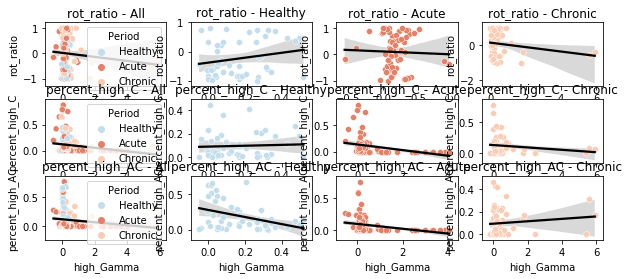

In [69]:
%matplotlib inline
col = 'high_Gamma'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(3,4,figsize=(10,4),sharey=False)
for indp,col2 in enumerate(['rot_ratio','percent_high_C','percent_high_AC']):
    df3 = df2#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for iPer,per in enumerate(df3.Period.unique()):
        sns.regplot(x=col,y=col2,data = df3[df3.Period == per],color='k',marker=".",ax=ax[indp,iPer+1])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer+1])
        ax[indp,iPer+1].set_title(col2 + ' - '+per)
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
# fig.savefig(figFolder+'S11_Extra.svg',transparent=True)

In [311]:
Pdf = pd.read_csv(figFolder+'powerElevation.csv')
th = Pdf[Pdf.Period=='Healthy'].high_Gamma.quantile(.95)
Pdf['gammaPercent'] = Pdf.high_Gamma.apply(lambda x: x>=th)
Pdf =Pdf.groupby(['Sess','Period']).mean()
Pdf = Pdf.reset_index()
Pdf['Mouse']=Pdf['Mouse'].astype(int)
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess',"percent_low":"lowRot"})
df2 = pd.merge(Pdf,df[['Sess','Period','percent_high_C','percent_high_AC','lowRot']],on=['Sess','Period'])
df = pd.read_csv('D:\\6OHDA\\submission2\\speedData.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess',"percent_high":'highSpeed',"percent_low":"lowSpeed"})
df2 = pd.merge(df2,df[['Sess','Period','highSpeed','lowSpeed']],on=['Sess','Period'])
df2

,Sess,Period,Unnamed: 0,Mouse,high_Gamma,Beta,cellNum,gammaPercent,percent_high_C,percent_high_AC,lowRot,highSpeed,lowSpeed
0,0761_BaselineA,Healthy,5.0,761,0.427110,0.440103,5.0,0.181818,0.115976,0.042104,0.657534,0.053534,0.797294
1,0761_BaselineL,Healthy,7.5,761,0.362527,0.932953,7.5,0.062500,0.178418,0.030759,0.635936,0.097235,0.725523
2,0761_BaselineS,Healthy,13.0,761,0.491119,0.566564,13.0,0.222222,0.178839,0.067233,0.470628,0.114800,0.584839
3,0761_day10,Acute,5.5,761,0.360169,0.007634,5.5,0.083333,0.142533,0.006555,0.746365,0.103622,0.814858
4,0761_day12,Acute,2.0,761,0.121943,0.171254,2.0,0.000000,0.074118,0.012437,0.820168,0.069160,0.848655
...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,8815_day30A,Chronic,39.0,8815,0.169259,0.328188,39.0,0.063291,0.045630,0.002017,0.762773,0.229580,0.733277
207,8815_day34L,Chronic,33.5,8815,0.085633,0.351990,33.5,0.014706,0.044538,0.043361,0.521765,0.474370,0.450672
208,8815_day4,Acute,18.0,8815,0.249947,0.256764,18.0,0.081081,0.106050,0.026303,0.813782,0.154790,0.812521
209,8815_day6,Acute,4.5,8815,0.267367,0.404598,4.5,0.200000,0.080138,0.000000,0.758369,0.240415,0.736301


----------------------------------------------------------------
lowRot (0.3671507090313508, 3.916139494543441e-08) 0.13479964314222337 0.13065992851610964
Acute :  MannwhitneyuResult(statistic=223.5, pvalue=3.924253658755286e-08)
Chronic :  MannwhitneyuResult(statistic=274.0, pvalue=0.20461272470989422)
----------------------------------------------------------------
lowSpeed (0.144106194220085, 0.036460067772322344) 0.020766595212596606 0.016081267916963182
Acute :  MannwhitneyuResult(statistic=654.0, pvalue=0.053864062431010495)
Chronic :  MannwhitneyuResult(statistic=318.0, pvalue=0.4891479705616082)


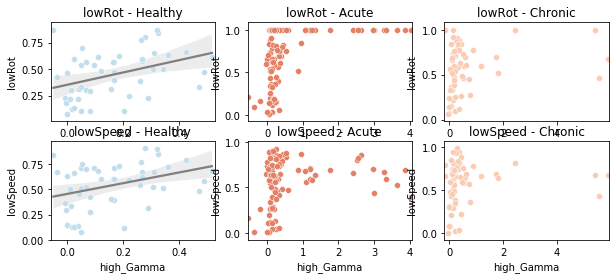

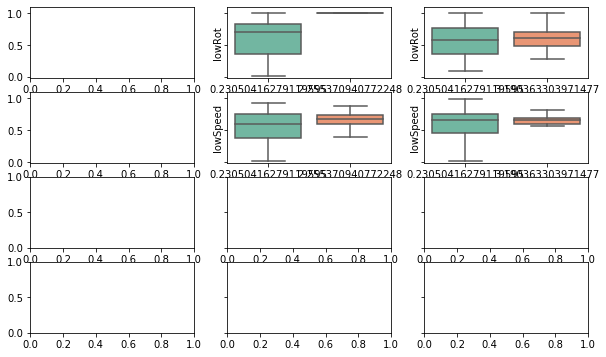

In [318]:
%matplotlib inline
col = 'high_Gamma'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(2,3,figsize=(10,4),sharey=False)
fig2, ax2 = plt.subplots(4,3,figsize=(10,6),sharey='row')
for indp,col2 in enumerate(['lowRot','lowSpeed']):
    df3 = df2#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
#     sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
#     sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    df4 = df3[df3.Period == 'Healthy'][[col,col2]].dropna()
    Hrange = np.mean(df4[col])+2*np.std(df4[col])
    for iPer,per in enumerate(df3.Period.unique()):
        if per != 'Healthy':
            df4 = df3[(df3.Period == per)][[col,col2]].dropna()
            df4['binBox'] = pd.cut(df4[col],[0,Hrange,np.max(df4[col])+0.001],labels=[np.mean([0,Hrange]),np.mean([np.max(df4[col]),Hrange])])
#             ax2[indp,iPer].boxplot([df4[(df4['binBox'] == np.mean([0,Hrange]))][col2],df4[(df4['binBox'] != np.mean([0,Hrange]))][col2]],
#                                   positions =[np.mean([0,Hrange]),np.mean([np.max(df4[col]),Hrange])],showfliers = False) 
            sns.boxplot(data = df4, x = 'binBox', y = col2,ax = ax2[indp,iPer],showfliers = False, palette = sns.color_palette("Set2"))
            print(per,': ',sci.stats.mannwhitneyu(df4[(df4['binBox'] == np.mean([0,Hrange]))][col2],df4[(df4['binBox'] != np.mean([0,Hrange]))][col2]))
        else:
            sns.regplot(x=col,y=col2,data = df3[(df3.Period == per)],color='gray',marker=".",ax=ax[indp,iPer])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer],)
        ax[indp,iPer].set_title(col2 + ' - '+per)
        ax[indp,iPer].set_xlim([np.min(df4[col])-0.01,np.max(df4[col])+0.01])
        ax2[indp,iPer].set_ylim([-0.01,1.1])
# fig.savefig(figFolder+'S11_Extra.svg',transparent=True)

In [320]:
Pdf = pd.read_csv(figFolder+'powerElevation.csv')
th = Pdf[Pdf.Period=='Healthy'].high_Gamma.quantile(.95)
Pdf['gammaPercent'] = Pdf.high_Gamma.apply(lambda x: x>=th)
Pdf =Pdf.groupby(['Sess','Period']).mean()
Pdf = Pdf.reset_index()
Pdf['Mouse']=Pdf['Mouse'].astype(int)
df = pd.read_csv('D:\\6OHDA\\submission1\\bySessCompareCorr2Sig2.csv')
df = df[df.population == 'MSN-MSN']
df2 = pd.merge(Pdf,df[['Sess','Period','aSymCorr']],on=['Sess','Period'])
df2


,Sess,Period,Unnamed: 0,Mouse,high_Gamma,Beta,cellNum,gammaPercent,aSymCorr
0,0761_BaselineA,Healthy,5.0,761,0.427110,0.440103,5.0,0.181818,0.021118
1,0761_BaselineL,Healthy,7.5,761,0.362527,0.932953,7.5,0.062500,0.056678
2,0761_BaselineS,Healthy,13.0,761,0.491119,0.566564,13.0,0.222222,0.061640
3,0761_day10,Acute,5.5,761,0.360169,0.007634,5.5,0.083333,0.042205
4,0761_day12,Acute,2.0,761,0.121943,0.171254,2.0,0.000000,-0.005763
...,...,...,...,...,...,...,...,...,...
205,8815_day30A,Chronic,39.0,8815,0.169259,0.328188,39.0,0.063291,0.031461
206,8815_day34L,Chronic,33.5,8815,0.085633,0.351990,33.5,0.014706,0.014564
207,8815_day4,Acute,18.0,8815,0.249947,0.256764,18.0,0.081081,0.139902
208,8815_day6,Acute,4.5,8815,0.267367,0.404598,4.5,0.200000,0.081291


----------------------------------------------------------------
aSymCorr (0.4300355942852772, 8.125339035010971e-11) 0.1849306123522917 0.18099307907863127
Acute :  MannwhitneyuResult(statistic=406.0, pvalue=8.532360766523414e-05)
Chronic :  MannwhitneyuResult(statistic=145.0, pvalue=0.0007757075805127291)


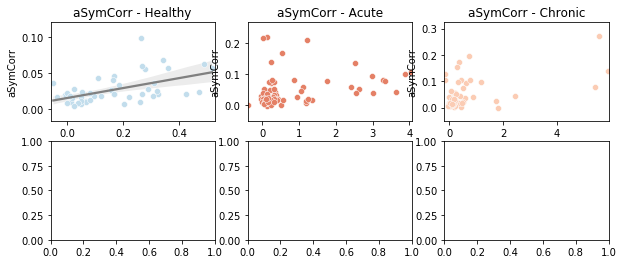

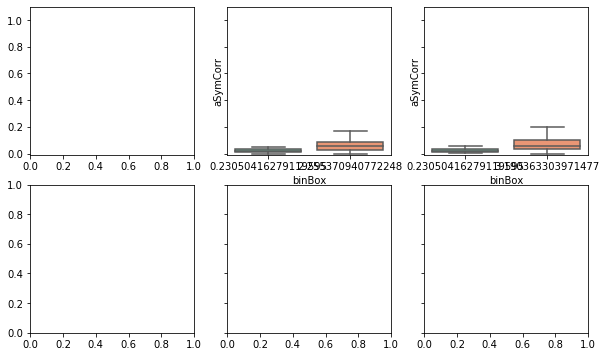

In [321]:
%matplotlib inline
col = 'high_Gamma'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=False)
fig2, ax2 = plt.subplots(1,3,figsize=(10,6),sharey='row')
for indp,col2 in enumerate(['aSymCorr']):
    df3 = df2#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
#     sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
#     sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    df4 = df3[df3.Period == 'Healthy'][[col,col2]].dropna()
    Hrange = np.mean(df4[col])+2*np.std(df4[col])
    for iPer,per in enumerate(df3.Period.unique()):
        if per != 'Healthy':
            df4 = df3[(df3.Period == per)][[col,col2]].dropna()
            df4['binBox'] = pd.cut(df4[col],[0,Hrange,np.max(df4[col])+0.001],labels=[np.mean([0,Hrange]),np.mean([np.max(df4[col]),Hrange])])
#             ax2[indp,iPer].boxplot([df4[(df4['binBox'] == np.mean([0,Hrange]))][col2],df4[(df4['binBox'] != np.mean([0,Hrange]))][col2]],
#                                   positions =[np.mean([0,Hrange]),np.mean([np.max(df4[col]),Hrange])],showfliers = False) 
            sns.boxplot(data = df4, x = 'binBox', y = col2,ax = ax2[indp,iPer],showfliers = False, palette = sns.color_palette("Set2"))
            print(per,': ',sci.stats.mannwhitneyu(df4[(df4['binBox'] == np.mean([0,Hrange]))][col2],df4[(df4['binBox'] != np.mean([0,Hrange]))][col2]))
        else:
            sns.regplot(x=col,y=col2,data = df3[(df3.Period == per)],color='gray',marker=".",ax=ax[indp,iPer])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer],)
        ax[indp,iPer].set_title(col2 + ' - '+per)
        ax[indp,iPer].set_xlim([np.min(df4[col])-0.01,np.max(df4[col])+0.01])
        ax2[indp,iPer].set_ylim([-0.01,1.1])
# fig.savefig(figFolder+'S11_Extra.svg',transparent=True)

----------------------------------------------------------------
aSymCorr (0.4300355942852772, 8.125339035010971e-11) 0.1849306123522917 0.18099307907863127
Healthy :
aSymCorr (0.5320198615307001, 9.954588276066515e-05) 0.2830451330631455 0.267459157694953
Acute :
aSymCorr (0.3482838526131853, 0.0004114143473149174) 0.12130164199108329 0.11224289603222848
Chronic :
aSymCorr (0.4958550017916951, 4.1655722392328946e-05) 0.24587218280184164 0.23330338584853905


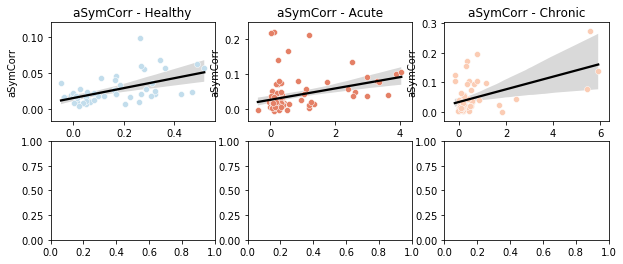

In [327]:
%matplotlib inline
col = 'high_Gamma'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(2,3,figsize=(10,4),sharey=False)
for indp,col2 in enumerate(['aSymCorr']):
    df3 = df2#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
#     sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
#     sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
#     ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for iPer,per in enumerate(df3.Period.unique()):
        sns.regplot(x=col,y=col2,data = df3[df3.Period == per],color='k',marker=".",ax=ax[indp,iPer])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer])
        ax[indp,iPer].set_title(col2 + ' - '+per)
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
fig.savefig(figFolder+'fig5E.svg',transparent=True)

In [ ]:
# box plot submittion 2
%matplotlib inline
col = 'aSymCorrSig'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(4,3,figsize=(10,6),sharey='row')
fig2, ax2 = plt.subplots(4,3,figsize=(10,6),sharey='row')
for indp,col2 in enumerate(['highRot','lowRot','highSpeed','lowSpeed']):
    df3 = df2[df2.population == 'MSN-MSN']
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
#     sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
#     sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
#     ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    df4 = df3[df3.Period == 'Healthy'][[col,col2]].dropna()
    Hrange = np.mean(df4[col])+2*np.std(df4[col])
    for iPer,per in enumerate(df3.Period.unique()):
        if per != 'Healthy':
            df4 = df3[(df3.Period == per)][[col,col2]].dropna()
            df4['binBox'] = pd.cut(df4[col],[0,Hrange,np.max(df4[col])+0.001],labels=[np.mean([0,Hrange]),np.mean([np.max(df4[col]),Hrange])])
#             ax2[indp,iPer].boxplot([df4[(df4['binBox'] == np.mean([0,Hrange]))][col2],df4[(df4['binBox'] != np.mean([0,Hrange]))][col2]],
#                                   positions =[np.mean([0,Hrange]),np.mean([np.max(df4[col]),Hrange])],showfliers = False) 
            sns.boxplot(data = df4, x = 'binBox', y = col2,ax = ax2[indp,iPer],showfliers = False, palette = sns.color_palette("Set2"))
            print(per,': ',sci.stats.mannwhitneyu(df4[(df4['binBox'] == np.mean([0,Hrange]))][col2],df4[(df4['binBox'] != np.mean([0,Hrange]))][col2]))
        sns.regplot(x=col,y=col2,data = df3[(df3.Period == per)],color='gray',marker=".",ax=ax[indp,iPer])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer],)
        ax[indp,iPer].set_title(col2 + ' - '+per)
        ax[indp,iPer].set_xlim([np.min(df4[col])-0.01,np.max(df4[col])+0.01])
        ax2[indp,iPer].set_ylim([-0.01,1.1])
#         df4['Intercept']=1
#         model = sm.OLS(df4[col2], df4[['Intercept',col]])
#         model_results = model.fit()
#         b = model_results.params
#         a =np.sum(b*df4[['Intercept',col]],axis=1)
#         print(per,':')
#         print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
# fig.savefig(figFolder+'newS10A_seperate1.svg',transparent=True)
fig2.savefig(figFolder+'newS10A_seperate.svg',transparent=True)

In [70]:
Pdf = pd.read_csv(figFolder+'powerElevation_PV.csv')
th = Pdf[Pdf.Period=='Healthy'].high_Gamma.quantile(.95)
Pdf['gammaPercent'] = Pdf.high_Gamma.apply(lambda x: x>=th)
Pdf =Pdf.groupby(['Sess','Period']).mean()
Pdf = Pdf.reset_index()
Pdf['Mouse']=Pdf['Mouse'].astype(int)
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df['rot_ratio'] = df.apply(lambda x: (x.percent_high_C-x.percent_high_AC)/(x.percent_high_C+x.percent_high_AC) if (x.percent_high_C+x.percent_high_AC) else np.nan, axis=1)
df2 = pd.merge(Pdf,df[['Sess','Period','rot_ratio','percent_high_C','percent_high_AC']],on=['Sess','Period'])
df2

,Sess,Period,Unnamed: 0,Mouse,high_Gamma,Beta,cellNum,gammaPercent,rot_ratio,percent_high_C,percent_high_AC
0,1236_BaselineA,Healthy,0.5,1236,-0.193056,0.083314,0.5,0.000000,-0.879340,0.008908,0.138751
1,1236_BaselineS,Healthy,0.5,1236,0.107556,-1.019003,0.5,0.000000,-0.876543,0.010085,0.153290
2,1236_day11,Acute,0.0,1236,-0.209928,0.420393,0.0,0.000000,-0.853095,0.005883,0.074208
3,1236_day13,Chronic,1.0,1236,0.705415,0.611861,1.0,0.333333,-0.965473,0.002269,0.129181
4,1236_day15A,Chronic,0.0,1236,0.033116,-0.747533,0.0,0.000000,-1.000000,0.000000,0.119076
5,1236_day30A,Chronic,0.0,1236,0.621395,0.122048,0.0,0.000000,-1.000000,0.000000,0.137479
6,1236_day35L,Chronic,0.5,1236,-0.222632,-0.153495,0.5,0.000000,-0.951577,0.003613,0.145630
7,1236_day5,Acute,0.0,1236,0.169368,-0.076570,0.0,0.000000,-0.884151,0.012102,0.196823
8,1236_day9,Acute,0.0,1236,-0.581634,-1.116754,0.0,0.000000,-0.985279,0.001765,0.238003
9,4539_Baseline2A,Healthy,0.0,4539,0.016754,2.121566,0.0,0.000000,-0.785109,0.081015,0.672998


----------------------------------------------------------------
percent_high_C (-0.17472188533253843, 0.19362770091397094) 0.03052773721415658 0.012900968799868573
Healthy :
percent_high_C (-0.4086909048079568, 0.21203591167581912) 0.1670282556727466 0.07447583963638504
Acute :
percent_high_C (-0.13847797933742492, 0.45753064917931136) 0.019176150761376354 -0.014645361281334868
Chronic :
percent_high_C (-0.21129379710932647, 0.44968482512539576) 0.04464506869687723 -0.028843772172593596
----------------------------------------------------------------
percent_high_AC (-0.20910872663127403, 0.1185064162928684) 0.04372645955335275 0.026339667908868325
Healthy :
percent_high_AC (0.31129097927064586, 0.35143359227697907) 0.09690207377527749 -0.003442140249691805
Acute :
percent_high_AC (-0.24744854911491193, 0.17956350654952294) 0.06123078445907504 0.028859432199043078
Chronic :
percent_high_AC (-0.1295737446550197, 0.6453373751029683) 0.016789355303924336 -0.05884223274961986


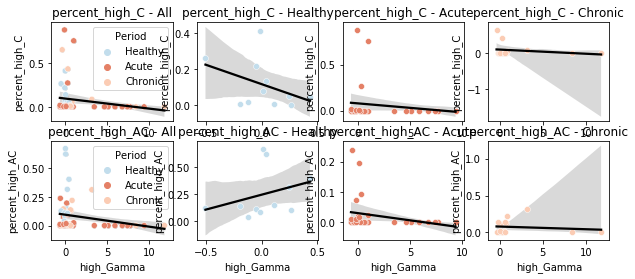

In [71]:
%matplotlib inline
col = 'high_Gamma'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(2,4,figsize=(10,4),sharey=False)
for indp,col2 in enumerate(['percent_high_C','percent_high_AC']):
    df3 = df2#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp,0].set_title(col2+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for iPer,per in enumerate(df3.Period.unique()):
        sns.regplot(x=col,y=col2,data = df3[df3.Period == per],color='k',marker=".",ax=ax[indp,iPer+1])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colorPallet3[iPer,:],ax=ax[indp,iPer+1])
        ax[indp,iPer+1].set_title(col2 + ' - '+per)
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(col2,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
fig.savefig(figFolder+'S11_Extra_PV.svg',transparent=True)

C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
rot_ratio :
(-0.030871029244263104, 0.8667998431131059) 0.0009530204466002834 -0.032348545538513074
Healthy : (-0.539185848568748, 0.08696400230278066) 0.29072137929680086 0.21191264366311202
Acute : (0.4525858760959482, 0.1890527824845181) 0.20483397524153713 0.10543822214672927
Chronic : (-0.1543294351429841, 0.6504961563216753) 0.023817574551552312 -0.08464713938716417
----------------------------------------------------------------
percent_high_C :
(-0.17472188533253843, 0.19362770091397094) 0.03052773721415658 0.012900968799868573
Healthy : (-0.4086909048079568, 0.21203591167581912) 0.1670282556727466 0.07447583963638504
Acute : (-0.13847797933742492, 0.45753064917931136) 0.019176150761376354 -0.014645361281334868
Chronic : (-0.21129379710932647, 0.44968482512539576) 0.04464506869687723 -0.028843772172593596


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
percent_high_AC :
(-0.20910872663127403, 0.1185064162928684) 0.04372645955335275 0.026339667908868325
Healthy : (0.31129097927064586, 0.35143359227697907) 0.09690207377527749 -0.003442140249691805
Acute : (-0.24744854911491193, 0.17956350654952294) 0.06123078445907504 0.028859432199043078
Chronic : (-0.1295737446550197, 0.6453373751029683) 0.016789355303924336 -0.05884223274961986


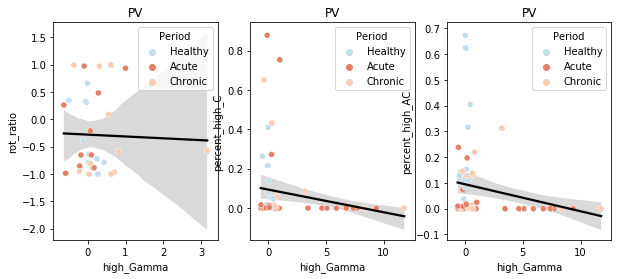

In [38]:
%matplotlib inline
col = 'high_Gamma'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=False)
for indp,col2 in enumerate(['rot_ratio','percent_high_C','percent_high_AC']):
    df3 = df2#&(df2.cre.isin(['PV','CHI']))]
#    df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#    df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
# #     df3 = df3[(df3.Period!='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title('PV')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,':')
    print(sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        #print(per,':')
        print(per,':',sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
fig.savefig(figFolder+'S11_PV_highGamma.svg',transparent=True)

C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
rot_ratio :
(0.03191490722082802, 0.8623377728339181) 0.0010185613029140006 -0.03228081998698906
Healthy : (0.14692925882341684, 0.6663952469496872) 0.021588207098398593 -0.08712421433511275
Acute : (0.5030822942964319, 0.13828630413190499) 0.2530917948345618 0.15972826918888205
Chronic : (-0.2563665305227987, 0.44668868554876884) 0.06572379797229688 -0.038084668919670106
----------------------------------------------------------------
percent_high_C :
(-0.10311099712813385, 0.4411623261449065) 0.010631877728758177 -0.007035410168942491
Healthy : (0.0444196876725228, 0.8968193760879001) 0.00197310865292466 -0.10891876816341717
Acute : (-0.03875124084575182, 0.8332247553090246) 0.0015016586670857368 -0.031781619377344805
Chronic : (-0.18622864439472114, 0.5063448824214966) 0.03468110799309554 -0.03957419139205087


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
percent_high_AC :
(-0.17401299334691392, 0.19142092618092824) 0.030280521853552678 0.01296410260093761
Healthy : (-0.06089862423076428, 0.8588270103971719) 0.0037086424331996826 -0.10699039729644477
Acute : (-0.288676489798686, 0.10907692669548215) 0.08333411576249095 0.052778586287907214
Chronic : (0.3228870654289032, 0.24046616631133017) 0.10425605702128882 0.035352676792157256


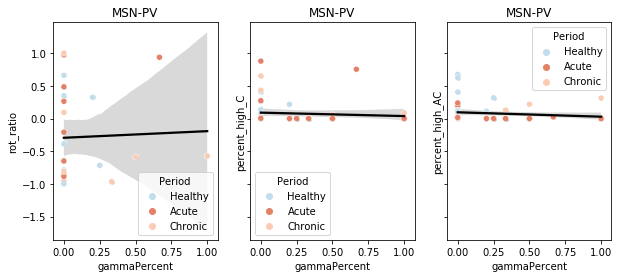

In [37]:
%matplotlib inline
col = 'gammaPercent'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=True)
for indp,col2 in enumerate(['rot_ratio','percent_high_C','percent_high_AC']):
    df3 = df2#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
# #     df3 = df3[(df3.Period!='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title(p)
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,':')
    print(sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        #print(per,':')
        print(per,':',sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)


<IPython.core.display.Javascript object>


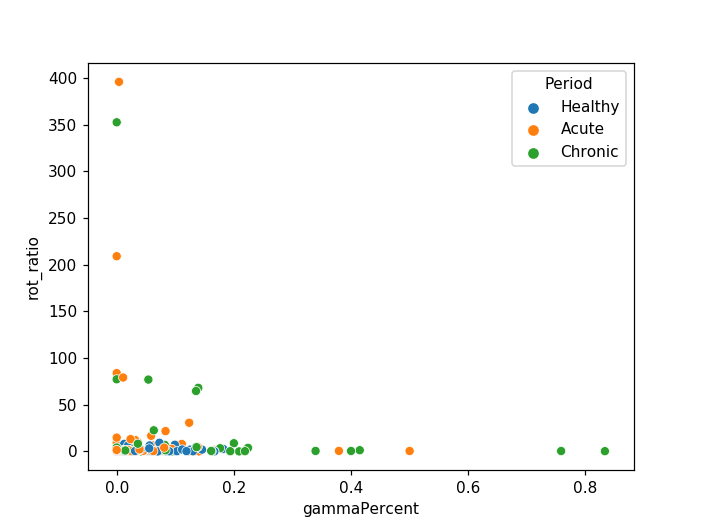

<IPython.core.display.Javascript object>


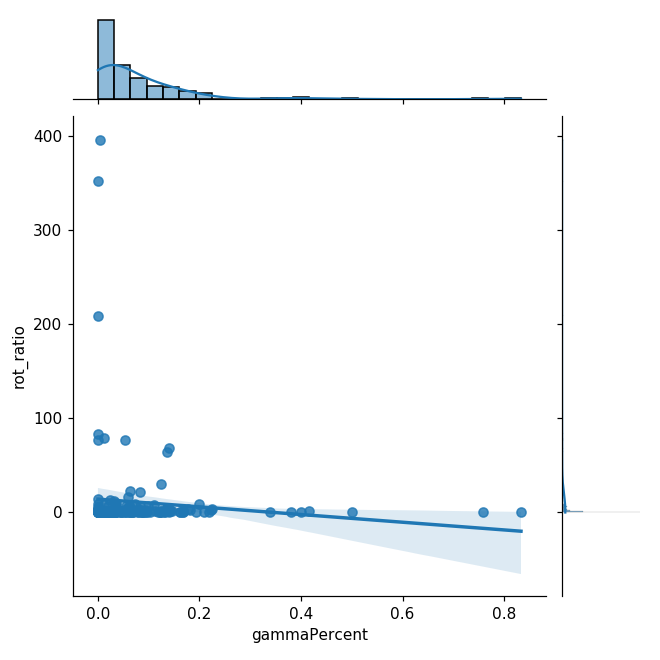

0.010591508085949688


In [92]:
sns.scatterplot(x='gammaPercent',y='rot_ratio',hue = 'Period',data = df2)
def r2(x, y):
    return sci.stats.pearsonr(x, y)[0] ** 2
# m = df2.loc[df2['rot_ratio'] != np.inf, 'rot_ratio'].max()
df2['rot_ratio'].replace(np.inf,np.nan,inplace=True)
df2 = df2.dropna()


sns.jointplot(x='gammaPercent',y='rot_ratio',data = df2, kind="reg")
print(r2(df2.gammaPercent,df2.rot_ratio))

<IPython.core.display.Javascript object>


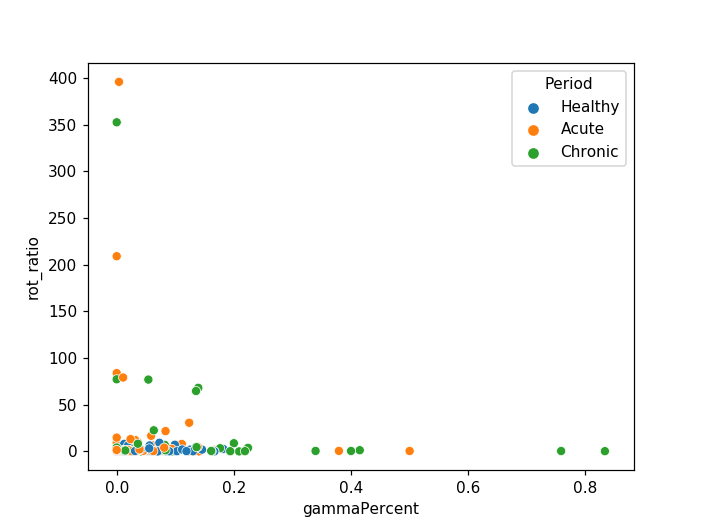

<IPython.core.display.Javascript object>


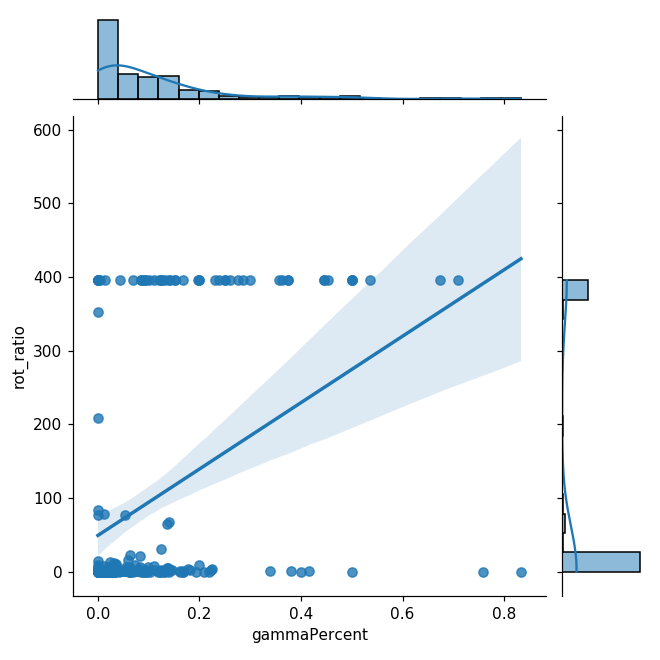

0.15588874243886766


In [88]:
sns.scatterplot(x='gammaPercent',y='rot_ratio',hue = 'Period',data = df2)
def r2(x, y):
    return sci.stats.pearsonr(x, y)[0] ** 2
m = df2.loc[df2['rot_ratio'] != np.inf, 'rot_ratio'].max()
df2['rot_ratio'].replace(np.inf,m,inplace=True)



sns.jointplot(x='gammaPercent',y='rot_ratio',data = df2, kind="reg")
print(r2(df2.gammaPercent,df2.rot_ratio))

In [95]:
Pdf = pd.read_csv(figFolder+'powerElevation_PV.csv')
th = Pdf[Pdf.Period=='Healthy'].high_Gamma.quantile(.95)
Pdf['gammaPercent'] = Pdf.high_Gamma.apply(lambda x: x>=th)
Pdf =Pdf.groupby(['Sess','Period']).mean()
Pdf = Pdf.reset_index()
Pdf['Mouse']=Pdf['Mouse'].astype(int)
Pdf.dtypes

df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df['rot_ratio'] = df.apply(lambda x: x.percent_high_C/x.percent_high_AC if x.percent_high_AC else np.inf, axis=1)
df2 = pd.merge(Pdf,df[['Sess','Period','rot_ratio','percent_high_C','percent_high_AC']],on=['Sess','Period'])
df2

,Sess,Period,Unnamed: 0,Mouse,high_Gamma,Beta,cellNum,gammaPercent,rot_ratio,percent_high_C,percent_high_AC
0,1236_BaselineA,Healthy,0.5,1236,-0.193056,0.083314,0.5,0.000000,0.064204,0.008908,0.138751
1,1236_BaselineS,Healthy,0.5,1236,0.107556,-1.019003,0.5,0.000000,0.065789,0.010085,0.153290
2,1236_day11,Acute,0.0,1236,-0.209928,0.420393,0.0,0.000000,0.079275,0.005883,0.074208
3,1236_day13,Chronic,1.0,1236,0.705415,0.611861,1.0,0.333333,0.017567,0.002269,0.129181
4,1236_day15A,Chronic,0.0,1236,0.033116,-0.747533,0.0,0.000000,0.000000,0.000000,0.119076
5,1236_day30A,Chronic,0.0,1236,0.621395,0.122048,0.0,0.000000,0.000000,0.000000,0.137479
6,1236_day35L,Chronic,0.5,1236,-0.222632,-0.153495,0.5,0.000000,0.024812,0.003613,0.145630
7,1236_day5,Acute,0.0,1236,0.169368,-0.076570,0.0,0.000000,0.061486,0.012102,0.196823
8,1236_day9,Acute,0.0,1236,-0.581634,-1.116754,0.0,0.000000,0.007415,0.001765,0.238003
9,4539_Baseline2A,Healthy,0.0,4539,0.016754,2.121566,0.0,0.000000,0.120380,0.081015,0.672998


<IPython.core.display.Javascript object>


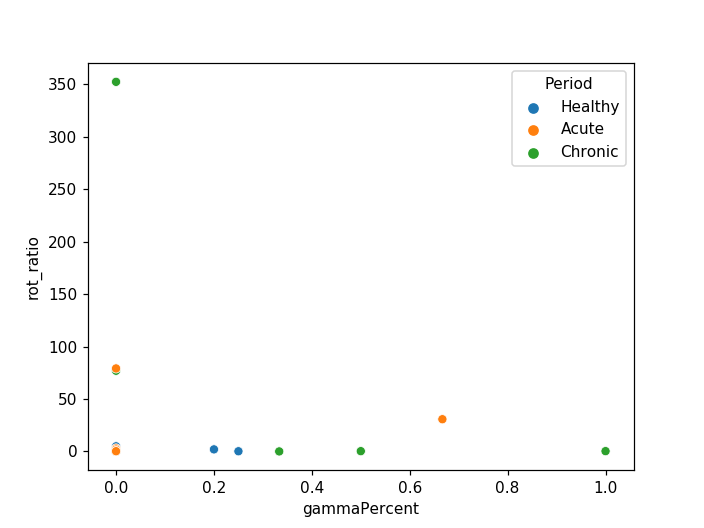

<IPython.core.display.Javascript object>


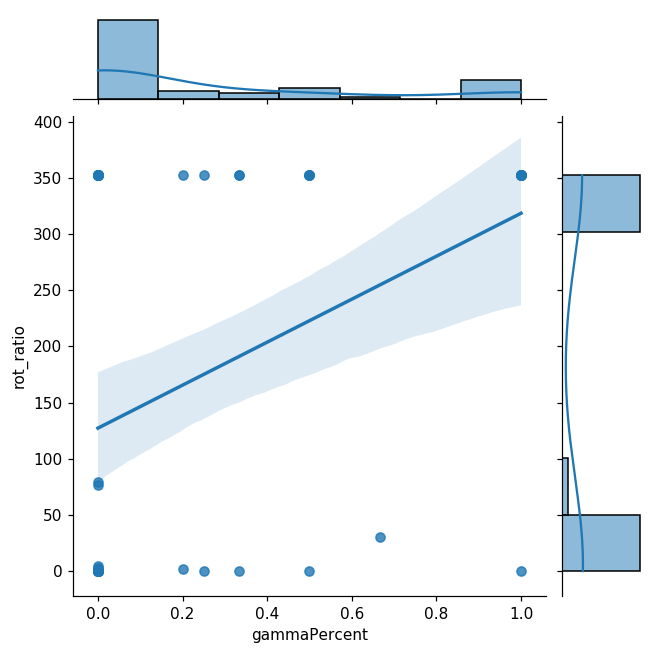

0.16434951259430725


In [96]:
sns.scatterplot(x='gammaPercent',y='rot_ratio',hue = 'Period',data = df2)
def r2(x, y):
    return sci.stats.pearsonr(x, y)[0] ** 2
m = df2.loc[df2['rot_ratio'] != np.inf, 'rot_ratio'].max()
df2['rot_ratio'].replace(np.inf,m,inplace=True)



sns.jointplot(x='gammaPercent',y='rot_ratio',data = df2, kind="reg")
print(r2(df2.gammaPercent,df2.rot_ratio))

In [42]:
# add speed data:
f = h5py.File('D:\\6OHDA\\Spectograms.hdf5','r') 
df = pd.DataFrame(columns = ['Mouse','Period','Sess'])
for m in tqdm(miceList):
    data =  getData(Files[0],['lfp'],period ='Pre', mice=m)
    for sess in data:
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        period = periodCalc(day)
        # get data
        freq = f[m][sess]['Pre']['freq'][:]
        coeff = np.abs(f[m][sess]['Pre']['coeff'][:])
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        coeff = coeff[:,(lfpOutliers[:,0]==0)]
        Hs = np.nansum(coeff, axis=0)
        coeff = coeff/Hs
        coeff = np.mean(coeff,axis=1)
        frquencies = {'high_Gamma':freq > 60, 'low_Gamma':(freq >= 40) & (freq<60), 'high_Beta_15to20':(freq >= 15) & (freq<20),
         'Beta':(freq >= 10) & (freq<15),'theta':(freq >= 6) & (freq<8),'beta3':(freq >= 15) & (freq<18),
         'beta4':(freq >= 20) & (freq<25)}
        df2 = pd.DataFrame([{'Mouse':m,'Period':period,'Sess':sess}])
        for fr in frquencies.keys():
            df2[fr]  =np.sum(coeff[frquencies[fr]])
        
        df = pd.concat([df,df2])
            

df.to_csv(figFolder+'powerAll_mean.csv')

        

                

                


  0%|                                                                                           | 0/16 [00:00<?, ?it/s]D:\6OHDA\IO.py:48: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  lfp = hf[m][s]['ePhys']['lfp'].value


cleaning up lfp data


  6%|█████▏                                                                            | 1/16 [02:03<30:49, 123.29s/it]

cleaning up lfp data
I deleted session: 1208_day12
found  17.0  outlier points


 12%|██████████▎                                                                       | 2/16 [04:01<28:24, 121.76s/it]

cleaning up lfp data


 19%|███████████████▍                                                                  | 3/16 [06:05<26:31, 122.41s/it]

cleaning up lfp data


 25%|████████████████████▊                                                              | 4/16 [06:32<18:44, 93.74s/it]

cleaning up lfp data
found  1.0  outlier points
found  888231.0  outlier points
found  481139.0  outlier points


 31%|█████████████████████████▋                                                        | 5/16 [08:34<18:43, 102.16s/it]

cleaning up lfp data


 38%|███████████████████████████████▏                                                   | 6/16 [09:00<13:15, 79.52s/it]

cleaning up lfp data


 44%|████████████████████████████████████▎                                              | 7/16 [11:04<13:56, 92.91s/it]

cleaning up lfp data
I deleted session: 2976_day4
found  1.0  outlier points
found  3.0  outlier points


 50%|█████████████████████████████████████████▌                                         | 8/16 [12:59<13:15, 99.46s/it]

cleaning up lfp data


 56%|██████████████████████████████████████████████▏                                   | 9/16 [15:02<12:26, 106.61s/it]

cleaning up lfp data
found  50.0  outlier points


 62%|██████████████████████████████████████████████████▋                              | 10/16 [17:04<11:06, 111.10s/it]

cleaning up lfp data
found  29.0  outlier points


 69%|███████████████████████████████████████████████████████▋                         | 11/16 [19:48<10:34, 126.87s/it]

cleaning up lfp data


 75%|████████████████████████████████████████████████████████████▊                    | 12/16 [22:15<08:52, 133.14s/it]

cleaning up lfp data


 81%|█████████████████████████████████████████████████████████████████▊               | 13/16 [25:01<07:08, 142.83s/it]

cleaning up lfp data


 88%|██████████████████████████████████████████████████████████████████████▉          | 14/16 [26:55<04:28, 134.24s/it]

cleaning up lfp data


 94%|███████████████████████████████████████████████████████████████████████████▉     | 15/16 [28:59<02:11, 131.04s/it]

cleaning up lfp data


100%|█████████████████████████████████████████████████████████████████████████████████| 16/16 [31:01<00:00, 116.36s/it]


In [41]:
#GETBACKHERE
Pdf = pd.read_csv(figFolder+'powerAll_mean.csv')
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df['rot_ratio'] = df.apply(lambda x: (x.percent_high_C-x.percent_high_AC)/(x.percent_high_C+x.percent_high_AC) if (x.percent_high_C+x.percent_high_AC) else np.nan, axis=1)
df2 = pd.merge(Pdf,df[['Sess','Period','rot_ratio','percent_high_C','percent_high_AC']],on=['Sess','Period'])
df2

,Unnamed: 0,Mouse,Period,Sess,high_Gamma,low_Gamma,high_Beta_15to20,Beta,theta,beta3,beta4,rot_ratio,percent_high_C,percent_high_AC
0,0,761,Healthy,0761_BaselineA,9168.109954,17541.316244,30147.702396,36498.289964,81466.271725,30949.684844,27108.628472,0.467305,0.115976,0.042104
1,0,761,Healthy,0761_BaselineL,9033.795266,18061.789087,30069.365050,36033.863675,77164.816479,30876.522504,27209.540687,0.705906,0.178418,0.030759
2,0,761,Healthy,0761_BaselineS,9446.622028,17919.937057,28555.624587,34668.545768,86797.122054,29162.075214,26555.355861,0.453552,0.178839,0.067233
3,0,1208,Healthy,1208_BaselineA,10318.358528,18351.457900,32020.061064,36898.142609,50902.615523,32206.368180,29453.283057,0.754386,0.012606,0.001765
4,0,1208,Healthy,1208_BaselineL,10528.168810,17619.029739,31418.546519,36907.948028,61518.981132,32021.754362,27980.794112,0.780902,0.127731,0.015714
5,0,1208,Healthy,1208_BaselineS,10689.337417,17887.352775,31639.517386,35277.251494,58740.655451,32302.550919,28883.080578,0.734018,0.156148,0.023952
6,0,1222,Healthy,1222_BaselineA,9611.415604,18086.581384,31225.128653,37007.829633,63789.522003,31926.541667,27171.701222,-0.448819,0.032353,0.085042
7,0,1222,Healthy,1222_BaselineL,9987.322041,19690.992331,28758.614492,33178.166445,64761.867222,29568.674223,25828.951461,-0.141845,0.203613,0.270924
8,0,1222,Healthy,1222_BaselineS,10128.002791,18974.482111,29054.763873,33722.429227,62414.689442,29620.599539,26345.604442,-0.477887,0.091772,0.259770
9,0,1231,Healthy,1231_BaselineA,9491.445770,16353.115081,31695.146901,40759.692215,107489.547001,33291.126468,24956.496941,0.218808,0.191697,0.122867


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
rot_ratio :
(0.07336718309801314, 0.3402610941106675) 0.005382743555737424 -0.000502565653991871
Healthy : (-0.3654002602280881, 0.010654816574435873) 0.13351735017475452 0.11468077083072736
Acute : (0.005450951923621224, 0.9653524381475856) 2.971287687358881e-05 -0.01559482285942515
Chronic : (0.48507910266596643, 0.00013119491749946928) 0.23530173584321912 0.22139813104036865
----------------------------------------------------------------
percent_high_C :
(0.28387567574186334, 2.7228187256081566e-05) 0.08058539927789943 0.07620723451255607
Healthy : (-0.4763286681690987, 0.0006209506336401886) 0.22688900011974733 0.21008223925278524
Acute : (0.414322228220479, 1.4972396717868497e-05) 0.17166290879758261 0.16337953788555848
Chronic : (0.40983484609334875, 0.0009397456554894303) 0.167964601072359 0.15409734442356504


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
percent_high_AC :
(0.23953433088302192, 0.00043413611686012016) 0.057376695671577105 0.052888013270013245
Healthy : (0.27881260341852254, 0.054984719987572823) 0.07773646782501431 0.0576872606038189
Acute : (0.3394811691495167, 0.0004819383133309183) 0.11524746420712295 0.10639993884919419
Chronic : (-0.07703578826441305, 0.5517623730060492) 0.005934512673519299 -0.01063324544858868


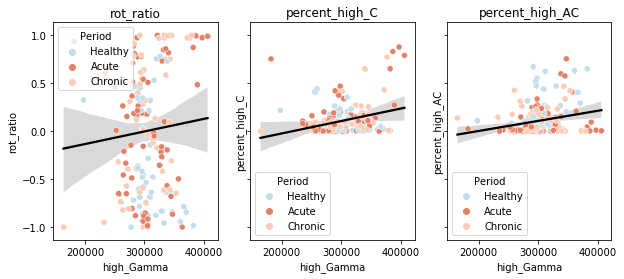

In [39]:
%matplotlib inline
col = 'high_Gamma'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=True)
for indp,col2 in enumerate(['rot_ratio','percent_high_C','percent_high_AC']):
    df3 = df2#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
# #     df3 = df3[(df3.Period!='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title(col2)
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,':')
    print(sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        #print(per,':')
        print(per,':',sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)


<IPython.core.display.Javascript object>


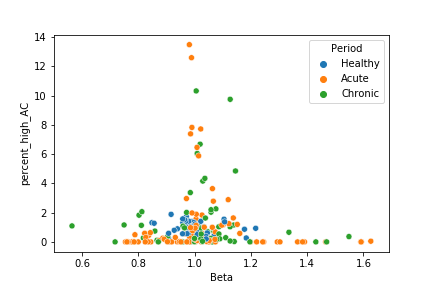

<IPython.core.display.Javascript object>


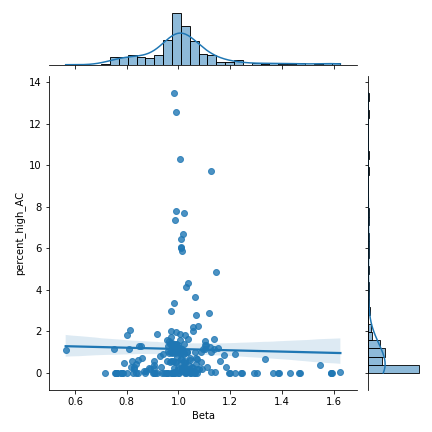

0.0005907911708443936


In [299]:
col = 'Beta'
col2  = 'percent_high_AC'

df2['rot_ratio'].replace(np.inf,np.nan,inplace=True)
df3 = df2
df3[col] = df3.apply(lambda x: x[col]/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)][col].mean(),axis=1 )
df3[col2] = df3.apply(lambda x: x[col2]/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)][col2].mean(),axis=1 )

sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3)
sns.jointplot(x=col,y=col2,data = df3, kind="reg")
df4 = df3[[col,col2]].dropna()
print(r2(df4[col],df4[col2]))



<IPython.core.display.Javascript object>


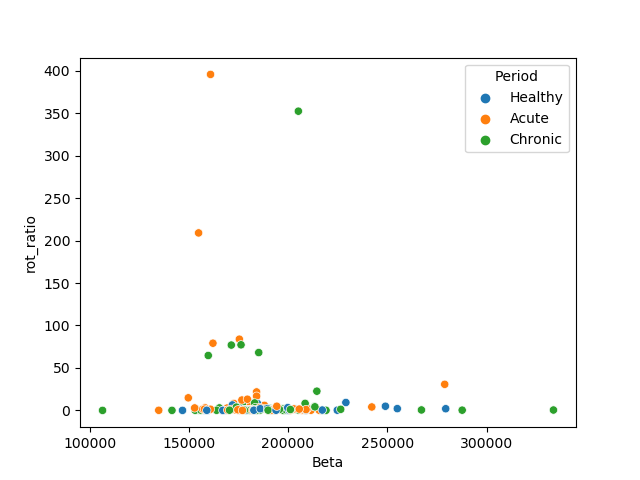

<IPython.core.display.Javascript object>


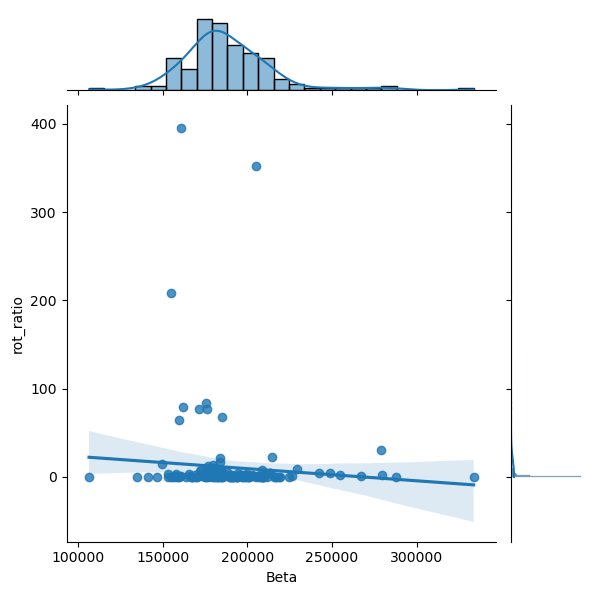

0.006901695421318086


In [130]:
sns.scatterplot(x='Beta',y='rot_ratio',hue = 'Period',data = df2)
sns.jointplot(x='Beta',y='rot_ratio',data = df2, kind="reg")
print(r2(df2.Beta,df2.rot_ratio))

In [132]:
df3 = df2[['Mouse','Period','Sess','high_Gamma','Beta']]
df3['high_Gamma'] = df3.apply(lambda x: x.high_Gamma/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)].high_Gamma.mean(),axis=1 )
df3['Beta'] = df3.apply(lambda x: x.Beta/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)].Beta.mean(),axis=1 )

<ipython-input-132-ee2334fce2ae>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['high_Gamma'] = df3.apply(lambda x: x.high_Gamma/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)].high_Gamma.mean(),axis=1 )
<ipython-input-132-ee2334fce2ae>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['Beta'] = df3.apply(lambda x: x.Beta/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)].Beta.mean(),axis=1 )


In [134]:
df3 = pd.merge(df3,df[['Sess','Period','rot_ratio']],on=['Sess','Period'])
df3

,Mouse,Period,Sess,high_Gamma,Beta,rot_ratio
0,761,Healthy,0761_BaselineA,0.994785,1.021401,2.754491
1,761,Healthy,0761_BaselineL,0.980211,1.008404,5.800546
2,761,Healthy,0761_BaselineS,1.025005,0.970196,2.660000
3,761,Acute,0761_day1,1.031748,0.966656,8.133550
4,761,Acute,0761_day10,0.988715,1.030457,21.743590
...,...,...,...,...,...,...
158,8815,Acute,8815_day2,0.827844,1.001578,1.015779
159,8815,Chronic,8815_day30A,0.922784,1.027746,22.625000
160,8815,Chronic,8815_day34L,0.977880,0.963893,1.027132
161,8815,Acute,8815_day4,0.770673,1.160365,4.031949


<IPython.core.display.Javascript object>


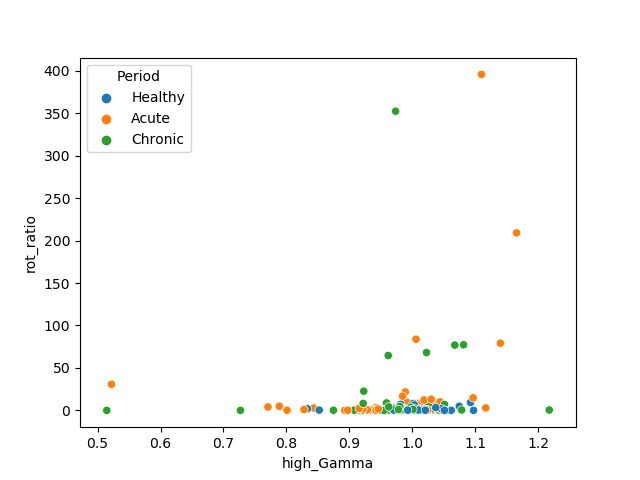

<IPython.core.display.Javascript object>


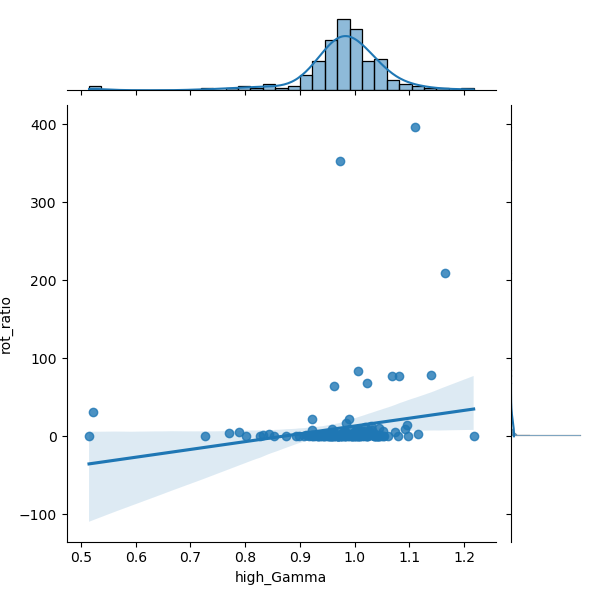

0.032660440743544523


In [135]:
sns.scatterplot(x='high_Gamma',y='rot_ratio',hue = 'Period',data = df3)
sns.jointplot(x='high_Gamma',y='rot_ratio',data = df3, kind="reg")
print(r2(df3.high_Gamma,df3.rot_ratio))

<IPython.core.display.Javascript object>


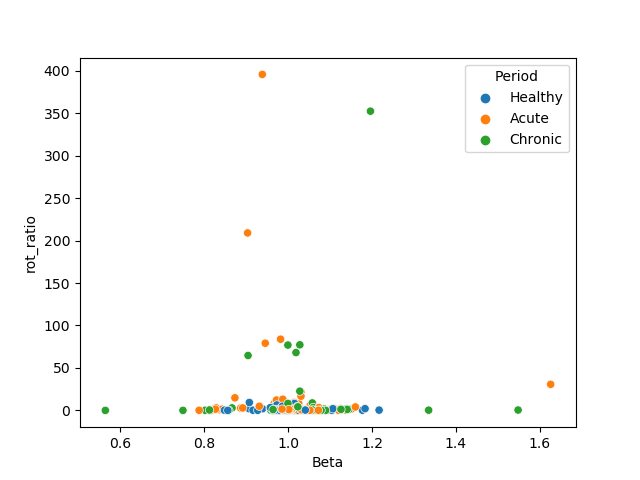

<IPython.core.display.Javascript object>


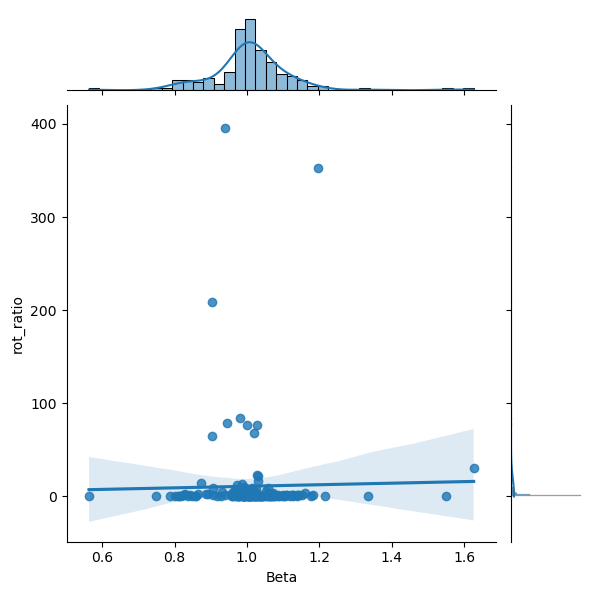

0.0004292536593612147


In [136]:
sns.scatterplot(x='Beta',y='rot_ratio',hue = 'Period',data = df3)
sns.jointplot(x='Beta',y='rot_ratio',data = df3, kind="reg")
print(r2(df3.Beta,df3.rot_ratio))

In [107]:
Pdf = pd.read_csv('D:\\6OHDA\\submission1\\bySessCompareCorr2Sig2.csv')
df = pd.read_csv('D:\\6OHDA\\submission2\\speedData.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df2 = pd.merge(Pdf,df[['Sess','Period','percent_high','percent_low']],on=['Sess','Period'])
df2

,Unnamed: 0,Day,Mouse,Period,Sess,aSymCorr,aSymCorrNotSig,aSymCorrSig,numred,personF,population,sASymCorr,sPersonF,sigPercent,percent_high,percent_low
0,0,0,761,Healthy,0761_BaselineA,0.016887,0.003606,0.149698,1,NaN,MSN-CHI,-0.000093,NaN,0.090909,0.053534,0.797294
1,0,0,761,Healthy,0761_BaselineA,0.021118,0.000154,0.164875,1,NaN,MSN-MSN,-0.000166,NaN,0.127273,0.053534,0.797294
2,0,0,761,Healthy,0761_BaselineL,0.069546,0.006671,0.207870,1,NaN,MSN-CHI,-0.000635,NaN,0.312500,0.097235,0.725523
3,0,0,761,Healthy,0761_BaselineL,0.056678,0.007323,0.218843,1,NaN,MSN-MSN,-0.000036,NaN,0.233333,0.097235,0.725523
4,0,0,761,Healthy,0761_BaselineS,0.048253,0.011056,0.154531,1,NaN,MSN-CHI,-0.000287,NaN,0.259259,0.114800,0.584839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
417,0,6,8815,Acute,8815_day6,NaN,NaN,NaN,4,NaN,MSN-CHI,NaN,NaN,NaN,0.240415,0.736301
418,0,6,8815,Acute,8815_day6,0.081291,-0.003170,0.376904,4,NaN,MSN-MSN,0.000054,NaN,0.222222,0.240415,0.736301
419,0,8,8815,Acute,8815_day8,NaN,NaN,NaN,3,NaN,CHI-CHI,NaN,NaN,NaN,0.387143,0.509664
420,0,8,8815,Acute,8815_day8,0.090898,-0.000171,0.195824,3,NaN,MSN-CHI,0.000011,NaN,0.464646,0.387143,0.509664


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
MSN-MSN (-0.26966545605726644, 7.863408681155956e-05) 0.07271945819057357 0.06823984204656663
Healthy :
MSN-MSN (-0.4658343187918425, 0.0008477862701891652) 0.21700161256425976 0.1999799084895697
Acute :
MSN-MSN (-0.23784045925430014, 0.017761556104799764) 0.056568084058296164 0.046841981832093094
Chronic :
MSN-MSN (-0.28183022264262575, 0.026475388818818477) 0.07942827439479183 0.06408541230137177
----------------------------------------------------------------
MSN-CHI (-0.18957893631597053, 0.235164540665441) 0.03594017309469477 0.011220690353533236
Healthy :
MSN-CHI (-0.4529824350387316, 0.08995505425148206) 0.20519308645361845 0.14405409310389683
Acute :
MSN-CHI (0.39138174216926214, 0.1491289175632028) 0.15317966810344674 0.08803964257294272
Chronic :
MSN-CHI (-0.24858093304310297, 0.46108301312663086) 0.061792480272579664 -0.04245279969713378


C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


----------------------------------------------------------------
MSN-PV (-0.15777528118220885, 0.24113843228420237) 0.024893039352125168 0.007163821885800226
Healthy :
MSN-PV (-0.3680159071835428, 0.26547069056542355) 0.13543570794012605 0.039373008822362277
Acute :
MSN-PV (-0.037261156071845394, 0.8395532907898303) 0.001388393751810657 -0.03189865978979567
Chronic :
MSN-PV (-0.36816072843200887, 0.19526156337642703) 0.1355423219595876 0.06350418212288667


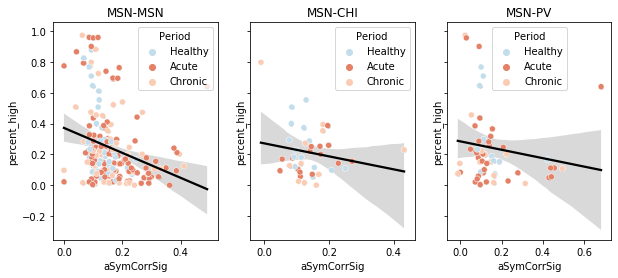

In [111]:
col = 'aSymCorrSig'
col2  = 'percent_high'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=True)
for indp,p in enumerate(['MSN-MSN','MSN-CHI','MSN-PV']):
    df3 = df2[(df2.population==p)]#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title(p)
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)


In [66]:
Pdf = pd.read_csv('D:\\6OHDA\\submission1\\bySessCompareCorr2Sig2.csv')
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df['rot_ratio'] = df.apply(lambda x: (x.percent_high_C-x.percent_high_AC)/(x.percent_high_C+x.percent_high_AC) if (x.percent_high_C+x.percent_high_AC) else np.nan, axis=1)
df2 = pd.merge(Pdf,df[['Sess','Period','rot_ratio','percent_high_C','percent_high_AC','percent_low']],on=['Sess','Period'])
df2

,Unnamed: 0,Day,Mouse,Period,Sess,aSymCorr,aSymCorrNotSig,aSymCorrSig,numred,personF,population,sASymCorr,sPersonF,sigPercent,rot_ratio,percent_high_C,percent_high_AC,percent_low
0,0,0,761,Healthy,0761_BaselineA,0.016887,0.003606,0.149698,1,NaN,MSN-CHI,-0.000093,NaN,0.090909,0.467305,0.115976,0.042104,0.657534
1,0,0,761,Healthy,0761_BaselineA,0.021118,0.000154,0.164875,1,NaN,MSN-MSN,-0.000166,NaN,0.127273,0.467305,0.115976,0.042104,0.657534
2,0,0,761,Healthy,0761_BaselineL,0.069546,0.006671,0.207870,1,NaN,MSN-CHI,-0.000635,NaN,0.312500,0.705906,0.178418,0.030759,0.635936
3,0,0,761,Healthy,0761_BaselineL,0.056678,0.007323,0.218843,1,NaN,MSN-MSN,-0.000036,NaN,0.233333,0.705906,0.178418,0.030759,0.635936
4,0,0,761,Healthy,0761_BaselineS,0.048253,0.011056,0.154531,1,NaN,MSN-CHI,-0.000287,NaN,0.259259,0.453552,0.178839,0.067233,0.470628
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
417,0,6,8815,Acute,8815_day6,NaN,NaN,NaN,4,NaN,MSN-CHI,NaN,NaN,NaN,1.000000,0.080138,0.000000,0.758369
418,0,6,8815,Acute,8815_day6,0.081291,-0.003170,0.376904,4,NaN,MSN-MSN,0.000054,NaN,0.222222,1.000000,0.080138,0.000000,0.758369
419,0,8,8815,Acute,8815_day8,NaN,NaN,NaN,3,NaN,CHI-CHI,NaN,NaN,NaN,0.214447,0.067815,0.043866,0.514286
420,0,8,8815,Acute,8815_day8,0.090898,-0.000171,0.195824,3,NaN,MSN-CHI,0.000011,NaN,0.464646,0.214447,0.067815,0.043866,0.514286


----------------------------------------------------------------
MSN-MSN (-0.24266568302172942, 0.00039982294627447217) 0.05888663371640246 0.054340192333389936
Healthy :
MSN-MSN (-0.22019687923448183, 0.13261174012924462) 0.04848666562460502 0.02780159313818331
Acute :
MSN-MSN (-0.22754211119359252, 0.02350891697871115) 0.05177541236643701 0.041999901153719876
Chronic :
MSN-MSN (-0.31014974213184443, 0.014157267778372425) 0.0961928625444497 0.08112941025352394
----------------------------------------------------------------
MSN-CHI (-0.30090264448906046, 0.055914617194565516) 0.09054240146050985 0.06722297585693326
Healthy :
MSN-CHI (0.032176008647422066, 0.9093690920933312) 0.0010352955324787194 -0.07580814327271512
Acute :
MSN-CHI (-0.1409374557912829, 0.6163663238433374) 0.019863366444919817 -0.05553175921316322
Chronic :
MSN-CHI (-0.5145469669147587, 0.10535003204603738) 0.2647585811611777 0.18306509017908623
----------------------------------------------------------------
MSN-PV 

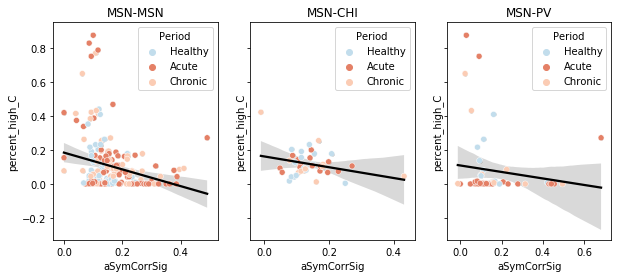

In [63]:

col = 'aSymCorrSig'
col2  = 'percent_high_C'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=True)
for indp,p in enumerate(['MSN-MSN','MSN-CHI','MSN-PV']):
    df3 = df2[(df2.population==p)]#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title(p)
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)


In [25]:
a3[[2,5,4],:]

array([[0.76147636, 0.86851211, 0.92456747],
       [0.89457901, 0.50380623, 0.39976932],
       [0.98246828, 0.80069204, 0.70611303]])

----------------------------------------------------------------
MSN-MSN (-0.15352953389922336, 0.026458558277903253) 0.023571317779312984 0.018854271005300016
Healthy :
MSN-MSN (-0.5022339305946752, 0.0002755215170928491) 0.2522389210405771 0.23598324541102433
Acute :
MSN-MSN (-0.09003821373477514, 0.37545958681155056) 0.008106879932548772 -0.0021188223361878755
Chronic :
MSN-MSN (0.1125347996081158, 0.383842774838664) 0.012664081122838455 -0.0037915175251141964
----------------------------------------------------------------
MSN-CHI (-0.3060667144027586, 0.051634967843984886) 0.09367683366529977 0.07043777811825624
Healthy :
MSN-CHI (-0.5913397357275074, 0.02024504464874629) 0.3496826830502783 0.2996582740541459
Acute :
MSN-CHI (0.23110536307771132, 0.40726065821351326) 0.05340968884328068 -0.019404950476466842
Chronic :
MSN-CHI (-0.3082473446145992, 0.35641183283173794) 0.09501642546195144 -0.0055373050422762304
----------------------------------------------------------------
MSN-PV

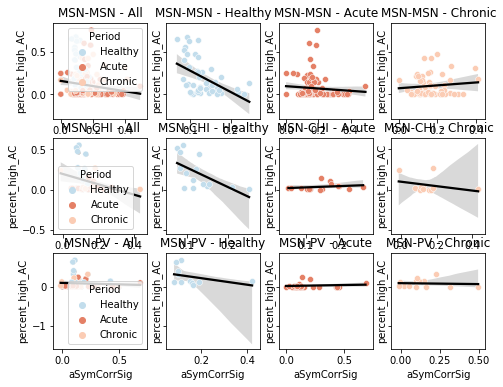

In [67]:
%matplotlib inline
col = 'aSymCorrSig'
col2  = 'percent_high_AC'
colors = a3[[2,5,4],:]
fig, ax = plt.subplots(3,4,figsize=(7.74,6),sharey='row')
for indp,p in enumerate(['MSN-MSN','MSN-CHI','MSN-PV']):
    df3 = df2[(df2.population==p)]#&(df2.cre.isin(['PV','CHI']))]
#     df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
#     df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period=='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp,0])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp,0])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp,0].set_title(p+ ' - All')
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for iPer,per in enumerate(df3.Period.unique()):
        sns.regplot(x=col,y=col2,data = df3[df3.Period == per],color='k',marker=".",ax=ax[indp,iPer+1])
        sns.scatterplot(x=col,y=col2,data = df3[df3.Period == per],color=colors[iPer,:],ax=ax[indp,iPer+1])
        ax[indp,iPer+1].set_title(p + ' - '+per)
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        print(per,':')
        print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
# fig.savefig(figFolder+'S10.svg',transparent=True)

<IPython.core.display.Javascript object>


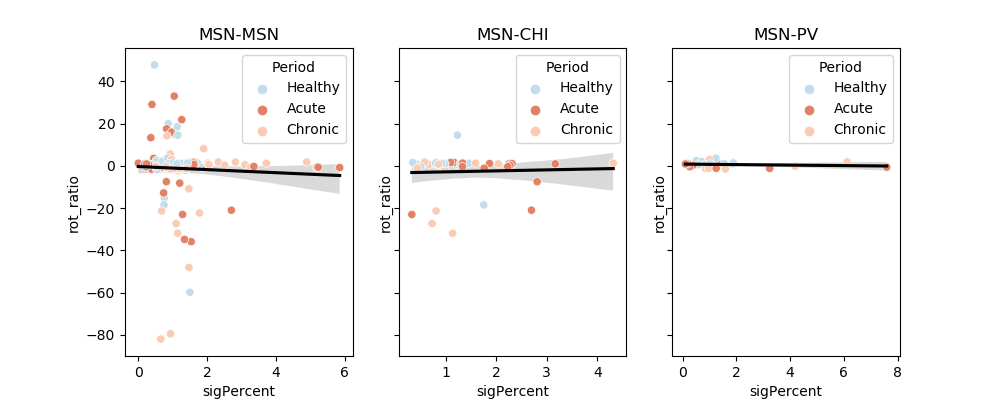

<ipython-input-213-fde4690d061f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
<ipython-input-213-fde4690d061f>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning sca

MSN-MSN (-0.0455414001021824, 0.5553834966777922) 0.0020740191232669902 -0.00386601647718976
MSN-CHI (0.04258451147315476, 0.7915015633674127) 0.0018134406174070694 -0.02378108654624911
MSN-PV (-0.15767521288271943, 0.38875988885494855) 0.02486147275761097 -0.007643144817135461


<ipython-input-213-fde4690d061f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
<ipython-input-213-fde4690d061f>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
C:\Users\dzemel\Miniconda3\lib\site-packages\seaborn\_core.py:163: FutureWarning: elementwise comparison failed; returning sca

In [213]:
# from sklearn.linear_model import LinearRegression
# df2['rot_ratio'].replace(np.inf,np.nan,inplace=True)
# df2 = df2.dropna()
col = 'aSymCorrSig'
col2  = 'rot_ratio'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=True)
for indp,p in enumerate(['MSN-MSN','MSN-CHI','MSN-PV']):
    df3 = df2[(df2.population==p)]#&(df2.cre.isin(['PV','CHI']))]
    df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
    df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
#     df3 = df3[(df3.Period!='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title(p)
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)

    print(p,sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
# fig.savefig(figFolder+'S10a',transparent=True)

<ipython-input-266-606f4ff23495>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[col] = df3.apply(lambda x: x[col]/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)][col].mean(),axis=1 )
<ipython-input-266-606f4ff23495>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['rot_ratio'] = df3.apply(lambda x: x.rot_ratio/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)].rot_ratio.mean(),axis=1 )


0.019407851500555403


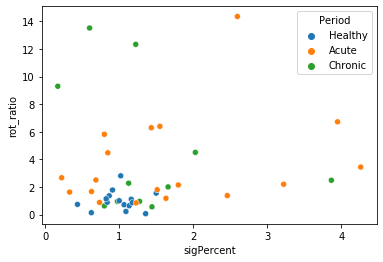

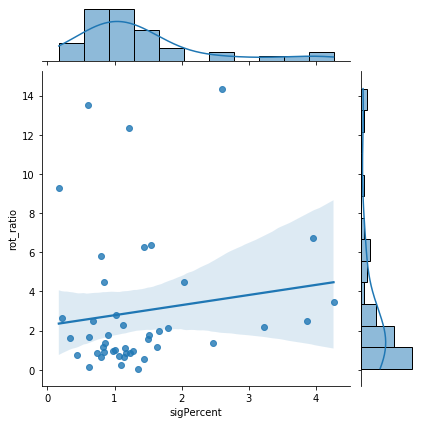

In [266]:
df2['rot_ratio'].replace(np.inf,np.nan,inplace=True)
df2 = df2.dropna()
col = 'sigPercent'
for p in ['MSN-CHI']:#df2.population.unique():
    df3 = df2[(df2.population==p)]
    df3[col] = df3.apply(lambda x: x[col]/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)][col].mean(),axis=1 )
    df3['rot_ratio'] = df3.apply(lambda x: x.rot_ratio/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)].rot_ratio.mean(),axis=1 )

    sns.scatterplot(x=col,y='rot_ratio',hue = 'Period',data = df3)
    sns.jointplot(x=col,y='rot_ratio',data = df3, kind="reg")
    print(r2(df3[col],df3.rot_ratio))

In [249]:
df3

,Unnamed: 0,Day,Mouse,Period,Sess,aSymCorr,aSymCorrNotSig,aSymCorrSig,numred,population,sASymCorr,sigPercent,rot_ratio,percent_high_C,percent_high_AC


<ipython-input-144-7d10217a8ad7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['aSymCorrSig'] = df3.apply(lambda x: x.aSymCorrSig/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)].aSymCorrSig.mean(),axis=1 )


<IPython.core.display.Javascript object>


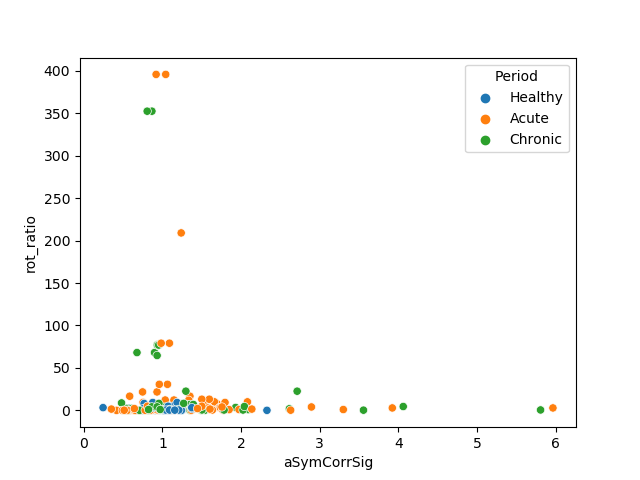

<IPython.core.display.Javascript object>


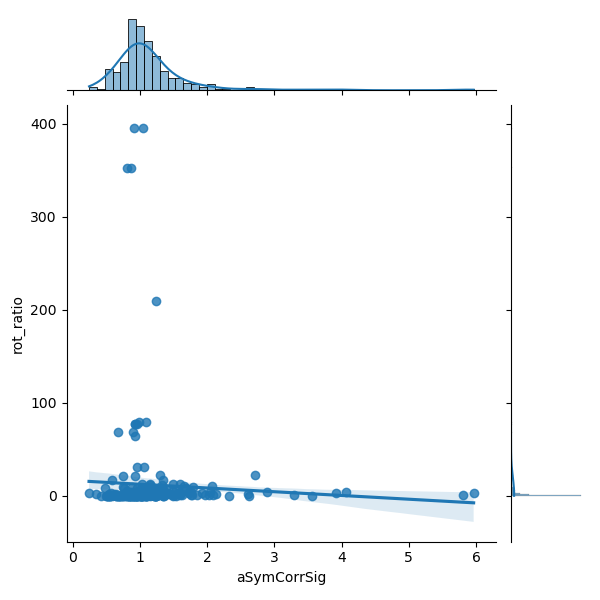

0.002904816156542622


In [144]:
df3 = df2[['Mouse','Period','Sess','aSymCorrSig','rot_ratio']]
df3['aSymCorrSig'] = df3.apply(lambda x: x.aSymCorrSig/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)].aSymCorrSig.mean(),axis=1 )

sns.scatterplot(x='aSymCorrSig',y='rot_ratio',hue = 'Period',data = df3)
sns.jointplot(x='aSymCorrSig',y='rot_ratio',data = df3, kind="reg")
print(r2(df3.aSymCorrSig,df3.rot_ratio))

In [275]:
Pdf = pd.read_csv('D:\\6OHDA\\submission2\\mvmtCorrSig.csv')
Pdf = Pdf.drop(['personF','sPersonF'],axis=1)
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df['rot_ratio'] = df.apply(lambda x: x.percent_high_C/x.percent_high_AC if x.percent_high_AC else np.inf, axis=1)
df2 = pd.merge(Pdf,df[['Sess','Period','rot_ratio','percent_high_C','percent_high_AC']],on=['Sess','Period'])

df2['rot_ratio'].replace(np.inf,np.nan,inplace=True)
df2 = df2.dropna()

df2

,Unnamed: 0,Day,Mouse,Period,Sess,aSymCorr,aSymCorrNotSig,aSymCorrSig,mvmt,numred,population,sASymCorr,sigPercent,rot_ratio,percent_high_C,percent_high_AC
1,0,0,761,Healthy,0761_BaselineA,0.017792,0.006223,0.266518,hiSpeed,1,MSN-MSN,0.006684,0.044444,2.754491,0.115976,0.042104
3,0,0,761,Healthy,0761_BaselineA,0.006900,0.000980,0.308824,highContra,1,MSN-MSN,0.005809,0.019231,2.754491,0.115976,0.042104
6,0,0,761,Healthy,0761_BaselineA,0.016498,0.002930,0.152174,lowRot,1,MSN-CHI,0.002525,0.090909,2.754491,0.115976,0.042104
7,0,0,761,Healthy,0761_BaselineA,0.017238,0.000795,0.113836,lowRot,1,MSN-MSN,0.002742,0.145455,2.754491,0.115976,0.042104
8,0,0,761,Healthy,0761_BaselineA,0.010249,0.002524,0.087500,lowSpeed,1,MSN-CHI,0.003043,0.090909,2.754491,0.115976,0.042104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2155,0,8,8815,Acute,8815_day8,0.005200,0.000484,0.188264,lowRot,3,MSN-MSN,0.001124,0.025113,1.545977,0.067815,0.043866
2157,0,8,8815,Acute,8815_day8,0.001790,0.000065,0.224224,lowSpeed,3,MSN-CHI,0.001529,0.007692,1.545977,0.067815,0.043866
2158,0,8,8815,Acute,8815_day8,0.006513,0.000417,0.208153,lowSpeed,3,MSN-MSN,0.001143,0.029349,1.545977,0.067815,0.043866
2160,0,8,8815,Acute,8815_day8,0.003948,0.001301,0.272624,totRot,3,MSN-CHI,0.002568,0.009756,1.545977,0.067815,0.043866


<ipython-input-287-2a2336441e6e>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[col] = df3.apply(lambda x: x[col]/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)][col].mean(),axis=1 )
<ipython-input-287-2a2336441e6e>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[col2] = df3.apply(lambda x: x[col2]/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)][col2].mean(),axis=1 )


<IPython.core.display.Javascript object>


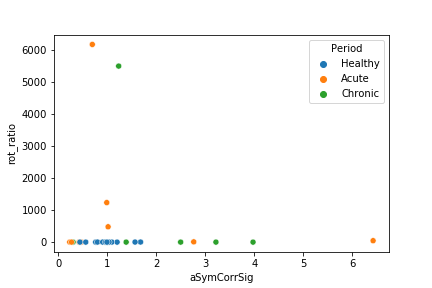

<IPython.core.display.Javascript object>


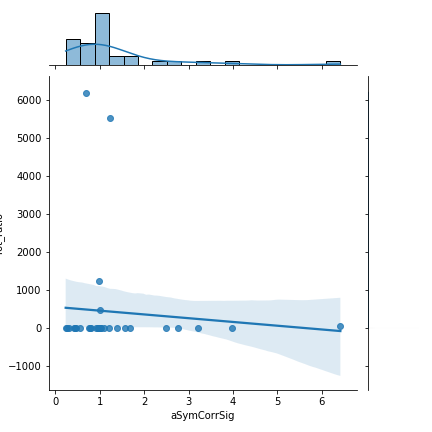

0.007394624435978725


In [287]:
col = 'aSymCorrSig'
col2  = 'rot_ratio'
mvmt = 'totRot'
df2['rot_ratio'].replace(np.inf,np.nan,inplace=True)
for p in ['MSN-PV']:#df2.population.unique():
    df3 = df2[(df2.population==p)&(df2.mvmt == mvmt)]
    df3[col] = df3.apply(lambda x: x[col]/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)][col].mean(),axis=1 )
    df3[col2] = df3.apply(lambda x: x[col2]/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)][col2].mean(),axis=1 )
    
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3)
    sns.jointplot(x=col,y=col2,data = df3, kind="reg")
    df4 = df3[[col,col2]].dropna()
    print(r2(df4[col],df4[col2]))

------ EnD of rotation ratio stuf ------

In [206]:
# add speed data:
f = h5py.File('D:\\6OHDA\\Spectograms.hdf5','r') 
df = pd.DataFrame(columns = ['Mouse','Period','Sess'])
dtL = 0.00032768
for m in tqdm(miceList):
    data =  getData(Files[0],['lfp','trace'],period ='Pre', mice=m)
    for sess in data:
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        period = periodCalc(day)
        # get data
        freq = f[m][sess]['Pre']['freq'][:]
        coeff = np.abs(f[m][sess]['Pre']['coeff'][:])
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        coeff = coeff[:,(lfpOutliers[:,0]==0)]
        Hs = np.nansum(coeff, axis=0)
        coeff = coeff/Hs
        frquencies = {'high_Gamma':freq > 60, 'low_Gamma':(freq >= 40) & (freq<60), 'high_Beta_15to20':(freq >= 15) & (freq<20),
         'Beta':(freq >= 10) & (freq<15),'theta':(freq >= 6) & (freq<8),'beta3':(freq >= 15) & (freq<18),
         'beta4':(freq >= 20) & (freq<25)}
        
        Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
        numRed = int(data[sess]['trace']['numred'])
        Ca = Ca[np.sum(Ca,axis=1)>0,numRed:]
        Ca = np.mean(Ca,axis=0)
        
        caT = np.arange(max(Ca.shape))*0.05
        CaF = sci.interpolate.interp1d(caT, Ca,kind='linear')
        lfpT = np.arange(max(coeff.shape))*dtL
        
        if max(caT)< max(lfpT):
            endInd = np.argmin(np.abs(max(caT)-lfpT))
            print(endInd)
            while lfpT[endInd]>max(caT):
                endInd = endInd-1
        CaNew = CaF(lfpT[:endInd])
        
        df2 = pd.DataFrame([{'Mouse':m,'Period':period,'Sess':sess}])
        for fr in frquencies.keys():
            power =np.sum(coeff[frquencies[fr],:],axis=0)
            df2[fr] = np.corrcoef(x=CaNew,y=power[:endInd])[0,1]
        
        df = pd.concat([df,df2])
            

df.to_csv(figFolder+'powerCorrelation2.csv')

f.close()        

                

                


  0%|                                                                                           | 0/16 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
1815491
1815491
1815491


C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\_methods.py:162: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


1815643
1815338
1815643
1815643
1815186
1815643
1815643
1815338
1815491
1815491
1815491


  6%|█████▏                                                                            | 1/16 [02:30<37:39, 150.61s/it]

cleaning up trace data
cleaning up lfp data
I deleted session: 1208_day12
1815643
1815338
1815491
1815338
1815491
1815491
found  17.0  outlier points
1815338
1815338
1815491
1815338
1815491
1815338
1815338


 12%|██████████▎                                                                       | 2/16 [04:58<34:56, 149.78s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815491
1815491
1815643
1815643
1815491
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643


 19%|███████████████▍                                                                  | 3/16 [07:34<32:52, 151.71s/it]

cleaning up trace data
cleaning up lfp data
1815338
1815186
1815338


 25%|████████████████████▌                                                             | 4/16 [08:09<23:18, 116.55s/it]

cleaning up trace data
cleaning up lfp data
found  1.0  outlier points
1815338
1815491
1815338
1815186
1815491
1815033
1815491
1815643
1815338
found  888231.0  outlier points
found  481139.0  outlier points
1815338
1815186
1815491


 31%|█████████████████████████▋                                                        | 5/16 [10:42<23:24, 127.72s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815491
1815643


 38%|███████████████████████████████▏                                                   | 6/16 [11:17<16:38, 99.80s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815033
1815491
1815491
1815491
1815491
1815338
1815643
1815491
1815643
1815643
1815491
1815491
1815186


 44%|███████████████████████████████████▉                                              | 7/16 [13:57<17:40, 117.85s/it]

cleaning up trace data
cleaning up lfp data
I deleted session: 2976_day4
found  1.0  outlier points
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
found  3.0  outlier points
1815643


 50%|█████████████████████████████████████████                                         | 8/16 [16:25<16:54, 126.78s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643


 56%|██████████████████████████████████████████████▏                                   | 9/16 [19:01<15:49, 135.60s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815643
1815643
1815491
1815643
1815643
found  50.0  outlier points
1815643
1815643
1815643
1815643
1448822
1815643
1815643


 62%|██████████████████████████████████████████████████▋                              | 10/16 [21:37<14:09, 141.65s/it]

cleaning up trace data
cleaning up lfp data
1815491
1815033
1815338
1815338
found  29.0  outlier points
1814880
1815491
1815186
1815338
1815033
1815491
1815186
1815491
1815491
1815491
1815643
1815033
1815033
1815033
1815338


 69%|███████████████████████████████████████████████████████▋                         | 11/16 [25:06<13:29, 161.93s/it]

cleaning up trace data
cleaning up lfp data
1815033
1815491
1815643
1814728
1815491
1814728
1815033
1815033
1815491
1815491
1815338
1815491
1815338
1815186
1815338
1815186
1814880


 75%|████████████████████████████████████████████████████████████▊                    | 12/16 [28:17<11:23, 170.81s/it]

cleaning up trace data
cleaning up lfp data
1814880
1815491
1815033
1815186
1815033
1815033
1815186
1813965
1814575
1815491
1815491
1815186
1815643
1815186
1815338
1814575
1815186
1814270
1813049


 81%|█████████████████████████████████████████████████████████████████▊               | 13/16 [31:48<09:08, 182.79s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815491
1815338
1815643
1815186
1815643
1815491
1815338
1815491
1815491
1815186
1815338
1815643


 88%|██████████████████████████████████████████████████████████████████████▉          | 14/16 [34:14<05:43, 171.57s/it]

cleaning up trace data
cleaning up lfp data
1815491
1815491
1815491
1815643
1815643
1815491
1815491
1815491
1815643
1815491
1815338
1815643
1781006
1815338


 94%|███████████████████████████████████████████████████████████████████████████▉     | 15/16 [36:50<02:47, 167.04s/it]

cleaning up trace data
cleaning up lfp data
1815033
1815643
1814880
1612396
1815491
1815033
1815338
1815338
1815643
1815338
1815491
1815186
1631012
1815186


100%|█████████████████████████████████████████████████████████████████████████████████| 16/16 [39:24<00:00, 147.78s/it]


<IPython.core.display.Javascript object>


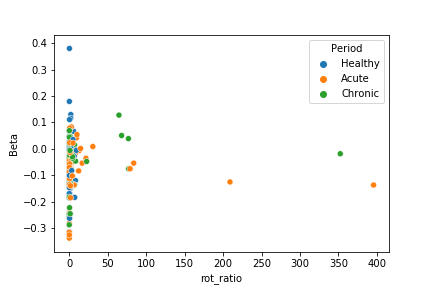

In [424]:
#GETBACKHERE
Pdf = pd.read_csv(figFolder+'powerCorrelation.csv')
df = pd.read_csv('D:\\6OHDA\\submission2\\rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df['rot_ratio'] = df.apply(lambda x: x.percent_high_C/x.percent_high_AC if x.percent_high_AC else np.inf, axis=1)
df2 = pd.merge(Pdf,df[['Sess','Period','rot_ratio','percent_high_C','percent_high_AC']],on=['Sess','Period'])

df2['rot_ratio'].replace(np.inf,np.nan,inplace=True)
# df2 = df2.dropna()

sns.scatterplot(x='rot_ratio',y='Beta',hue='Period',data=df2)

In [ ]:
%matplotlib inline
col = 'Beta'
#col2  = 'percent_high_C'
fig, ax = plt.subplots(1,3,figsize=(10,4),sharey=True)
for indp,col2 in enumerate(['rot_ratio','percent_high_C','percent_high_AC']):
    df3 = df2#&(df2.cre.isin(['PV','CHI']))]
    df3[col] = df3.apply(lambda x: x[col]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col].mean(),axis=1 )
    df3[col2] = df3.apply(lambda x: x[col2]/df2[(df2.Period=='Healthy')&(df2.Mouse==x.Mouse)][col2].mean(),axis=1 )
# #     df3 = df3[(df3.Period!='Healthy')]
    sns.regplot(x=col,y=col2,data = df3,color='k',marker=".",ax=ax[indp])
    sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3,palette=colorPallet3,ax=ax[indp])
#     ax[indp].set_ylim(-1.1,1.1)
    ax[indp].set_title(col2)
#     sns.jointplot(x=col,y=col2,data = df3,hue = 'Period')#, kind="reg")
    df4 = df3[[col,col2]].dropna()
    df4['Intercept']=1
    model = sm.OLS(df4[col2], df4[['Intercept',col]])
    model_results = model.fit()
    b = model_results.params
    a =np.sum(b*df4[['Intercept',col]],axis=1)
    
    print ('----------------------------------------------------------------')
    print(col2,':')
    print(sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)
    for per in df3.Period.unique():
        df4 = df3[df3.Period == per][[col,col2]].dropna()
        df4['Intercept']=1
        model = sm.OLS(df4[col2], df4[['Intercept',col]])
        model_results = model.fit()
        b = model_results.params
        a =np.sum(b*df4[['Intercept',col]],axis=1)
        #print(per,':')
        print(per,':',sci.stats.pearsonr(df4[col],df4[col2]),model_results.rsquared,model_results.rsquared_adj)


<IPython.core.display.Javascript object>


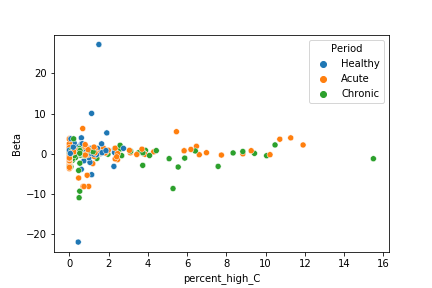

<IPython.core.display.Javascript object>


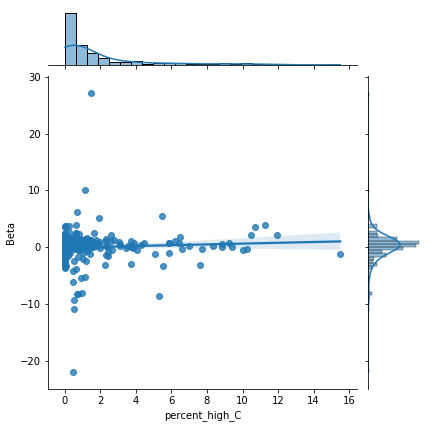

0.003145428658422484


In [430]:
col2 = 'Beta'
col = 'percent_high_C'
df3 = df2
df3[col] = df3.apply(lambda x: x[col]/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)][col].mean(),axis=1 )
# df3[col2] = df3.apply(lambda x: x[col2]/df3[(df3.Period=='Healthy')&(df3.Mouse==x.Mouse)][col2].mean(),axis=1 )

sns.scatterplot(x=col,y=col2,hue = 'Period',data = df3)
sns.jointplot(x=col,y=col2,data = df3, kind="reg")
df4 = df3[[col,col2]].dropna()
print(r2(df4[col],df4[col2]))

In [243]:
# add speed data:
f = h5py.File('D:\\6OHDA\\Spectograms.hdf5','r') 
mvmtType = {'highIpsi':"getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')",
            'highContra':"getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')",
            'lowRot':"getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')",
            'lowSpeed':"getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')",
            'hiSpeed':"getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')",
           'totRot':"getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')+getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')"}

df = pd.DataFrame(columns = ['Mouse','Period','Sess'])
dtL = 0.00032768
for m in tqdm(miceList):
    data =  getData(Files[0],['lfp','trace'],period ='Pre', mice=m)
    for sess in tqdm(data):
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        period = periodCalc(day)
        # get data
        freq = f[m][sess]['Pre']['freq'][:]
        coeff = np.abs(f[m][sess]['Pre']['coeff'][:])
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        coeff = coeff[:,(lfpOutliers[:,0]==0)]
        Hs = np.nansum(coeff, axis=0)
        coeff = coeff/Hs
        frquencies = {'high_Gamma':freq > 60, 'low_Gamma':(freq >= 40) & (freq<60), 'high_Beta_15to20':(freq >= 15) & (freq<20),
         'Beta':(freq >= 10) & (freq<15),'theta':(freq >= 6) & (freq<8),'beta3':(freq >= 15) & (freq<18),
         'beta4':(freq >= 20) & (freq<25)}
        
        Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
        numRed = int(data[sess]['trace']['numred'])
        Ca = Ca[np.sum(Ca,axis=1)>0,numRed:]
        Ca = np.mean(Ca,axis=0)
        
        caT = np.arange(max(Ca.shape))*0.05
        CaF = sci.interpolate.interp1d(caT, Ca,kind='linear')
        lfpT = np.arange(max(coeff.shape))*dtL

        if max(caT)< max(lfpT):
            endInd = np.argmin(np.abs(max(caT)-lfpT))
            while lfpT[endInd]>max(caT):
                endInd = endInd-1


        for mv in mvmtType.keys(): 
            mVector = eval(mvmtType[mv])
            if np.sum(mVector)==0:
                continue
            try:
                mvF = sci.interpolate.interp1d(caT, mVector,kind='linear')
            except:
                caT = np.arange(max(mVector.shape))*0.05
                mvF = sci.interpolate.interp1d(caT, mVector,kind='linear')
                if max(caT)< max(lfpT):
                    endInd2 = np.argmin(np.abs(max(caT)-lfpT))
                    while lfpT[endInd2]>max(caT):
                        endInd2 = endInd2-1
                    endInd = np.min((endInd2,endInd))
            mvNew = mvF(lfpT[:endInd])>0
            CaNew = CaF(lfpT[:endInd])
            
            df2 = pd.DataFrame([{'Mouse':m,'Period':period,'Sess':sess,'mvmt':mv}])
            for fr in frquencies.keys():
                power =np.sum(coeff[frquencies[fr],:endInd],axis=0)
                df2[fr] = np.corrcoef(x=CaNew[mvNew],y=power[mvNew])[0,1]

            df = pd.concat([df,df2])
            

df.to_csv(figFolder+'powerCorrelation_mvmt.csv')

f.close()


                

                


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



 36%|█████████████████████████████▋                                                     | 5/14 [01:21<02:26, 16.29s/it]C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
I deleted session: 1208_day12



 46%|██████████████████████████████████████▎                                            | 6/13 [02:09<02:29, 21.38s/it]

found  17.0  outlier points



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
found  1.0  outlier points



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [03:07<01:41, 20.33s/it]

found  888231.0  outlier points



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [03:20<01:13, 18.26s/it]

found  481139.0  outlier points



  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
I deleted session: 2976_day4
found  1.0  outlier points



 92%|███████████████████████████████████████████████████████████████████████████▋      | 12/13 [04:11<00:20, 20.83s/it]

found  3.0  outlier points



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



 43%|███████████████████████████████████▌                                               | 6/14 [02:12<02:55, 21.94s/it]

found  50.0  outlier points



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



 21%|█████████████████▍                                                                 | 4/19 [01:22<05:05, 20.38s/it]

found  29.0  outlier points



  0%|                                                                                           | 0/17 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data



100%|███████████████████████████████████████████████████████████████████████████████| 16/16 [1:10:35<00:00, 264.70s/it]


In [301]:
df = pd.read_csv(figFolder+'powerCorrelation_mvmt.csv')
df

,Unnamed: 0,Mouse,Period,Sess,mvmt,high_Gamma,low_Gamma,high_Beta_15to20,Beta,theta,beta3,beta4
0,0,761,Healthy,0761_BaselineA,highIpsi,0.142371,0.060712,-0.079196,-0.062748,0.143740,-0.062168,-0.028192
1,0,761,Healthy,0761_BaselineA,highContra,0.115500,0.042990,-0.016668,-0.005389,-0.008554,-0.058344,-0.106247
2,0,761,Healthy,0761_BaselineA,lowRot,0.041953,-0.001634,-0.037376,0.027816,0.074778,-0.018999,-0.058810
3,0,761,Healthy,0761_BaselineA,lowSpeed,0.052080,0.001561,-0.022612,0.002131,0.111693,-0.000482,-0.069462
4,0,761,Healthy,0761_BaselineA,hiSpeed,0.104007,-0.038755,0.038046,0.132059,-0.027910,0.046377,-0.075427
...,...,...,...,...,...,...,...,...,...,...,...,...
1128,0,8815,Acute,8815_day8,highContra,-0.005929,0.121683,-0.084865,0.047980,-0.048672,-0.150737,-0.123109
1129,0,8815,Acute,8815_day8,lowRot,0.157704,0.050661,-0.056007,-0.133132,-0.061934,-0.078713,-0.026808
1130,0,8815,Acute,8815_day8,lowSpeed,0.128274,0.065281,-0.080420,-0.160647,-0.049278,-0.086272,-0.049003
1131,0,8815,Acute,8815_day8,hiSpeed,0.059052,0.019946,-0.062018,0.050954,-0.074324,-0.079553,-0.013883


In [344]:
# add speed data:
f = h5py.File('D:\\6OHDA\\Spectograms.hdf5','r') 
df = pd.DataFrame(columns = ['Mouse','Period','Sess'])
dtL = 0.00032768
tPlot = np.linspace(-4,4,int(8/dtL-1))
for m in tqdm(miceList):
    data =  getData(Files[0],['lfp','trace'],period ='Pre', mice=m)
    for sess in data:
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        period = periodCalc(day)
        # get data
        freq = f[m][sess]['Pre']['freq'][:]
        coeff = np.abs(f[m][sess]['Pre']['coeff'][:])
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        coeff = coeff[:,(lfpOutliers[:,0]==0)]
        Hs = np.nansum(coeff, axis=0)
        coeff = coeff/Hs
        frquencies = {'high_Gamma':freq > 60, 'low_Gamma':(freq >= 40) & (freq<60), 'high_Beta_15to20':(freq >= 15) & (freq<20),
         'Beta':(freq >= 10) & (freq<15),'theta':(freq >= 6) & (freq<8),'beta3':(freq >= 15) & (freq<18),
         'beta4':(freq >= 20) & (freq<25)}
        
        Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
        numRed = int(data[sess]['trace']['numred'])
        Ca = Ca[np.sum(Ca,axis=1)>0,numRed:]
        Ca = np.mean(Ca,axis=0)
        
        caT = np.arange(max(Ca.shape))*0.05
        CaF = sci.interpolate.interp1d(caT, Ca,kind='linear')
        lfpT = np.arange(max(coeff.shape))*dtL
        
        if max(caT)< max(lfpT):
            endInd = np.argmin(np.abs(max(caT)-lfpT))
            print(endInd)
            while lfpT[endInd]>max(caT):
                endInd = endInd-1
        
        mVector = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
        if np.sum(mVector)==0:
            continue
        try:
            mvF = sci.interpolate.interp1d(caT, mVector,kind='linear')
        except:
            caT = np.arange(max(mVector.shape))*0.05
            mvF = sci.interpolate.interp1d(caT, mVector,kind='linear')
            if max(caT)< max(lfpT):
                endInd2 = np.argmin(np.abs(max(caT)-lfpT))
                while lfpT[endInd2]>max(caT):
                    endInd2 = endInd2-1
                endInd = np.min((endInd2,endInd))
        mvNew = mvF(lfpT[:endInd])>0
        CaNew = CaF(lfpT[:endInd])
            
        
        
        
        C = [np.mean(CaNew[i : i + tPlot.shape[0]]) for i in range(0, CaNew.shape[0],int(np.ceil(2/dtL)))] 
        M = [np.mean(mvNew[i : i + tPlot.shape[0]]) for i in range(0, mvNew.shape[0],int(np.ceil(2/dtL)))] 
        
        df2 = pd.DataFrame(np.array([C,M]).T, columns = ['Corr','highSpeed'])
        df2['Mouse'] = m
        df2['Period']=period
        df2['Sess']=sess

        
        for fr in frquencies.keys():
            power =np.sum(coeff[frquencies[fr],:endInd],axis=0)
            P = [np.mean(power[i : i + tPlot.shape[0]]) for i in range(0, power.shape[0],int(np.ceil(2/dtL)))]  
            df2[fr] = P
        
        df = pd.concat([df,df2])
            

df.to_csv(figFolder+'powerCorrelation_window.csv')

f.close()        

                

                


  0%|                                                                                           | 0/16 [00:00<?, ?it/s]D:\6OHDA\IO.py:48: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  lfp = hf[m][s]['ePhys']['lfp'].value
D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value


cleaning up trace data
cleaning up lfp data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


1815491
1815491
1815491


C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\core\_methods.py:162: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


1815643
1815338
1815643
1815643
1815186
1815643
1815643
1815338
1815491
1815491
1815491


  6%|█████▏                                                                            | 1/16 [02:32<38:14, 152.96s/it]

cleaning up trace data
cleaning up lfp data
I deleted session: 1208_day12
1815643
1815338
1815491
1815338
1815491
1815491
found  17.0  outlier points
1815338
1815338
1815491
1815338
1815491
1815338
1815338


 12%|██████████▎                                                                       | 2/16 [05:01<35:24, 151.76s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815491
1815491
1815643
1815643
1815491
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643


 19%|███████████████▍                                                                  | 3/16 [07:38<33:13, 153.34s/it]

cleaning up trace data
cleaning up lfp data
1815338
1815186
1815338


 25%|████████████████████▌                                                             | 4/16 [08:13<23:32, 117.71s/it]

cleaning up trace data
cleaning up lfp data
found  1.0  outlier points
1815338
1815491
1815338
1815186
1815491
1815033
1815491
1815643
1815338
found  888231.0  outlier points
found  481139.0  outlier points
1815338
1815186
1815491


 31%|█████████████████████████▋                                                        | 5/16 [10:48<23:37, 128.87s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815491
1815643


 38%|██████████████████████████████▊                                                   | 6/16 [11:23<16:47, 100.71s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815033
1815491
1815491
1815491
1815491
1815338
1815643
1815491
1815643
1815643
1815491
1815491
1815186


 44%|███████████████████████████████████▉                                              | 7/16 [14:02<17:44, 118.33s/it]

cleaning up trace data
cleaning up lfp data
I deleted session: 2976_day4
found  1.0  outlier points
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
found  3.0  outlier points
1815643


 50%|█████████████████████████████████████████                                         | 8/16 [16:30<16:57, 127.17s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643
1815643


 56%|██████████████████████████████████████████████▏                                   | 9/16 [19:06<15:51, 135.88s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815643
1815643
1815491
1815643
1815643
found  50.0  outlier points
1815643
1815643
1815643
1815643
1448822
1815643
1815643


 62%|██████████████████████████████████████████████████▋                              | 10/16 [21:42<14:11, 141.93s/it]

cleaning up trace data
cleaning up lfp data
1815491
1815033
1815338
1815338
found  29.0  outlier points
1814880
1815491
1815186
1815338
1815033
1815491
1815186
1815491
1815491
1815491
1815643
1815033
1815033
1815033
1815338


 69%|███████████████████████████████████████████████████████▋                         | 11/16 [25:12<13:30, 162.17s/it]

cleaning up trace data
cleaning up lfp data
1815033
1815491
1815643
1814728
1815491
1814728
1815033
1815033
1815491
1815491
1815338
1815491
1815338
1815186
1815338
1815186
1814880


 75%|████████████████████████████████████████████████████████████▊                    | 12/16 [28:25<11:25, 171.36s/it]

cleaning up trace data
cleaning up lfp data
1814880
1815491
1815033
1815186
1815033
1815033
1815186
1813965
1814575
1815491
1815491
1815186
1815643
1815186
1815338
1814575
1815186
1814270
1813049


 81%|█████████████████████████████████████████████████████████████████▊               | 13/16 [31:53<09:06, 182.32s/it]

cleaning up trace data
cleaning up lfp data
1815643
1815491
1815338
1815643
1815186
1815643
1815491
1815338
1815491
1815491
1815186
1815338
1815643


 88%|██████████████████████████████████████████████████████████████████████▉          | 14/16 [34:18<05:42, 171.29s/it]

cleaning up trace data
cleaning up lfp data
1815491
1815491
1815491
1815643
1815643
1815491
1815491
1815491
1815643
1815491
1815338
1815643
1781006
1815338


 94%|███████████████████████████████████████████████████████████████████████████▉     | 15/16 [36:55<02:47, 167.01s/it]

cleaning up trace data
cleaning up lfp data
1815033
1815643
1814880
1612396
1815491
1815033
1815338
1815338
1815643
1815338
1815491
1815186
1631012
1815186


100%|█████████████████████████████████████████████████████████████████████████████████| 16/16 [39:29<00:00, 148.09s/it]


In [360]:
df = pd.read_csv(figFolder+'powerCorrelation_mvmt.csv')
df.mvmt.unique()


array(['highIpsi', 'highContra', 'lowRot', 'lowSpeed', 'hiSpeed',
       'totRot'], dtype=object)

<IPython.core.display.Javascript object>


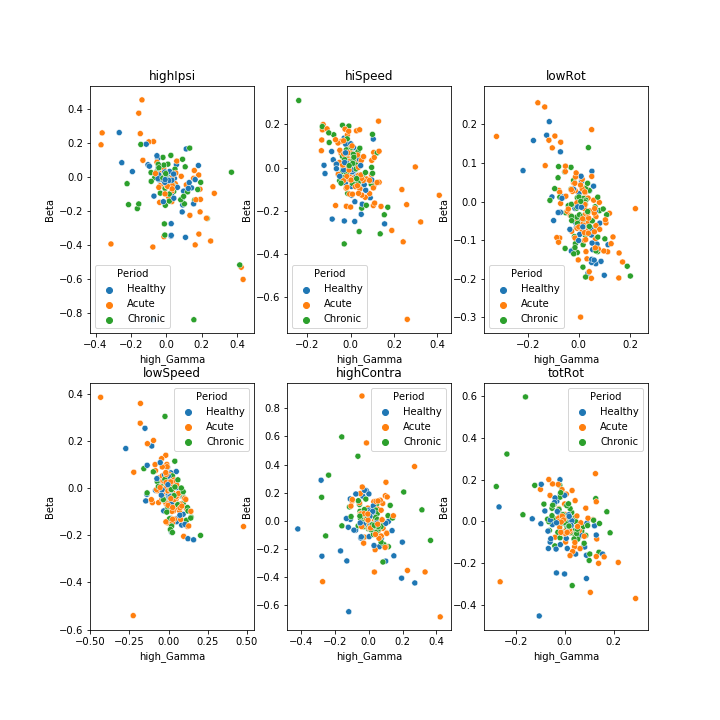

In [365]:
fig, ax = plt.subplots(2,3,figsize=(10,10))
for ind,mv in enumerate(df.mvmt.unique()):
    sns.scatterplot(data = df[df.mvmt==mv],y='Beta',hue='Period',x='high_Gamma',ax=ax[ind%2,ind%3])
    ax[ind%2,ind%3].set_title(mv)

In [28]:
df = pd.read_csv(figFolder+'powerCorrelation_window.csv')
df

,Unnamed: 0,Mouse,Period,Sess,Corr,highSpeed,high_Gamma,low_Gamma,high_Beta_15to20,Beta,theta,beta3,beta4
0,0,761,Healthy,0761_BaselineA,0.002604,0.000000,0.143072,0.179768,0.090550,0.120292,0.075651,0.058375,0.075159
1,1,761,Healthy,0761_BaselineA,0.003646,0.000000,0.145283,0.181787,0.093465,0.118107,0.075839,0.058008,0.070575
2,2,761,Healthy,0761_BaselineA,0.003904,0.000000,0.149005,0.184678,0.081296,0.115815,0.076184,0.049561,0.065935
3,3,761,Healthy,0761_BaselineA,0.005729,0.000000,0.145701,0.194475,0.080712,0.110901,0.079457,0.050832,0.070129
4,4,761,Healthy,0761_BaselineA,0.005729,0.000000,0.152409,0.189094,0.078899,0.105182,0.075133,0.047626,0.069957
...,...,...,...,...,...,...,...,...,...,...,...,...,...
61936,293,8815,Acute,8815_day8,0.010786,0.537501,0.171523,0.170838,0.072419,0.101879,0.102736,0.046594,0.063383
61937,294,8815,Acute,8815_day8,0.007129,0.577515,0.170531,0.169275,0.071188,0.106638,0.097070,0.043733,0.066230
61938,295,8815,Acute,8815_day8,0.003682,0.663426,0.170523,0.173679,0.077087,0.103666,0.092477,0.048665,0.077714
61939,296,8815,Acute,8815_day8,0.000829,0.617546,0.176590,0.180988,0.084783,0.089705,0.100929,0.055003,0.075417


In [29]:
for p in df.Period.unique(): 
    df4 = df[df.Period==p].groupby("Sess").mean().reset_index().dropna()
    print(p,sci.stats.pearsonr(df4.Corr,df4.high_Gamma))

Healthy (-0.08010414806875578, 0.5883561206721893)
Acute (-0.10795914954103734, 0.2874872669856107)
Chronic (0.0642138842213937, 0.6229604948202662)


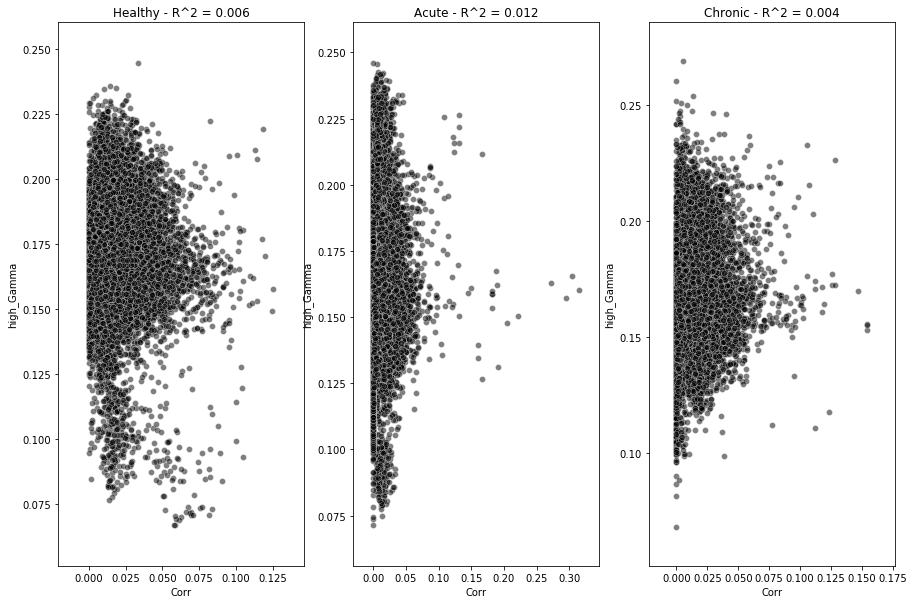

In [41]:
fig, ax = plt.subplots(1,3,figsize=(15,10))
for ind,p in enumerate(df.Period.unique()):
    sns.scatterplot(data = df[df.Period==p],y='high_Gamma',x='Corr',ax=ax[ind%3],alpha=0.5, color = 'black') #hue='highSpeed',
    ax[ind%3].set_title('{p:s} - R^2 = {r:.3f}'.format(p=p,r= sci.stats.pearsonr(df[df.Period==p].groupby("Sess").mean().reset_index().dropna().Corr,df[df.Period==p].groupby("Sess").mean().reset_index().dropna().high_Gamma)[0]**2 ))

In [158]:
df2.groupby(['Sess','binSpeed']).mean()

# df2.mean()
# df2

high_Gamma  highSpeed      Corr
Sess           binSpeed                                 
0761_BaselineA 0.0         0.155573   0.010949  0.010532
               0.2         0.161935   0.265912  0.019104
               0.4         0.166461   0.508777  0.028396
               0.6         0.168402   0.662557  0.014426
               0.8              NaN        NaN       NaN
...                             ...        ...       ...
8815_day8      0.0         0.147469   0.013788  0.005030
               0.2         0.161665   0.304519  0.009910
               0.4         0.167317   0.529551  0.011497
               0.6         0.169976   0.713163  0.011066
               0.8         0.172132   0.912526  0.011408

[1045 rows x 3 columns]

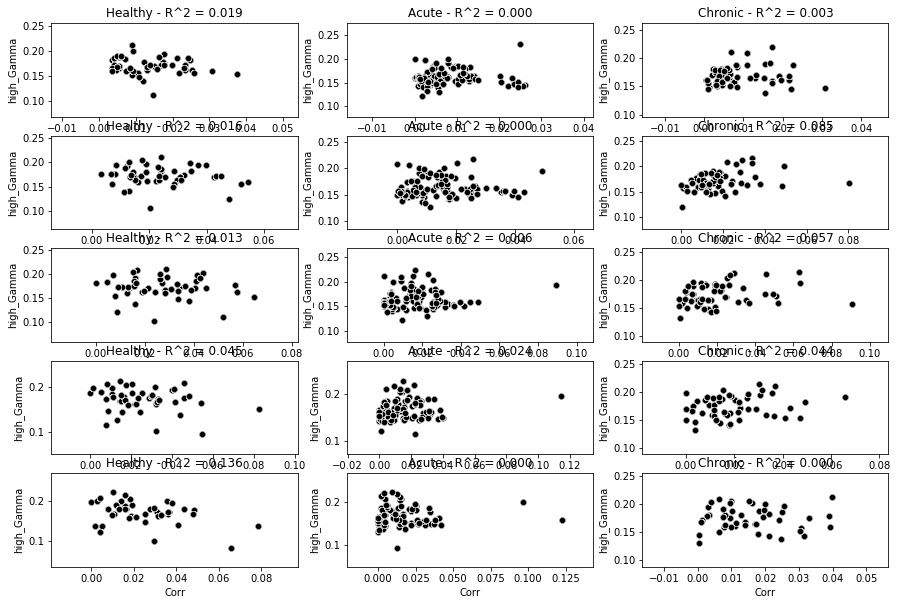

In [165]:
# df2 = df[['Sess','Period','high_Gamma','highSpeed','Corr']]
# df2['binSpeed'] = df2.pd.cut(df2.highSpeed, np.arange(0,6)/5, labels=np.arange(0,5)/5).fillna(0)
# groups = df2.groupby(['Sess','binSpeed']).mean().reset_index().merge(df2[['Sess','Period']],on='Sess')
# groups

fig, ax = plt.subplots(5,3,figsize=(15,10))
for ind,p in enumerate(groups.Period.unique()):
    for indS, s in enumerate(groups.binSpeed.unique()): 
        df4 = groups[(groups.Period==p)&(groups.binSpeed==s)]
        sns.scatterplot(data = df4,y='high_Gamma',x='Corr',ax=ax[indS,ind],alpha=0.5, color = 'black') #hue='highSpeed',
        ax[indS,ind].set_title('{p:s} - R^2 = {r:.3f}'.format(p=p,r= sci.stats.pearsonr(df4.groupby("Sess").mean().reset_index().dropna().Corr,df4.groupby("Sess").mean().reset_index().dropna().high_Gamma)[0]**2 ))

In [82]:
for ind,p in enumerate(df.Period.unique()):
    sns.scatterplot(data = groups[groups.Period==p],y='high_Gamma',x='highSpeed',ax=ax[ind%3],alpha=0.5, color = 'black') #hue='highSpeed',
    ax[ind%3].set_title('{p:s}'.format(p=p))

<IPython.core.display.Javascript object>


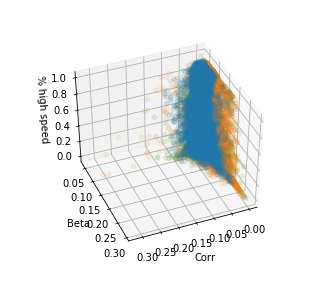

Text(0.5, 0, '% high speed')

In [379]:
from mpl_toolkits import mplot3d
fig = plt.figure(figsize=plt.figaspect(.9))
ax = fig.add_subplot(1, 1, 1, projection='3d')
for ind,p in enumerate(df.Period.unique()):
    #ax = fig.add_subplot(1, 3, ind+1, projection='3d')
    ax.scatter3D(df[df.Period==p].Corr,df[df.Period==p].Beta,df[df.Period==p].highSpeed,label=p,alpha=0.1)
#     sns.scatterplot(data = df[df.Period==p],y='Beta',hue='highSpeed',x='Corr',ax=,alpha=0.5)
ax.set_xlabel('Corr')
ax.set_ylabel('Beta')
ax.set_zlabel('% high speed')

<ipython-input-408-8c6e6cb72e2d>:8: DeprecationWarning: Calling Family(..) with a link class as argument is deprecated.
Use an instance of a link class instead.
  model = sm.GLM(y, df2[['Intercept','Corr','highSpeed','period']], family=Gamma(link=sm.families.links.log))


                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                61643
Model:                            GLM   Df Residuals:                    61639
Model Family:                   Gamma   Df Model:                            3
Link Function:                    log   Scale:                        0.053101
Method:                          IRLS   Log-Likelihood:             1.4624e+05
Date:                Wed, 14 Jul 2021   Deviance:                       2682.6
Time:                        13:33:12   Pearson chi2:                 3.27e+03
No. Iterations:                    12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.1788      0.002  -1087.299      0.0

<IPython.core.display.Javascript object>


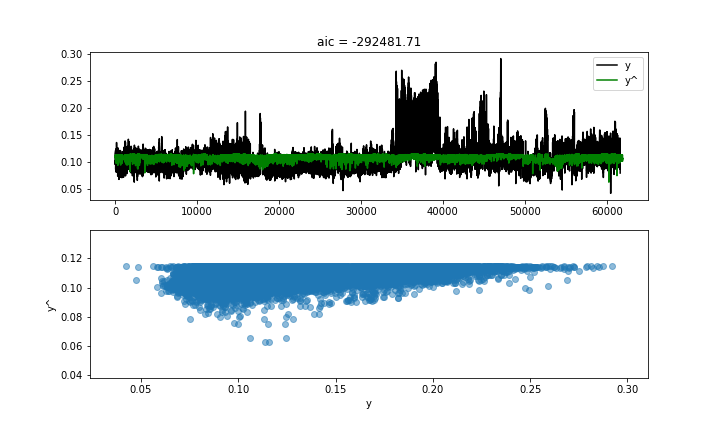

In [408]:
# import statsmodels.api as sm
# from statsmodels.genmod.families import Poisson, Gamma, Gaussian
df["Intercept"] = 1
period = {'Healthy':0,'Acute':1,'Chronic':2}
df['period'] = df.apply(lambda x: period[x.Period],axis=1)
df2 = df.dropna()
y=np.asarray(df2.Beta)
model = sm.GLM(y, df2[['Intercept','Corr','highSpeed','period']], family=Gamma(link=sm.families.links.log))
model_results = model.fit()
b = model_results.params
print(model_results.summary())
aic = model_results.aic
y_hut = np.exp(np.sum(b*df2[['Intercept','period','Corr','highSpeed']],axis=1)) 
# plot if required
#if plot: 
fig, (ax,ax2) = plt.subplots(2,1,figsize=(10,6))
ax.plot(y,label='y',color='k')
ax.plot(y_hut,label='y^',color='g')
ax2.scatter(y,y_hut,alpha=0.5)
ax2.set_xlabel('y')
ax2.set_ylabel('y^')
ax.set_title("aic = {0:8.2f}".format(aic))
ax.legend()

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                61643
Model:                            GLM   Df Residuals:                    61639
Model Family:                Gaussian   Df Model:                            3
Link Function:               identity   Scale:                      0.00064640
Method:                          IRLS   Log-Likelihood:             1.3889e+05
Date:                Wed, 14 Jul 2021   Deviance:                       39.844
Time:                        13:34:50   Pearson chi2:                     39.8
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.1133      0.000    512.248      0.0

<IPython.core.display.Javascript object>


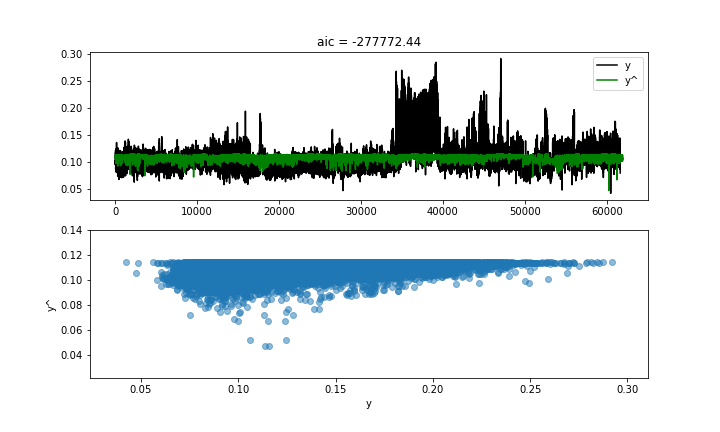

In [412]:
# import statsmodels.api as sm
# from statsmodels.genmod.families import Poisson, Gamma, Gaussian
df["Intercept"] = 1
period = {'Healthy':0,'Acute':1,'Chronic':2}
df['period'] = df.apply(lambda x: period[x.Period],axis=1)
df2 = df.dropna()
y=np.asarray(df2.Beta)
model = sm.GLM(y, df2[['Intercept','Corr','highSpeed','period']], family=Gaussian())
model_results = model.fit()
b = model_results.params
print(model_results.summary())
aic = model_results.aic
y_hut = np.sum(b*df2[['Intercept','Corr','highSpeed','period']],axis=1) 
# plot if required
#if plot: 
fig, (ax,ax2) = plt.subplots(2,1,figsize=(10,6))
ax.plot(y,label='y',color='k')
ax.plot(y_hut,label='y^',color='g')
ax2.scatter(y,y_hut,alpha=0.5)
ax2.set_xlabel('y')
ax2.set_ylabel('y^')
ax.set_title("aic = {0:8.2f}".format(aic))
ax.legend()

In [403]:
# import statsmodels.api as sm
# from statsmodels.genmod.families import Poisson, Gamma, Gaussian
import statsmodels.formula.api as smf
df["Intercept"] = 1
period = {'Healthy':0,'Acute':1,'Chronic':2}
df['period'] = df.apply(lambda x: period[x.Period],axis=1)
df2 = df.dropna()
y=np.asarray(df2.Beta)
model = smf.mixedlm("Beta ~ Corr + highSpeed", df2, groups=df2["Period"])
model_results = model.fit()
b = model_results.params
print(model_results.summary())
# aic = model_results.aic
# y_hut = np.exp(np.sum(b*df2[['period','Corr','highSpeed','Intercept']],axis=1)) 
# # plot if required
# #if plot: 
# fig, (ax,ax2) = plt.subplots(2,1,figsize=(10,6))
# ax.plot(y,label='y',color='k')
# ax.plot(y_hut,label='y^',color='g')
# ax2.scatter(y,y_hut,alpha=0.5)
# ax2.set_xlabel('y')
# ax2.set_ylabel('y^')
# ax.set_title("aic = {0:8.2f}".format(aic))
# ax.legend()

          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: Beta       
No. Observations: 61643   Method:             REML       
No. Groups:       3       Scale:              0.0006     
Min. group size:  14304   Log-Likelihood:     139055.5244
Max. group size:  29373   Converged:          Yes        
Mean group size:  20547.7                                
---------------------------------------------------------
              Coef.  Std.Err.    z    P>|z| [0.025 0.975]
---------------------------------------------------------
Intercept      0.113    0.002  75.288 0.000  0.110  0.116
Corr          -0.184    0.007 -25.295 0.000 -0.198 -0.170
highSpeed     -0.009    0.000 -31.021 0.000 -0.010 -0.009
Group Var      0.000    0.000                            



C:\Users\dzemel\Miniconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\dzemel\Miniconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2131: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
C:\Users\dzemel\Miniconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2168: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [446]:
f = h5py.File('membership.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
        except:
            print(sess,'mvmt')
            meanR_mvmtOnset = np.nan
            
        try:
            meanR_rotOnset = grp[sess]['rotOnset']['result'].value
        except:
            print(sess,'rot')
            meanR_rotOnset = np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_rotOnset':meanR_rotOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)

<ipython-input-446-ef5d9821e9c0>:10: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_mvmtOnset = grp[sess]['mvmtOnset']['result'].value
<ipython-input-446-ef5d9821e9c0>:16: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  meanR_rotOnset = grp[sess]['rotOnset']['result'].value


0761_day35L mvmt
1222_day5 mvmt
2976_day8 rot
4539_day1 rot
4539_day10 rot
4539_day11 rot
4539_day12 rot
4539_day13 rot
4539_day14 rot
4539_day2 rot
4539_day3 rot
4539_day4 rot
4539_day5 rot
4539_day6 rot
4539_day7 rot
4539_day8 rot
4539_day9 rot
7584_day1 rot
7584_day10 rot
7584_day11 rot
7584_day12 rot
7584_day15 rot
7584_day2 rot
7584_day3 rot
7584_day4 rot
7584_day5 rot
7584_day6 rot
7584_day7 rot
7584_day8 rot
7584_day9 rot
7909_day1 rot
7909_day10 rot
7909_day11 mvmt
7909_day11 rot
7909_day12 rot
7909_day13 rot
7909_day14 rot
7909_day2 rot
7909_day3 rot
7909_day4 rot
7909_day5 rot
7909_day6 rot
7909_day7 mvmt
7909_day7 rot
7909_day8 rot
7909_day9 rot
8430_BaselineA mvmt
8430_day11 rot
8430_day30A mvmt
8430_day30A rot
8430_day7 rot
8803_day12 mvmt


In [447]:
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Acute', 'Chronic'])
df['care'] = df.meanR_mvmtOnset.astype('float')
df['care_rot'] = df.meanR_rotOnset.astype('float')


In [19]:
#  for all mice - by period
PV0 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='PV',red = True,day = lambda x: x==0)
PV1 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='PV',red = True,day = lambda x: (x>0)& (x<13) )
PV2 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='PV',red = True,day = lambda x: x>=13 )

CHI0 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='CHI',red = True,day = lambda x: x==0)
CHI1 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='CHI',red = True,day = lambda x: (x>0)& (x<13) )
CHI2 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='CHI',red = True,day = lambda x: x>=13 )

MSN0 = getData(Files[1],['speed','rot','trace'],period ='Pre', red = False,day = lambda x: x==0)
MSN1 = getData(Files[1],['speed','rot','trace'],period ='Pre', red = False,day = lambda x: (x>0)& (x<13) )
MSN2 = getData(Files[1],['speed','rot','trace'],period ='Pre', red = False,day = lambda x: x>=13 )

D:\6OHDA\IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
D:\6OHDA\IO.py:245: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  rot = hf[m][s]['mvmt']['rotation'].value
D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value


cleaning up trace data
I deleted session: 7584_day0
I deleted session: 8430_BaselineA
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 4539_day11
I deleted session: 4539_day5
I deleted session: 8430_day1
I deleted session: 8430_day9
I deleted session: 8803_day10
I deleted session: 8803_day12
I deleted session: 8803_day5
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 1236_day19L
I deleted session: 7909_day30A
I deleted session: 8430_day15A
I deleted session: 8803_day30A
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 1208_BaselineA
I deleted session: 1222_BaselineA
I deleted session: 1253_BaselineA
I deleted session: 1253_BaselineS
I deleted session: 1793_BaselineA
I deleted session: 8815_BaselineL
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 0

In [25]:
 Zdff_care = Zdff[care[:,0],:]

D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\plotUtils.py:48: RuntimeWarning: Mean of empty slice
  d = np.nanmean(aligned,axis=1)
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1666: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].v

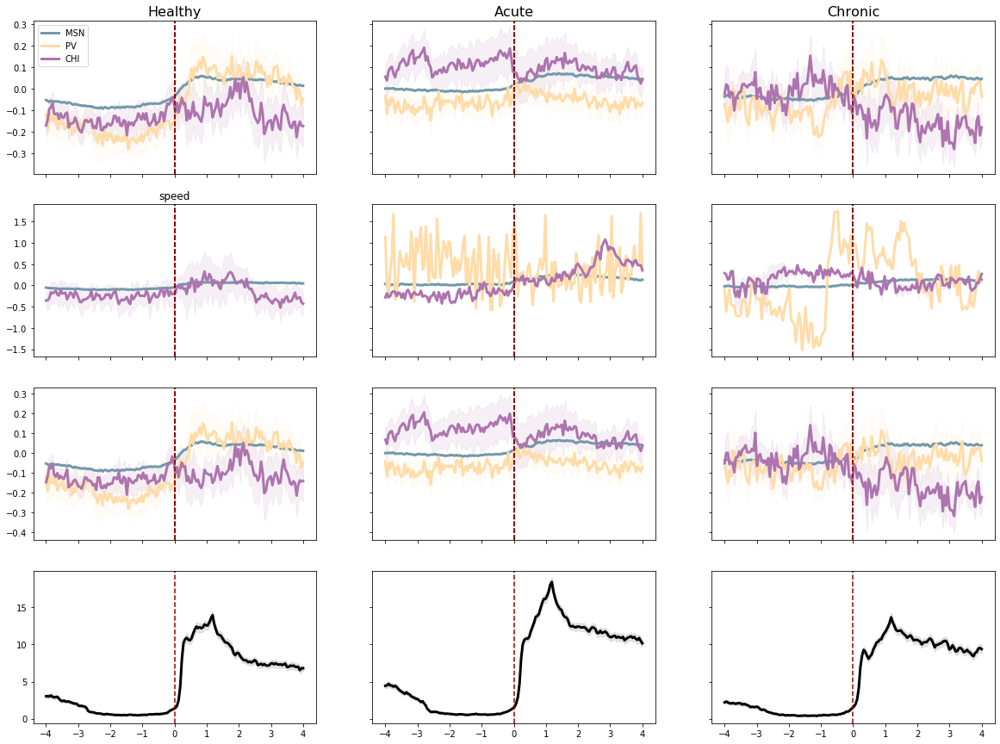

In [167]:
%matplotlib inline
df = pd.read_csv(figFolder+'firingRateDiff2.csv')
df['care'] = df.apply(lambda x: (x.diff_speed>x.s97_5)or(x.diff_speed<x.s2_5),axis=1)

fig, ax = plt.subplots(4,3,figsize=(20, 15),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['MSN','PV','CHI']
Period = {'Healthy':0,'Acute':1,'Chronic':2}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []

for p in Period.keys():
    axInd = 0;
    quant = {'Healthy':{},'Acute':{},'Chronic':{}}
    for c in cond:
        data = eval(c+str(Period[p]))
        quant[p][c] = {}
        for s in data.keys():
            m = s[:4]
            speed = data[s]['speed']['speed'].T
            dff = data[s]['trace']['dff']
            # Vectors are saved as column vectors so.. transposed to raw vector
            if dff.shape[1] == 1:
                dff = dff.T
            # Z-score dff
            mu = np.mean(dff,axis=1)
            std = np.std(dff,axis=1)
            Zdff = (dff.T-mu.T)/std.T
            Zdff = Zdff.T  

            sOnset = getOnsetOrPeriod(m,s,'Pre','mvmtOnset2')    
            if np.sum(sOnset) == 0:
                continue
            
            ca = np.sum(getOnsetOrPeriod(m,s,'Pre','caOnset_Hf'),axis=1)
            careT = df[(df.Sess == s)&(df.CellType == c)].care.values
            care = np.zeros((Zdff.shape[0],1))
            ind = 0
            for cell in range(ca.shape[0]):
                if cell in df[(df.Sess == s)&(df.CellType == c)].n.values:
                    care[cell] = careT[ind]
                    ind = ind+1
            care = care.astype(bool) 
            
            sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
            if dff.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                except:
                    sA = np.reshape(sA,(sA.shape[0],1,1))

            if len(sA.shape) > 2:
                sA = np.mean(sA,2)
                if 'sAligned' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned = sA
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned = np.concatenate((sAligned,sA),axis=1)

            if c == 'MSN':
                    sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                    if sS.ndim > 1:
                        if 'sAlignedS' not in locals():
            #           print(s+' :',sA.shape)
                            sAlignedS = sS
                        else:
        #                print(s+' :',cAs.shape,caAlignedS.shape)
                            sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
            try:
                Zdff_care = Zdff[care[:,0],:]
                Zdff_ncare = Zdff[~care[:,0],:]
            except Exception as e:
                exc_type, exc_obj, exc_tb = sys.exc_info()
                print(s,exc_tb.tb_lineno,care.shape,Zdff.shape)
                continue
            
            sA_care = alignToOnset(Zdff_care.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff_care.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA_care = np.reshape(sA_care,(sA_care.shape[0],1,sA_care.shape[1]))
                except:
                    sA_care = np.reshape(sA_care,(sA_care.shape[0],1,1))

            if len(sA_care.shape) > 2:
                sA_care = np.mean(sA_care,2)
                if 'sAligned_care' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned_care = sA_care
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned_care = np.concatenate((sAligned_care,sA_care),axis=1)
            
            sA_ncare = alignToOnset(Zdff_ncare.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff_ncare.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,sA_ncare.shape[1]))
                except:
                    sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,1))

            if len(sA_ncare.shape) > 2:
                sA_ncare = np.mean(sA_ncare,2)
                if 'sAligned_ncare' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned_ncare = sA_ncare
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned_ncare = np.concatenate((sAligned_ncare,sA_ncare),axis=1)
      
        PlotRelativeToOnset(ax[0,Period[p]],sAligned,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        quant[p][c]['all'] = sAligned
        PlotRelativeToOnset(ax[1,Period[p]],sAligned_care,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        quant[p][c]['care'] = sAligned_care
        PlotRelativeToOnset(ax[2,Period[p]],sAligned_ncare,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        quant[p][c]['not_care'] = sAligned_ncare
        if c== 'MSN':
            PlotRelativeToOnset(ax[3,Period[p]],sAlignedS,tPlot,Color='black',Label='speed',mesErr=True)
            del sAlignedS
        del sAligned
        del sAligned_care
        del sAligned_ncare
    ax[0,Period[p]].set_title(p,fontsize=16)
#    ax[0,Period[p]].legend(fontsize=10)
ax[0,0].legend(fontsize=10)
# ax[0,0].set_ylim(-0.5,0.5)
# ax[1,0].set_ylim(-0.5,1)
# ax[2,0].set_ylim(-0.5,0.75)
ax[1,0].set_title('speed')

fig.savefig(figFolder+'figure3d_submition3.svg',transparent=True)

<IPython.core.display.Javascript object>


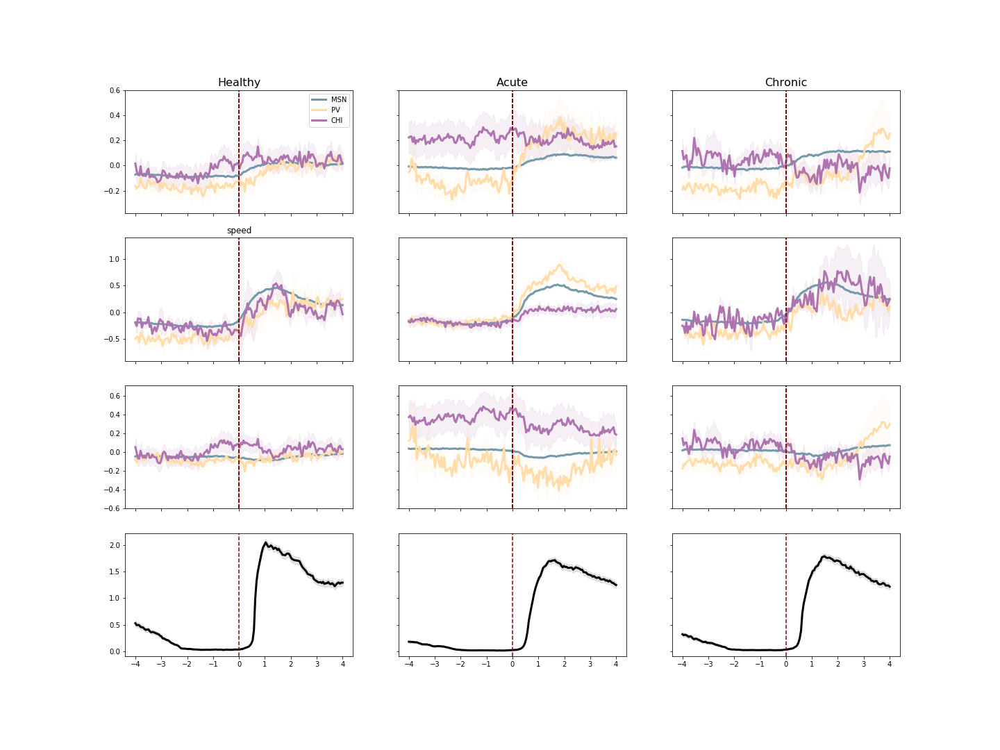

D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype

In [448]:
fig, ax = plt.subplots(4,3,figsize=(20, 15),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['MSN','PV','CHI']
Period = {'Healthy':0,'Acute':1,'Chronic':2}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []

for p in Period.keys():
    axInd = 0;
    for c in cond:
        data = eval(c+str(Period[p]))
        for s in data.keys():
            m = s[:4]
            speed = data[s]['rot']['rot'].T
            dff = data[s]['trace']['dff']
            # Vectors are saved as column vectors so.. transposed to raw vector
            if dff.shape[1] == 1:
                dff = dff.T
            # Z-score dff
            mu = np.mean(dff,axis=1)
            std = np.std(dff,axis=1)
            Zdff = (dff.T-mu.T)/std.T
            Zdff = Zdff.T  

            cOnset =  getOnsetOrPeriod(m,s,'Pre','clockWiseOnset') 
            acOnset = getOnsetOrPeriod(m,s,'Pre','antiClockWiseOnset')  
            sOnset = cOnset+acOnset    
            if np.sum(sOnset) == 0:
                continue
            
            care = df[(df.Sess == s)&(df.CellType == c)].care_rot
            care = care.astype(bool)
            
            sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
            if dff.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                except:
                    sA = np.reshape(sA,(sA.shape[0],1,1))

            if len(sA.shape) > 2:
                sA = np.mean(sA,2)
                if 'sAligned' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned = sA
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned = np.concatenate((sAligned,sA),axis=1)

            if c == 'MSN':
                    sS = alignToOnset(np.abs(speed), sOnset, winPost=PostS,winPre=preS)
                    if sS.ndim > 1:
                        if 'sAlignedS' not in locals():
            #           print(s+' :',sA.shape)
                            sAlignedS = sS
                        else:
        #                print(s+' :',cAs.shape,caAlignedS.shape)
                            sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
            try:
                Zdff_care = Zdff[care,:]
                Zdff_ncare = Zdff[~care,:]
            except Exception as e:
                exc_type, exc_obj, exc_tb = sys.exc_info()
                print(s,exc_tb.tb_lineno,care.shape,Zdff.shape)
                continue
            
            sA_care = alignToOnset(Zdff_care.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff_care.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA_care = np.reshape(sA_care,(sA_care.shape[0],1,sA_care.shape[1]))
                except:
                    sA_care = np.reshape(sA_care,(sA_care.shape[0],1,1))

            if len(sA_care.shape) > 2:
                sA_care = np.mean(sA_care,2)
                if 'sAligned_care' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned_care = sA_care
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned_care = np.concatenate((sAligned_care,sA_care),axis=1)
            
            sA_ncare = alignToOnset(Zdff_ncare.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff_ncare.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,sA_ncare.shape[1]))
                except:
                    sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,1))

            if len(sA_ncare.shape) > 2:
                sA_ncare = np.mean(sA_ncare,2)
                if 'sAligned_ncare' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned_ncare = sA_ncare
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned_ncare = np.concatenate((sAligned_ncare,sA_ncare),axis=1)
      
        PlotRelativeToOnset(ax[0,Period[p]],sAligned,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        PlotRelativeToOnset(ax[1,Period[p]],sAligned_care,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        PlotRelativeToOnset(ax[2,Period[p]],sAligned_ncare,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        if c== 'MSN':
            PlotRelativeToOnset(ax[3,Period[p]],sAlignedS,tPlot,Color='black',Label='speed',mesErr=True)
            del sAlignedS
        del sAligned
        del sAligned_care
        del sAligned_ncare
    ax[0,Period[p]].set_title(p,fontsize=16)
#    ax[0,Period[p]].legend(fontsize=10)
ax[0,0].legend(fontsize=10)
# ax[0,0].set_ylim(-0.5,0.5)
# ax[1,0].set_ylim(-0.5,1)
# ax[2,0].set_ylim(-0.5,0.75)
ax[1,0].set_title('speed')

fig.savefig(figFolder+'figure 4a_rot.svg',transparent=True)

In [439]:
f = h5py.File('membership.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            care_ipsi = grp[sess]['ipsiOnset']['result'].value
        except:
            print(sess,'mvmt')
            care_ipsi = np.nan
            
        try:
            care_contra = grp[sess]['contraOnset']['result'].value
        except:
            print(sess,'rot')
            care_contra = np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'care_ipsi':care_ipsi,
                                'care_contra':care_contra})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'care_ipsi':care_ipsi,
                                'care_contra':care_contra},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Acute', 'Chronic'])
df['care_ipsi'] = df.care_ipsi.astype('float')
df['care_contra'] = df.care_contra.astype('float')


<ipython-input-439-60848c236108>:10: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  care_ipsi = grp[sess]['ipsiOnset']['result'].value
<ipython-input-439-60848c236108>:16: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  care_contra = grp[sess]['contraOnset']['result'].value


0761_day10 mvmt
0761_day12 mvmt
0761_day19L mvmt
0761_day2 mvmt
0761_day31A mvmt
0761_day35L mvmt
0761_day6 mvmt
0761_day8 mvmt
1208_day15A mvmt
1208_day19L mvmt
1208_day2 mvmt
1208_day34L mvmt
1222_day11 rot
1222_day20L rot
1222_day36L mvmt
1222_day5 rot
1231_BaselineL rot
1231_BaselineS rot
1236_day13 mvmt
1793_BaselineA mvmt
1793_day12 mvmt
1793_day14 mvmt
2976_BaselineA rot
2976_day14 mvmt
2976_day35L mvmt
2976_day8 mvmt
2976_day8 rot
2980_day14 mvmt
2980_day15A rot
2980_day19L mvmt
2980_day8 mvmt
2981_day10 rot
2981_day12 rot
2981_day15A mvmt
2981_day2 rot
2981_day6 rot
2981_day8 rot
4539_BaselineA rot
4539_day1 mvmt
4539_day1 rot
4539_day10 mvmt
4539_day10 rot
4539_day11 mvmt
4539_day11 rot
4539_day12 mvmt
4539_day12 rot
4539_day13 mvmt
4539_day13 rot
4539_day14 mvmt
4539_day14 rot
4539_day2 mvmt
4539_day2 rot
4539_day3 mvmt
4539_day3 rot
4539_day30A rot
4539_day4 mvmt
4539_day4 rot
4539_day5 mvmt
4539_day5 rot
4539_day6 mvmt
4539_day6 rot
4539_day7 mvmt
4539_day7 rot
4539_day8 m

<IPython.core.display.Javascript object>


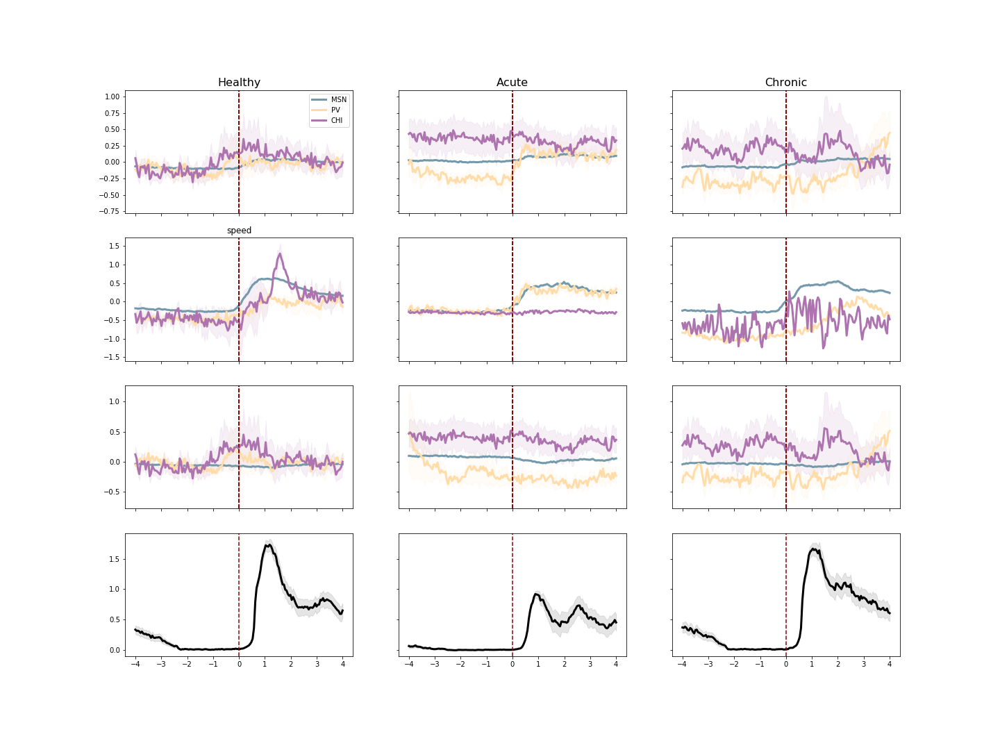

D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype

In [445]:
fig, ax = plt.subplots(4,3,figsize=(20, 15),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['MSN','PV','CHI']
Period = {'Healthy':0,'Acute':1,'Chronic':2}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []

for p in Period.keys():
    axInd = 0;
    for c in cond:
        data = eval(c+str(Period[p]))
        for s in data.keys():
            m = s[:4]
            speed = data[s]['rot']['rot'].T
            dff = data[s]['trace']['dff']
            # Vectors are saved as column vectors so.. transposed to raw vector
            if dff.shape[1] == 1:
                dff = dff.T
            # Z-score dff
            mu = np.mean(dff,axis=1)
            std = np.std(dff,axis=1)
            Zdff = (dff.T-mu.T)/std.T
            Zdff = Zdff.T  

            
            sOnset = getOnsetOrPeriod(m,s,'Pre','antiClockWiseOnset')  
                
            if np.sum(sOnset) == 0:
                continue
            
            care = df[(df.Sess == s)&(df.CellType == c)].care_ipsi
            care = care.astype(bool)
            
            sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
            if dff.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                except:
                    sA = np.reshape(sA,(sA.shape[0],1,1))

            if len(sA.shape) > 2:
                sA = np.mean(sA,2)
                if 'sAligned' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned = sA
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned = np.concatenate((sAligned,sA),axis=1)

            if c == 'MSN':
                    sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                    if sS.ndim > 1:
                        if 'sAlignedS' not in locals():
            #           print(s+' :',sA.shape)
                            sAlignedS = sS
                        else:
        #                print(s+' :',cAs.shape,caAlignedS.shape)
                            sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
            try:
                Zdff_care = Zdff[care,:]
                Zdff_ncare = Zdff[~care,:]
            except Exception as e:
                exc_type, exc_obj, exc_tb = sys.exc_info()
                print(s,exc_tb.tb_lineno,care.shape,Zdff.shape)
                continue
            
            sA_care = alignToOnset(Zdff_care.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff_care.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA_care = np.reshape(sA_care,(sA_care.shape[0],1,sA_care.shape[1]))
                except:
                    sA_care = np.reshape(sA_care,(sA_care.shape[0],1,1))

            if len(sA_care.shape) > 2:
                sA_care = np.mean(sA_care,2)
                if 'sAligned_care' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned_care = sA_care
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned_care = np.concatenate((sAligned_care,sA_care),axis=1)
            
            sA_ncare = alignToOnset(Zdff_ncare.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff_ncare.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,sA_ncare.shape[1]))
                except:
                    sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,1))

            if len(sA_ncare.shape) > 2:
                sA_ncare = np.mean(sA_ncare,2)
                if 'sAligned_ncare' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned_ncare = sA_ncare
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned_ncare = np.concatenate((sAligned_ncare,sA_ncare),axis=1)
      
        PlotRelativeToOnset(ax[0,Period[p]],sAligned,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        PlotRelativeToOnset(ax[1,Period[p]],sAligned_care,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        PlotRelativeToOnset(ax[2,Period[p]],sAligned_ncare,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        if c== 'MSN':
            PlotRelativeToOnset(ax[3,Period[p]],sAlignedS,tPlot,Color='black',Label='speed',mesErr=True)
            del sAlignedS
        del sAligned
        del sAligned_care
        del sAligned_ncare
    ax[0,Period[p]].set_title(p,fontsize=16)
#    ax[0,Period[p]].legend(fontsize=10)
ax[0,0].legend(fontsize=10)
# ax[0,0].set_ylim(-0.5,0.5)
# ax[1,0].set_ylim(-0.5,1)
# ax[2,0].set_ylim(-0.5,0.75)
ax[1,0].set_title('speed')

fig.savefig(figFolder+'figure 4a_contra.svg',transparent=True)

<IPython.core.display.Javascript object>


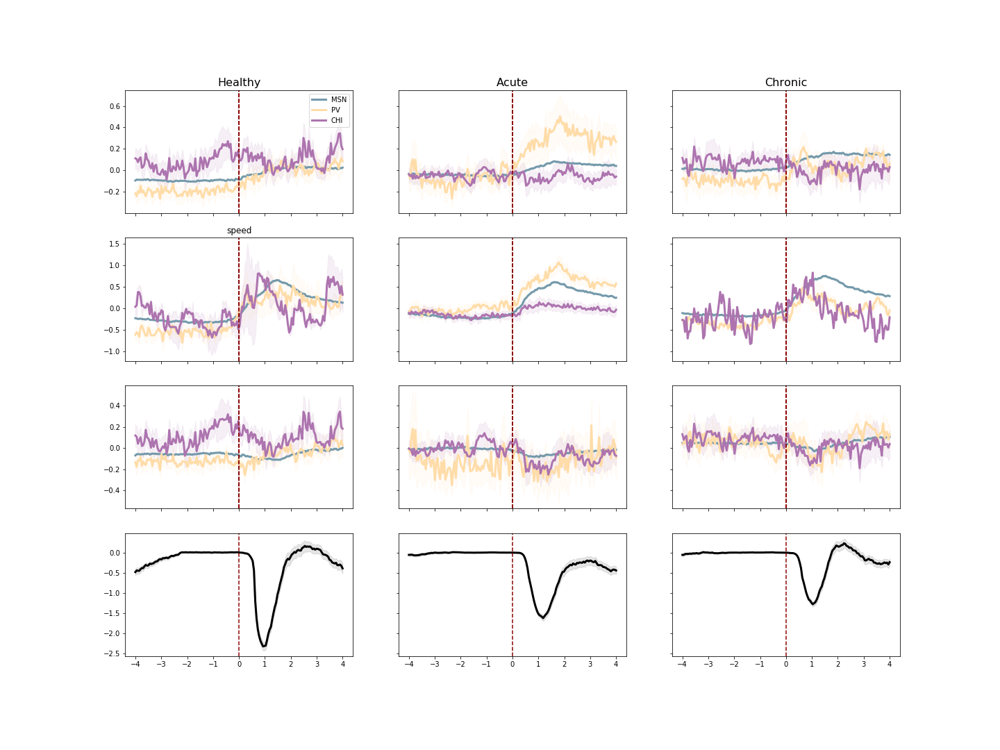

D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype

In [444]:
fig, ax = plt.subplots(4,3,figsize=(20, 15),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['MSN','PV','CHI']
Period = {'Healthy':0,'Acute':1,'Chronic':2}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []

for p in Period.keys():
    axInd = 0;
    for c in cond:
        data = eval(c+str(Period[p]))
        for s in data.keys():
            m = s[:4]
            speed = data[s]['rot']['rot'].T
            dff = data[s]['trace']['dff']
            # Vectors are saved as column vectors so.. transposed to raw vector
            if dff.shape[1] == 1:
                dff = dff.T
            # Z-score dff
            mu = np.mean(dff,axis=1)
            std = np.std(dff,axis=1)
            Zdff = (dff.T-mu.T)/std.T
            Zdff = Zdff.T  

            sOnset =  getOnsetOrPeriod(m,s,'Pre','clockWiseOnset')  
            if np.sum(sOnset) == 0:
                continue
            
            care = df[(df.Sess == s)&(df.CellType == c)].care_contra
            care = care.astype(bool)
            
            sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
            if dff.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                except:
                    sA = np.reshape(sA,(sA.shape[0],1,1))

            if len(sA.shape) > 2:
                sA = np.mean(sA,2)
                if 'sAligned' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned = sA
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned = np.concatenate((sAligned,sA),axis=1)

            if c == 'MSN':
                    sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                    if sS.ndim > 1:
                        if 'sAlignedS' not in locals():
            #           print(s+' :',sA.shape)
                            sAlignedS = sS
                        else:
        #                print(s+' :',cAs.shape,caAlignedS.shape)
                            sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
            try:
                Zdff_care = Zdff[care,:]
                Zdff_ncare = Zdff[~care,:]
            except Exception as e:
                exc_type, exc_obj, exc_tb = sys.exc_info()
                print(s,exc_tb.tb_lineno,care.shape,Zdff.shape)
                continue
            
            sA_care = alignToOnset(Zdff_care.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff_care.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA_care = np.reshape(sA_care,(sA_care.shape[0],1,sA_care.shape[1]))
                except:
                    sA_care = np.reshape(sA_care,(sA_care.shape[0],1,1))

            if len(sA_care.shape) > 2:
                sA_care = np.mean(sA_care,2)
                if 'sAligned_care' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned_care = sA_care
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned_care = np.concatenate((sAligned_care,sA_care),axis=1)
            
            sA_ncare = alignToOnset(Zdff_ncare.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff_ncare.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,sA_ncare.shape[1]))
                except:
                    sA_ncare = np.reshape(sA_ncare,(sA_ncare.shape[0],1,1))

            if len(sA_ncare.shape) > 2:
                sA_ncare = np.mean(sA_ncare,2)
                if 'sAligned_ncare' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned_ncare = sA_ncare
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned_ncare = np.concatenate((sAligned_ncare,sA_ncare),axis=1)
      
        PlotRelativeToOnset(ax[0,Period[p]],sAligned,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        PlotRelativeToOnset(ax[1,Period[p]],sAligned_care,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        PlotRelativeToOnset(ax[2,Period[p]],sAligned_ncare,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        if c== 'MSN':
            PlotRelativeToOnset(ax[3,Period[p]],sAlignedS,tPlot,Color='black',Label='speed',mesErr=True)
            del sAlignedS
        del sAligned
        del sAligned_care
        del sAligned_ncare
    ax[0,Period[p]].set_title(p,fontsize=16)
#    ax[0,Period[p]].legend(fontsize=10)
ax[0,0].legend(fontsize=10)
# ax[0,0].set_ylim(-0.5,0.5)
# ax[1,0].set_ylim(-0.5,1)
# ax[2,0].set_ylim(-0.5,0.75)
ax[1,0].set_title('speed')

fig.savefig(figFolder+'figure 4a_ipsi.svg',transparent=True)

In [59]:
# look at individual CHI/PV

f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','r')
df = pd.DataFrame(columns=["period",'Mouse','Sess','eventRate','cor','s95','sMean'])
for m in tqdm(miceList):
    data =  getData(Files[1],['trace'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred']) 
        period = periodCalc(day)

        try:  
            Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')     
            #Ca = Ca[np.sum(Ca,axis=1)>0,:] 
            both = np.dot(Ca ,Ca.T) # Do the actual co-occorence matrix not np.corrcoef(Ca)
            x2,y2 = np.meshgrid(np.sum(Ca,axis=1), np.sum(Ca,axis=1))
            either = x2+y2-both
            
            cor = f[m][sess]['Pre'][('pearson')][:]
            
            d = f[m][sess]['Pre'][('pearson_shuffle')][:]
            b = np.nanpercentile(d,[97.5,2.5],axis=2)
            
            
            #flatten for array:
            cor[(np.tril(np.ones(cor.shape),-1))==0] = np.nan
            nSig = (cor>b[0,:,:])|(cor<b[1,:,:])
            
            nSig = nSig.flatten()
            cor = cor.flatten()
            
            either[(np.tril(np.ones(either.shape),-1))==0] = np.nan
            either = either.flatten()

            s95 = b[0,:,:].flatten()
            sMean = np.nanpercentile(d,[50],axis=2).flatten()
            

            df2 = pd.DataFrame(data=np.array([either,cor,s95,sMean,nSig]).T,columns=["eventRate","cor",'s95','sMean','sig']).dropna()
            df2["Period"] = period
            df2["Mouse"] = m
            df2["Sess"] = sess

            df = pd.concat([df,df2],sort=True)

           
        except:
            print(sess)
f.close()
df.to_csv(figFolder+'cor_shuffle_eventRate_pearson2.csv')

  0%|                                                                                           | 0/16 [00:00<?, ?it/s]D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  7%|█████▉                                                                             | 1/14 [00:00<00:04,  2.67it/s]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 14%|███████████▊                                                                       | 2/14 [00:00<00:03,  3.27it/s]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  7%|█████▉                                                                             | 1/14 [00:13<02:53, 13.37s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 14%|███████████▊                                                                       | 2/14 [00:30<02:54, 14.53s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  7%|█████▉                                                                             | 1/14 [00:00<00:05,  2.32it/s]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 14%|███████████▊                                                                       | 2/14 [00:02<00:11,  1.06it/s]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

1222_day2


C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:06<00:03,  1.84it/s]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:06<00:02,  2.26it/s]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encount

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 33%|████████████████████████████                                                        | 1/3 [00:05<00:11,  5.70s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 67%|████████████████████████████████████████████████████████                            | 2/3 [00:14<00:06,  6.58s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  7%|█████▉                                                                             | 1/14 [00:03<00:43,  3.32s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 14%|███████████▊                                                                       | 2/14 [00:04<00:31,  2.66s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 33%|████████████████████████████                                                        | 1/3 [00:07<00:14,  7.36s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 67%|████████████████████████████████████████████████████████                            | 2/3 [00:20<00:08,  9.00s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  7%|█████▉                                                                             | 1/14 [00:03<00:49,  3.78s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 14%|███████████▊                                                                       | 2/14 [01:34<05:58, 29.89s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  7%|█████▉                                                                             | 1/14 [00:01<00:13,  1.07s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 14%|███████████▊                                                                       | 2/14 [00:02<00:13,  1.16s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  7%|█████▉                                                                             | 1/14 [00:01<00:24,  1.86s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 14%|███████████▊                                                                       | 2/14 [00:03<00:22,  1.89s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  7%|█████▉                                                                             | 1/14 [00:01<00:22,  1.71s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 14%|███████████▊                                                                       | 2/14 [00:04<00:24,  2.07s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  5%|████▎                                                                              | 1/19 [00:11<03:19, 11.07s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 11%|████████▋                                                                          | 2/19 [00:46<05:12, 18.38s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h


 69%|████████████████████████████████████████████████████████▍                         | 11/16 [10:00<05:23, 64.75s/it]D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value

  0%|                                                                                           | 0/17 [00:00<?, ?it/s]

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  6%|████▉                                                                              | 1/17 [00:07<02:07,  7.95s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 12%|█████████▊                                                                         | 2/17 [00:08<01:25,  5.69s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  5%|████▎                                                                              | 1/19 [00:45<13:30, 45.04s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 11%|████████▋                                                                          | 2/19 [00:49<09:21, 33.01s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h


 81%|█████████████████████████████████████████████████████████████████▊               | 13/16 [18:43<07:29, 149.92s/it]D:\6OHDA\IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  8%|██████▍                                                                            | 1/13 [00:05<01:09,  5.80s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 15%|████████████▊                                                                      | 2/13 [00:07<00:49,  4.48s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  7%|█████▉                                                                             | 1/14 [00:03<00:48,  3.73s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 14%|███████████▊                                                                       | 2/14 [00:08<00:48,  4.03s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

cleaning up trace data


D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

  7%|█████▉                                                                             | 1/14 [00:01<00:18,  1.42s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
C:\Users\dzemel\Miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,

 14%|███████████▊                                                                       | 2/14 [00:02<00:15,  1.26s/it]D:\6OHDA\IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return h

In [85]:
df = pd.read_csv(figFolder+'cor_shuffle_eventRate_pearson2.csv')
df.Period = df.Period.apply(lambda x: "Acute" if x== "Day 1-13" else x) 
df.Period = df.Period.apply(lambda x: "Chronic" if x== "Day 14-35" else x) 
df[df.Period=="Day 14-35"].Period = 'Chronic'
df.to_csv(figFolder+'cor_shuffle_eventRate_pearson2.csv')
df['eventRate'] = df.eventRate.apply(lambda x: 10*(x/12000) )
df

,Unnamed: 0,Unnamed: 0.1,Mouse,Period,Sess,cor,eventRate,period,s95,sMean,sig
0,0,27,761,Healthy,0761_BaselineA,-0.007180,0.145833,NaN,0.099716,-0.007180,0.0
1,1,54,761,Healthy,0761_BaselineA,-0.005924,0.128333,NaN,0.109048,-0.005924,0.0
2,2,55,761,Healthy,0761_BaselineA,-0.004601,0.092500,NaN,0.087576,-0.004601,0.0
3,3,108,761,Healthy,0761_BaselineA,0.041752,0.365000,NaN,0.078815,-0.016489,0.0
4,4,109,761,Healthy,0761_BaselineA,-0.012808,0.338333,NaN,0.082279,-0.012808,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2968537,2968537,32754,8815,Acute,8815_day8,-0.004694,0.206667,NaN,0.087182,-0.004694,0.0
2968538,2968538,32755,8815,Acute,8815_day8,0.015778,0.242500,NaN,0.110368,-0.010019,0.0
2968539,2968539,32756,8815,Acute,8815_day8,-0.029386,0.680000,NaN,0.074230,-0.009783,0.0
2968540,2968540,32757,8815,Acute,8815_day8,0.033834,0.371667,NaN,0.082939,-0.019615,0.0


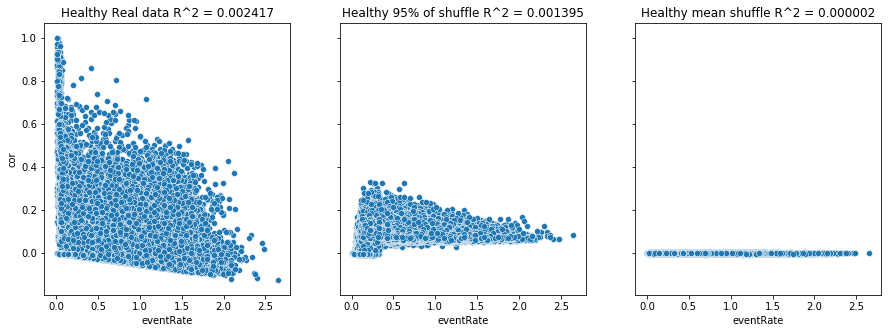

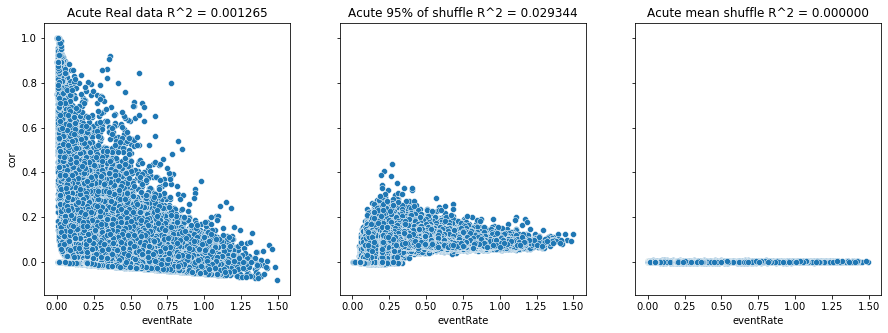

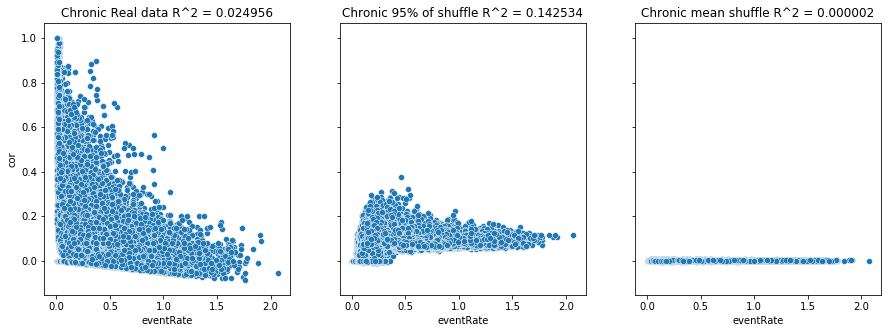

In [50]:
# df = pd.read_csv(figFolder+'cor_shuffle_eventRate_pearson.csv')
def r2(x, y):
    return sci.stats.pearsonr(x, y)[0] ** 2
for p in df.Period.unique():
    fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
    df2 = df[df.Period==p]
    sns.scatterplot(data=df2,x="eventRate",y="cor",ax=ax[0])
    sns.scatterplot(data=df2,x="eventRate",y="s95",ax=ax[1])
    sns.scatterplot(data=df2,x="eventRate",y="sMean",ax=ax[2])
    ax[0].set_title(p+' Real data R^2 = {r:f}'.format(r=r2(df2.eventRate,df2.cor)))
    ax[1].set_title(p+' 95% of shuffle R^2 = {r:f}'.format(r=r2(df2.eventRate,df2.s95)))
    ax[2].set_title(p+' mean shuffle R^2 = {r:f}'.format(r=r2(df2.eventRate,df2.sMean)))
    


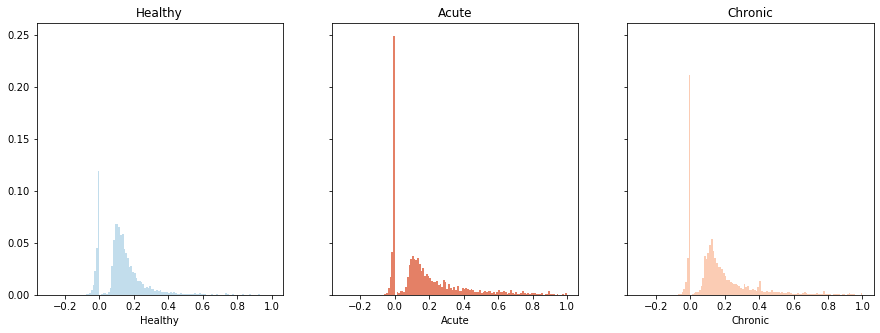

In [91]:
colors = a3[[2,5,4],:]
bins = np.arange(131)*0.01-0.3
fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
for ind, per in enumerate(df.Period.unique()):
    df3 = df[(df.Period==per)& (df.sig==True)]
    count = np.zeros(bins[:-1].shape)
    for s in df3.Sess.unique():
        df2 = df3[df3.Sess==s]
        hi, bi  = np.histogram(np.array(df2.cor),bins=bins)
        if(np.sum(hi) == 0):
            print('something is wrong',s)
            continue
        hi = hi/np.sum(hi)
        count = count+hi
    ax[ind].hist(bins[:-1],bins=bins,weights = count/len(df3.Sess.unique()),color = colors[ind,:])
    ax[ind].set_title(per)
    ax[ind].set_xlabel(per)
    
       


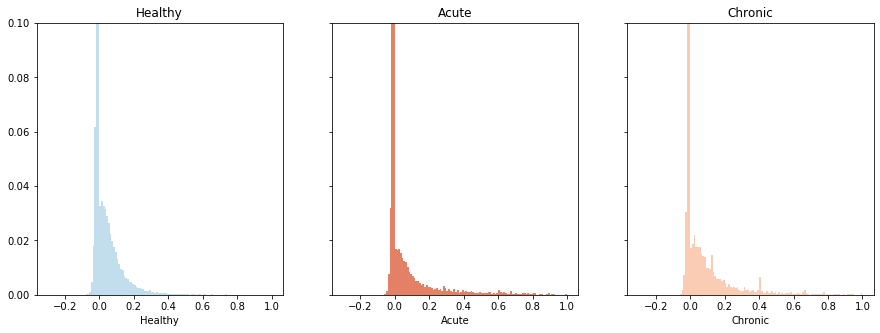

In [92]:
colors = a3[[2,5,4],:]
bins = np.arange(131)*0.01-0.3
fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
for ind, per in enumerate(df.Period.unique()):
    df3 = df[(df.Period==per)] #& (df.sig==True)
    count = np.zeros(bins[:-1].shape)
    for s in df3.Sess.unique():
        df2 = df3[df3.Sess==s]
        hi, bi  = np.histogram(np.array(df2.cor),bins=bins)
        if(np.sum(hi) == 0):
            print('something is wrong',s)
            continue
        hi = hi/np.sum(hi)
        count = count+hi
    ax[ind].hist(bins[:-1],bins=bins,weights = count/len(df3.Sess.unique()),color = colors[ind,:])
    ax[ind].set_title(per)
    ax[ind].set_xlabel(per)
    ax[ind].set_ylim(0,.1)
    
       


<IPython.core.display.Javascript object>


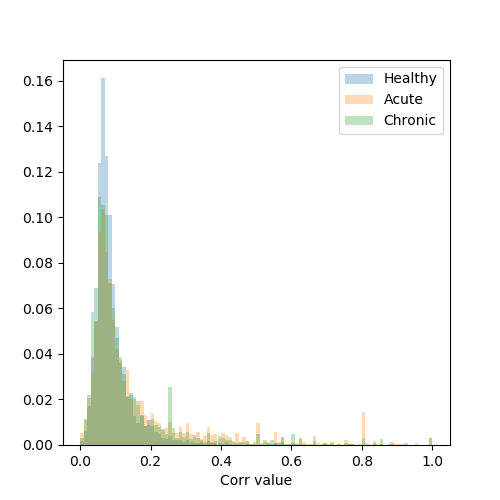

<ipython-input-34-9e1a33d77deb>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['sig'] = df3.apply(lambda x: x.cor>x.s95,axis=1)
<ipython-input-34-9e1a33d77deb>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['sig'] = df3.apply(lambda x: x.cor>x.s95,axis=1)
<ipython-input-34-9e1a33d77deb>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

In [34]:
bins = np.arange(101)*0.01
fig, ax = plt.subplots(1,1,figsize=(5,5),sharey=True)
for ind, per in enumerate(df.Period.unique()):
    df3 = df[df.Period==per]
    df3['sig'] = df3.apply(lambda x: x.cor>x.s95,axis=1)
    df3 = df3[df3.sig==True]
    count = np.zeros(bins[:-1].shape)
    for s in df3.Sess.unique():
        df2 = df3[df3.Sess==s]
        hi, bi  = np.histogram(np.array(df2.cor),bins=bins)
        hi = hi/np.sum(hi)
        count = count+hi
    ax.hist(bins[:-1],bins=bins,weights = count/len(df3.Sess.unique()),label=per,alpha=0.3)
ax.set_xlabel('Corr value')
ax.legend()    
       


In [ ]:
f = h5py.File('J:\\connactivityAnalysis\\connMaps.hdf5','r')
df = pd.DataFrame(columns=["period",'Mouse','Sess','eventRate','cor','s95','sMean'])
for m in tqdm(miceList):
    data =  getData(Files[1],['trace'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred']) 
        period = periodCalc(day)

        try:  
            loc = getPositions(Files[1],m,sess[5:])
            
            Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')     
            loc = loc[:,np.sum(Ca,axis=1)>0] 
            
            x1,x2 = np.meshgrid(loc[0,:], loc[0,:])
            y1,y2 = np.meshgrid(loc[1,:], loc[1,:])
            dist = np.sqrt((x1-x2)**2+(y1-y2)**2)

            c = f[m][sess]['Pre']['Jaccard'][:]
            c[(np.tril(np.ones(c.shape),-1))==0] = np.nan
            
            d = f[m][sess]['Pre'][('Jaccard_shuffle')]
            d = f[m][sess]['Pre'][('Jaccard_shuffle')][:]
            b = np.nanpercentile(d,[97.5,2.5],axis=2)

            d = np.nanmean(d,axis=2)
            d[np.tril(np.ones(d.shape),-1)==0] = np.nan

            nSig = (c>b[0,:,:])|(c<b[1,:,:])
            
            
            df2 = pd.DataFrame(data=np.array([dist.flatten(),c.flatten(),nSig.flatten()]).T,columns=["distance","cor","corSig",'sig']).dropna()

            df2["Period"] = period
            df2["Mouse"] = m
            df2["Sess"] = sess
            
            df = pd.concat([df,df2],sort=True)

           
        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess, " - failed at line ",  exc_tb.tb_lineno)
f.close()
df.to_csv(figFolder+'cor_distance.csv')

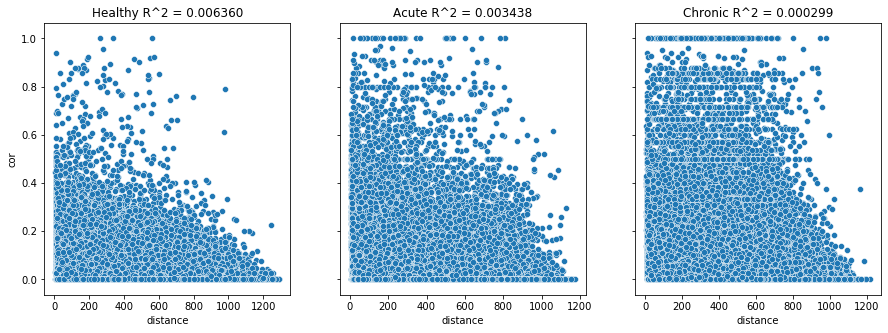

In [348]:
df = pd.read_csv(figFolder+'cor_distance.csv')
def r2(x, y):
    return sci.stats.pearsonr(x, y)[0] ** 2
fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
for ind,p in enumerate(df.Period.unique()): 
    df2 = df[df.Period==p].drop(['eventRate','period','s95','sMean'], axis = 1)
    sns.scatterplot(data=df2,x="distance",y="cor",ax=ax[ind])
    df2 = df2.dropna()
    ax[ind].set_title(p+' R^2 = {r:f}'.format(r=r2(df2.distance,df2.cor)))
    


In [349]:
df

,Unnamed: 0,Mouse,Period,Sess,cor,distance,eventRate,period,s95,sMean,sig
0,12,761,Healthy,0761_BaselineA,0.000000,472.708155,NaN,NaN,NaN,NaN,0.0
1,24,761,Healthy,0761_BaselineA,0.000000,543.359918,NaN,NaN,NaN,NaN,0.0
2,25,761,Healthy,0761_BaselineA,0.000000,94.154129,NaN,NaN,NaN,NaN,0.0
3,36,761,Healthy,0761_BaselineA,0.025114,457.060171,NaN,NaN,NaN,NaN,0.0
4,37,761,Healthy,0761_BaselineA,0.000000,97.616597,NaN,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2968537,9994,8815,Acute,8815_day8,0.000000,250.081987,NaN,NaN,NaN,NaN,0.0
2968538,9995,8815,Acute,8815_day8,0.010309,236.076259,NaN,NaN,NaN,NaN,0.0
2968539,9996,8815,Acute,8815_day8,0.001225,186.043006,NaN,NaN,NaN,NaN,0.0
2968540,9997,8815,Acute,8815_day8,0.026906,599.141052,NaN,NaN,NaN,NaN,0.0


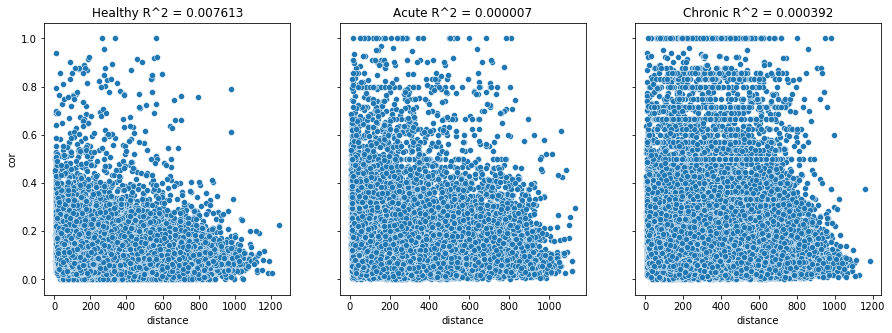

In [352]:
df = pd.read_csv(figFolder+'cor_distance.csv')
def r2(x, y):
    return sci.stats.pearsonr(x, y)[0] ** 2
fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
for ind,p in enumerate(df.Period.unique()): 
    df2 = df[(df.Period==p)&(df.sig==1)].drop(['eventRate','period','s95','sMean'], axis = 1)
    sns.scatterplot(data=df2,x="distance",y="cor",ax=ax[ind])
    df2 = df2.dropna()
    ax[ind].set_title(p+' R^2 = {r:f}'.format(r=r2(df2.distance,df2.cor)))


In [8]:
df = pd.read_csv(figFolder+'cor_distance.csv')
df2 = df[(df.sig==1)].drop(['eventRate','period','s95','sMean'], axis = 1)
groups = df2.groupby(['Sess','Period', pd.cut(df2.distance, np.arange(0,10)*100, labels=np.arange(1,10)*100)]).mean().drop(columns=['distance']).reset_index()
groups

,Sess,Period,distance,Unnamed: 0,Mouse,cor,sig
0,0761_BaselineA,Acute,100,NaN,NaN,NaN,NaN
1,0761_BaselineA,Acute,200,NaN,NaN,NaN,NaN
2,0761_BaselineA,Acute,300,NaN,NaN,NaN,NaN
3,0761_BaselineA,Acute,400,NaN,NaN,NaN,NaN
4,0761_BaselineA,Acute,500,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
5557,8815_day8,Healthy,500,NaN,NaN,NaN,NaN
5558,8815_day8,Healthy,600,NaN,NaN,NaN,NaN
5559,8815_day8,Healthy,700,NaN,NaN,NaN,NaN
5560,8815_day8,Healthy,800,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>


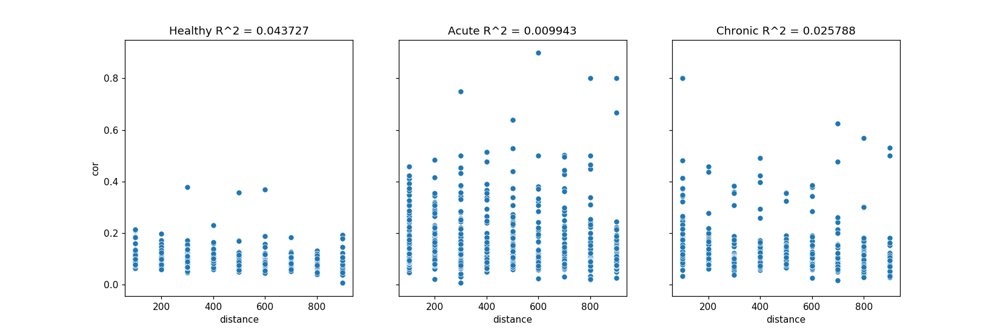

Healthy (-0.2091105601875619, 2.54789207423319e-05)
Acute (-0.09971635060943597, 0.006274043249331607)
Chronic (-0.16058730724889955, 0.00045475409659809603)


In [10]:
def r2(x, y):
    return sci.stats.pearsonr(x, y)[0] ** 2

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
for ind,p in enumerate(df.Period.unique()): 
    df2 = groups[(groups.Period==p)]
    sns.scatterplot(data=df2,x="distance",y="cor",ax=ax[ind])
    df2 = df2.dropna()
    ax[ind].set_title(p+' R^2 = {r:f}'.format(r=r2(df2.distance,df2.cor)))
    print(p,sci.stats.pearsonr(df2.distance,df2.cor))
fig.savefig(figFolder+'figureS13.svg',transparent=True)

<IPython.core.display.Javascript object>


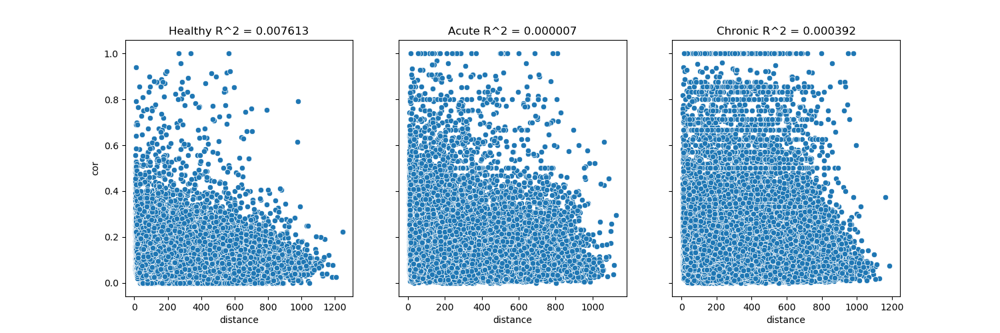

In [36]:
def r2(x, y):
    return sci.stats.pearsonr(x, y)[0] ** 2
fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
for ind,p in enumerate(df.Period.unique()): 
    df2 = df[(df.Period==p)&(df.sig==1)].drop(['eventRate','period','s95','sMean'], axis = 1)
    sns.scatterplot(data=df2,x="distance",y="cor",ax=ax[ind])
    df2 = df2.dropna()
    ax[ind].set_title(p+' R^2 = {r:f}'.format(r=r2(df2.distance,df2.cor)))
    


<IPython.core.display.Javascript object>


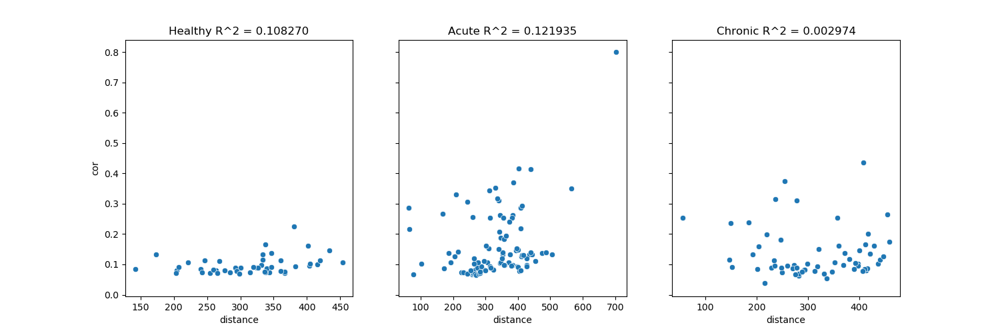

Howard stuff starts here:

In [101]:
# f = h5py.File('D:\\6OHDA\\Spectograms.hdf5','r') 
# m = '1208'
# sess = m+'_BaselineA'
# freq = f[m][sess]['Pre']['freq'][:]
# coeff = np.abs(f[m][sess]['Pre']['coeff'][:])
# data =  getData(Files[0],['lfp'],period ='Pre', mice=m)
# lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
# coeff = coeff[:,(lfpOutliers[:,0]==0)]
# Hs = np.nansum(coeff, axis=1)
# coeff = coeff.T/Hs.T
# coeff = coeff.T
print(np.sum(coeff,axis=1).shape)

(87,)


0.0005483021713982424


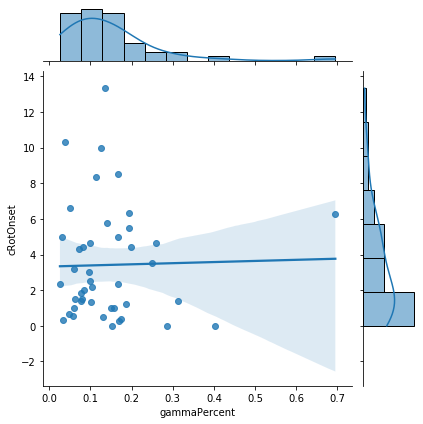

In [161]:
# sns.scatterplot(x='gammaPercent',y='cRotOnset',hue = 'Period',data = df2)
sns.jointplot(x='gammaPercent',y='cRotOnset',data = df2, kind="reg")
print(r2(df2.gammaPercent,df2.cRotOnset))

0.07290474357383947


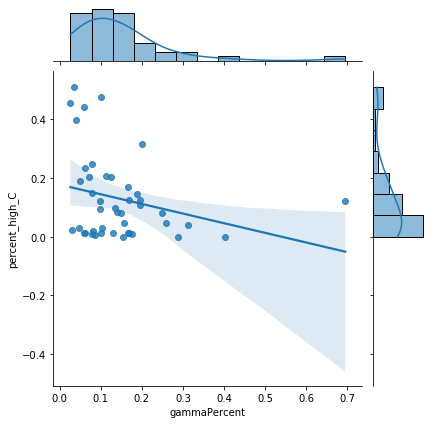

In [162]:
# sns.scatterplot(x='gammaPercent',y='percent_high_C',hue = 'Period',data = df2)
sns.jointplot(x='gammaPercent',y='percent_high_C',data = df2, kind="reg")
print(r2(df2.gammaPercent,df2.percent_high_C))

0.02368362482796734


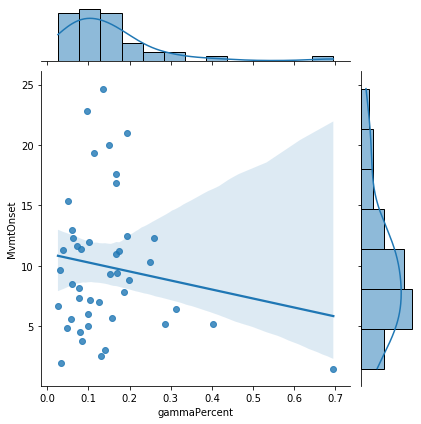

In [163]:
# sns.scatterplot(x='gammaPercent',y='MvmtOnset',hue = 'Period',data = df2)
sns.jointplot(x='gammaPercent',y='MvmtOnset',data = df2, kind="reg")
print(r2(df2.gammaPercent,df2.MvmtOnset))

In [84]:
Pdf = pd.read_csv(figFolder+'gammaSort.csv')
Pdf['gammaPercent'] = Pdf.gamma.apply(lambda x: x>=0.75)
Pdf =Pdf.groupby(['Sess','Period']).mean()
Pdf = Pdf.reset_index()
# Pdf['Mouse']=Pdf['Mouse'].astype(int)
# Pdf.dtypes

In [85]:
df = pd.read_csv(figFolder+'speedData.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
# print(df)
# print(df.dtypes)
df2 = pd.merge(Pdf,df[['Sess','Period','MvmtOnset']],on=['Sess','Period'])
df = pd.read_csv(figFolder+'rotation_forR.csv')
df = df.groupby(['Session','Period']).mean()
df = df.reset_index()
df = df.rename(columns={"Session":'Sess'})
df2 = pd.merge(df2,df[['Sess','Period','cRotOnset','rotOnset','percent_high_C','percent_high_AC']],on=['Sess','Period'])
df2

,Sess,Period,Unnamed: 0,Mouse,gamma,cellNum,gammaPercent,MvmtOnset,cRotOnset,rotOnset,percent_high_C,percent_high_AC
0,0761_BaselineA,Healthy,5.0,761.0,0.427110,5.0,0.181818,14,3,13,0.042104,0.115976
1,0761_BaselineL,Healthy,7.5,761.0,0.362527,7.5,0.187500,15,3,17,0.030759,0.178418
2,0761_BaselineS,Healthy,13.0,761.0,0.491119,13.0,0.407407,8,8,9,0.067233,0.178839
3,0761_day10,Day 1-13,5.5,761.0,0.360169,5.5,0.166667,8,0,4,0.006555,0.142533
4,0761_day12,Day 1-13,2.0,761.0,0.121943,2.0,0.200000,6,0,3,0.012437,0.074118
...,...,...,...,...,...,...,...,...,...,...,...,...
204,8815_day2,Day 1-13,4.5,8815.0,0.029757,4.5,0.000000,16,1,11,0.042605,0.043277
205,8815_day30A,Day 14-35,39.0,8815.0,0.169259,39.0,0.151899,7,0,4,0.002017,0.045630
206,8815_day34L,Day 14-35,33.5,8815.0,0.085633,33.5,0.044118,16,11,15,0.043361,0.044538
207,8815_day4,Day 1-13,18.0,8815.0,0.249947,18.0,0.189189,4,1,4,0.026303,0.106050


In [50]:
%matplotlib inline

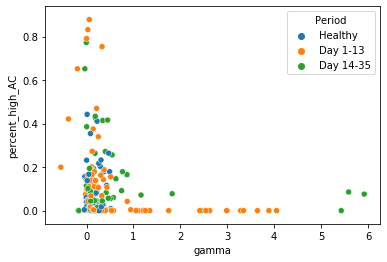

In [72]:
sns.scatterplot(x='gamma',y='percent_high_AC',hue = 'Period',data = df2)

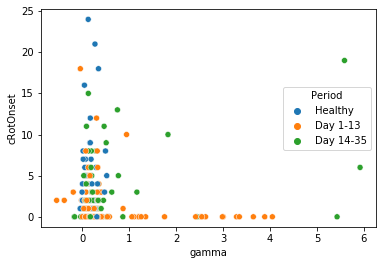

In [73]:
sns.scatterplot(x='gamma',y='cRotOnset',hue = 'Period',data = df2)

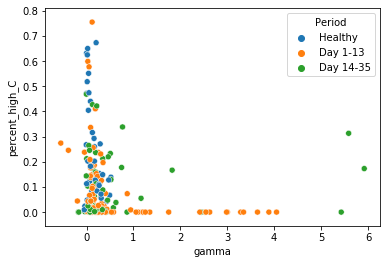

In [74]:
sns.scatterplot(x='gamma',y='percent_high_C',hue = 'Period',data = df2)

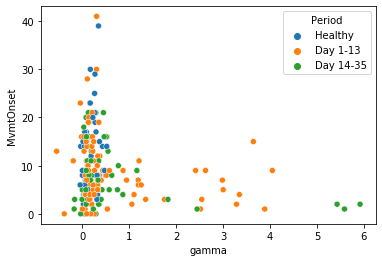

In [75]:
sns.scatterplot(x='gamma',y='MvmtOnset',hue = 'Period',data = df2)

In [97]:
# spectrom in high/low mvmt
f = h5py.File('Spectograms.hdf5','r')

miceList = getMiceList(Files[0])
specs = {}
for m in tqdm(miceList):  
    data =  getData(Files[0],['lfp','speed'],period ='Post', mice=m, drug = b'L-Dopa')
    
    for sess in data:
        try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])

            # get data
            dtS = 1/data[sess]['speed']['Fs']
            dtL = 1/data[sess]['lfp']['FS']
            ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
            tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL


            highAC = getOnsetOrPeriod(m,sess,'Post','hiACRotPeriods_vector')
            highC = getOnsetOrPeriod(m,sess,'Post','hiCRotPeriods_vector')
            lowRot = getOnsetOrPeriod(m,sess,'Post','loRotPeriods_vector')
            lowSpeed = getOnsetOrPeriod(m,sess,'Post','LowMvmtPeriods_vector')
            hiSpeed = getOnsetOrPeriod(m,sess,'Post','HighMvmtPeriods_vector')
            tempDict = {'mouse':m,'day':day,'period':periodCalc(day)}

            freq = f[m]['freq'].value
            coeff = np.abs(f[m][sess]['Post']['coeff'].value)
            lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff = coeff.T
            
            Hs = np.nansum(coeff, axis=1)
            Hs2 = coeff.T/Hs.T
            Hs2 = Hs2.T
            tempDict['all'] = np.nanmean(Hs2,axis=0, keepdims=True)


            for mv in ['highAC','highC','lowRot','lowSpeed','hiSpeed']:
                Himvmt = np.full_like(tl,False)
                mVector = eval(mv)
                if np.sum(mVector) == 0:
                    continue
                V = np.append(mVector[1:]*1-mVector[:-1]*1,0)
                HpStart = ts[V==1]
                HpEnd = ts[V==-1]
                if mVector[0] == 1:
                    HpStart = np.insert(HpStart,0,0)
                for segI, seg in enumerate(HpStart):
                    si = np.argmin(np.abs(tl-seg))
                    se = np.argmin(np.abs(tl-HpEnd[segI])
                                  )
                    Himvmt[si:se] = True

                #coeff = np.delete(coeff,(56), axis=1)
                sessH = (Hs2[(Himvmt ==1),:])
#                 Hs = np.nansum(sessH, axis=0)
#                 Hs2 = sessH/Hs
                tempDict[mv] = np.nanmean(sessH,axis=0, keepdims=True)
            specs[sess] = tempDict
        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,exc_tb.tb_lineno)

df_normlizeByCol_meanPost = pd.DataFrame(specs)
df_normlizeByCol_meanPost = df_normlizeByCol_meanPost.T
# df.to_csv('specs_normlizeByRow_sum.csv')

  0%|          | 0/16 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  6%|▋         | 1/16 [01:13<18:20, 73.40s/it]

cleaning up lfp data
cleaning up speed data
found  3.0  outlier points
found  2.0  outlier points


 12%|█▎        | 2/16 [03:35<21:57, 94.12s/it]

cleaning up lfp data
cleaning up speed data


 19%|█▉        | 3/16 [05:50<23:02, 106.34s/it]

cleaning up lfp data
cleaning up speed data


 25%|██▌       | 4/16 [06:43<18:03, 90.31s/it] 

cleaning up lfp data
cleaning up speed data
found  447664.0  outlier points


 31%|███▏      | 5/16 [08:58<18:59, 103.56s/it]

cleaning up lfp data
cleaning up speed data


 38%|███▊      | 6/16 [09:45<14:27, 86.76s/it] 

cleaning up lfp data
cleaning up speed data


 44%|████▍     | 7/16 [11:34<14:01, 93.50s/it]

cleaning up lfp data
cleaning up speed data


 50%|█████     | 8/16 [14:20<15:22, 115.25s/it]

cleaning up lfp data
cleaning up speed data


 56%|█████▋    | 9/16 [16:06<13:06, 112.39s/it]

cleaning up lfp data
cleaning up speed data


 62%|██████▎   | 10/16 [18:13<11:41, 116.85s/it]

cleaning up lfp data
cleaning up speed data
cleaning up lfp data
cleaning up speed data
cleaning up lfp data
cleaning up speed data
cleaning up lfp data
cleaning up speed data


 88%|████████▊ | 14/16 [20:05<03:00, 90.14s/it] 

cleaning up lfp data
cleaning up speed data


 94%|█████████▍| 15/16 [21:54<01:35, 95.87s/it]

cleaning up lfp data
cleaning up speed data


100%|██████████| 16/16 [23:51<00:00, 89.49s/it] 


In [173]:
# spectrom in high/low mvmt
f = h5py.File('Spectograms.hdf5','r')

miceList = getMiceList(Files[0])
specs = {}
for m in tqdm(miceList):  
    data =  getData(Files[0],['lfp','speed'],period ='Pre', mice=m, drug = b'L-Dopa')
    
    for sess in data:
        try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])

            # get data
            dtS = 1/data[sess]['speed']['Fs']
            dtL = 1/data[sess]['lfp']['FS']
            ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
            tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL


            highAC = getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
            highC = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
            lowRot = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
            lowSpeed = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
            hiSpeed = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
            tempDict = {'mouse':m,'day':day,'period':periodCalc(day)}

            freq = f[m]['freq'].value
            coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
            lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff = coeff.T
            
            Hs = np.nansum(coeff, axis=1)
            Hs2 = coeff.T/Hs.T
            Hs2 = Hs2.T
            tempDict['all'] = np.nanmean(Hs2,axis=0, keepdims=True)


            for mv in ['highAC','highC','lowRot','lowSpeed','hiSpeed']:
                Himvmt = np.full_like(tl,False)
                mVector = eval(mv)
                if np.sum(mVector) == 0:
                    continue
                V = np.append(mVector[1:]*1-mVector[:-1]*1,0)
                HpStart = ts[V==1]
                HpEnd = ts[V==-1]
                if mVector[0] == 1:
                    HpStart = np.insert(HpStart,0,0)
                for segI, seg in enumerate(HpStart):
                    si = np.argmin(np.abs(tl-seg))
                    se = np.argmin(np.abs(tl-HpEnd[segI])
                                  )
                    Himvmt[si:se] = True

                #coeff = np.delete(coeff,(56), axis=1)
                sessH = (Hs2[(Himvmt ==1),:])
#                 Hs = np.nansum(sessH, axis=0)
#                 Hs2 = sessH/Hs
                tempDict[mv] = np.nanmean(sessH,axis=0, keepdims=True)
            specs[sess] = tempDict
        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,exc_tb.tb_lineno)

df_normlizeByCol_meanPre = pd.DataFrame(specs)
df_normlizeByCol_meanPre = df_normlizeByCol_meanPre.T
# df.to_csv('specs_normlizeByRow_sum.csv')

  0%|          | 0/16 [00:00<?, ?it/s]/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:48: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  lfp = hf[m][s]['ePhys']['lfp'].value


cleaning up lfp data
cleaning up speed data


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  6%|▋         | 1/16 [00:26<06:30, 26.01s/it]

cleaning up lfp data
cleaning up speed data
found  17.0  outlier points


 12%|█▎        | 2/16 [00:58<06:30, 27.88s/it]

cleaning up lfp data
cleaning up speed data


 19%|█▉        | 3/16 [01:34<06:35, 30.40s/it]

cleaning up lfp data
cleaning up speed data


 25%|██▌       | 4/16 [01:45<04:55, 24.66s/it]

cleaning up lfp data
cleaning up speed data
found  481139.0  outlier points


 31%|███▏      | 5/16 [02:20<05:04, 27.68s/it]

cleaning up lfp data
cleaning up speed data


 38%|███▊      | 6/16 [02:32<03:50, 23.02s/it]

cleaning up lfp data
cleaning up speed data


 44%|████▍     | 7/16 [03:07<04:00, 26.70s/it]

cleaning up lfp data
cleaning up speed data


 50%|█████     | 8/16 [03:43<03:54, 29.30s/it]

cleaning up lfp data
cleaning up speed data


 56%|█████▋    | 9/16 [04:15<03:31, 30.17s/it]

cleaning up lfp data
cleaning up speed data


 62%|██████▎   | 10/16 [04:51<03:11, 31.90s/it]

cleaning up lfp data
cleaning up speed data
cleaning up lfp data
cleaning up speed data
cleaning up lfp data
cleaning up speed data
cleaning up lfp data
cleaning up speed data


 88%|████████▊ | 14/16 [05:23<00:49, 24.72s/it]

cleaning up lfp data
cleaning up speed data


 94%|█████████▍| 15/16 [05:56<00:27, 27.31s/it]

cleaning up lfp data
cleaning up speed data


100%|██████████| 16/16 [06:29<00:00, 24.35s/it]


In [174]:
# df = df_normlizeByCol_meanPost
df = df_normlizeByCol_meanPre
# df.groupby(['mouse','period'])
periods = {'Healthy':{'axis':0},'Day 1-13':{'axis':1},'Day 14-35':{'axis':2}}
conds = ['highAC','highC','lowRot','lowSpeed','hiSpeed','all']

for p in periods.keys():
    for c in conds:
        periods[p][c] = np.zeros((87,1))
    for m in df[df.period == p].mouse.unique():
        for c in conds:
            try:
                te = np.array(df[(df.period == p)&(df.mouse == m)][c].tolist())
#                 print(te.shape)
                periods[p][c] = np.concatenate((periods[p][c],np.nanmean(te,axis=0).T),axis=1)                         
            except:
                print(m,c,p,te.shape)
                continue
for p in periods.keys():
    for c in conds:
        periods[p][c] = periods[p][c][:,1:]



8803 highAC Healthy (1,)
0761 highC Day 14-35 (2,)
0761 hiSpeed Day 14-35 (2,)
1208 highC Day 14-35 (2,)
1236 highAC Day 14-35 (2,)
2980 highC Day 14-35 (2,)
8803 highC Day 14-35 (2,)


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  del sys.path[0]


In [175]:
df.reset_index(inplace=True)
df = df.rename(columns = {'index':'Sess'})
df

,Sess,mouse,day,period,all,highAC,highC,lowRot,lowSpeed,hiSpeed
0,0761_BaselineL,0761,0,Healthy,"[[0.028317944575055945, 0.042404741343348366, ...","[[0.017175769082858994, 0.03008794858631673, 0...","[[0.02024810813837574, 0.03613063664659965, 0....","[[0.03251517431718947, 0.04660735134274601, 0....","[[0.032633792249092235, 0.047944465932890985, ...","[[0.015899546334882594, 0.02312272458289229, 0..."
1,0761_day19L,0761,19,Day 14-35,"[[0.03168336526919768, 0.043191998149998564, 0...","[[0.018615684412122743, 0.031672292416287266, ...","[[0.022520274525074012, 0.030759750428970174, ...","[[0.03504054888359392, 0.047038679633853234, 0...","[[0.03436567342981783, 0.0463863993550688, 0.0...","[[0.023897436238956894, 0.01829713097708965, 0..."
2,0761_day35L,0761,35,Day 14-35,"[[0.030672500552085365, 0.04261165482594794, 0...","[[0.014969521893481153, 0.022805985838676608, ...",NaN,"[[0.03174397483310769, 0.04327470232558236, 0....","[[0.030967103575012846, 0.04296423938717012, 0...",NaN
3,1208_BaselineL,1208,0,Healthy,"[[0.028891570716313483, 0.029738692185699016, ...","[[0.026119273579516645, 0.02996491645815188, 0...","[[0.035681408172367916, 0.0330526333093353, 0....","[[0.03030361532100123, 0.029202278727545803, 0...","[[0.0299898601184436, 0.029882259081652842, 0....","[[0.02581566846475012, 0.029496272344901764, 0..."
4,1208_day19L,1208,19,Day 14-35,"[[0.02559035844243499, 0.029335286172665693, 0...","[[0.03134357536609687, 0.03279112049993568, 0....","[[0.040436716484509264, 0.03514854445296494, 0...","[[0.023666909270325585, 0.027466197103912703, ...","[[0.02338928634088294, 0.02722458996842011, 0....","[[0.0301423815961503, 0.03342569633243072, 0.0..."
5,1208_day34L,1208,34,Day 14-35,"[[0.02401843820065357, 0.026840486909024616, 0...","[[0.023753112308303476, 0.02586554375456847, 0...",NaN,"[[0.02466685589390886, 0.027513537759057967, 0...","[[0.024529097765738625, 0.028034815939510016, ...","[[0.025290130558325585, 0.02473846102773742, 0..."
6,1222_BaselineL,1222,0,Healthy,"[[0.028710788261100618, 0.04914563364202728, 0...","[[0.02500131619974802, 0.04763153927386518, 0....","[[0.025395061523753173, 0.05583637534956736, 0...","[[0.034176784191702225, 0.040027237407232734, ...","[[0.03651436329455914, 0.042224101008489424, 0...","[[0.024177987671180335, 0.05222653321980292, 0..."
7,1222_day20L,1222,20,Day 14-35,"[[0.015436689282462323, 0.026441897967264965, ...","[[0.015247388881135974, 0.025254096030854944, ...","[[0.013876218267575902, 0.026410295544529307, ...","[[0.018317712877966862, 0.025428720685965345, ...","[[0.021471374973128225, 0.026009840513947086, ...","[[0.014839036045380585, 0.025810526601047008, ..."
8,1222_day36L,1222,36,Day 14-35,"[[0.027879057071516715, 0.03885397705699966, 0...","[[0.018149724107778615, 0.029567468503326397, ...","[[0.017388678326528358, 0.04308723833947436, 0...","[[0.03187424870078077, 0.04000109801014761, 0....","[[0.03317565173370115, 0.04065805383785159, 0....","[[0.015698248153394927, 0.03362069971105614, 0..."
9,1231_BaselineL,1231,0,Healthy,"[[0.02484747084315177, 0.037753576857825655, 0...","[[0.024059683930982914, 0.03629834054012941, 0...","[[0.024328335823318458, 0.037673199887399776, ...","[[0.025925200951123106, 0.03901021529384284, 0...","[[0.02492080785993693, 0.040137587200762215, 0...","[[0.02378525342967954, 0.035176424657519835, 0..."


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: Mean of empty slice
  
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


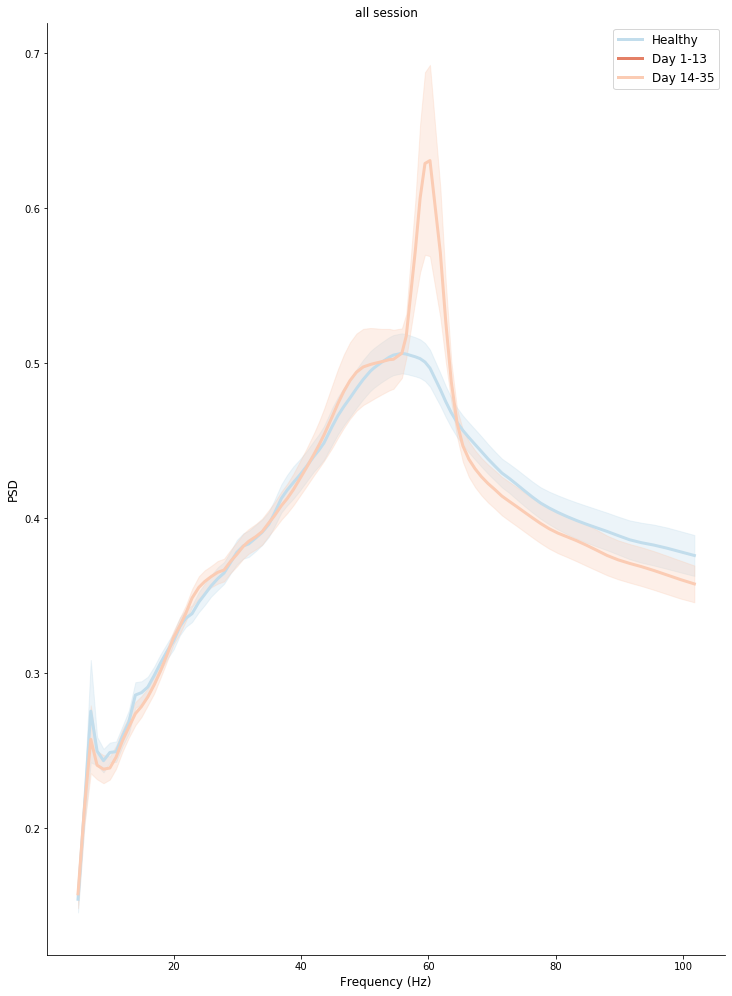

In [176]:
%matplotlib inline
colorsL = sns.cubehelix_palette(8)
colorsH = a3[[2,5,4]]#sns.cubehelix_palette(4, start=2, rot=5, dark=0, light=.65)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

fig, ax = plt.subplots(1,1,figsize=(12.15,17.15),sharey='row')
for ind, p in enumerate(periods.keys()):
    hC = np.nanmean(periods[p]['lowSpeed'],axis=1)*freq
    hS2 = np.nanstd(periods[p]['lowSpeed'],axis=1)*freq/np.sqrt(periods[p]['all'].shape[1])
       
    ax.plot(freq,hC,color = colorsH[ind], label=p,linewidth=3.0)
    ax.fill_between(freq, hC-hS2, hC+hS2,color=colorsH[ind],alpha=0.3)
#     ax.set_xlim(6,100)
    ax.set_title('all session')
#     ax.set_xlim(60,100)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax.set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax.set_xlabel('Frequency (Hz)',fontsize=12)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.legend(fontsize=12)
fig.savefig(figFolder+'lfpSpectromPost_LDOPA_lowSpeed_freq.png',transparent=True,format='png')
# ax.set_xlim(10,30)
# fig.savefig(figFolder+'lfpSpectromPeriodAllSess_zoomBeta.svg',transparent=True,format='svg')



In [112]:
df

,index,mouse,day,period,all,highAC,highC,lowRot,lowSpeed,hiSpeed
0,0761_BaselineL,0761,0,Healthy,"[[0.029895043549235237, 0.04380962397832809, 0...","[[0.013082514115555834, 0.026648016329413802, ...","[[0.02043717368449259, 0.04314596214533848, 0....","[[0.03305334394635692, 0.04594715314293283, 0....","[[0.0324276091737728, 0.046590861968338664, 0....","[[0.012484387886450895, 0.019835570924664106, ..."
1,0761_day19L,0761,19,Day 14-35,"[[0.029731099730866507, 0.04419501652700044, 0...","[[0.013946082068581476, 0.02166028056677778, 0...","[[0.017171475520890628, 0.030248737688184327, ...","[[0.03315687082365611, 0.04792633433148214, 0....","[[0.0327076464410409, 0.04793818252238706, 0.0...","[[0.014351794488429279, 0.022639636728964626, ..."
2,0761_day35L,0761,35,Day 14-35,"[[0.02646740678833966, 0.04029770115475512, 0....","[[0.013075135992072039, 0.01656664623371631, 0...","[[0.023929141938690533, 0.02672665529414784, 0...","[[0.028082340170070316, 0.04240015555499986, 0...","[[0.028206610071908885, 0.042665327613450744, ...","[[0.014267630405991346, 0.020944467540079607, ..."
3,1208_BaselineL,1208,0,Healthy,"[[0.028057806140800372, 0.03081920632653361, 0...","[[0.026018569216110732, 0.03093388437261442, 0...","[[0.02983998940524834, 0.02660803775025098, 0....","[[0.02909103772481266, 0.030574846956605707, 0...","[[0.02904256930876143, 0.031145712105099924, 0...","[[0.02582831056875528, 0.029948612749163443, 0..."
4,1208_day19L,1208,19,Day 14-35,"[[0.029528442458084666, 0.030302475275540704, ...","[[0.036353482345353565, 0.03661707230593379, 0...","[[0.03576347941363574, 0.029164165189454132, 0...","[[0.026578911406813975, 0.027545701099168842, ...","[[0.026865986032583198, 0.02751212458134215, 0...","[[0.036466419650378855, 0.03704038033287169, 0..."
5,1208_day34L,1208,34,Day 14-35,"[[0.02509296091847466, 0.02845903158006613, 0....","[[0.026690186875265337, 0.02657797562852938, 0...","[[0.07893088084975382, 0.04492436555316403, 0....","[[0.02453106560200215, 0.029594400244818832, 0...","[[0.024602068050452827, 0.0296616541113774, 0....","[[0.02842013053770467, 0.029733114138488358, 0..."
6,1222_BaselineL,1222,0,Healthy,"[[0.03384615455738076, 0.0407946444719836, 0.0...","[[0.020094766884462774, 0.03961854554862171, 0...","[[0.018926019143610723, 0.04046213685926764, 0...","[[0.03758884162827089, 0.039816390585488, 0.03...","[[0.03835585080940317, 0.04035215803964906, 0....","[[0.01608481710892047, 0.036595749936370395, 0..."
7,1222_day20L,1222,20,Day 14-35,"[[0.023396546356860597, 0.04002836501365547, 0...","[[0.019076662472388456, 0.042186276207381315, ...","[[0.01674535012768679, 0.03939981425073275, 0....","[[0.02776033511141515, 0.04012071753388655, 0....","[[0.03214888714280794, 0.04138090987503155, 0....","[[0.01632402782734731, 0.03772683177998417, 0...."
8,1222_day36L,1222,36,Day 14-35,"[[0.027354810754451692, 0.04061777519899916, 0...","[[0.021282234747477417, 0.038855680385018285, ...","[[0.014370150466640743, 0.03817644919160315, 0...","[[0.030514959841956776, 0.04095945979414009, 0...","[[0.032442454372345324, 0.04132891206727962, 0...","[[0.017461902018137635, 0.034761956413723635, ..."
9,1231_BaselineL,1231,0,Healthy,"[[0.028375758967224468, 0.049201729978986176, ...","[[0.025374972089289686, 0.038436309794641854, ...","[[0.028766522545221402, 0.050226696240304104, ...","[[0.027677258459894258, 0.045470808385928506, ...","[[0.029350194940973472, 0.04870021906477773, 0...","[[0.02911086178294793, 0.04933991496613512, 0...."


In [177]:
colorsL = sns.cubehelix_palette(8)
colorsH = sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.95)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

beta = (freq>10)&(freq<16)
beta2 = (freq>15)&(freq<25)
gamma =(freq>40)&(freq<60)
highGamma = (freq>60)&(freq<100)
highGamma2 = (freq>80)&(freq<100)

# print(periods[p]['hiSpeed'].shape,np.nanmean(periods[p]['hiSpeed'][beta],axis=0).shape)
df2 = pd.DataFrame(columns = ['Period','Mouse','sess','mvmt','beta','gamma'])
# # fig, ax = plt.subplots(2,3,figsize=(12.15,17.15),sharey='row')
for row in range(len(df)):
    for mv in ['highAC', 'highC', 'lowRot', 'lowSpeed', 'hiSpeed','all']:
        try:
            te = np.array(df.iloc[row][mv])
            df3 = pd.DataFrame({'Period':df.iloc[row]['period'],'Mouse':df.iloc[row]['mouse'],'mvmt':mv,'sess':df.iloc[row]['Sess'],
                                'beta':np.nanmean(te[0,beta],axis=0),
                                'beta2':np.nanmean(te[0,beta2],axis=0),
                               'gamma':np.nanmean(te[0,gamma],axis=0),
                               'highGamma':np.nanmean(te[0,highGamma],axis=0),
                                'highGamma2':np.nanmean(te[0,highGamma2],axis=0),
                               'betaSum':np.nansum(te[0,beta],axis=0),
                                'betaSum2':np.nansum(te[0,beta2],axis=0),
                               'highGammaSum':np.nansum(te[0,highGamma],axis=0),
                                'highGammaSum2':np.nansum(te[0,highGamma2],axis=0),
                               'gammaSum':np.nansum(te[0,gamma],axis=0)},index=[0])
            df2 = pd.concat([df3,df2])
        except: 
            print(df.iloc[row]['Sess'],mv)

df2['ratio'] = df2.apply(lambda x: x.beta/x.gamma, axis = 1)
df2['ratio_High'] = df2.apply(lambda x: x.beta/x.highGamma, axis = 1)
# df['diff'] = 
df2.to_csv(figFolder+'lfpForR_Pre.csv')
df2.head()

0761_day35L highC
0761_day35L hiSpeed
1208_day34L highC
1236_day19L highAC
2980_day19L highC
8803_BaselineL highAC
8803_day34L highC


,Period,Mouse,mvmt,sess,beta,beta2,gamma,highGamma,highGamma2,betaSum,betaSum2,highGammaSum,highGammaSum2,gammaSum,ratio,ratio_High
0,Day 14-35,8815,all,8815_day34L,0.021555,0.016234,0.008810,0.005359,0.004222,0.129329,0.162341,0.160766,0.050668,0.176209,2.446501,4.022259
0,Day 14-35,8815,hiSpeed,8815_day34L,0.021065,0.015892,0.008606,0.005353,0.004219,0.126388,0.158925,0.160579,0.050629,0.172126,2.447597,3.935401
0,Day 14-35,8815,lowSpeed,8815_day34L,0.022163,0.016635,0.009000,0.005358,0.004217,0.132975,0.166355,0.160737,0.050606,0.180001,2.462494,4.136412
0,Day 14-35,8815,lowRot,8815_day34L,0.021733,0.016511,0.008919,0.005381,0.004220,0.130396,0.165112,0.161439,0.050642,0.178371,2.436793,4.038572
0,Day 14-35,8815,highC,8815_day34L,0.020750,0.015842,0.008984,0.005323,0.004234,0.124498,0.158425,0.159682,0.050810,0.179690,2.309498,3.898314


In [406]:
df =pd.read_csv('D:\\6OHDA\\submission2\\lfpForR_Post.csv')
df2 = pd.read_csv('D:\\6OHDA\\submission1\\lfpForR.csv')
df2['timeRange'] = 'Pre'
df2 = df2[['Mouse','sess','mvmt','Period','beta','gamma',
           'highGamma','betaSum','highGammaSum','gammaSum']]
df = df[['Mouse','sess','mvmt','Period','drug','beta','gamma',
           'highGamma','betaSum','highGammaSum','gammaSum']]
df3 = df2.merge(df,on=['Mouse','sess','mvmt','Period'])#,'sess','mvmt','Period','timeRange'])
# df3.head()
drug == 'L-Dopa'
for col in ['beta','gamma','highGamma']:
    print(col)
    for mvmt in df3.mvmt.unique():
        print('______',mvmt,'_________')
        for per in df3.Period.unique():
            df4 = df3[(df3.Period==per)&(df3.drug==drug)&(df3.mvmt==mvmt)]
            print(per,' :',sci.stats.wilcoxon(df4[col+'_x'].values,df4[col+'_y'].values))

    print("------------------------------------------------------------------")



beta
______ highAC _________
Healthy  : WilcoxonResult(statistic=30.0, pvalue=0.8310546875)
Chronic  : WilcoxonResult(statistic=43.0, pvalue=0.01923370361328125)
______ highC _________
Healthy  : WilcoxonResult(statistic=19.0, pvalue=0.240234375)
Chronic  : WilcoxonResult(statistic=42.0, pvalue=0.5416259765625)
______ lowRot _________
Healthy  : WilcoxonResult(statistic=1.0, pvalue=0.00048828125)
Chronic  : WilcoxonResult(statistic=71.0, pvalue=0.0737757682800293)
______ lowSpeed _________
Healthy  : WilcoxonResult(statistic=6.0, pvalue=0.00341796875)
Chronic  : WilcoxonResult(statistic=78.0, pvalue=0.12067747116088867)
______ hiSpeed _________
Healthy  : WilcoxonResult(statistic=17.0, pvalue=0.09228515625)
Chronic  : WilcoxonResult(statistic=70.0, pvalue=0.20244979858398438)
______ all _________
Healthy  : WilcoxonResult(statistic=18.0, pvalue=0.057373046875)
Chronic  : WilcoxonResult(statistic=106.0, pvalue=0.5235109329223633)
---------------------------------------------------------

In [400]:
df3

,Mouse,sess,mvmt,Period,beta_x,gamma_x,highGamma_x,betaSum_x,highGammaSum_x,gammaSum_x,beta_y,gamma_y,highGamma_y,betaSum_y,highGammaSum_y,gammaSum_y
0,761,0761_BaselineA,highAC,Healthy,0.017404,0.010238,0.005521,0.104427,0.165643,0.204751,0.016719,0.012099,0.004758,0.100314,0.142739,0.241982
1,761,0761_BaselineA,highC,Healthy,0.018106,0.009972,0.005155,0.108634,0.154657,0.199436,0.016299,0.011941,0.004993,0.097794,0.149795,0.238815
2,761,0761_BaselineA,lowRot,Healthy,0.020411,0.009524,0.005009,0.122468,0.150259,0.190478,0.017716,0.011300,0.004791,0.106296,0.143732,0.226003
3,761,0761_BaselineA,lowSpeed,Healthy,0.020209,0.009582,0.005032,0.121251,0.150970,0.191631,0.017853,0.011204,0.004829,0.107117,0.144861,0.224088
4,761,0761_BaselineA,hiSpeed,Healthy,0.017196,0.010151,0.005467,0.103175,0.164006,0.203015,0.016565,0.012127,0.004940,0.099392,0.148201,0.242534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
520,8815,8815_day34L,highC,Chronic,0.020750,0.008984,0.005323,0.124498,0.159682,0.179690,0.024554,0.007406,0.004445,0.147324,0.133348,0.148120
521,8815,8815_day34L,lowRot,Chronic,0.021733,0.008919,0.005381,0.130396,0.161439,0.178371,0.023232,0.008191,0.005083,0.139389,0.152496,0.163824
522,8815,8815_day34L,lowSpeed,Chronic,0.022163,0.009000,0.005358,0.132975,0.160737,0.180001,0.023419,0.008151,0.005056,0.140511,0.151679,0.163011
523,8815,8815_day34L,hiSpeed,Chronic,0.021065,0.008606,0.005353,0.126388,0.160579,0.172126,0.022033,0.008502,0.005291,0.132196,0.158744,0.170038


In [210]:
df =pd.read_csv('D:\\6OHDA\\submission2\\lfpForR_Post.csv')
df2.to_csv('D:\\6OHDA\\submission2\\lfpForR_Pre.csv')
df3 = df2.merge(df,on=['sess','mvmt','Period','drug'])
# df3.to_csv(figFolder+'lfpForR_Ldopa.csv')
df4 = df3[['Period','Mouse_x','mvmt','sess','betaSum2_x','betaSum2_y']]
df4 = df4[df4.mvmt.isin(['hiSpeed','lowSpeed'])]

def difAplly(row,fr):
    try: 
        if row.mvmt in ['hiSpeed','lowSpeed']:
            low = float(df4[(df4.sess == row.sess)&(df4.Period == row.Period)&(df4.mvmt == 'hiSpeed')][fr].item())
        val = float(row[fr])
    except:
        return None
    if low==0:
        return None
    else: #base <0 and val >0:
        return (val-low)

df4['diff_pre'] = df4.apply(lambda row: difAplly(row,'betaSum2_x'),axis=1)    
df4['diff_post'] = df4.apply(lambda row: difAplly(row,'betaSum2_y'),axis=1)    
df4

,Period,Mouse_x,mvmt,sess,betaSum2_x,betaSum2_y,diff_pre,diff_post
1,Day 14-35,8815,hiSpeed,8815_day34L,0.158925,0.157568,0.000000,0.000000
2,Day 14-35,8815,lowSpeed,8815_day34L,0.166355,0.176031,0.007430,0.018463
7,Day 14-35,8815,hiSpeed,8815_day19L,0.161264,0.156883,0.000000,0.000000
8,Day 14-35,8815,lowSpeed,8815_day19L,0.178112,0.179431,0.016848,0.022548
13,Healthy,8815,hiSpeed,8815_BaselineL,0.174386,0.163607,0.000000,0.000000
...,...,...,...,...,...,...,...,...
179,Day 14-35,0761,lowSpeed,0761_day35L,0.146508,0.152941,NaN,NaN
183,Day 14-35,0761,hiSpeed,0761_day19L,0.170933,0.164399,0.000000,0.000000
184,Day 14-35,0761,lowSpeed,0761_day19L,0.161947,0.164075,-0.008986,-0.000325
189,Healthy,0761,hiSpeed,0761_BaselineL,0.149140,0.150908,0.000000,0.000000


In [211]:
df4.to_csv(figFolder+'lfpForR_Ldopa2.csv')

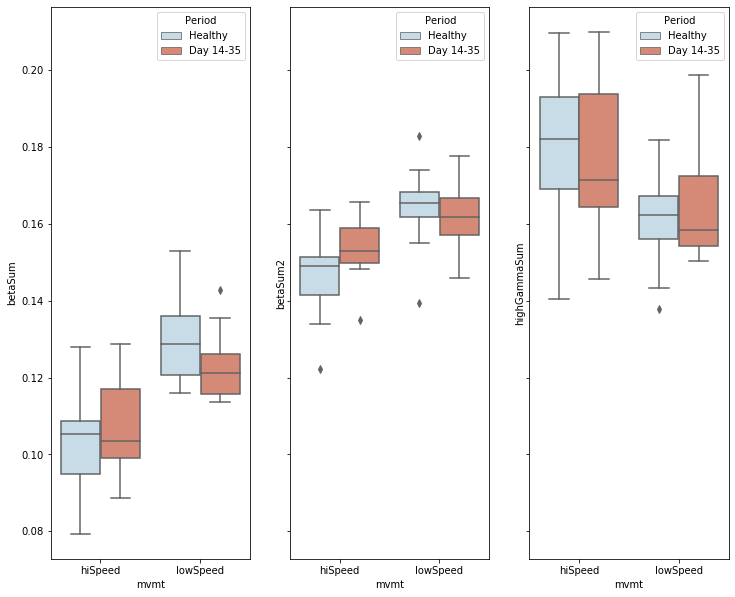

In [136]:
df = pd.read_csv(figFolder+'lfpForR_Post.csv')
df2 = df.groupby(['Period','Mouse','mvmt']).mean()
df2 = df2.reset_index()
# print(df2)
# def difAplly(row,fr):
#     if row.mvmt in ['hiSpeed','lowSpeed']:
#         low = float(df2[(df2.Mouse == row.Mouse)&(df2.Period == row.Period)&(df2.mvmt == 'lowSpeed')][fr].item())
#     else:
#         low = float(df2[(df2.Mouse == row.Mouse)&(df2.Period == row.Period)&(df2.mvmt == 'lowRot')][fr].item())
        
#     val = float(row[fr])
#     if low==0:
#         return None
#     else: #base <0 and val >0:
#         return (val-low)

# df2['diff_beta'] = df2.apply(lambda row: difAplly(row,'betaSum'),axis=1) 
# df2['diff_gamma'] = df2.apply(lambda row: difAplly(row,'gammaSum'),axis=1)    
# fig, ax = fig, ax = plt.subplots(1,2,figsize=(12.15,10.15),sharey='row')
# with sns.color_palette(colorPallet3):
#     sns.boxplot(x='Period',y='betaSum',ax = ax[0],data=df2[df2.mvmt=='all'],order = ['Healthy','Day 14-35'])
#     sns.boxplot(x='Period',y='gammaSum',ax = ax[1],data=df2[df2.mvmt=='all'],order = ['Healthy','Day 14-35'])
# fig.savefig(figFolder+'figure5_lfpfullSess_bar_Post.svg',transparent=True,format='svg')

fig, ax = fig, ax = plt.subplots(1,3,figsize=(12.15,10.15),sharey='row')
with sns.color_palette(colorPallet3):
    sns.boxplot(x='mvmt',hue = 'Period',y='betaSum',ax = ax[0],data=df2[df2.mvmt.isin(['hiSpeed','lowSpeed'])],hue_order = ['Healthy','Day 14-35'])
    sns.boxplot(x='mvmt',hue = 'Period',y='highGammaSum',ax = ax[2],data=df2[df2.mvmt.isin(['hiSpeed','lowSpeed'])],hue_order = ['Healthy','Day 14-35'])
    sns.boxplot(x='mvmt',hue = 'Period',y='betaSum2',ax = ax[1],data=df2[df2.mvmt.isin(['hiSpeed','lowSpeed'])],hue_order = ['Healthy','Day 14-35'])

fig.savefig(figFolder+'figure5_speed_bar_post.png',transparent=True,format='png')

# fig, ax = fig, ax = plt.subplots(1,2,figsize=(12.15,10.15),sharey='row')
# with sns.color_palette(colorPallet3):
#     sns.boxplot(x='mvmt',hue = 'Period',y='diff_beta',ax = ax[0],data=df2[df2.mvmt.isin(['hiSpeed','lowSpeed'])],hue_order = ['Healthy','Day 1-13','Day 14-35'])
#     sns.boxplot(x='mvmt',hue = 'Period',y='diff_gamma',ax = ax[1],data=df2[df2.mvmt.isin(['hiSpeed','lowSpeed'])],hue_order = ['Healthy','Day 1-13','Day 14-35'])
# fig.savefig(figFolder+'figure5_speed_bar_diff.svg',transparent=True,format='svg')


# fig, ax = fig, ax = plt.subplots(1,2,figsize=(12.15,10.15),sharey='row')
# with sns.color_palette(colorPallet3):
#     sns.boxplot(x='mvmt',hue = 'Period',y='betaSum',ax = ax[0],data=df2[df2.mvmt.isin(['lowRot','highAC','highC'])],hue_order = ['Healthy','Day 1-13','Day 14-35'])
#     sns.boxplot(x='mvmt',hue = 'Period',y='gammaSum',ax = ax[1],data=df2[df2.mvmt.isin(['lowRot','highAC','highC'])],hue_order = ['Healthy','Day 1-13','Day 14-35'])
# fig.savefig(figFolder+'figure5_rot_bar.svg',transparent=True,format='svg')

# fig, ax = fig, ax = plt.subplots(1,2,figsize=(12.15,10.15),sharey='row')
# with sns.color_palette(colorPallet3):
#     sns.boxplot(x='mvmt',hue = 'Period',y='diff_beta',ax = ax[0],data=df2[df2.mvmt.isin(['lowRot','highAC','highC'])],hue_order = ['Healthy','Day 1-13','Day 14-35'])
#     sns.boxplot(x='mvmt',hue = 'Period',y='diff_gamma',ax = ax[1],data=df2[df2.mvmt.isin(['lowRot','highAC','highC'])],hue_order = ['Healthy','Day 1-13','Day 14-35'])
# fig.savefig(figFolder+'figure5_rot_bar_diff.svg',transparent=True,format='svg')


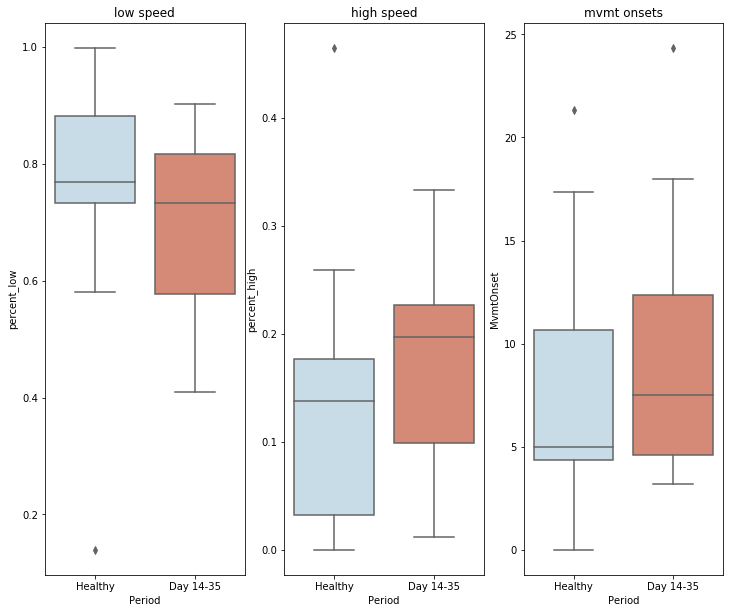

In [172]:
df = pd.read_csv('lineraVelocity_post.csv')
df = df[df.Drug == 'L-Dopa']
df = df[df.timeRange == 'full']
df['Period'] = df.Day.apply(lambda x: periodCalc(x))
df.to_csv(figFolder+'lineraVelocity_post2.csv')
df2 = df.groupby(['Period','Mouse']).mean()
df2 = df2.reset_index()

fig, ax = fig, ax = plt.subplots(1,3,figsize=(12.15,10.15))#,sharey='row')
with sns.color_palette(colorPallet3):
    sns.boxplot(x='Period',y='percent_low',ax = ax[0],data=df2,order = ['Healthy','Day 14-35'])
    sns.boxplot(x='Period',y='percent_high',ax = ax[1],data=df2,order = ['Healthy','Day 14-35'])
    sns.boxplot(x='Period',y='MvmtOnset',ax = ax[2],data=df2,order = ['Healthy','Day 14-35'])
    ax[0].set_title('low speed')
    ax[1].set_title('high speed')
    ax[2].set_title('mvmt onsets')
fig.savefig(figFolder+'speed_post_LDopa.png',transparent=True,format='png')


In [187]:
# df = df_normlizeByCol_meanPost
df = df_normlizeByCol_meanPre
# df.groupby(['mouse','period'])
periodsPre = {'Healthy':{'axis':0},'Day 14-35':{'axis':1}}
conds = ['highAC','highC','lowRot','lowSpeed','hiSpeed','all']

for p in periodsPre.keys():
    for c in conds:
        periodsPre[p][c] = np.zeros((87,1))
    for m in df[df.period == p].mouse.unique():
        for c in conds:
            try:
                te = np.array(df[(df.period == p)&(df.mouse == m)][c].tolist())
#                 print(te.shape)
                periodsPre[p][c] = np.concatenate((periodsPre[p][c],np.nanmean(te,axis=0).T),axis=1)                         
            except:
                print(m,c,p,te.shape)
                continue
for p in periodsPre.keys():
    for c in conds:
        periodsPre[p][c] = periodsPre[p][c][:,1:]



8803 highAC Healthy (1,)
0761 highC Day 14-35 (2,)
0761 hiSpeed Day 14-35 (2,)
1208 highC Day 14-35 (2,)
1236 highAC Day 14-35 (2,)
2980 highC Day 14-35 (2,)
8803 highC Day 14-35 (2,)


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  del sys.path[0]


In [188]:
df = df_normlizeByCol_meanPost
# df = df_normlizeByCol_meanPre
# df.groupby(['mouse','period'])
periodsPost = {'Healthy':{'axis':0},'Day 14-35':{'axis':1}}
conds = ['highAC','highC','lowRot','lowSpeed','hiSpeed','all']

for p in periodsPost.keys():
    for c in conds:
        periodsPost[p][c] = np.zeros((87,1))
    for m in df[df.period == p].mouse.unique():
        for c in conds:
            try:
                te = np.array(df[(df.period == p)&(df.mouse == m)][c].tolist())
#                 print(te.shape)
                periodsPost[p][c] = np.concatenate((periodsPost[p][c],np.nanmean(te,axis=0).T),axis=1)                         
            except:
                print(m,c,p,te.shape)
                continue
for p in periodsPost.keys():
    for c in conds:
        periodsPost[p][c] = periodsPost[p][c][:,1:]



1793 highAC Healthy (1,)
1793 highC Healthy (1,)
1793 hiSpeed Healthy (1,)
8430 highAC Healthy (1,)
1236 highAC Day 14-35 (2,)
1793 highAC Day 14-35 (2,)
1793 highC Day 14-35 (2,)
1793 hiSpeed Day 14-35 (2,)
8803 highAC Day 14-35 (2,)


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  del sys.path[0]


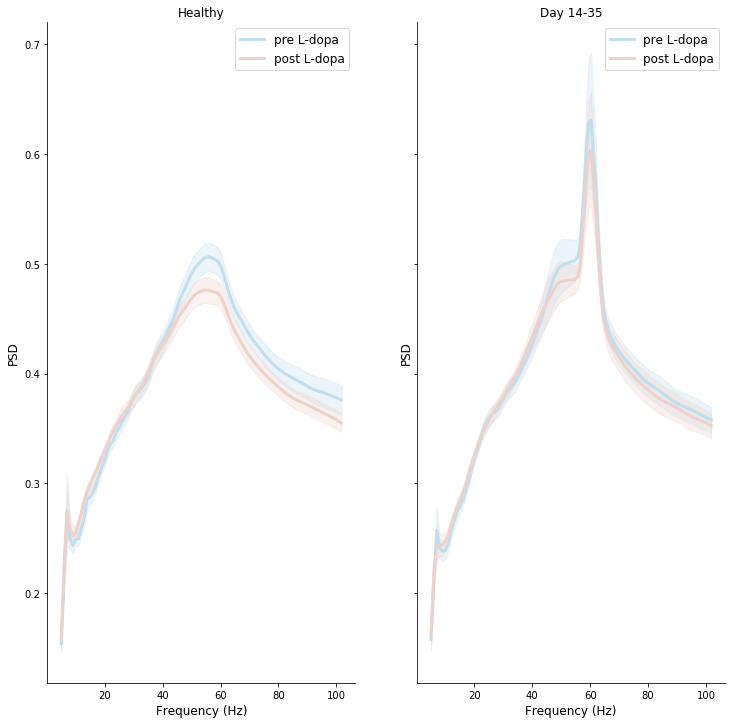

In [200]:
%matplotlib inline
colorsL = sns.cubehelix_palette(8)
colorsH = a3[[2,5,4]]#sns.cubehelix_palette(4, start=2, rot=5, dark=0, light=.65)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

fig, ax = plt.subplots(1,2,figsize=(12.15,12.15),sharey='row')
for ind, p in enumerate(periodsPre.keys()):
    hC = np.nanmean(periodsPre[p]['lowSpeed'],axis=1)*freq
    hS2 = np.nanstd(periodsPre[p]['lowSpeed'],axis=1)*freq/np.sqrt(periodsPre[p]['all'].shape[1])
       
    ax[ind].plot(freq,hC,color = colorsH[0], label='pre L-dopa',linewidth=3.0)
    ax[ind].fill_between(freq, hC-hS2, hC+hS2,color=colorsH[0],alpha=0.3)
    
    hC = np.nanmean(periodsPost[p]['lowSpeed'],axis=1)*freq
    hS2 = np.nanstd(periodsPost[p]['lowSpeed'],axis=1)*freq/np.sqrt(periodsPost[p]['all'].shape[1])
       
    ax[ind].plot(freq,hC,color = colorsL[0], label='post L-dopa',linewidth=3.0)
    ax[ind].fill_between(freq, hC-hS2, hC+hS2,color=colorsL[0],alpha=0.3)
#     ax.set_xlim(6,100)
    ax[ind].set_title(p)
#     ax.set_xlim(60,100)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax[ind].set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax[ind].set_xlabel('Frequency (Hz)',fontsize=12)
    ax[ind].spines['right'].set_visible(False)
    ax[ind].spines['top'].set_visible(False)
    ax[ind].legend(fontsize=12)
# fig.savefig(figFolder+'lfpSpectromPost_LDOPA_lowSpeed_freq.png',transparent=True,format='png')
# ax.set_xlim(10,30)
# fig.savefig(figFolder+'lfpSpectromPeriodAllSess_zoomBeta.svg',transparent=True,format='svg')



In [186]:
periodsPre.keys()

dict_keys(['Healthy', 'Day 1-13', 'Day 14-35'])

In [271]:
# spectrom in high/low mvmt
f = h5py.File('Spectograms.hdf5','r')

miceList = getMiceList(Files[0])
specs = {}
for m in tqdm(miceList):  
    data =  getData(Files[0],['lfp','speed'],period ='Post', mice=m, drug = b'Amphetamin')
    
    for sess in data:
        try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])

            # get data
            dtS = 1/data[sess]['speed']['Fs']
            dtL = 1/data[sess]['lfp']['FS']
            ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
            tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL


            highAC = getOnsetOrPeriod(m,sess,'Post','hiACRotPeriods_vector')
            highC = getOnsetOrPeriod(m,sess,'Post','hiCRotPeriods_vector')
            lowRot = getOnsetOrPeriod(m,sess,'Post','loRotPeriods_vector')
            lowSpeed = getOnsetOrPeriod(m,sess,'Post','LowMvmtPeriods_vector')
            hiSpeed = getOnsetOrPeriod(m,sess,'Post','HighMvmtPeriods_vector')
            tempDict = {'mouse':m,'day':day,'period':periodCalc(day)}

            freq = f[m]['freq'].value
            coeff = np.abs(f[m][sess]['Post']['coeff'].value)
            lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff = coeff.T
            
            Hs = np.nansum(coeff, axis=1)
            Hs2 = coeff.T/Hs.T
            Hs2 = Hs2.T
            tempDict['all'] = np.nanmean(Hs2,axis=0, keepdims=True)


            for mv in ['highAC','highC','lowRot','lowSpeed','hiSpeed']:
                Himvmt = np.full_like(tl,False)
                mVector = eval(mv)
                if np.sum(mVector) == 0:
                    continue
                V = np.append(mVector[1:]*1-mVector[:-1]*1,0)
                HpStart = ts[V==1]
                HpEnd = ts[V==-1]
                if mVector[0] == 1:
                    HpStart = np.insert(HpStart,0,0)
                for segI, seg in enumerate(HpStart):
                    si = np.argmin(np.abs(tl-seg))
                    se = np.argmin(np.abs(tl-HpEnd[segI])
                                  )
                    Himvmt[si:se] = True

                #coeff = np.delete(coeff,(56), axis=1)
                sessH = (Hs2[(Himvmt ==1),:])
#                 Hs = np.nansum(sessH, axis=0)
#                 Hs2 = sessH/Hs
                tempDict[mv] = np.nanmean(sessH,axis=0, keepdims=True)
            specs[sess] = tempDict
        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,exc_tb.tb_lineno)

df_normlizeByCol_meanPost_Amph = pd.DataFrame(specs)
df_normlizeByCol_meanPost_Amph = df_normlizeByCol_meanPost_Amph.T
# df.to_csv('specs_normlizeByRow_sum.csv')

  0%|          | 0/16 [00:00<?, ?it/s]/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:48: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  lfp = hf[m][s]['ePhys']['lfp'].value


cleaning up lfp data
cleaning up speed data


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  6%|▋         | 1/16 [02:31<37:56, 151.74s/it]

cleaning up lfp data
cleaning up speed data


 12%|█▎        | 2/16 [05:33<37:30, 160.76s/it]

cleaning up lfp data
cleaning up speed data


 19%|█▉        | 3/16 [07:52<33:25, 154.29s/it]

cleaning up lfp data
cleaning up speed data


 25%|██▌       | 4/16 [08:48<24:57, 124.82s/it]

cleaning up lfp data
cleaning up speed data
found  34.0  outlier points
found  927582.0  outlier points


 31%|███▏      | 5/16 [11:39<25:24, 138.60s/it]

cleaning up lfp data
cleaning up speed data


 38%|███▊      | 6/16 [12:20<18:14, 109.40s/it]

cleaning up lfp data
cleaning up speed data


 44%|████▍     | 7/16 [15:21<19:36, 130.70s/it]

cleaning up lfp data
cleaning up speed data


 50%|█████     | 8/16 [17:59<18:31, 138.99s/it]

cleaning up lfp data
cleaning up speed data
found  144.0  outlier points


 56%|█████▋    | 9/16 [21:09<18:00, 154.42s/it]

cleaning up lfp data
cleaning up speed data
found  105.0  outlier points


 62%|██████▎   | 10/16 [23:50<15:37, 156.31s/it]

cleaning up lfp data
cleaning up speed data
found  17.0  outlier points


 69%|██████▉   | 11/16 [26:21<12:53, 154.71s/it]

cleaning up lfp data
cleaning up speed data


 75%|███████▌  | 12/16 [27:26<08:30, 127.71s/it]

cleaning up lfp data
cleaning up speed data
found  10.0  outlier points


 81%|████████▏ | 13/16 [30:41<07:24, 148.03s/it]

cleaning up lfp data
cleaning up speed data


 88%|████████▊ | 14/16 [33:02<04:51, 145.93s/it]

cleaning up lfp data
cleaning up speed data


 94%|█████████▍| 15/16 [35:07<02:19, 139.44s/it]

cleaning up lfp data
cleaning up speed data


100%|██████████| 16/16 [37:31<00:00, 140.74s/it]


In [272]:
# spectrom in high/low mvmt
f = h5py.File('Spectograms.hdf5','r')

miceList = getMiceList(Files[0])
specs = {}
for m in tqdm(miceList):  
    data =  getData(Files[0],['lfp','speed'],period ='Pre', mice=m, drug = b'Amphetamin')
    
    for sess in data:
        try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])

            # get data
            dtS = 1/data[sess]['speed']['Fs']
            dtL = 1/data[sess]['lfp']['FS']
            ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
            tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL


            highAC = getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
            highC = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
            lowRot = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
            lowSpeed = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
            hiSpeed = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
            tempDict = {'mouse':m,'day':day,'period':periodCalc(day)}

            freq = f[m]['freq'].value
            coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
            lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff = coeff.T
            
            Hs = np.nansum(coeff, axis=1)
            Hs2 = coeff.T/Hs.T
            Hs2 = Hs2.T
            tempDict['all'] = np.nanmean(Hs2,axis=0, keepdims=True)


            for mv in ['highAC','highC','lowRot','lowSpeed','hiSpeed']:
                Himvmt = np.full_like(tl,False)
                mVector = eval(mv)
                if np.sum(mVector) == 0:
                    continue
                V = np.append(mVector[1:]*1-mVector[:-1]*1,0)
                HpStart = ts[V==1]
                HpEnd = ts[V==-1]
                if mVector[0] == 1:
                    HpStart = np.insert(HpStart,0,0)
                for segI, seg in enumerate(HpStart):
                    si = np.argmin(np.abs(tl-seg))
                    se = np.argmin(np.abs(tl-HpEnd[segI])
                                  )
                    Himvmt[si:se] = True

                #coeff = np.delete(coeff,(56), axis=1)
                sessH = (Hs2[(Himvmt ==1),:])
#                 Hs = np.nansum(sessH, axis=0)
#                 Hs2 = sessH/Hs
                tempDict[mv] = np.nanmean(sessH,axis=0, keepdims=True)
            specs[sess] = tempDict
        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,exc_tb.tb_lineno)

df_normlizeByCol_meanPre_Amph = pd.DataFrame(specs)
df_normlizeByCol_meanPre_Amph = df_normlizeByCol_meanPre_Amph.T
# df.to_csv('specs_normlizeByRow_sum.csv')

  0%|          | 0/16 [00:00<?, ?it/s]/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.


cleaning up lfp data
cleaning up speed data


  6%|▋         | 1/16 [00:30<07:32, 30.16s/it]

cleaning up lfp data
cleaning up speed data


 12%|█▎        | 2/16 [01:01<07:07, 30.56s/it]

cleaning up lfp data
cleaning up speed data


 19%|█▉        | 3/16 [01:38<07:01, 32.42s/it]

cleaning up lfp data
cleaning up speed data


 25%|██▌       | 4/16 [01:50<05:17, 26.44s/it]

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points
found  888231.0  outlier points


 31%|███▏      | 5/16 [02:26<05:21, 29.27s/it]

cleaning up lfp data
cleaning up speed data


 38%|███▊      | 6/16 [02:38<04:01, 24.15s/it]

cleaning up lfp data
cleaning up speed data


 44%|████▍     | 7/16 [03:15<04:09, 27.75s/it]

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points


 50%|█████     | 8/16 [03:51<04:03, 30.45s/it]

cleaning up lfp data
cleaning up speed data


 56%|█████▋    | 9/16 [04:26<03:42, 31.74s/it]

cleaning up lfp data
cleaning up speed data
found  50.0  outlier points


 62%|██████▎   | 10/16 [05:03<03:19, 33.31s/it]

cleaning up lfp data
cleaning up speed data


 69%|██████▉   | 11/16 [05:49<03:05, 37.04s/it]

cleaning up lfp data
cleaning up speed data


 75%|███████▌  | 12/16 [06:11<02:09, 32.47s/it]

cleaning up lfp data
cleaning up speed data


 81%|████████▏ | 13/16 [06:59<01:52, 37.34s/it]

cleaning up lfp data
cleaning up speed data


 88%|████████▊ | 14/16 [07:34<01:12, 36.46s/it]

cleaning up lfp data
cleaning up speed data


 94%|█████████▍| 15/16 [07:56<00:32, 32.23s/it]

cleaning up lfp data
cleaning up speed data


100%|██████████| 16/16 [08:29<00:00, 31.82s/it]


In [277]:
df = df_normlizeByCol_meanPost_Amph
# df = df_normlizeByCol_meanPre_Amph
# df.groupby(['mouse','period'])
periods = {'Healthy':{'axis':0},'Day 1-13':{'axis':1},'Day 14-35':{'axis':2}}
conds = ['highAC','highC','lowRot','lowSpeed','hiSpeed','all']

for p in periods.keys():
    for c in conds:
        periods[p][c] = np.zeros((87,1))
    for m in df[df.period == p].mouse.unique():
        for c in conds:
            try:
                te = np.array(df[(df.period == p)&(df.mouse == m)][c].tolist())
#                 print(te.shape)
                periods[p][c] = np.concatenate((periods[p][c],np.nanmean(te,axis=0).T),axis=1)                         
            except:
                print(m,c,p,te.shape)
                continue
for p in periods.keys():
    for c in conds:
        periods[p][c] = periods[p][c][:,1:]



1253 highAC Healthy (1,)
4539 lowSpeed Healthy (2,)
1222 highC Day 14-35 (2,)
1793 highC Day 14-35 (2,)
8430 highC Day 14-35 (2,)
8815 highC Day 14-35 (2,)


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  del sys.path[0]


In [281]:
df.reset_index(inplace=True)
df = df.rename(columns = {'index':'Sess'})
df

,Sess,mouse,day,period,all,highAC,highC,lowRot,lowSpeed,hiSpeed
0,0761_BaselineA,0761,0,Healthy,"[[0.02876768465526848, 0.06463936762839047, 0....","[[0.028930441092292022, 0.04550464614099855, 0...","[[0.026921176987748947, 0.0722995052029462, 0....","[[0.03157241669526732, 0.0606967539984188, 0.0...","[[0.02963612775865243, 0.06022399785354268, 0....","[[0.030819023614987857, 0.049826756240077215, ..."
1,0761_day14A,0761,14,Day 14-35,"[[0.017636786404003547, 0.07119876102346331, 0...","[[0.015498422715604162, 0.05579742974736276, 0...","[[0.0174630576835836, 0.07574284780549449, 0.0...","[[0.018511470047013978, 0.07745104335273922, 0...","[[0.0172182043039278, 0.04585282891684846, 0.0...","[[0.01743575145080504, 0.07411932431911669, 0...."
2,0761_day31A,0761,31,Day 14-35,"[[0.013457495647732354, 0.032516934385271964, ...","[[0.013282123634030845, 0.034270861445472915, ...","[[0.017636569488303753, 0.020830155420287398, ...","[[0.01487167497963564, 0.026963073496501035, 0...","[[0.018868589256680834, 0.028845455846950963, ...","[[0.013124559699016089, 0.03351687708771675, 0..."
3,1208_BaselineA,1208,0,Healthy,"[[0.02151405813410194, 0.027889262932355822, 0...","[[0.021662941011678746, 0.026775344522764612, ...","[[0.013979160717044622, 0.015155762072182841, ...","[[0.021673055885983224, 0.03040632103353184, 0...","[[0.022509796652593266, 0.03367432355028378, 0...","[[0.021570474049997384, 0.026444448032140504, ..."
4,1208_day15A,1208,15,Day 14-35,"[[0.02190567698078864, 0.025951991808510176, 0...","[[0.022183900093437608, 0.02548674629640758, 0...","[[0.02289534848258643, 0.027414104087293063, 0...","[[0.02181481859957766, 0.027712014245423938, 0...","[[0.021495891055340503, 0.028274451767647243, ...","[[0.022083614494287012, 0.025526551599904274, ..."
5,1208_day30A,1208,30,Day 14-35,"[[0.022274765010398892, 0.024071326023251544, ...","[[0.02264901213287174, 0.024582774362347144, 0...","[[0.034098364870067434, 0.0428899762341972, 0....","[[0.023850027518887904, 0.02313170016111525, 0...","[[0.02273520252287103, 0.02412832718737113, 0....","[[0.02348979237198665, 0.0251680278315685, 0.0..."
6,1222_BaselineA,1222,0,Healthy,"[[0.05195676641707478, 0.04705546357774312, 0....","[[0.057296053934703606, 0.042291278287605115, ...","[[0.04379850445201092, 0.07502843296671571, 0....","[[0.04275316130629483, 0.04980608015104755, 0....","[[0.04761407864043351, 0.04872102827505164, 0....","[[0.05600936565833622, 0.04324247307290628, 0...."
7,1222_day15A,1222,15,Day 14-35,"[[0.02102743964504221, 0.08952123296884675, 0....","[[0.021677153012162984, 0.0948583252648339, 0....","[[0.017747416930139624, 0.0588694718956549, 0....","[[0.015953664273242147, 0.057606934050913244, ...","[[0.0310596608940062, 0.07242228130500057, 0.0...","[[0.020746146514202028, 0.07314227269627042, 0..."
8,1222_day32A,1222,32,Day 14-35,"[[0.020605211915185002, 0.07292698875613411, 0...","[[0.020845749437095027, 0.07384683417351495, 0...",NaN,"[[0.01930934649173269, 0.08143295369631376, 0....","[[0.02236266931329545, 0.07912060478003215, 0....","[[0.019405256806550444, 0.0672862429631134, 0...."
9,1231_BaselineA,1231,0,Healthy,"[[0.022729885870271627, 0.06185686331149055, 0...","[[0.02201927109714879, 0.03554960926123893, 0....","[[0.024140142967591104, 0.06827480946213078, 0...","[[0.022080967077039937, 0.06250840255566922, 0...","[[0.023797560751384148, 0.06547919910667989, 0...","[[0.019476115980636866, 0.04479704855527559, 0..."


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: Mean of empty slice
  
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


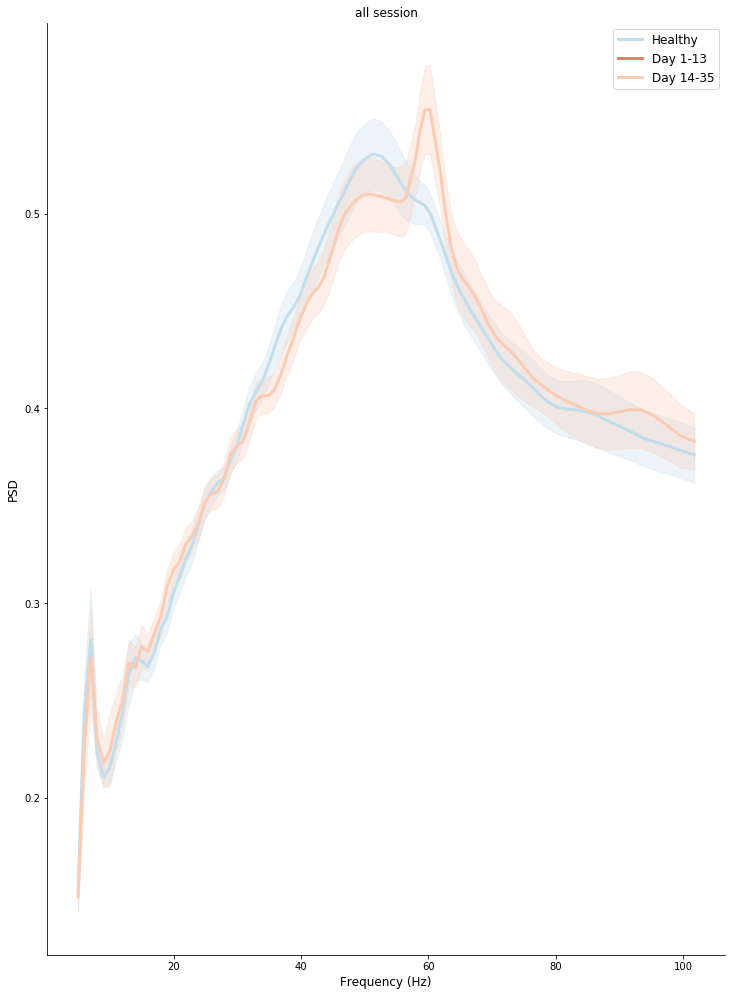

In [282]:
%matplotlib inline
colorsL = sns.cubehelix_palette(8)
colorsH = a3[[2,5,4]]#sns.cubehelix_palette(4, start=2, rot=5, dark=0, light=.65)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

fig, ax = plt.subplots(1,1,figsize=(12.15,17.15),sharey='row')
for ind, p in enumerate(periods.keys()):
    hC = np.nanmean(periods[p]['lowSpeed'],axis=1)*freq
    hS2 = np.nanstd(periods[p]['lowSpeed'],axis=1)*freq/np.sqrt(periods[p]['all'].shape[1])
       
    ax.plot(freq,hC,color = colorsH[ind], label=p,linewidth=3.0)
    ax.fill_between(freq, hC-hS2, hC+hS2,color=colorsH[ind],alpha=0.3)
#     ax.set_xlim(6,100)
    ax.set_title('all session')
#     ax.set_xlim(60,100)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax.set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax.set_xlabel('Frequency (Hz)',fontsize=12)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.legend(fontsize=12)
fig.savefig(figFolder+'lfpSpectromPost_LDOPA_lowSpeed_freq.png',transparent=True,format='png')
# ax.set_xlim(10,30)
# fig.savefig(figFolder+'lfpSpectromPeriodAllSess_zoomBeta.svg',transparent=True,format='svg')



In [233]:
# df = df_normlizeByCol_meanPost_Saline
# df.reset_index(inplace=True)
# df = df.rename(columns = {'index':'Sess'})
# df


# te = np.array(df.iloc[0]['hiSpeed'])
# np.sum(te)
Hs.shape

(1815677,)

In [283]:
colorsL = sns.cubehelix_palette(8)
colorsH = sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.95)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

beta = (freq>10)&(freq<16)
beta2 = (freq>15)&(freq<25)
gamma =(freq>40)&(freq<60)
highGamma = (freq>60)&(freq<100)
highGamma2 = (freq>80)&(freq<100)

# print(periods[p]['hiSpeed'].shape,np.nanmean(periods[p]['hiSpeed'][beta],axis=0).shape)
df2 = pd.DataFrame(columns = ['Period','Mouse','sess','mvmt','beta','gamma'])
# # fig, ax = plt.subplots(2,3,figsize=(12.15,17.15),sharey='row')
for row in range(len(df)):
    for mv in ['highAC', 'highC', 'lowRot', 'lowSpeed', 'hiSpeed','all']:
        try:
            te = np.array(df.iloc[row][mv])
            df3 = pd.DataFrame({'Period':df.iloc[row]['period'],'Mouse':df.iloc[row]['mouse'],'mvmt':mv,'sess':df.iloc[row]['Sess'],
                                'beta':np.nanmean(te[0,beta],axis=0),
                                'beta2':np.nanmean(te[0,beta2],axis=0),
                               'gamma':np.nanmean(te[0,gamma],axis=0),
                               'highGamma':np.nanmean(te[0,highGamma],axis=0),
                                'highGamma2':np.nanmean(te[0,highGamma2],axis=0),
                               'betaSum':np.nansum(te[0,beta],axis=0),
                                'betaSum2':np.nansum(te[0,beta2],axis=0),
                               'highGammaSum':np.nansum(te[0,highGamma],axis=0),
                                'highGammaSum2':np.nansum(te[0,highGamma2],axis=0),
                               'gammaSum':np.nansum(te[0,gamma],axis=0)},index=[0])
            df2 = pd.concat([df3,df2])
        except: 
            print(df.iloc[row]['Sess'],mv)

df2['ratio'] = df2.apply(lambda x: x.beta/x.gamma, axis = 1)
df2['ratio_High'] = df2.apply(lambda x: x.beta/x.highGamma, axis = 1)
# df['diff'] = 
df2.to_csv(figFolder+'lfpForR_Post_Amph.csv')
df2.head()

1222_day32A highC
1253_BaselineA highAC
1793_day30A highC
4539_BaselineA lowSpeed
8430_day30A highC
8815_day30A highC


,Period,Mouse,mvmt,sess,beta,beta2,gamma,highGamma,highGamma2,betaSum,betaSum2,highGammaSum,highGammaSum2,gammaSum,ratio,ratio_High
0,Day 14-35,8815,all,8815_day30A,0.023439,0.016035,0.008135,0.005002,0.003896,0.140634,0.160350,0.150052,0.046747,0.162707,2.881133,4.686179
0,Day 14-35,8815,hiSpeed,8815_day30A,0.024817,0.016081,0.007693,0.004789,0.003740,0.148899,0.160813,0.143678,0.044879,0.153861,3.225841,5.181707
0,Day 14-35,8815,lowSpeed,8815_day30A,0.019328,0.016105,0.009379,0.005604,0.004341,0.115970,0.161047,0.168123,0.052095,0.187584,2.060774,3.448974
0,Day 14-35,8815,lowRot,8815_day30A,0.020865,0.015969,0.008966,0.005431,0.004230,0.125189,0.159688,0.162932,0.050763,0.179317,2.327146,3.841739
0,Day 14-35,8815,highAC,8815_day30A,0.025363,0.016322,0.007454,0.004571,0.003601,0.152179,0.163215,0.137145,0.043218,0.149087,3.402469,5.548114


In [284]:
df2 =pd.read_csv(figFolder+'lfpForR_Pre_Amph.csv')
df =pd.read_csv(figFolder+'lfpForR_Post_Amph.csv')
df3 = df2.merge(df,on=['sess','mvmt','Period'])
df3.to_csv(figFolder+'lfpForR_Amph.csv')
df4 = df3[['Period','Mouse_x','mvmt','sess','betaSum2_x','betaSum2_y']]
df4 = df4[df4.mvmt.isin(['hiSpeed','lowSpeed'])]

def difAplly(row,fr):
    try: 
        if row.mvmt in ['hiSpeed','lowSpeed']:
            low = float(df4[(df4.sess == row.sess)&(df4.Period == row.Period)&(df4.mvmt == 'hiSpeed')][fr].item())
        val = float(row[fr])
    except:
        return None
    if low==0:
        return None
    else: #base <0 and val >0:
        return (val-low)

df4['diff_pre'] = df4.apply(lambda row: difAplly(row,'betaSum2_x'),axis=1)    
df4['diff_post'] = df4.apply(lambda row: difAplly(row,'betaSum2_y'),axis=1)

df4

,Period,Mouse_x,mvmt,sess,betaSum2_x,betaSum2_y,diff_pre,diff_post
1,Day 14-35,8815,hiSpeed,8815_day30A,0.159633,0.160813,0.000000,0.000000
2,Day 14-35,8815,lowSpeed,8815_day30A,0.171568,0.161047,0.011936,0.000234
6,Day 14-35,8815,hiSpeed,8815_day15A,0.150665,0.162123,0.000000,0.000000
7,Day 14-35,8815,lowSpeed,8815_day15A,0.164129,0.156113,0.013464,-0.006010
12,Healthy,8815,hiSpeed,8815_BaselineA,0.169029,0.172160,0.000000,0.000000
...,...,...,...,...,...,...,...,...
239,Day 14-35,761,lowSpeed,0761_day31A,0.162054,0.138108,-0.005652,0.004739
243,Day 14-35,761,hiSpeed,0761_day14A,0.176601,0.139192,0.000000,0.000000
244,Day 14-35,761,lowSpeed,0761_day14A,0.166417,0.148513,-0.010183,0.009321
249,Healthy,761,hiSpeed,0761_BaselineA,0.153560,0.140693,0.000000,0.000000


In [285]:
df4.to_csv(figFolder+'lfpForR_Amph2.csv')

In [8]:
# spectrom in high/low mvmt
f = h5py.File('Spectograms.hdf5','r')

miceList = getMiceList(Files[0])
specs = {}
for m in tqdm(miceList):  
    data =  getData(Files[0],['lfp','speed'],period ='Pre', mice=m)#, drug = b'Amphetamin')
    
    for sess in data:
        try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])

            # get data
            dtS = 1/data[sess]['speed']['Fs']
            dtL = 1/data[sess]['lfp']['FS']
            ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
            tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL


            highAC = getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
            highC = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
            lowRot = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
            lowSpeed = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
            hiSpeed = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
            rot = highAC+highC
            tempDict = {'mouse':m,'day':day,'period':periodCalc(day)}

            freq = f[m]['freq'].value
            coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
            lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff = coeff.T
            
            Hs = np.nansum(coeff, axis=1)
            Hs2 = coeff.T/Hs.T
            Hs2 = Hs2.T
            tempDict['all'] = np.nanmean(Hs2,axis=0, keepdims=True)


            for mv in ['highAC','highC','lowRot','lowSpeed','hiSpeed','rot']:
                Himvmt = np.full_like(tl,False)
                mVector = eval(mv)
                if np.sum(mVector) == 0:
                    continue
                V = np.append(mVector[1:]*1-mVector[:-1]*1,0)
                HpStart = ts[V==1]
                HpEnd = ts[V==-1]
                if mVector[0] == 1:
                    HpStart = np.insert(HpStart,0,0)
                for segI, seg in enumerate(HpStart):
                    si = np.argmin(np.abs(tl-seg))
                    se = np.argmin(np.abs(tl-HpEnd[segI])
                                  )
                    Himvmt[si:se] = True

                #coeff = np.delete(coeff,(56), axis=1)
                sessH = (Hs2[(Himvmt ==1),:])
#                 Hs = np.nansum(sessH, axis=0)
#                 Hs2 = sessH/Hs
                tempDict[mv] = np.nanmean(sessH,axis=0, keepdims=True)
            specs[sess] = tempDict
        except Exception as e:
            exc_type, exc_obj, exc_tb = sys.exc_info()
            print(sess,exc_tb.tb_lineno)

df_normlizeByCol_mean = pd.DataFrame(specs)
df_normlizeByCol_mean = df_normlizeByCol_mean.T
# df.to_csv('specs_normlizeByRow_sum.csv')

  0%|          | 0/16 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:32: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  6%|▋         | 1/16 [02:14<33:35, 134.36s/it]

cleaning up lfp data
I deleted session: 1208_day12
cleaning up speed data
found  17.0  outlier points


 12%|█▎        | 2/16 [04:42<32:17, 138.43s/it]

cleaning up lfp data
cleaning up speed data


 19%|█▉        | 3/16 [07:41<32:38, 150.63s/it]

cleaning up lfp data
cleaning up speed data


 25%|██▌       | 4/16 [08:19<23:22, 116.89s/it]

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points
found  888231.0  outlier points
found  481139.0  outlier points


 31%|███▏      | 5/16 [10:56<23:38, 128.99s/it]

cleaning up lfp data
cleaning up speed data


 38%|███▊      | 6/16 [11:35<17:00, 102.04s/it]

cleaning up lfp data
cleaning up speed data


 44%|████▍     | 7/16 [14:30<18:35, 123.91s/it]

cleaning up lfp data
I deleted session: 2976_day4
cleaning up speed data
found  1.0  outlier points
found  3.0  outlier points


 50%|█████     | 8/16 [17:11<18:00, 135.06s/it]

cleaning up lfp data
cleaning up speed data


 56%|█████▋    | 9/16 [19:49<16:33, 141.88s/it]

cleaning up lfp data
cleaning up speed data
found  50.0  outlier points


 62%|██████▎   | 10/16 [22:40<15:04, 150.70s/it]

cleaning up lfp data
cleaning up speed data
found  29.0  outlier points


 69%|██████▉   | 11/16 [25:59<13:44, 164.94s/it]

cleaning up lfp data
cleaning up speed data


 75%|███████▌  | 12/16 [28:58<11:16, 169.24s/it]

cleaning up lfp data
cleaning up speed data


 81%|████████▏ | 13/16 [32:18<08:55, 178.36s/it]

cleaning up lfp data
cleaning up speed data


 88%|████████▊ | 14/16 [34:49<05:40, 170.21s/it]

cleaning up lfp data
cleaning up speed data
8803_day6 34


 94%|█████████▍| 15/16 [37:09<02:41, 161.28s/it]

cleaning up lfp data
cleaning up speed data
8815_day6 34


100%|██████████| 16/16 [39:33<00:00, 148.36s/it]


In [31]:
df = df_normlizeByCol_mean
# df = df_normlizeByCol_meanPre_Amph
# df.groupby(['mouse','period'])
periods = {'Healthy':{'axis':0},'Day 1-13':{'axis':1},'Day 14-35':{'axis':2}}
conds = ['highAC','highC','lowRot','lowSpeed','hiSpeed','rot','all']

for p in periods.keys():
    for c in conds:
        periods[p][c] = np.zeros((87,1))
    for m in df[df.period == p].mouse.unique():
        for c in conds:
            try:
                te = np.array(df[(df.period == p)&(df.mouse == m)][c].tolist())
#                 print(te.shape)
                periods[p][c] = np.concatenate((periods[p][c],np.nanmean(te,axis=0).T),axis=1)                         
            except:
                print(m,c,p,te.shape)
                continue
for p in periods.keys():
    for c in conds:
        periods[p][c] = periods[p][c][:,1:]



8803 highAC Healthy (3,)
1208 highC Day 1-13 (5,)
2981 highAC Day 1-13 (6,)
4539 highAC Day 1-13 (12,)
4539 highC Day 1-13 (12,)
4539 rot Day 1-13 (12,)
7584 highAC Day 1-13 (12,)
7584 highC Day 1-13 (12,)
7584 rot Day 1-13 (12,)
7909 highAC Day 1-13 (12,)
7909 highC Day 1-13 (12,)
7909 hiSpeed Day 1-13 (12,)
7909 rot Day 1-13 (12,)
0761 highC Day 14-35 (4,)
0761 hiSpeed Day 14-35 (4,)
1208 highC Day 14-35 (5,)
1236 highAC Day 14-35 (5,)
2980 highC Day 14-35 (5,)
4539 highAC Day 14-35 (4,)
4539 highC Day 14-35 (4,)
4539 rot Day 14-35 (4,)
7584 highAC Day 14-35 (2,)
7584 highC Day 14-35 (2,)
7584 rot Day 14-35 (2,)
7909 highAC Day 14-35 (4,)
7909 highC Day 14-35 (4,)
7909 rot Day 14-35 (4,)
8803 highC Day 14-35 (4,)


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  del sys.path[0]
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app


In [11]:
df.reset_index(inplace=True)
df = df.rename(columns = {'index':'Sess'})
df

,Sess,mouse,day,period,all,highAC,highC,lowRot,lowSpeed,hiSpeed,rot
0,0761_BaselineA,0761,0,Healthy,"[[0.026937597856671294, 0.039606724431787664, ...","[[0.015334746927216668, 0.025047390304927433, ...","[[0.02152817333132848, 0.03140060220470342, 0....","[[0.030080730572367605, 0.04428542979826004, 0...","[[0.02941381885052106, 0.04352431763246545, 0....","[[0.01394515585597038, 0.01948187735739016, 0....","[[0.016984355030913875, 0.026739556991112107, ..."
1,0761_BaselineL,0761,0,Healthy,"[[0.028317944575055945, 0.042404741343348366, ...","[[0.017175769082858994, 0.03008794858631673, 0...","[[0.02024810813837574, 0.03613063664659965, 0....","[[0.03251517431718947, 0.04660735134274601, 0....","[[0.032633792249092235, 0.047944465932890985, ...","[[0.015899546334882594, 0.02312272458289229, 0...","[[0.017627535826570097, 0.030976485124416843, ..."
2,0761_BaselineS,0761,0,Healthy,"[[0.025604036096745934, 0.040613298984899585, ...","[[0.018151913956442143, 0.032198904948375844, ...","[[0.020641377127176973, 0.03583771182228051, 0...","[[0.0313811331062335, 0.04422470570178386, 0.0...","[[0.030367619906178117, 0.04517285254535004, 0...","[[0.018355916439210085, 0.029810530193504013, ...","[[0.018832110648843724, 0.03319313713024375, 0..."
3,0761_day1,0761,1,Day 1-13,"[[0.03029638015657264, 0.04370467652972099, 0....","[[0.016654866847566202, 0.031516705070738255, ...","[[0.027168830998745976, 0.03868191071369943, 0...","[[0.03549183848397926, 0.04829577162249925, 0....","[[0.034686448288155085, 0.04820219698752827, 0...","[[0.012775571148896714, 0.0211188638789872, 0....","[[0.01780602578345219, 0.03230121321483646, 0...."
4,0761_day10,0761,10,Day 1-13,"[[0.03232579724128348, 0.044394029432878665, 0...","[[0.018798173218869042, 0.027129806183325174, ...","[[0.02922983661437048, 0.03417746875509607, 0....","[[0.03595818137495213, 0.047839785777122334, 0...","[[0.035431403515385165, 0.04807538527882928, 0...","[[0.01729512137647685, 0.0230893673445883, 0.0...","[[0.01925684084751446, 0.027439683386675278, 0..."
...,...,...,...,...,...,...,...,...,...,...,...
205,8815_day2,8815,2,Day 1-13,"[[0.030633934610500152, 0.03812544275709151, 0...","[[0.033870030939494665, 0.033247935255767684, ...","[[0.018868834668442788, 0.0338308521285831, 0....","[[0.0318723597713264, 0.04039862305953711, 0.0...","[[0.031395622470692615, 0.04012279257646909, 0...","[[0.02735499876238924, 0.03224404065010677, 0....","[[0.026428255554773475, 0.03353710795620243, 0..."
206,8815_day30A,8815,30,Day 14-35,"[[0.029709471755341138, 0.03756162958831144, 0...","[[0.038618751735773844, 0.04787599804929012, 0...","[[0.01969704923241186, 0.04471202290593525, 0....","[[0.02761709832339242, 0.037121688925973395, 0...","[[0.026707070943332512, 0.036632198699880665, ...","[[0.03858321438347195, 0.04132885153433812, 0....","[[0.03781644438247895, 0.04774184096048155, 0...."
207,8815_day34L,8815,34,Day 14-35,"[[0.031932283376201985, 0.03439057942215082, 0...","[[0.032199991716480525, 0.03489771579851191, 0...","[[0.028403964314384585, 0.030523573537765275, ...","[[0.030245634234714717, 0.03417477644013087, 0...","[[0.027982140590906677, 0.034239144109448026, ...","[[0.035746651883022895, 0.03517213253013865, 0...","[[0.03032741360843922, 0.032739953967179644, 0..."
208,8815_day4,8815,4,Day 1-13,"[[0.03983152776919577, 0.04185539691257952, 0....","[[0.025462524716821082, 0.03404653370128897, 0...","[[0.023449505458744097, 0.044301997233991725, ...","[[0.04326036695833673, 0.042629498345019466, 0...","[[0.04323537510900435, 0.04265300119263958, 0....","[[0.02556136671184061, 0.039152321240596255, 0...","[[0.025062475617618814, 0.036084611047889625, ..."


In [48]:
a = (freq<60)|(freq>61)
print(a.shape,a)

(87,) [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True False  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True]


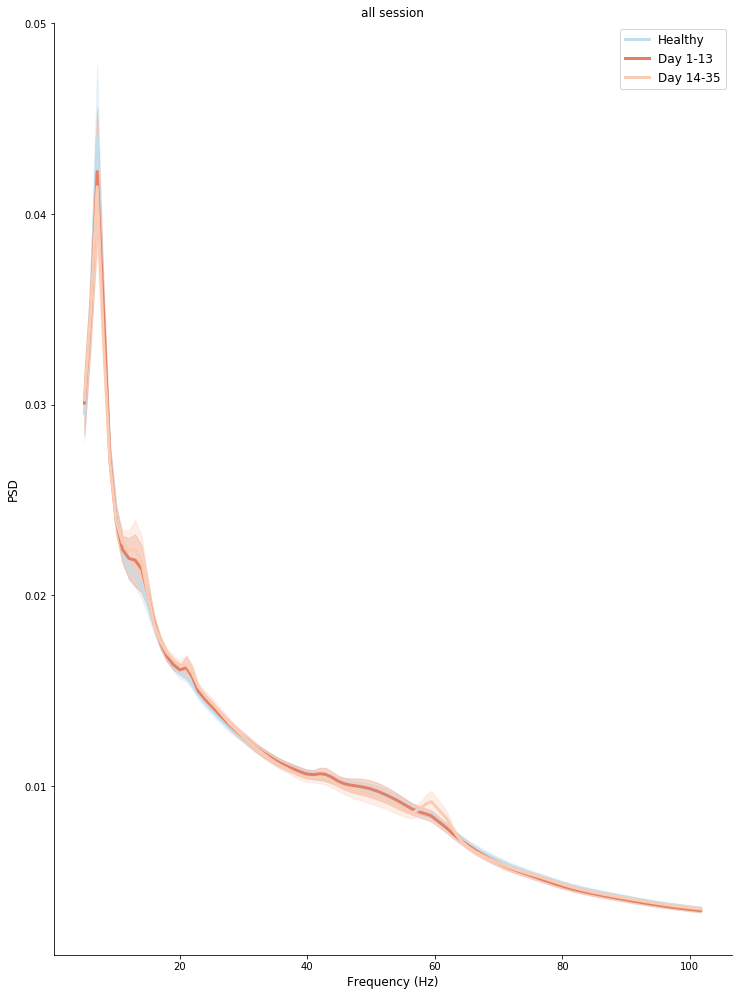

In [55]:
%matplotlib inline
colorsL = sns.cubehelix_palette(8)
colorsH = a3[[2,5,4]]#sns.cubehelix_palette(4, start=2, rot=5, dark=0, light=.65)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

fig, ax = plt.subplots(1,1,figsize=(12.15,17.15),sharey='row')
for ind, p in enumerate(periods.keys()):
    hC = np.nanmean(periods[p]['all'][a],axis=1)
    hS2 = np.nanstd(periods[p]['all'][a],axis=1)/np.sqrt(periods[p]['all'][a].shape[1])
       
    ax.plot(freq[a],hC,color = colorsH[ind], label=p,linewidth=3.0)
    ax.fill_between(freq[a], hC-hS2, hC+hS2,color=colorsH[ind],alpha=0.3)
#     ax.set_xlim(55,65)
    ax.set_title('all session')
#     ax.set_xlim(60,100)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax.set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax.set_xlabel('Frequency (Hz)',fontsize=12)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.legend(fontsize=12)
# fig.savefig(figFolder+'lfpSpectromPost_LDOPA_lowSpeed_freq.png',transparent=True,format='png')
# ax.set_xlim(10,30)
fig.savefig(figFolder+'lfpSpectromPeriod_all.svg',transparent=True,format='svg')



In [24]:
def difAplly(row,fr):
    if row.mvmt in ['hiSpeed','lowSpeed']:
        low = float(df2[(df2.sess == row.sess)&(df2.Period == row.Period)&(df2.mvmt == 'lowSpeed')][fr].item())
    else:
        low = float(df2[(df2.sess == row.sess)&(df2.Period == row.Period)&(df2.mvmt == 'lowRot')][fr].item())
    val = float(row[fr])
    if low==0:
        return None
    else: #base <0 and val >0:
        return (low-val)

In [25]:
colorsL = sns.cubehelix_palette(8)
colorsH = sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.95)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

beta = (freq>10)&(freq<16)
beta2 = (freq>15)&(freq<25)
gamma =(freq>40)&(freq<60)
highGamma = (freq>60)&(freq<100)
highGamma2 = (freq>80)&(freq<100)

# print(periods[p]['hiSpeed'].shape,np.nanmean(periods[p]['hiSpeed'][beta],axis=0).shape)
df2 = pd.DataFrame(columns = ['Period','Mouse','sess','mvmt','beta','gamma'])
# # fig, ax = plt.subplots(2,3,figsize=(12.15,17.15),sharey='row')
for row in range(len(df)):
    for mv in ['highAC', 'highC', 'lowRot', 'lowSpeed', 'hiSpeed','rot','all']:
        try:
            te = np.array(df.iloc[row][mv])
            df3 = pd.DataFrame({'Period':df.iloc[row]['period'],'Mouse':df.iloc[row]['mouse'],'mvmt':mv,'sess':df.iloc[row]['Sess'],
                                'beta':np.nanmean(te[0,beta],axis=0),
                                'beta2':np.nanmean(te[0,beta2],axis=0),
                               'gamma':np.nanmean(te[0,gamma],axis=0),
                               'highGamma':np.nanmean(te[0,highGamma],axis=0),
                                'highGamma2':np.nanmean(te[0,highGamma2],axis=0),
                               'betaSum':np.nansum(te[0,beta],axis=0),
                                'betaSum2':np.nansum(te[0,beta2],axis=0),
                               'highGammaSum':np.nansum(te[0,highGamma],axis=0),
                                'highGammaSum2':np.nansum(te[0,highGamma2],axis=0),
                               'gammaSum':np.nansum(te[0,gamma],axis=0)},index=[0])
            df2 = pd.concat([df3,df2])
        except: 
            print(df.iloc[row]['Sess'],mv)

df2['ratio'] = df2.apply(lambda x: x.betaSum/x.gammaSum, axis = 1)
df2['ratio_High'] = df2.apply(lambda x: x.betaSum/x.highGammaSum, axis = 1)
df2['diffBeta'] = df2.apply(lambda x: difAplly(x,'betaSum'), axis = 1)

df2.to_csv(figFolder+'lfpForR.csv')
df2 = df2.groupby(['Mouse','Period','mvmt']).mean()
df2 = df2.reset_index()
df2.to_csv(figFolder+'lfpForR_grouped.csv')

0761_day31A highC
0761_day35L highC
0761_day35L hiSpeed
1208_day2 highC
1208_day30A highC
1208_day34L highC
1236_day15A highAC
1236_day19L highAC
1236_day30A highAC
2980_day19L highC
2981_day2 highAC
4539_day1 highAC
4539_day1 highC
4539_day1 rot
4539_day10 highAC
4539_day10 highC
4539_day10 rot
4539_day11 highAC
4539_day11 highC
4539_day11 rot
4539_day12 highAC
4539_day12 highC
4539_day12 rot
4539_day13 highAC
4539_day13 highC
4539_day13 rot
4539_day14 highAC
4539_day14 highC
4539_day14 rot
4539_day2 highAC
4539_day2 highC
4539_day2 rot
4539_day3 highAC
4539_day3 highC
4539_day3 rot
4539_day4 highAC
4539_day4 highC
4539_day4 rot
4539_day5 highAC
4539_day5 highC
4539_day5 rot
4539_day6 highAC
4539_day6 highC
4539_day6 rot
4539_day7 highAC
4539_day7 highC
4539_day7 rot
4539_day8 highAC
4539_day8 highC
4539_day8 rot
4539_day9 highAC
4539_day9 highC
4539_day9 rot
7584_day1 highAC
7584_day1 highC
7584_day1 rot
7584_day10 highAC
7584_day10 highC
7584_day10 rot
7584_day11 highAC
7584_day11 h

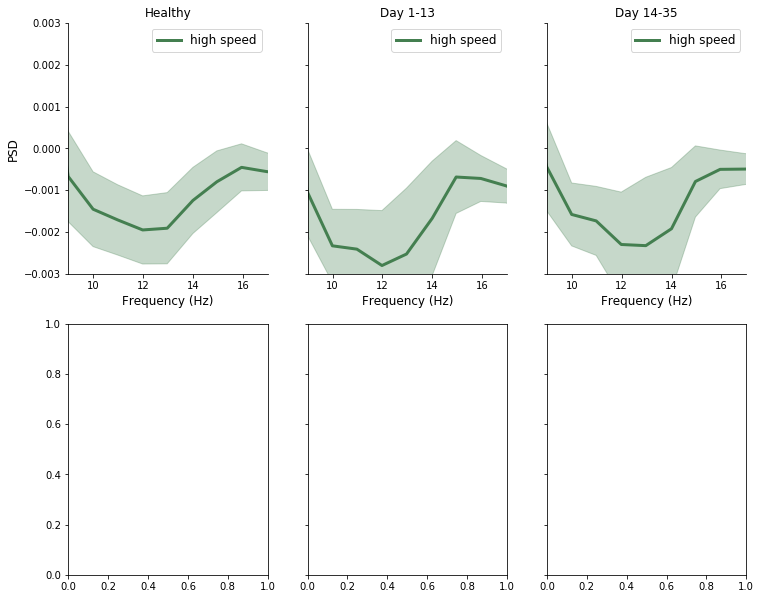

In [36]:
#periods = {'Healthy':{'axis':0},'Day 1-4':{'axis':1},'Day 5-12':{'axis':2},'Day 13-20':{'axis':3},'One Month':{'axis':4}}
%matplotlib inline
colorsL = sns.cubehelix_palette(8)
colorsH = sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.95)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

fig, ax = plt.subplots(2,3,figsize=(12.15,10.15),sharey='row')
for ind, p in enumerate(periods.keys()):
    hC = np.nanmean(periods[p]['hiSpeed'],axis=1) - np.nanmean(periods[p]['lowSpeed'],axis=1)
    hS2 = np.sqrt(np.nanstd(periods[p]['hiSpeed'],axis=1)**2+np.nanstd(periods[p]['lowSpeed'],axis=1)**2)/np.sqrt(2)
    hS2 = hS2/np.sqrt(periods[p]['hiSpeed'].shape[1])
       
    ax[0,ind].plot(freq,hC,color = colorsH[4], label='high speed',linewidth=3.0)
    ax[0,ind].fill_between(freq, hC-hS2, hC+hS2,color=colorsH[4],alpha=0.3)
#     ax[0,ind].plot(freq,lC,color = colorsL[4], label='low speed',linewidth=3.0)
#     ax[0,ind].fill_between(freq, lC-lS2, lC+lS2,color=colorsL[4],alpha=0.2)
    ax[0,ind].set_xlim(6,100)
#     ax[0,ind].set_yscale('log')
    ax[0,ind].set_title(p)
#    ax[0,ind].set_xlim(9,15)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax[0,0].set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax[0,ind].set_xlabel('Frequency (Hz)',fontsize=12)
    ax[0,ind].spines['right'].set_visible(False)
    ax[0,ind].spines['top'].set_visible(False)
    ax[0,ind].legend(fontsize=12)
    
#     hC = np.nanmean(periods[p]['highC'],axis=1)
#     hS2 = np.nanstd(periods[p]['highC'],axis=1)/np.sqrt(periods[p]['highC'].shape[1])
#     hAC = np.nanmean(periods[p]['highAC'],axis=1)
#     hS2A = np.nanstd(periods[p]['highAC'],axis=1)/np.sqrt(periods[p]['highAC'].shape[1])
#     lC = np.nanmean(periods[p]['lowRot'],axis=1)
#     lS2 = np.nanstd(periods[p]['lowRot'],axis=1)/np.sqrt(periods[p]['lowRot'].shape[1])
       
#     ax[1,ind].plot(freq,hC,color = colorsH[4], label='high Contralateral rot',linewidth=3.0)
#     ax[1,ind].fill_between(freq, hC-hS2, hC+hS2,color=colorsH[4],alpha=0.3)
#     ax[1,ind].plot(freq,hAC,color = colorsH2[4], label='high Ipsiliteral rot',linewidth=3.0)
#     ax[1,ind].fill_between(freq, hAC-hS2A, hAC+hS2A,color=colorsH2[4],alpha=0.3)
#     ax[1,ind].plot(freq,lC,color = colorsL[4], label='low rotation',linewidth=3.0)
#     ax[1,ind].fill_between(freq, lC-lS2, lC+lS2,color=colorsL[4],alpha=0.2)
#     ax[1,ind].set_xlim(6,100)
#     ax[1,ind].set_yscale('log')
#     ax[1,ind].set_title(p)
# #    ax[0,ind].set_xlim(9,15)
# #    ax[0,ind].set_ylim(0.015,0.03)
#     ax[1,0].set_ylabel('PSD',fontsize=12)
#     #ax[0,ind].axes.get_yaxis().set_ticks([])
#     ax[1,ind].set_xlabel('Frequency (Hz)',fontsize=12)
#     ax[1,ind].spines['right'].set_visible(False)
#     ax[1,ind].spines['top'].set_visible(False)
#     ax[1,ind].legend(fontsize=12)
# #fig.savefig(figFolder+'lfpSpectromPeriod.png',transparent=True,format='png')
# fig.savefig(figFolder+'figure5_lfpSpectromPeriod.svg',transparent=True,format='svg')

#fig2, ax2 = plt.subplots(1,2,sharex='col',sharey='row')
# for ind, p in enumerate(periods.keys()):
    ax[0,ind].set_xlim(9,17)
    ax[0,ind].set_ylim(-0.003,0.003)
#     ax[1,ind].set_xlim(9,17)
#     ax[1,ind].set_ylim(0.015,0.03)
# #     ax[0,ind].set_ylim(0,0.032)
# #     ax[1,ind].set_ylim(0,0.032)
# #fig.savefig(figFolder+'lfpSpectromPeriodZoomBeta.png',transparent=True,format='png')
# fig.savefig(figFolder+'figure5_ZoomBeta.svg',transparent=True,format='svg')
# for ind, p in enumerate(periods.keys()):
#     ax[0,ind].set_xlim(40,60)
#     ax[0,ind].set_ylim(0.008,0.012)
#     ax[1,ind].set_xlim(40,60)
#     ax[1,ind].set_ylim(0.008,0.012)
# #     ax[0,ind].set_ylim(0,0.02)
# #     ax[1,ind].set_ylim(0,0.02)
# fig.savefig(figFolder+'lfpSpectromPeriodZoomGamma.svg',transparent=True,format='svg')
# fig.savefig(figFolder+'figure5_lfpZoomGamma_log.svg',transparent=True,format='svg')
# for ind, p in enumerate(periods.keys()):
#     ax[0,ind].set_xlim(5,10)
#     ax[1,ind].set_xlim(5,10)
# #     ax[0,ind].set_ylim(0.03,0.05)
# #     ax[1,ind].set_ylim(0.03,0.05)
# fig.savefig(figFolder+'lfpSpectromPeriodZoomTheta.svg',transparent=True,format='svg')



In [34]:
hC

array([-5.63684048e-03, -7.29162017e-03,  1.80811030e-04,  1.64224330e-03,
       -4.39990242e-04, -1.57940939e-03, -1.73338651e-03, -2.29787899e-03,
       -2.32538315e-03, -1.92089655e-03, -7.90373008e-04, -5.00123892e-04,
       -4.93583928e-04, -4.55974624e-04, -5.92263316e-04, -4.05339510e-04,
       -2.60857966e-04, -1.77295990e-04, -1.37095488e-04,  7.23563732e-05,
        3.25155524e-04,  4.02320404e-04,  3.37419628e-04,  5.81558313e-04,
        8.17477237e-04,  8.41857826e-04,  6.54083588e-04,  5.67649756e-04,
        5.77689683e-04,  6.57108963e-04,  6.93037018e-04,  6.68877036e-04,
        5.82949946e-04,  5.58330126e-04,  5.77573927e-04,  5.98480054e-04,
        6.18190258e-04,  5.77248709e-04,  5.63789910e-04,  5.65130010e-04,
        5.80238190e-04,  5.86029303e-04,  6.11752704e-04,  6.48649375e-04,
        6.64399154e-04,  6.53874451e-04,  6.40110366e-04,  6.23897621e-04,
        5.54079634e-04,  4.69777480e-04,  4.31939101e-04,  3.43043571e-04,
        2.68155635e-04,  

/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 62.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 52.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 45.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


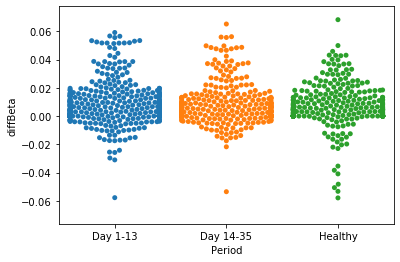

In [30]:
# df = pd.read_csv(figFolder+'lfpForR.csv')
sns.swarmplot(x='Period',y='diffBeta',data = df)


High-spped/ low-speed LFP align tpo MSN

In [12]:
# LOW Speed ONLY
warnings.filterwarnings("ignore")

# open all necassary files 
f = h5py.File('Spectograms.hdf5','r') #LFP coeffs
savePath = 'J:\\lfp2ca_notNormalize\\lowSpeed\\'

df = pd.DataFrame(columns=['mouse','sess','day','period','cre','numred'])

# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

# for each mouse: 
for m in miceList:
    data =  getData(Files[1],['lfp','trace'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred'])

        # get data
        Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
        
        # remove any events not in low periods
        Lp = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
        if len(Lp)<Ca.shape[1]:
            Lp = np.append(Lp,0)
        Ca[:,Lp!=1] = 0;
        dCa = np.append(Ca[:,1:]-Ca[:,:-1],np.zeros((Ca.shape[0],1)),axis=1)
        dCa[dCa==-1] = 0
        
        coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff= coeff.T
            #coeff = coeff.T/np.nansum(coeff,axis=1) # So that axis[0] is the time axis + normalize power in frequency per sesion
        except:
            print(sess)
            continue
        

        dtS = float(1/data[sess]['trace']['FS'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['trace']['dff'].shape)) * dtS 
        tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
        

        # for every Cre neuron:
        dca = dCa[0:numRed,:]
        dca = dca[np.sum(dca,axis=1)!=0,:]
        
        for creN in range(0,np.min(dca.shape)):
            onsetL = np.full_like(tl,False)
            cN = dca[creN,:]
            for si in ts[cN.astype(bool)]:
                ti = np.argmin(np.abs(tl-si))
                onsetL[ti] = True
            al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

            if al.ndim <3:
                try:
                    al = np.reshape(al,(al.shape[0],al.shape[1],1))
                except:
                    print('no onset, when there should be. CRE#',creN,' in sess= ',sess)
                    continue
            al = np.nanmean(al,axis=2,keepdims=True)
            al = np.nan_to_num(al,nan=-9999)
            
            if 'aligned' in locals():
                aligned = np.concatenate((aligned,al), axis = 2)
            else:
                aligned = al
        
        if np.min(dca.shape)>0:
            pickle.dump( aligned, open( savePath+"CRE\\"+sess, "wb" ), protocol=4 )
            del aligned
        
        # for every MSN neuron:
        dca = dCa[numRed:,:]
        dca = dca[np.sum(dca,axis=1)!=0,:]
        
        for msnN in range(0,np.min(dca.shape)):
            onsetL = np.full_like(tl,False)
            mN = dca[msnN,:]
            for si in ts[mN.astype(bool)]:
                ti = np.argmin(np.abs(tl-si))
                onsetL[ti] = True
            al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

            if al.ndim <3:
                try:
                    al = np.reshape(al,(al.shape[0],al.shape[1],1))
                except:
                    print('no onset, when there should be. MSN#',msnN,' in sess= ',sess)
                    continue
            
            al = np.nanmean(al,axis=2,keepdims=True)
            al = np.nan_to_num(al,nan=-9999)
            if 'aligned' in locals():
                aligned = np.concatenate((aligned,al), axis = 2)
            else:
                aligned = al
        
        if np.min(dca.shape)>0:
            pickle.dump( aligned, open( savePath+"MSN\\"+sess, "wb" ) , protocol=4)
            del aligned
        # add session to df, so can be retrived
        df= df.append({'mouse':m,'sess':sess,'day':day,
                       'period': periodCalc(day),'cre':cre,'numred':numRed,'numMsn':Ca.shape[0]},ignore_index=True)

df.to_csv(savePath+'sessions')


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
I deleted session: 1208_day12


 46%|█████████████████████████████████████▊                                            | 6/13 [14:48<14:15, 122.15s/it]

found  17.0  outlier points


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
found  1.0  outlier points


 64%|█████████████████████████████████████████████████████▎                             | 9/14 [04:39<02:27, 29.46s/it]

found  888231.0  outlier points


 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [06:36<03:42, 55.71s/it]

found  481139.0  outlier points


  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
I deleted session: 2976_day4
found  1.0  outlier points


 92%|███████████████████████████████████████████████████████████████████████████▋      | 12/13 [03:25<00:17, 17.01s/it]

found  3.0  outlier points


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


 43%|███████████████████████████████████▌                                               | 6/14 [04:21<05:16, 39.54s/it]

found  50.0  outlier points


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


 21%|█████████████████▍                                                                 | 4/19 [07:49<24:29, 97.99s/it]

found  29.0  outlier points


  0%|                                                                                           | 0/17 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [05:17<00:00, 22.69s/it]


In [14]:
# HIGH Speed ONLY
warnings.filterwarnings("ignore")

# open all necassary files 
f = h5py.File('Spectograms.hdf5','r') #LFP coeffs
savePath = 'J:\\lfp2ca_notNormalize\\highSpeed\\'

df = pd.DataFrame(columns=['mouse','sess','day','period','cre','numred'])

# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

# for each mouse: 
for m in miceList:
    data =  getData(Files[1],['lfp','trace'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred'])

        # get data
        Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
        
        # remove any events not in low periods
        Lp =  getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
        if len(Lp)<Ca.shape[1]:
            Lp = np.append(Lp,0)
        Ca[:,Lp!=1] = 0;
        dCa = np.append(Ca[:,1:]-Ca[:,:-1],np.zeros((Ca.shape[0],1)),axis=1)
        dCa[dCa==-1] = 0
        
        coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff= coeff.T
            #coeff = coeff.T/np.nansum(coeff,axis=1) # So that axis[0] is the time axis + normalize power in frequency per sesion
        except:
            print(sess)
            continue
        

        dtS = float(1/data[sess]['trace']['FS'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['trace']['dff'].shape)) * dtS 
        tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
        

        # for every Cre neuron:
        dca = dCa[0:numRed,:]
        dca = dca[np.sum(dca,axis=1)!=0,:]
        
        for creN in range(0,np.min(dca.shape)):
            onsetL = np.full_like(tl,False)
            cN = dca[creN,:]
            for si in ts[cN.astype(bool)]:
                ti = np.argmin(np.abs(tl-si))
                onsetL[ti] = True
            al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

            if al.ndim <3:
                try:
                    al = np.reshape(al,(al.shape[0],al.shape[1],1))
                except:
                    print('no onset, when there should be. CRE#',creN,' in sess= ',sess)
                    continue
            al = np.nanmean(al,axis=2,keepdims=True)
            al = np.nan_to_num(al,nan=-9999)
            
            if 'aligned' in locals():
                aligned = np.concatenate((aligned,al), axis = 2)
            else:
                aligned = al
        
        if np.min(dca.shape)>0:
            pickle.dump( aligned, open( savePath+"CRE\\"+sess, "wb" ), protocol=4 )
            del aligned
        
        # for every MSN neuron:
        dca = dCa[numRed:,:]
        dca = dca[np.sum(dca,axis=1)!=0,:]
        
        for msnN in range(0,np.min(dca.shape)):
            onsetL = np.full_like(tl,False)
            mN = dca[msnN,:]
            for si in ts[mN.astype(bool)]:
                ti = np.argmin(np.abs(tl-si))
                onsetL[ti] = True
            al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

            if al.ndim <3:
                try:
                    al = np.reshape(al,(al.shape[0],al.shape[1],1))
                except:
                    print('no onset, when there should be. MSN#',msnN,' in sess= ',sess)
                    continue
            
            al = np.nanmean(al,axis=2,keepdims=True)
            al = np.nan_to_num(al,nan=-9999)
            if 'aligned' in locals():
                aligned = np.concatenate((aligned,al), axis = 2)
            else:
                aligned = al
        
        if np.min(dca.shape)>0:
            pickle.dump( aligned, open( savePath+"MSN\\"+sess, "wb" ) , protocol=4)
            del aligned
        # add session to df, so can be retrived
        df= df.append({'mouse':m,'sess':sess,'day':day,
                       'period': periodCalc(day),'cre':cre,'numred':numRed,'numMsn':Ca.shape[0]},ignore_index=True)

df.to_csv(savePath+'sessions')
Lp =  getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|                                                                                           | 0/14 [00:06<?, ?it/s]


IndexError: boolean index did not match indexed array along dimension 0; dimension is 11900 but corresponding boolean dimension is 637

In [15]:
def getAlignedLFP3(savePath,cellType,cre = None, mice = None, period = None, day=None, drug=None,drugPeriod='Pre'):
    # function that take in the classification and return the appropreate data:
    #Inputs:
    #   cellType - return MSN or CRE if both pass ['MNS','CRE']
    #   mice - (Optional) list of mice from to include. Default: None - will load data for all mice
    #   period - (Optional) either 'Pre' or 'Post'. difault: None - return full length of data from picked sessions
    #   day - (Optional) lambda function with logic for picking days. Default: None - ignore day attr when picking data
    #           NOTE: day will be ignored if period is specified
    #   cre - (Optional) which cre mouse is it. options:None (default), "PV", "CHI"
    #                   must have trace included in dataType list to be taken into account
    #   WinPre - (Optional) length of pre window in secounds (default 2)
    #   WinPost - (Optional) length of post window in secounds (default 2)
    #Output:
    #   data - the requested data. format: {mice_session:{dataType:data}}
    
    
    dFile = 'FinalData_6OHDA_H.h5'
    # double check parameters inputs are valid:
#     if drugPeriod=='Post':
#         savePath = 'J:\\lfp2ca_notNormalize\\Post\\'#'/home/dana_z/HD1/lfpAligned2Ca/Post/'
#     else:
#         savePath = 'J:\\lfp2ca_notNormalize\\'#'/home/dana_z/HD1/lfpAligned2Ca/Pre/'

    df = pd.read_csv(savePath+'sessions')
    
    if period == None and day != None and isinstance(day,type(lambda c:None)):
        df['keep'] = df.apply(lambda row: day(row.day), axis=1)
        df = df[(df.keep==True)]
    
    if period in ['Healthy','Acute','Chronic']:
        df = df[(df.period==period)]
       
    if cre in ['PV','CHI','NA']:
        df = df[(df.cre==cre)]
    
    if drug in ['Amph','L-Dopa','Saline','None']:
        df = df[(df.drug==drug)]
    

    if not isinstance(cellType,list):
        cellType = [cellType]
        
    cellType = list(set(cellType).intersection(set(['MSN','CRE'])))
    if len(cellType) == 0:
        raise ValueError('Not a valid cellType value. cellType must be in ["MSN","CRE"]')
    
    # traverse the hdf5 file:
    if mice == None:
        mice = getMiceList(dFile) 
    elif not isinstance(mice,list):
        mice = [mice]
    
    if not isinstance(mice[0],str):
        for m in range(0,len(mice)):
            mice[m] = str(mice[m])
    df = df[(df.mouse.isin(mice))]
    # start extracting the data:   
    
    # alllocate memory:
#    nNeurons = 0;
#    if 'MSN' in cellType:
#        nNeurons = nNeurons + int(df.numMsn.sum()) - int(df.numred.sum())
#    if 'CRE' in cellType:
#        nNeurons = nNeurons + int(df.numred.sum())
    nSess = len(df.mouse.unique())
    dResult = np.empty([12206,87,nSess],dtype=float)
    
    ind = 0
    for m in df.mouse.unique():
        dfM = df[df.mouse == m]
        indM = 0
        nSessM = len(df.sess.unique())
        nNeurons = 0
        if 'MSN' in cellType:
            nNeurons = nNeurons + int(dfM.numMsn.sum()) - int(dfM.numred.sum())
        if 'CRE' in cellType:
            nNeurons = nNeurons + int(dfM.numred.sum())
        MResult = np.empty([12206,87,nNeurons],dtype=float)
        for sess in dfM.sess.unique():
            if 'MSN' in cellType:
                try: 
                    tempD = pickle.load(open(savePath+'MSN\\'+sess,'rb'))
                except:
                    continue
                tempD[tempD==9999] = np.nan
                tempD[tempD==-9999] = np.nan
                mu = np.mean(tempD[:int(tempD.shape[0]/2),:,:],axis=0)
                Std = np.std(tempD[:int(tempD.shape[0]/2),:,:],axis=0)
                tempD =(tempD-mu)/Std
#                 print(indM,indM+tempD.shape[2],tempD.shape[2],MResult[:,:,indM:(indM+tempD.shape[2])].shape)
                MResult[:,:,indM:(indM+tempD.shape[2])] = tempD 
                indM = indM+tempD.shape[2]
            # for every Cre neuron:
            if 'CRE' in cellType:
                try:
                    tempD = pickle.load(open(savePath+'CRE\\'+sess,'rb'))
                except:
                    continue
                tempD[tempD==9999] = np.nan
                tempD[tempD==-9999] = np.nan
                mu = np.mean(tempD[:int(tempD.shape[0]/2),:,:],axis=0)
                Std = np.std(tempD[:int(tempD.shape[0]/2),:,:],axis=0)
                tempD =(tempD-mu)/Std
#                 print(indM,indM+tempD.shape[2],tempD.shape[2],MResult[:,:,indM:(indM+tempD.shape[2])].shape)
                MResult[:,:,indM:(indM+tempD.shape[2])] = tempD 
                indM = indM+tempD.shape[2]
        MResult = MResult[:,:,:indM]
        dResult[:,:,ind] = np.nanmean(MResult,axis=2)  
        ind = ind+1
        
    return dResult[:,:,:ind],df

<IPython.core.display.Javascript object>


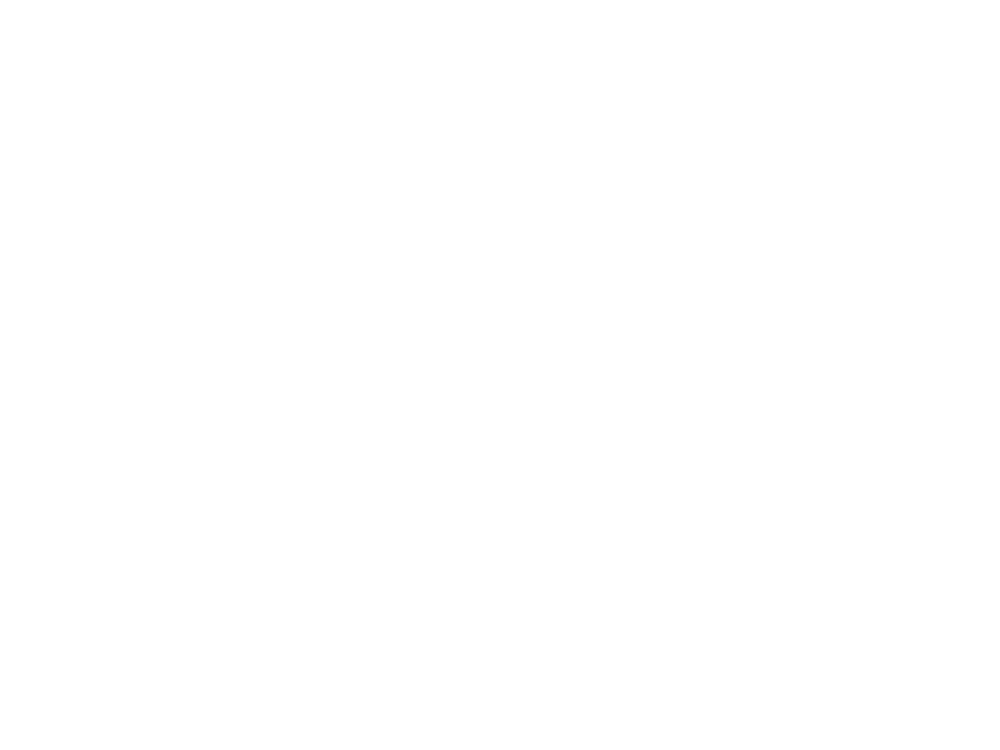

<IPython.core.display.Javascript object>


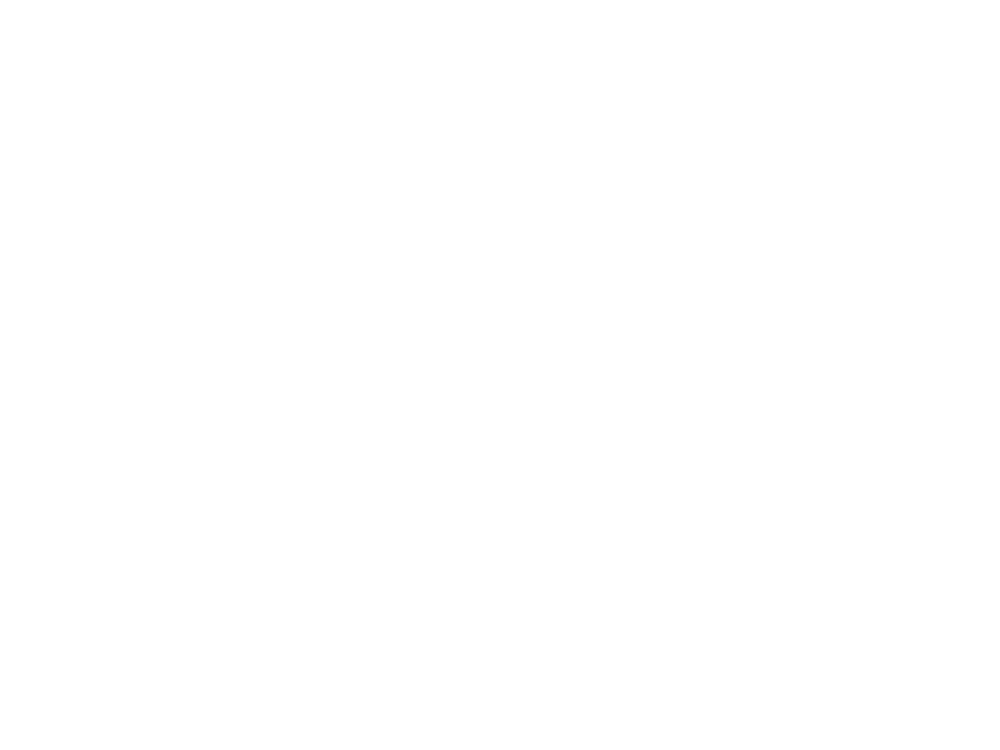

<IPython.core.display.Javascript object>


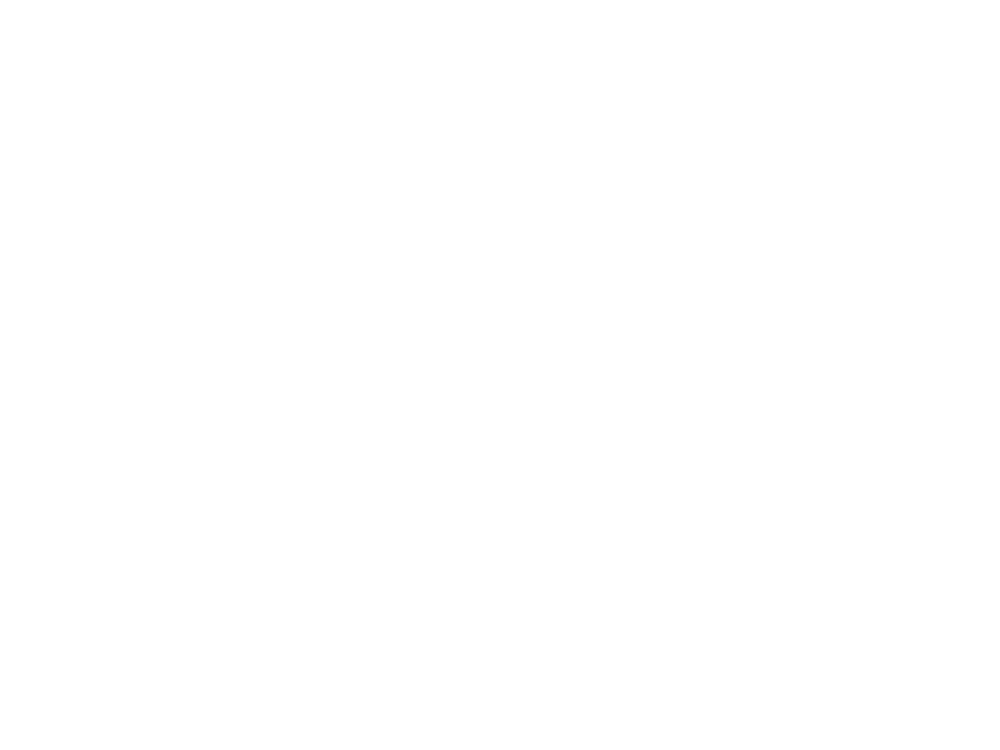

In [16]:
periods = {'Healthy': lambda day: day== 0,
           'Acute': lambda day: (day >0)&(day<13),
           'Chronic':lambda day: day >=13}

# df = pd.read_csv('J:\\lfp2ca_notNormalize\\lowSpeed\\sessions')
# sPath = 'J:\\lfp2ca_notNormalize\\lowSpeed\\'
# cells = ['MSN']
# f = h5py.File('Spectograms.hdf5','r')
# freq = f['0761']['0761_BaselineA']['Pre']['freq'].value
# dtL = 0.00032768
# tPlot = np.linspace(-2,2,int(4/dtL-1))
# for per in periods.keys():
#     cellType = 'MSN'
#     cre = None
#     A,df2 = getAlignedLFP3(sPath,cellType,cre = cre, day =periods[per])
#     b = np.nanmean(A,axis=2)
#     del A
#     fig, ax = plt.subplots()
#     CS=ax.pcolormesh(tPlot,freq,b.T, rasterized=True,vmax =1.35,vmin=-0.5)
#     fig.colorbar(CS)
#     ax.set_title(per,fontsize=20)
# #     fig.savefig(figFolder+'figure5_CHI'+per+'normalizedByNeuron.png',format='png')
#     fig.savefig(figFolder+'figure5b_MSN_lowSpeed'+per+'.png',format='png',transparent=True)
#     fig.clf()
#     plt.close(fig)

df = pd.read_csv('J:\\lfp2ca_notNormalize\\highSpeed\\sessions')
sPath = 'J:\\lfp2ca_notNormalize\\highSpeed\\'
cells = ['MSN']
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['0761_BaselineA']['Pre']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in periods.keys():
    cellType = 'MSN'
    cre = None
    A,df2 = getAlignedLFP3(sPath,cellType,cre = cre, day =periods[per])
    b = np.nanmean(A,axis=2)
    del A
    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T, rasterized=True,vmax =1.35,vmin=-0.5)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
#     fig.savefig(figFolder+'figure5_CHI'+per+'normalizedByNeuron.png',format='png')
    fig.savefig(figFolder+'figure5b_MSN_highSpeed'+per+'.png',format='png',transparent=True)
    fig.clf()
    plt.close(fig)



In [31]:
periods = {'Healthy': lambda day: day== 0,
           'Acute': lambda day: (day >0)&(day<13),
           'Chronic':lambda day: day >=13}

Pdf = pd.DataFrame(columns = ['Mouse','Period','Sess','CellType'])
df = pd.read_csv('J:\\lfp2ca_notNormalize\\highSpeed\\sessions')
savePath = 'J:\\lfp2ca_notNormalize\\highSpeed\\'
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['0761_BaselineA']['Pre']['freq'].value
fr = {'high_Gamma':freq >= 60, 'low_Gamma':(freq >= 40) & (freq<60), 'high_Beta_15to20':(freq >= 15) & (freq<20),
         'Beta_10to15':(freq >= 10) & (freq<15),'theta':(freq >= 6) & (freq<8)}
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
t200 = (tPlot >0) & (tPlot<0.2)
for sess in df.sess.unique():
    m = sess[:4]
    period = periodCalc(df[df.sess==sess].day.values)
    cellType = 'highSpeed'
    try: 
        tDict = {'Mouse':m,'Period':period,'Sess':sess,'CellType':cellType}#     if per == 'One Month': 
#         # remove from figure only because too many outliers (Nan) makes the figure granular
#         # data was still used for analysis
#         l = getMiceList(Files[1])
#         l.remove('1236')
#         A,df2 =getAlignedLFP_mvmt(savePath, mice = l, period = per)
#     else:
        A = pickle.load(open(savePath+'MSN\\'+sess,'rb'))
        A[A==9999] = np.nan
        A[A==-9999] = np.nan
        
        if A.shape[2] > 1000:
            b = A[:,:,0:1000]
            mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
            Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
            b =(b-mu)/Std
            b = np.nansum(b,axis=2)
            for ind in range(0,A.shape[2]//1000):
                c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
                mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
                Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
                c =(c-mu)/Std
                c = np.nansum(c,axis=2)
                b = b+c
            b= b/A.shape[2]
        else:
            b = A
            mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
            Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
            b =(b-mu)/Std
            b = np.nanmean(b,axis=2)
        
        for k in fr.keys():
            highGamma = fr[k]
            tDict[k] = np.nanmean(b[t200,:][:,highGamma])
        Pdf = Pdf.append(tDict,ignore_index=True)
    except Exception as e:
        exc_type, exc_obj, exc_tb = sys.exc_info()
        print(sess, " - MSN failed at line ",  exc_tb.tb_lineno)

df = pd.read_csv('J:\\lfp2ca_notNormalize\\lowSpeed\\sessions')
savePath = 'J:\\lfp2ca_notNormalize\\lowSpeed\\'
for sess in df.sess.unique():
    m = sess[:4]
    period = periodCalc(df[df.sess==sess].day.values)
    cellType = 'lowSpeed'
    try: 
        tDict = {'Mouse':m,'Period':period,'Sess':sess,'CellType':cellType}#     if per == 'One Month': 
#         # remove from figure only because too many outliers (Nan) makes the figure granular
#         # data was still used for analysis
#         l = getMiceList(Files[1])
#         l.remove('1236')
#         A,df2 =getAlignedLFP_mvmt(savePath, mice = l, period = per)
#     else:
        A = pickle.load(open(savePath+'MSN\\'+sess,'rb'))
        A[A==9999] = np.nan
        A[A==-9999] = np.nan
        
        if A.shape[2] > 1000:
            b = A[:,:,0:1000]
            mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
            Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
            b =(b-mu)/Std
            b = np.nansum(b,axis=2)
            for ind in range(0,A.shape[2]//1000):
                c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
                mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
                Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
                c =(c-mu)/Std
                c = np.nansum(c,axis=2)
                b = b+c
            b= b/A.shape[2]
        else:
            b = A
            mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
            Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
            b =(b-mu)/Std
            b = np.nanmean(b,axis=2)
        
        for k in fr.keys():
            highGamma = fr[k]
            tDict[k] = np.nanmean(b[t200,:][:,highGamma])
        Pdf = Pdf.append(tDict,ignore_index=True)
    except Exception as e:
        exc_type, exc_obj, exc_tb = sys.exc_info()
        print(sess, " - MSN failed at line ",  exc_tb.tb_lineno)


        
Pdf.to_csv(figFolder+'statsForPowerMvmt.csv')

<ipython-input-31-667e445b8b91>:9: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  freq = f['0761']['0761_BaselineA']['Pre']['freq'].value


0761_day1  - MSN failed at line  27
0761_day35L  - MSN failed at line  27
1222_day2  - MSN failed at line  27
4539_day13  - MSN failed at line  27


<ipython-input-31-667e445b8b91>:50: RuntimeWarning: Mean of empty slice
  b = np.nanmean(b,axis=2)
<ipython-input-31-667e445b8b91>:54: RuntimeWarning: Mean of empty slice
  tDict[k] = np.nanmean(b[t200,:][:,highGamma])


7909_day11  - MSN failed at line  27
7909_day12  - MSN failed at line  27
7909_day13  - MSN failed at line  27
7909_day14  - MSN failed at line  27
7909_day5  - MSN failed at line  27
7909_day8  - MSN failed at line  27
7909_day9  - MSN failed at line  27
0761_day1  - MSN failed at line  74
1222_day5  - MSN failed at line  74
7909_day30A  - MSN failed at line  74


In [32]:
Pdf = pd.read_csv(figFolder+'statsForPowerMvmt.csv')
Pdf.head()
df2 = Pdf
df2 = df2.groupby(['Mouse','Period','CellType']).mean()
df2 = df2.reset_index()
df3 = df2
columns = ['high_Gamma','high_Beta_15to20','Beta_10to15','low_Gamma']

def nor(row,col):
    base = float(df2[(df2.Mouse == row.Mouse)&(df2.CellType == row.CellType)&(df2.Period == 'Healthy')][col].item())
    val = float(row[col])
    if base==0:
        return None
    else: #base <0 and val >0:
        return (val-base)/np.abs(base)
#     else:
#         return (val-base)/base

for ind in range(len(columns)):
#     df2[columns[ind]+'_normalized'] = df2.apply(lambda row: (row[columns[ind]]-df2[(df2.Mouse == row.Mouse)&(df2.CellType == row.CellType)&(df2.Period == 'Healthy')][columns[ind]].item())/df2[(df2.Mouse == row.Mouse)&(df2.CellType == row.CellType)&(df2.Period == 'Healthy')][columns[ind]].item() if df2[(df2.Mouse == row.Mouse)&(df2.CellType == row.CellType)&(df2.Period == 'Healthy')][columns[ind]].item() != 0 else None,axis=1)
    df3[columns[ind]] = df3.apply(lambda row: nor(row,columns[ind]) ,axis=1)


<IPython.core.display.Javascript object>


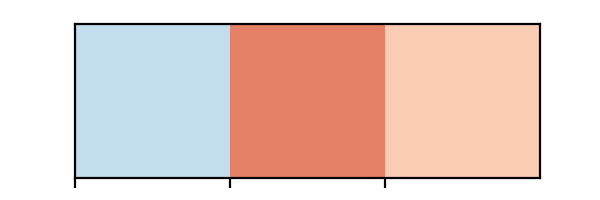

In [21]:
a3 = np.array(sns.color_palette("RdBu_r", n_colors=7))
# colorPallet3 =(a3[[2,6,5],:])
colorPallet3 =(a3[[2,5,4],:])
sns.palplot(sns.color_palette(colorPallet3))

In [27]:
dfP

,Period,CellType,Mouse,variable,value
0,Acute,highSpeed,761,high_Gamma,0.059601
1,Acute,lowSpeed,761,high_Gamma,-0.025270
2,Chronic,highSpeed,761,high_Gamma,-1.520014
3,Chronic,lowSpeed,761,high_Gamma,-0.022106
4,Healthy,highSpeed,761,high_Gamma,0.000000
...,...,...,...,...,...
83,Acute,lowSpeed,8815,high_Gamma,-0.155136
84,Chronic,highSpeed,8815,high_Gamma,-0.736574
85,Chronic,lowSpeed,8815,high_Gamma,-0.223237
86,Healthy,highSpeed,8815,high_Gamma,0.000000


<IPython.core.display.Javascript object>


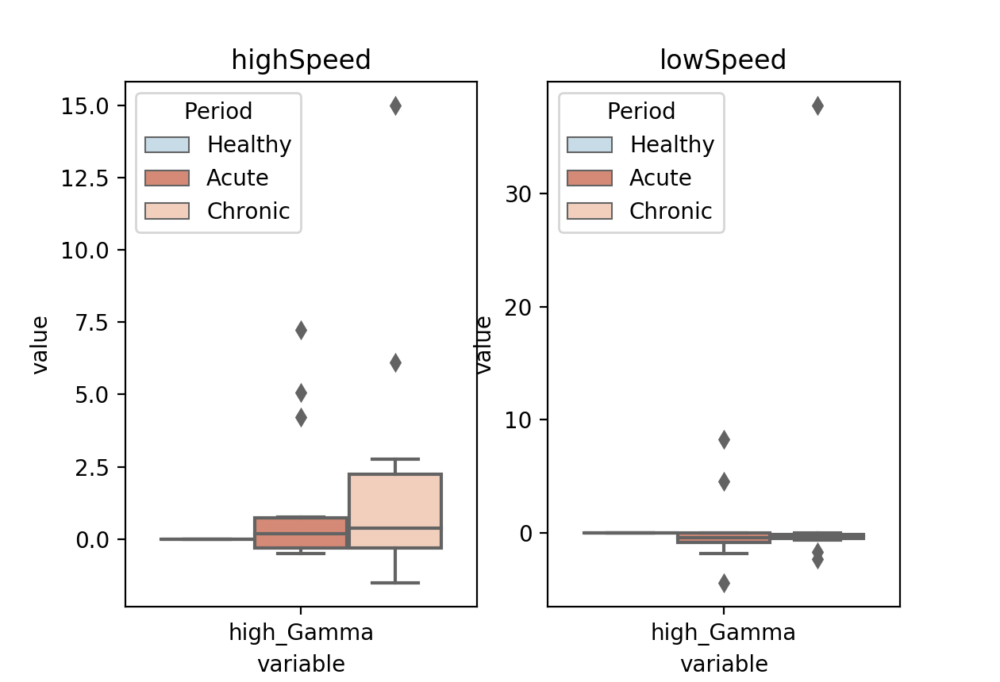

In [34]:
dfP = pd.melt(df3, id_vars = ['Period','CellType','Mouse'],value_vars = ['high_Gamma'])
fig, ax = plt.subplots(1,2,figsize=(6.3,4.3))#, sharey=True )
# dfP.CellType
# for indP, p in enumerate(['high_Gamma','high_Beta_15to20','low_Gamma']):
with sns.color_palette(colorPallet3):
    for indC,c in enumerate(["highSpeed","lowSpeed"]):
        sns.boxplot(x = 'variable',y ='value',hue = 'Period',ax = ax[indC],data= dfP[dfP.CellType ==c],
                    hue_order=['Healthy','Acute','Chronic'])#, showfliers = False)
#         sns.swarmplot(x = 'Period',y ='value',hue = 'Period',ax = ax[indC],data= dfP[dfP.CellType ==c],
#                     hue_order=['Healthy','Day 14-35'],order=['Healthy','Day 14-35'],color = 'black')
    #         sns.boxplot(x = 'Period',y =p,ax = ax[indC,indP],data= Pdf[Pdf.CellType ==c], showfliers = False)
    #         sns.pointplot(x = 'variable',y = 'value',hue = 'Period',ax = ax[indC],data= dfP[dfP.CellType ==c], showfliers = False)
        ax[indC].set_title(c)
# fig.savefig(figFolder+'figure6_statsBars_L-dopa_.svg',transparent=True)

In [52]:
PV0 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='PV',
              red = True,day = lambda x: x==0,mice=['8430','7584'])
PV2 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='PV',
              red = True,day = lambda x: x>=20,mice=['8430','7584'] )

# CHI0 = getData(Files[1],['speed','rot','trace'],period ='Pre',
#                cre='CHI',red = True,day = lambda x: x==0,mice=['1222','1793'])
# CHI2 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='CHI',
#                red = True,day = lambda x: x>=13,mice=['1222','1793'] )


cleaning up trace data
I deleted session: 8430_BaselineA
I deleted session: 7584_day0
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
cleaning up trace data
cleaning up speed data
cleaning up rot data


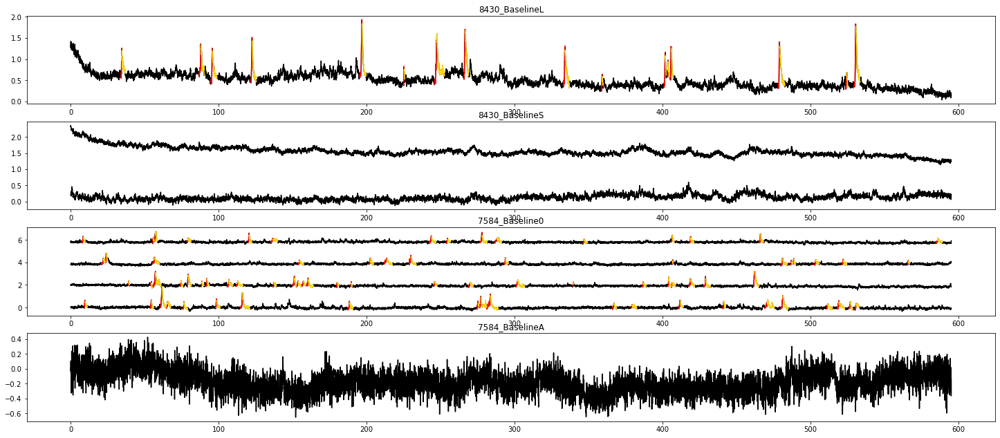

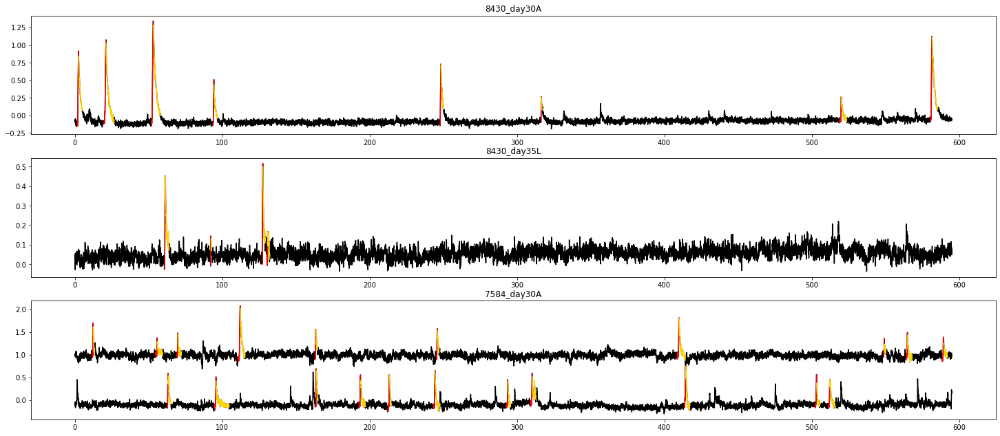

In [53]:
warnings.filterwarnings('ignore')
%matplotlib inline
f = h5py.File('OnsetsAndPeriods.hdf5','r')
# align spectogram to spike onset -> for each mouse and in total,seperate by CRE:

tracePerSlide = 8
lf = {'left':0.30, 'top':1.30, 'height':10.80, 'width':25.10}
fArgs = {'left':Inches(lf['left']),'top':Inches(lf['top']), 'height':Inches(lf['height']), 'width':Inches(lf['width'])}
for p in [0,2]:
    data = eval('PV'+str(p))
    fig, ax = plt.subplots(len(data.keys()),1,figsize=(lf['width'],lf['height']+len(data.keys())*4))
    fig.set_size_inches(lf['width'],lf['height'],forward=True)

    indX = 0
    for sess in data.keys():
        # get traces:
        m = sess[:4]
        dff = data[sess]['trace']['dff']
        dt = 1/data[sess]['trace']['FS'][0]
        t = np.linspace(0,dt*dff.shape[1],dff.shape[1])
        Fs = data[sess]['trace']['FS'][0]
        # Vectors are saved as column vectors so.. transposed to raw vector
        if dff.shape[1] == 1:
            dff = dff.T
        # get CaOnset:
        caOnset = f[m][sess]['Pre']['caOnset_Hf'][:]
        caFall =  f[m][sess]['Pre']['caFall_Hf'][:]
        caOnset[caOnset==0] =np.nan
        caFall[caFall==0] =np.nan
        numred = int(data[sess]['trace']['numred'])
        N = 0
        endN = np.min(((N+1)*tracePerSlide,dff.shape[0]))
        T=0;
        endT = np.min(((T+1)*tLim,dff.shape[1]))
        df = dff[N*tracePerSlide:endN,T*tLim:endT]
        ca = caOnset[N*tracePerSlide:endN,T*tLim:endT]
        ca = ca*df
        cf = caFall[N*tracePerSlide:endN,T*tLim:endT]
        cf = cf*df
        spacing = np.max(np.abs(df))
        Color = ['navy' for x in range(0,df.shape[0])]
        if tracePerSlide*N <numred:
            Nl = min(tracePerSlide,numred-N*tracePerSlide)
            Color[0:Nl] = ['black' for x in range(0,Nl)]
        else:
            Color = ['blue' for x in range(0,len(Color))]
        for d in range(0,df.shape[0]):
            ax[indX].plot(t[T*tLim:endT],df[d,:]+d*spacing,color=Color[d],rasterized=True) 
            ax[indX].plot(t[T*tLim:endT],ca[d,:]+d*spacing,color='red',rasterized=True)
            ax[indX].plot(t[T*tLim:endT],cf[d,:]+d*spacing,color='gold',rasterized=True)
        ax[indX].set_title(sess)
        indX = indX+1
    #fig.savefig(figFolder+'figure3_eventDetection'+'.png')
    #fig.savefig(figFolder+'figure3_eventDetection_rasterized'+'.svg',transparent=True)


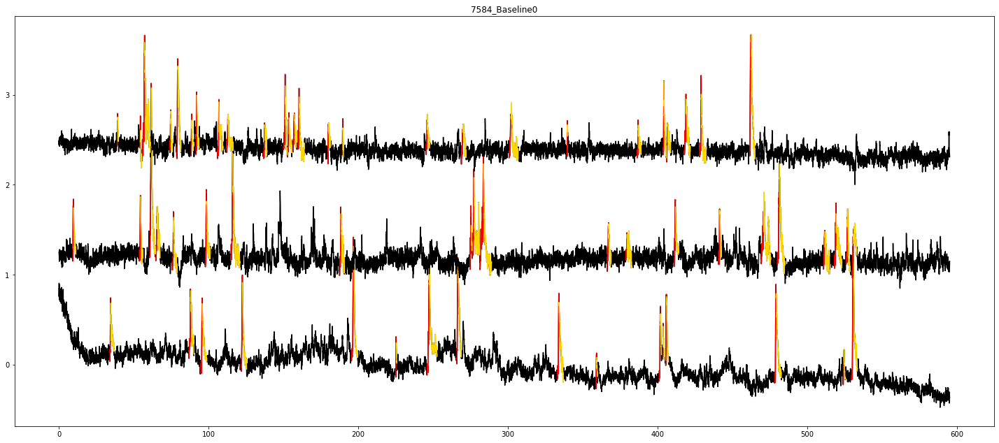

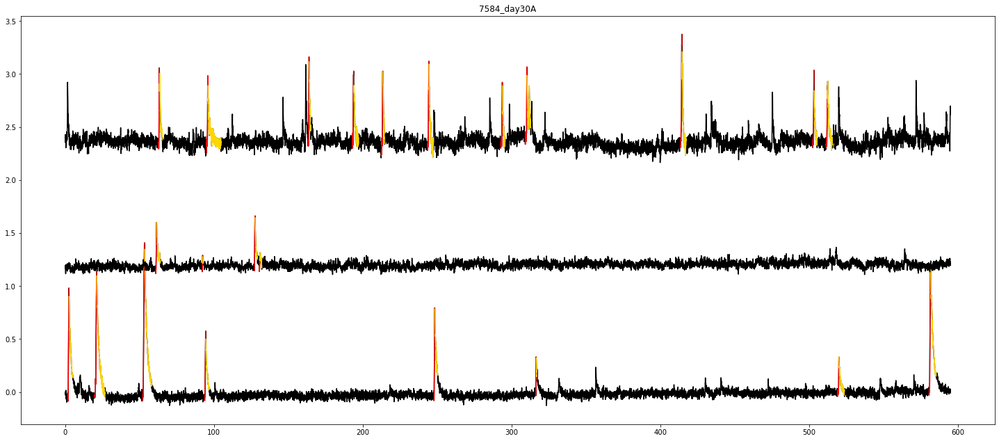

In [59]:
warnings.filterwarnings('ignore')
%matplotlib inline
f = h5py.File('OnsetsAndPeriods.hdf5','r')
# align spectogram to spike onset -> for each mouse and in total,seperate by CRE:

tracePerSlide = 8
lf = {'left':0.30, 'top':1.30, 'height':10.80, 'width':25.10}
fArgs = {'left':Inches(lf['left']),'top':Inches(lf['top']), 'height':Inches(lf['height']), 'width':Inches(lf['width'])}
for p in [0,2]:
    data = eval('PV'+str(p))
    fig, ax = plt.subplots(1,1,figsize=(lf['width'],lf['height']+len(data.keys())*4))
    fig.set_size_inches(lf['width'],lf['height'],forward=True)

    indX = 0
    for sess in data.keys():
        # get traces:
        m = sess[:4]
        dff = data[sess]['trace']['dff']
        dt = 1/data[sess]['trace']['FS'][0]
        t = np.linspace(0,dt*dff.shape[1],dff.shape[1])
        Fs = data[sess]['trace']['FS'][0]
        # Vectors are saved as column vectors so.. transposed to raw vector
        if dff.shape[1] == 1:
            dff = dff.T
        # get CaOnset:
        caOnset = f[m][sess]['Pre']['caOnset_Hf'][:]
        caFall =  f[m][sess]['Pre']['caFall_Hf'][:]
        caOnset[caOnset==0] =np.nan
        caFall[caFall==0] =np.nan
        numred = int(data[sess]['trace']['numred'])
        if sess in ["7584_BaselineA","8430_BaselineS"]:
            continue
        if np.max(dff)<0.1:
            dff = (dff-np.min(dff))/(np.max(dff)-np.min(dff))
        dff = dff-np.mean(dff)
        tLim = int(600*Fs)
        tLim = int(600*Fs)
        N = 0
        endN = np.min(((N+1)*tracePerSlide,dff.shape[0]))
        T=0;
        endT = np.min(((T+1)*tLim,dff.shape[1]))
        df = dff[N*tracePerSlide:endN,T*tLim:endT]
        ca = caOnset[N*tracePerSlide:endN,T*tLim:endT]
        ca = ca*df
        cf = caFall[N*tracePerSlide:endN,T*tLim:endT]
        cf = cf*df
        spacing = 1.2#np.max(np.abs(df))
        Color = ['navy' for x in range(0,df.shape[0])]
        if tracePerSlide*N <numred:
            Nl = min(tracePerSlide,numred-N*tracePerSlide)
            Color[0:Nl] = ['black' for x in range(0,Nl)]
        else:
            Color = ['blue' for x in range(0,len(Color))]
        for d in range(indX,np.min([df.shape[0]+indX,3])):
            ax.plot(t[T*tLim:endT],df[d-indX,:]+d*spacing,color=Color[d-indX],rasterized=True) 
            ax.plot(t[T*tLim:endT],ca[d-indX,:]+d*spacing,color='red',rasterized=True)
            ax.plot(t[T*tLim:endT],cf[d-indX,:]+d*spacing,color='gold',rasterized=True)
        ax.set_title(sess)
        indX = indX+numred
    if p==0:
        fig.savefig(figFolder+'figureS8_PV'+str(p)+'.png')
        fig.savefig(figFolder+'figureS8_PV'+str(p)+'.svg',transparent=True)


In [29]:
indX

1